In [1]:
from IPython.core.display import HTML
HTML("\n".join(open("c360_style.css", 'r').readlines()))

# Cross X - Deep Learning

<div style="text-align: right"> 21/06/20201 </div>
<div style="text-align: right"> Asier Dorronsoro </div>
<div style="text-align: right"> https://www.linkedin.com/in/asierdorronsoro/ </div>

Este notebook tiene como objetivo hacer uso de las técnicas de Deep Learning de forma que podamos observar si conseguimos mejorar el F1 que hemos obtenido a través de ML Supervisado. 

## Carga de datos

In [ ]:
from google.colab import drive
import pandas as pd
import numpy as np
drive.mount('/content/gdrive')

Drive already mounted at /content/gdrive; to attempt to forcibly remount, call drive.mount("/content/gdrive", force_remount=True).


In [ ]:
from sklearn import metrics
from sklearn.utils import resample
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import RandomForestClassifier, AdaBoostClassifier, GradientBoostingClassifier
from imblearn.ensemble import BalancedRandomForestClassifier
from xgboost.sklearn import XGBClassifier
from sklearn.svm import SVC
import xgboost as xgb
from sklearn import tree
from sklearn.model_selection import GridSearchCV, cross_val_score, RandomizedSearchCV, cross_validate, cross_val_predict, train_test_split,learning_curve 
from sklearn.metrics import f1_score, make_scorer, confusion_matrix, accuracy_score, precision_score
from sklearn.preprocessing import StandardScaler, MinMaxScaler, RobustScaler, Normalizer
from lightgbm import LGBMModel,LGBMClassifier
import pickle
from imblearn.under_sampling import RandomUnderSampler
from imblearn.over_sampling import RandomOverSampler

/usr/local/lib/python3.7/dist-packages/sklearn/externals/six.py:31: FutureWarning: The module is deprecated in version 0.21 and will be removed in version 0.23 since we've dropped support for Python 2.7. Please rely on the official version of six (https://pypi.org/project/six/).
  "(https://pypi.org/project/six/).", FutureWarning)
/usr/local/lib/python3.7/dist-packages/sklearn/utils/deprecation.py:144: FutureWarning: The sklearn.neighbors.base module is  deprecated in version 0.22 and will be removed in version 0.24. The corresponding classes / functions should instead be imported from sklearn.neighbors. Anything that cannot be imported from sklearn.neighbors is now part of the private API.
  warnings.warn(message, FutureWarning)
/usr/local/lib/python3.7/dist-packages/sklearn/utils/deprecation.py:144: FutureWarning: The sklearn.ensemble.bagging module is  deprecated in version 0.22 and will be removed in version 0.24. The corresponding classes / functions should instead be imported fro

In [ ]:
import tensorflow as tf
from tensorflow import keras
from keras.layers import Dense, Dropout, Activation, Flatten, Conv1D, Conv2D, MaxPooling1D, MaxPooling2D, Lambda, MaxPool2D, BatchNormalization
import keras 
from keras.utils import np_utils
from tensorflow.keras import layers
import kerastuner as kt
from kerastuner.tuners import RandomSearch
from keras.layers import BatchNormalization
import os
import tempfile
import matplotlib as mpl
import matplotlib.pyplot as plt
mpl.rcParams['figure.figsize'] = (12, 10)
colors = plt.rcParams['axes.prop_cycle'].by_key()['color']

In [ ]:
#Solo una linea de codigo.
df = pd.read_csv('/content/gdrive/My Drive/DeepLearning/Session1/Challenge/modelling_df.csv')

In [ ]:
df.head()

,target,f_3,f_5,f_6,f_11,f_12,f_13,f_25,f_28,f_30,f_35,f_37,f_38,f_43,f_44,f_46,f_49,f_51,f_52,f_53,f_54,f_55,f_56,f_57,f_58,f_59,f_60,f_61,f_62,f_65,f_66,f_67,f_68,f_73,f_74,f_81,f_82,f_83,f_85,f_86,...,f_833,f_835,f_837,f_838,f_839,f_840,f_841,f_842,f_843,f_845,f_846,f_848,f_849,f_850,f_851,f_852,f_853,f_854,f_855,f_856,f_857,f_858,f_859,f_860,f_861,f_862,f_863,f_865,f_866,f_867,f_868,f_869,f_870,f_871,f_872,f_873,f_874,f_875,f_876,f_877
0,0,33.0,33.0,0.0,33.0,0.0,33.0,33.0,0.0,0.0,33.0,33.0,0.0,33.0,0.0,0.0,33.0,33.0,0.0,33.0,0.0,33.0,0.0,33.0,0.0,33.0,0.0,33.0,0.0,33.0,0.0,33.0,0.0,33.0,0.0,33.0,0.0,33.0,33.0,0.0,...,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,1,33.0,33.0,0.0,33.0,0.0,33.0,33.0,0.0,0.0,33.0,33.0,0.0,33.0,0.0,0.0,33.0,33.0,0.0,33.0,0.0,33.0,0.0,33.0,0.0,33.0,0.0,33.0,0.0,33.0,0.0,33.0,0.0,33.0,0.0,33.0,0.0,33.0,33.0,0.0,...,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0
2,0,33.0,33.0,0.0,33.0,0.0,33.0,33.0,0.0,0.0,33.0,33.0,0.0,33.0,0.0,0.0,33.0,33.0,0.0,33.0,0.0,33.0,0.0,33.0,0.0,33.0,0.0,33.0,0.0,33.0,0.0,33.0,0.0,33.0,0.0,33.0,0.0,33.0,33.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0
3,0,33.0,33.0,0.0,33.0,0.0,33.0,33.0,0.0,0.0,33.0,33.0,0.0,33.0,0.0,0.0,33.0,33.0,0.0,33.0,0.0,33.0,0.0,33.0,0.0,33.0,0.0,33.0,0.0,33.0,0.0,33.0,0.0,33.0,0.0,33.0,0.0,33.0,33.0,0.0,...,0.0,1.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,0,33.0,33.0,0.0,33.0,0.0,33.0,33.0,0.0,0.0,33.0,33.0,0.0,33.0,0.0,0.0,33.0,33.0,0.0,33.0,0.0,33.0,0.0,33.0,0.0,33.0,0.0,33.0,0.0,33.0,0.0,33.0,0.0,33.0,0.0,33.0,0.0,33.0,33.0,0.0,...,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0


In [ ]:
neg, pos = np.bincount(df['target'])
total = neg + pos
print('Examples:\n    Total: {}\n    Positive: {} ({:.2f}% of total)\n'.format(
    total, pos, 100 * pos / total))

Examples:
    Total: 96881
    Positive: 16555 (17.09% of total)



### Creacion de diferentes datasets

In [ ]:
def normalize(df, typo):
    if typo == 'Standard':
        transformer = Normalizer()
    elif typo == 'MinMax':
        transformer = MinMaxScaler()
    elif typo == 'Robust':
        transformer = RobustScaler()
    else:
        transformer = Normalizer()

    print('Dataset transformed based on the technique: '+ typo)
    scaled = transformer.fit_transform(df)  
    scaled = pd.DataFrame(scaled)
    scaled.columns = df.columns
    return scaled

In [ ]:
X = df.loc[:, df.columns != 'target']
X = X.loc[:, X.columns != 'target']
y= df[['target']]
X_copy = X.copy()

In [ ]:
neg, pos = np.bincount(y['target'])
neg

80326

In [ ]:
X = normalize(X, 'MinMax')

Dataset transformed based on the technique: MinMax


In [ ]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.20, random_state = 1)
X_train, X_val, y_train, y_val = train_test_split(X_train, y_train, test_size = 0.20, random_state = 1)
rus = RandomUnderSampler(random_state=0)
X_undersampled, y_undersampled = rus.fit_resample(X_train, y_train)
rus = RandomOverSampler(random_state=0)
X_oversampled, y_oversampled = rus.fit_resample(X_train, y_train)
eval_set = [(X_val, np.ravel(y_val))]

/usr/local/lib/python3.7/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
  warnings.warn(msg, category=FutureWarning)
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/usr/local/lib/python3.7/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
  warnings.warn(msg, category=FutureWarning)


In [ ]:
train_features = np.array(X_train)
val_features = np.array(X_val)
test_features = np.array(X_test)

train_labels = np.array(y_train)
val_labels = np.array(y_val)
test_labels = np.array(y_test)

In [ ]:
train_features_under = np.array(X_undersampled)
train_labels_under = np.array(y_undersampled)

In [ ]:
train_features_over = np.array(X_oversampled)
train_labels_over = np.array(y_oversampled)

### Funciones para visualizar

In [ ]:
def plot_metrics(history):
  metrics = ['loss', 'prc', 'precision', 'recall']
  for n, metric in enumerate(metrics):
    name = metric.replace("_"," ").capitalize()
    plt.subplot(2,2,n+1)
    plt.plot(history.epoch, history.history[metric], color=colors[0], label='Train')
    plt.plot(history.epoch, history.history['val_'+metric],
             color=colors[0], linestyle="--", label='Val')
    plt.xlabel('Epoch')
    plt.ylabel(name)
    if metric == 'loss':
      plt.ylim([0, plt.ylim()[1]])
    elif metric == 'auc':
      plt.ylim([0.8,1])
    else:
      plt.ylim([0,1])

    plt.legend()
    plt.show()

def plot_roc(actual, predicted):
    fpr, tpr, threshold = metrics.roc_curve(actual, predicted)
    roc_auc = metrics.auc(fpr, tpr)

    plt.title('Receiver Operating Characteristic')
    plt.plot(fpr, tpr, 'b', label = 'AUC = %0.2f' % roc_auc)
    plt.legend(loc = 'lower right')
    plt.plot([0, 1], [0, 1],'r--')
    plt.xlim([0, 1])
    plt.ylim([0, 1])
    plt.ylabel('True Positive Rate')
    plt.xlabel('False Positive Rate')
    plt.show()
    
def plot_precision_recall(actual, predicted):
    precision, recall, thresholds = metrics.precision_recall_curve(actual, predicted)
    plt.title('Precision Recall Curve')
    plt.plot(recall, precision, label="AUC = %0.2f" % round(metrics.auc(recall, precision),2))
    baseline = len(actual[actual==1]) / len(actual)
    plt.plot([0, 1], [baseline, baseline], linestyle='--', label='Baseline')
    plt.legend(loc = 'lower left')
    plt.xlim([0,1])
    plt.ylim([0,1])
    plt.ylabel('Precision')
    plt.xlabel('Recal')
    plt.show()
    

def evaluate_model(actual, predicted, threshold):
    eval_list = []
    try:
        _ = iter(threshold)
    except TypeError:
        threshold = [threshold]

    for t in threshold:
        predicted_class= (predicted > t).astype('float')
        tn, fp, fn, tp = metrics.confusion_matrix(y_true=actual, y_pred=predicted_class).ravel()
        f1 = metrics.f1_score(y_true=actual, y_pred=predicted_class)
        accuracy = metrics.accuracy_score(y_true=actual, y_pred=predicted_class)
        precision = metrics.precision_score(y_true=actual, y_pred=predicted_class, zero_division=0)
        recall = metrics.recall_score(y_true=actual, y_pred=predicted_class)
        auc = metrics.roc_auc_score(y_true=actual, y_score=predicted)

        tmp_dict = {'threshold': t}
        for variable in ['tn', 'fp', 'fn', 'tp', 'f1', 'accuracy', 'precision', 'recall', 'auc']:
            tmp_dict[variable] = eval(variable)
        eval_list.append(tmp_dict)
    
    plot_roc(actual, predicted)
    plot_precision_recall(actual, predicted)
    return pd.DataFrame(eval_list)

### Variables globales

In [ ]:
from numpy.random import seed
seed(1)
tf.random.set_seed(1)

METRICS = [
      keras.metrics.TruePositives(name='tp'),
      keras.metrics.FalsePositives(name='fp'),
      keras.metrics.TrueNegatives(name='tn'),
      keras.metrics.FalseNegatives(name='fn'), 
      keras.metrics.BinaryAccuracy(name='accuracy'),
      keras.metrics.Precision(name='precision'),
      keras.metrics.Recall(name='recall'),
      keras.metrics.AUC(name='auc'),
      keras.metrics.AUC(name='prc', curve='PR'), # precision-recall curve
]

early_stopping = tf.keras.callbacks.EarlyStopping(
    monitor='val_prc', 
    verbose=1,
    patience=10,
    mode='max',
    restore_best_weights=True)

BATCH_SIZE = 1024
EPOCHS = 100

eval_set = [(X_val, np.ravel(y_val))]

### Modelling

#### COMPROBAR REAPLICABILIDAD

Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense (Dense)                (None, 16)                8320      
_________________________________________________________________
activation (Activation)      (None, 16)                0         
_________________________________________________________________
dense_1 (Dense)              (None, 1)                 17        
Total params: 8,337
Trainable params: 8,337
Non-trainable params: 0
_________________________________________________________________


None

Epoch 1/100
61/61 [==============================] - 19s 28ms/step - loss: 0.4834 - tp: 8.9677 - fp: 54.7097 - tn: 26661.9355 - fn: 5499.0000 - accuracy: 0.8252 - precision: 0.1409 - recall: 0.0037 - auc: 0.5292 - prc: 0.1821 - val_loss: 0.4364 - val_tp: 0.0000e+00 - val_fp: 0.0000e+00 - val_tn: 12911.0000 - val_fn: 2590.0000 - val_accuracy: 0.8329 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_auc: 0.6547 - val_prc: 0.2504
Epoch 2/100
61/61 [==============================] - 0s 8ms/step - loss: 0.4348 - tp: 0.0000e+00 - fp: 0.0000e+00 - tn: 26723.7097 - fn: 5500.9032 - accuracy: 0.8287 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.6696 - prc: 0.2711 - val_loss: 0.4200 - val_tp: 0.0000e+00 - val_fp: 0.0000e+00 - val_tn: 12911.0000 - val_fn: 2590.0000 - val_accuracy: 0.8329 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_auc: 0.6908 - val_prc: 0.2963
Epoch 3/100
61/61 [==============================] - 1s 9ms/step - loss: 0.4198 - tp: 0.0000e+00 - fp: 0.00

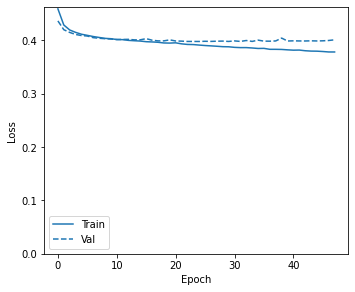

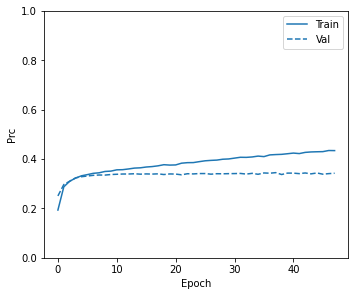

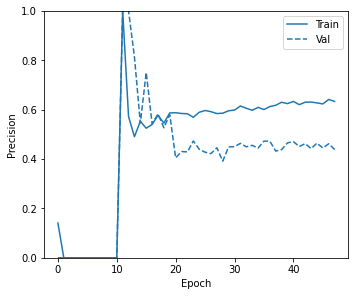

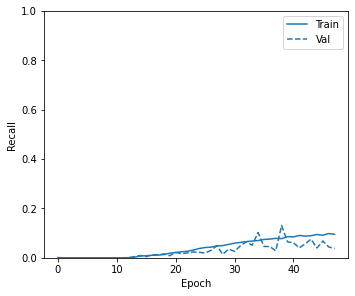

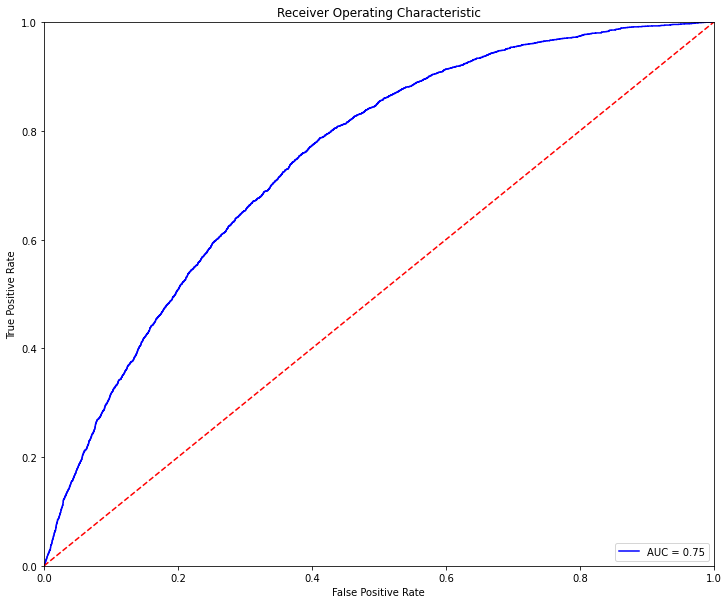

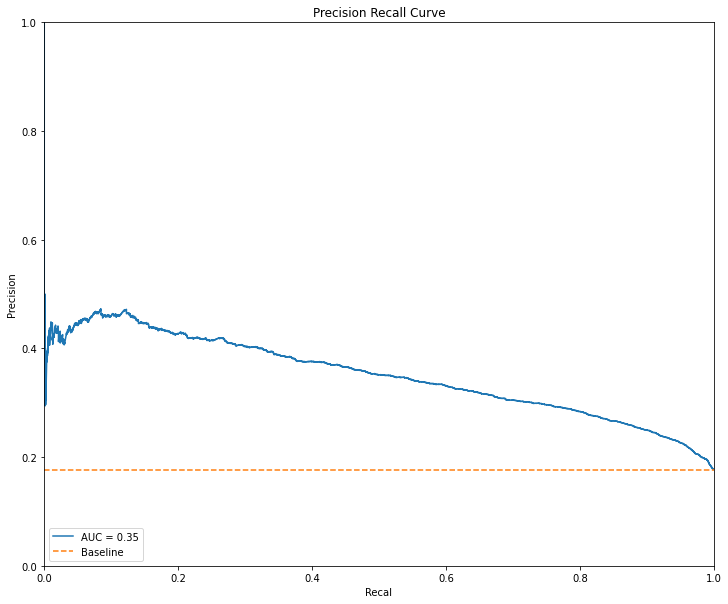

,threshold,tn,fp,fn,tp,f1,accuracy,precision,recall,auc
0,0.0,0,15979,0,3398,0.298397,0.175363,0.175363,1.000000,0.746713
1,0.1,8080,7899,523,2875,0.405730,0.565361,0.266846,0.846086,0.746713
2,0.2,12097,3882,1440,1958,0.423901,0.725344,0.335274,0.576221,0.746713
3,0.3,14238,1741,2265,1133,0.361288,0.793260,0.394224,0.333431,0.746713
4,0.4,15409,570,2928,470,0.211807,0.819477,0.451923,0.138317,0.746713
5,0.5,15868,111,3316,82,0.045670,0.823141,0.424870,0.024132,0.746713
6,0.6,15957,22,3385,13,0.007574,0.824173,0.371429,0.003826,0.746713
7,0.7,15973,6,3394,4,0.002347,0.824534,0.400000,0.001177,0.746713
8,0.8,15976,3,3396,2,0.001175,0.824586,0.400000,0.000589,0.746713
9,0.9,15979,0,3397,1,0.000588,0.824689,1.000000,0.000294,0.746713


In [ ]:
model = keras.Sequential()
model.add(Dense(units=16, input_shape=(train_features.shape[-1],)))
model.add(Activation('relu'))
model.add(Dense(1, activation='sigmoid'))

display(model.summary())

model.compile(
      optimizer=keras.optimizers.Adam(learning_rate=1e-3),
      loss=keras.losses.BinaryCrossentropy(),
    metrics=METRICS)

history = model.fit(
  train_features,
  train_labels,
  batch_size=BATCH_SIZE,
  epochs=EPOCHS,
  callbacks=[early_stopping],
  validation_data=(val_features, val_labels), 
  verbose=1)
plot_metrics(history)
predictions = model.predict(test_features, batch_size=BATCH_SIZE)
eval_train = evaluate_model(actual=test_labels, predicted=predictions, threshold=np.linspace(0,1,11))
display(eval_train)

Model: "sequential_1"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_2 (Dense)              (None, 16)                8320      
_________________________________________________________________
activation_1 (Activation)    (None, 16)                0         
_________________________________________________________________
dense_3 (Dense)              (None, 1)                 17        
Total params: 8,337
Trainable params: 8,337
Non-trainable params: 0
_________________________________________________________________


None

Epoch 1/100
61/61 [==============================] - 3s 25ms/step - loss: 0.4987 - tp: 221.6129 - fp: 675.0323 - tn: 38952.6129 - fn: 7876.3548 - accuracy: 0.8190 - precision: 0.2472 - recall: 0.0329 - auc: 0.6252 - prc: 0.2301 - val_loss: 0.4309 - val_tp: 0.0000e+00 - val_fp: 0.0000e+00 - val_tn: 12911.0000 - val_fn: 2590.0000 - val_accuracy: 0.8329 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_auc: 0.6643 - val_prc: 0.2628
Epoch 2/100
61/61 [==============================] - 0s 8ms/step - loss: 0.4308 - tp: 0.0000e+00 - fp: 0.0000e+00 - tn: 26723.7097 - fn: 5500.9032 - accuracy: 0.8287 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.6816 - prc: 0.2823 - val_loss: 0.4183 - val_tp: 0.0000e+00 - val_fp: 0.0000e+00 - val_tn: 12911.0000 - val_fn: 2590.0000 - val_accuracy: 0.8329 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_auc: 0.6949 - val_prc: 0.2995
Epoch 3/100
61/61 [==============================] - 0s 8ms/step - loss: 0.4175 - tp: 0.0000e+00 - fp: 0.

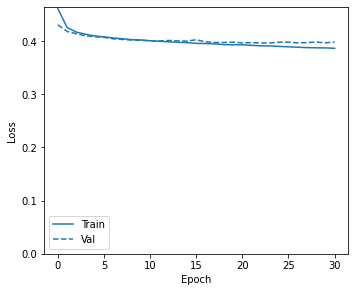

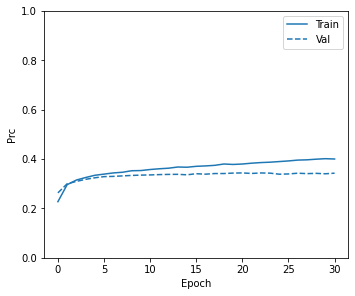

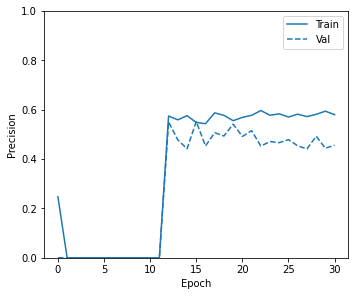

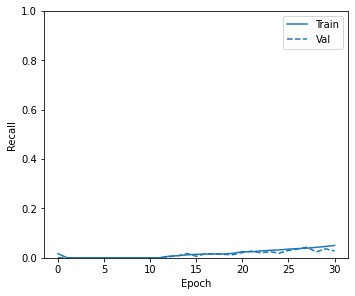

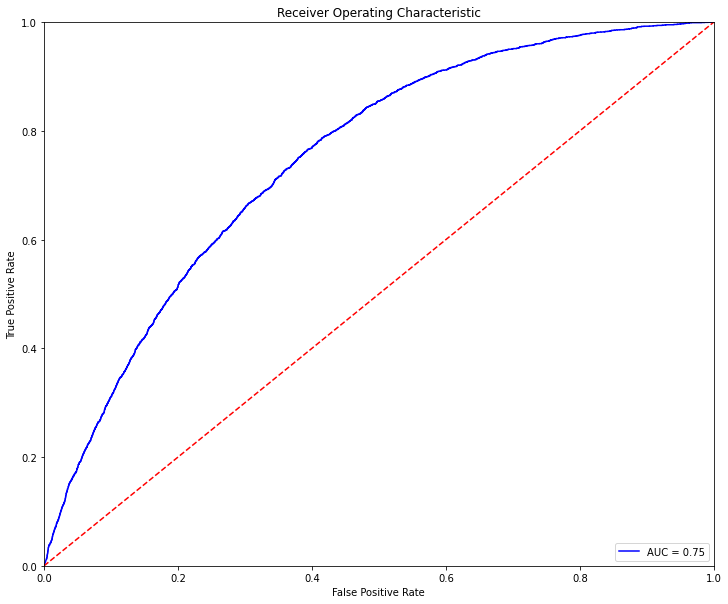

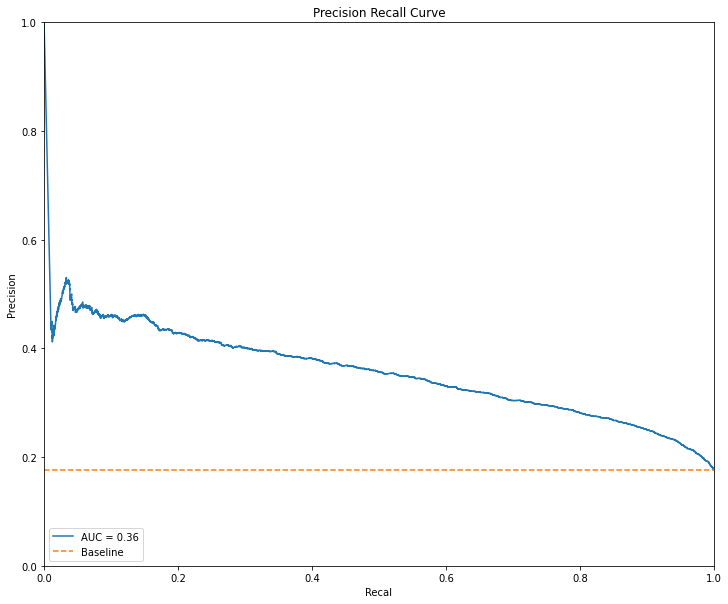

,threshold,tn,fp,fn,tp,f1,accuracy,precision,recall,auc
0,0.0,0,15979,0,3398,0.298397,0.175363,0.175363,1.000000,0.747561
1,0.1,6973,9006,355,3043,0.393992,0.516901,0.252552,0.895527,0.747561
2,0.2,11439,4540,1241,2157,0.427340,0.701657,0.322085,0.634785,0.747561
3,0.3,13917,2062,2110,1288,0.381743,0.784693,0.384478,0.379046,0.747561
4,0.4,15327,652,2863,535,0.233370,0.818599,0.450716,0.157446,0.747561
5,0.5,15912,67,3348,50,0.028450,0.823760,0.427350,0.014715,0.747561
6,0.6,15979,0,3398,0,0.000000,0.824637,0.000000,0.000000,0.747561
7,0.7,15979,0,3398,0,0.000000,0.824637,0.000000,0.000000,0.747561
8,0.8,15979,0,3398,0,0.000000,0.824637,0.000000,0.000000,0.747561
9,0.9,15979,0,3398,0,0.000000,0.824637,0.000000,0.000000,0.747561


In [ ]:
model = keras.Sequential()
model.add(Dense(units=16, input_shape=(train_features.shape[-1],)))
model.add(Activation('relu'))
model.add(Dense(1, activation='sigmoid'))

display(model.summary())

model.compile(
      optimizer=keras.optimizers.Adam(learning_rate=1e-3),
      loss=keras.losses.BinaryCrossentropy(),
    metrics=METRICS)

history = model.fit(
  train_features,
  train_labels,
  batch_size=BATCH_SIZE,
  epochs=EPOCHS,
  callbacks=[early_stopping],
  validation_data=(val_features, val_labels), 
  verbose=1)
plot_metrics(history)
predictions = model.predict(test_features, batch_size=BATCH_SIZE)
eval_train = evaluate_model(actual=test_labels, predicted=predictions, threshold=np.linspace(0,1,11))
display(eval_train)

In [ ]:
def create_model():
  model = keras.Sequential()
  model.add(Dense(units=16, input_shape=(train_features.shape[-1],)))
  model.add(Activation('relu'))
  model.add(Dense(1, activation='sigmoid'))

  display(model.summary())

  model.compile(
        optimizer=keras.optimizers.Adam(learning_rate=1e-3),
        loss=keras.losses.BinaryCrossentropy(),
      metrics=METRICS)
  
  return model

Model: "sequential_2"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_4 (Dense)              (None, 16)                8320      
_________________________________________________________________
activation_2 (Activation)    (None, 16)                0         
_________________________________________________________________
dense_5 (Dense)              (None, 1)                 17        
Total params: 8,337
Trainable params: 8,337
Non-trainable params: 0
_________________________________________________________________


None

Epoch 1/100
61/61 [==============================] - 4s 25ms/step - loss: 0.4681 - tp: 74.0000 - fp: 103.9032 - tn: 39523.7419 - fn: 8023.9677 - accuracy: 0.8296 - precision: 0.4160 - recall: 0.0110 - auc: 0.6394 - prc: 0.2569 - val_loss: 0.4270 - val_tp: 0.0000e+00 - val_fp: 7.0000 - val_tn: 12904.0000 - val_fn: 2590.0000 - val_accuracy: 0.8325 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_auc: 0.6771 - val_prc: 0.2770
Epoch 2/100
61/61 [==============================] - 0s 8ms/step - loss: 0.4276 - tp: 8.6935 - fp: 9.3387 - tn: 26714.3710 - fn: 5492.2097 - accuracy: 0.8287 - precision: 0.3484 - recall: 0.0011 - auc: 0.6868 - prc: 0.2880 - val_loss: 0.4190 - val_tp: 37.0000 - val_fp: 63.0000 - val_tn: 12848.0000 - val_fn: 2553.0000 - val_accuracy: 0.8312 - val_precision: 0.3700 - val_recall: 0.0143 - val_auc: 0.6984 - val_prc: 0.3034
Epoch 3/100
61/61 [==============================] - 0s 8ms/step - loss: 0.4160 - tp: 46.2258 - fp: 48.1290 - tn: 26689.1613 - fn: 5441.0968

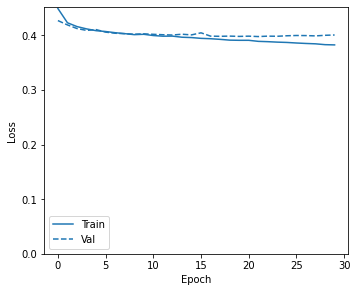

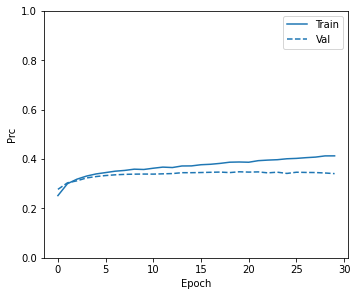

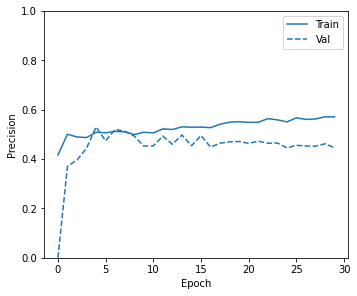

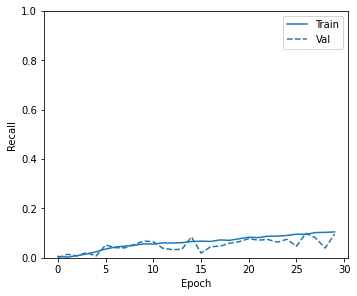

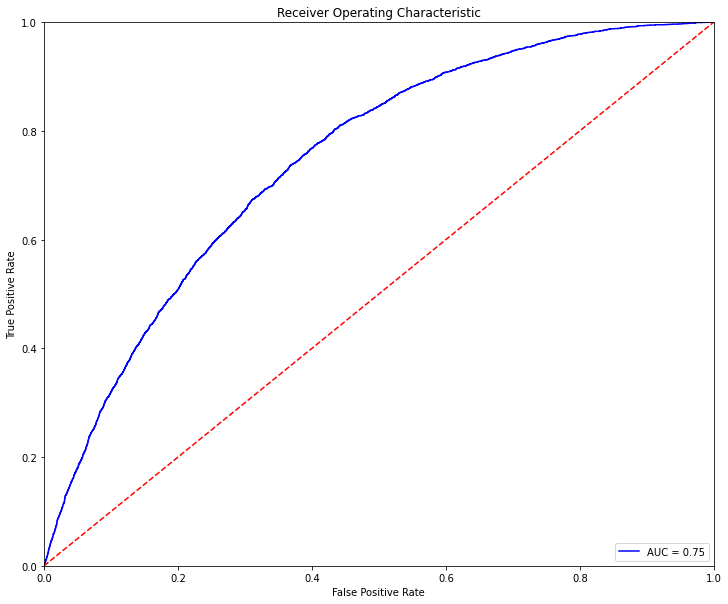

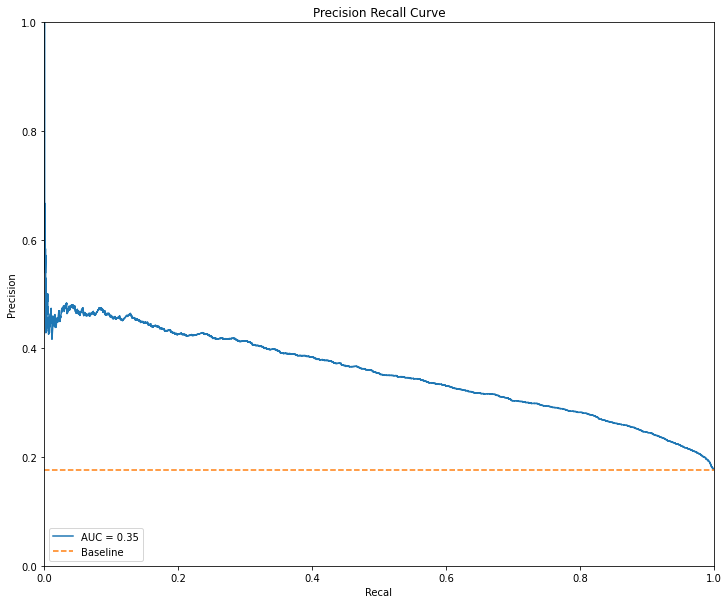

,threshold,tn,fp,fn,tp,f1,accuracy,precision,recall,auc
0,0.0,0,15979,0,3398,0.298397,0.175363,0.175363,1.000000,0.746258
1,0.1,6911,9068,374,3024,0.390445,0.512721,0.250083,0.889935,0.746258
2,0.2,11463,4516,1251,2147,0.426797,0.702379,0.322227,0.631842,0.746258
3,0.3,13866,2113,2069,1329,0.388596,0.784177,0.386113,0.391112,0.746258
4,0.4,15152,827,2766,632,0.260243,0.814574,0.433173,0.185992,0.746258
5,0.5,15743,236,3193,205,0.106799,0.823038,0.464853,0.060330,0.746258
6,0.6,15934,45,3361,37,0.021264,0.824225,0.451220,0.010889,0.746258
7,0.7,15974,5,3392,6,0.003520,0.824689,0.545455,0.001766,0.746258
8,0.8,15979,0,3398,0,0.000000,0.824637,0.000000,0.000000,0.746258
9,0.9,15979,0,3398,0,0.000000,0.824637,0.000000,0.000000,0.746258


In [ ]:
model = create_model()
initial_weights = os.path.join(tempfile.mkdtemp(), 'initial_weights')
model.save_weights(initial_weights)

history = model.fit(
  train_features,
  train_labels,
  batch_size=BATCH_SIZE,
  epochs=EPOCHS,
  callbacks=[early_stopping],
  validation_data=(val_features, val_labels), 
  verbose=1)
plot_metrics(history)
predictions = model.predict(test_features, batch_size=BATCH_SIZE)
eval_train = evaluate_model(actual=test_labels, predicted=predictions, threshold=np.linspace(0,1,11))
display(eval_train)

Model: "sequential_3"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_6 (Dense)              (None, 16)                8320      
_________________________________________________________________
activation_3 (Activation)    (None, 16)                0         
_________________________________________________________________
dense_7 (Dense)              (None, 1)                 17        
Total params: 8,337
Trainable params: 8,337
Non-trainable params: 0
_________________________________________________________________


None

Epoch 1/100
61/61 [==============================] - 3s 25ms/step - loss: 0.4681 - tp: 250.0000 - fp: 326.9032 - tn: 39300.7419 - fn: 7847.9677 - accuracy: 0.8285 - precision: 0.4333 - recall: 0.0372 - auc: 0.6381 - prc: 0.2622 - val_loss: 0.4270 - val_tp: 0.0000e+00 - val_fp: 7.0000 - val_tn: 12904.0000 - val_fn: 2590.0000 - val_accuracy: 0.8325 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_auc: 0.6771 - val_prc: 0.2770
Epoch 2/100
61/61 [==============================] - 0s 7ms/step - loss: 0.4276 - tp: 8.6935 - fp: 9.3387 - tn: 26714.3710 - fn: 5492.2097 - accuracy: 0.8287 - precision: 0.3484 - recall: 0.0011 - auc: 0.6868 - prc: 0.2880 - val_loss: 0.4190 - val_tp: 37.0000 - val_fp: 63.0000 - val_tn: 12848.0000 - val_fn: 2553.0000 - val_accuracy: 0.8312 - val_precision: 0.3700 - val_recall: 0.0143 - val_auc: 0.6984 - val_prc: 0.3034
Epoch 3/100
61/61 [==============================] - 1s 9ms/step - loss: 0.4160 - tp: 46.2258 - fp: 48.1290 - tn: 26689.1613 - fn: 5441.096

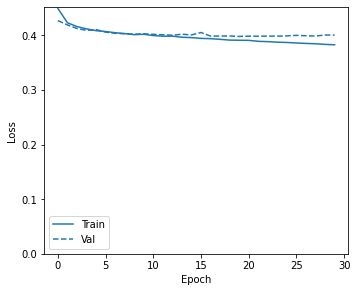

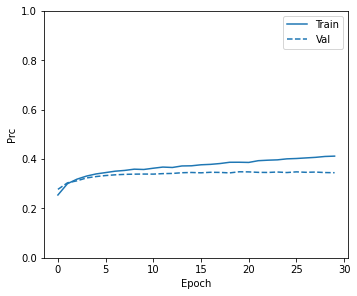

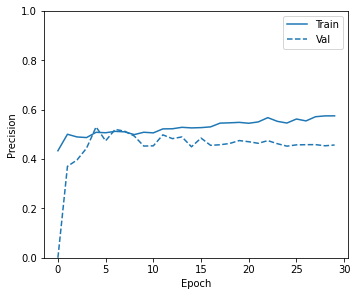

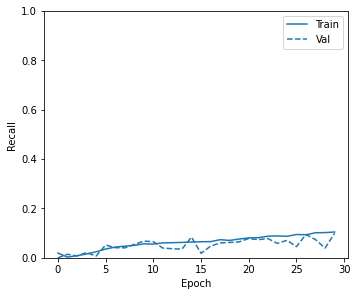

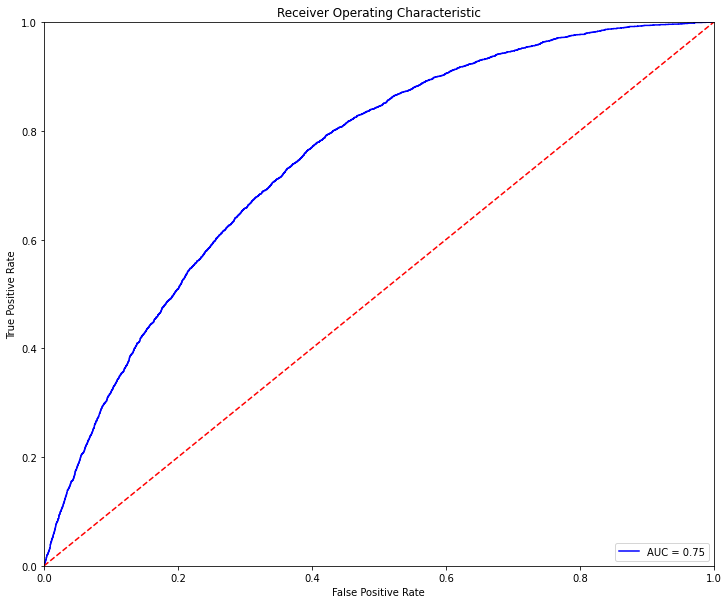

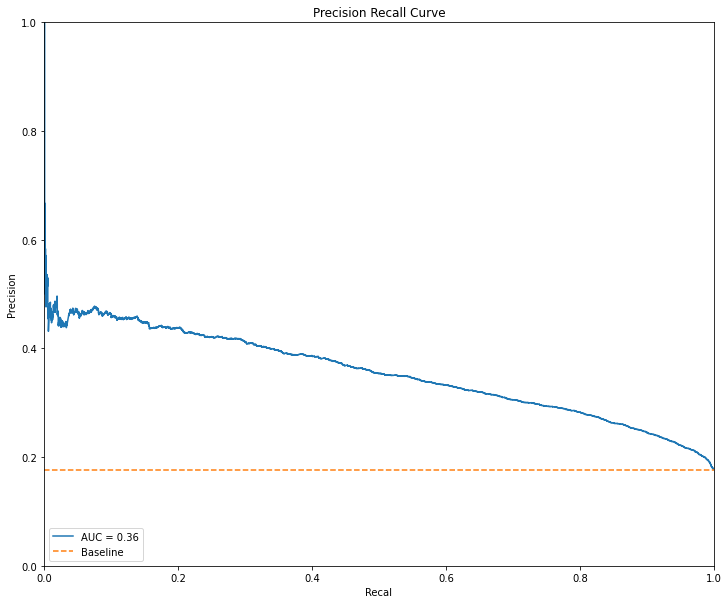

,threshold,tn,fp,fn,tp,f1,accuracy,precision,recall,auc
0,0.0,0,15979,0,3398,0.298397,0.175363,0.175363,1.000000,0.746727
1,0.1,6887,9092,373,3025,0.389945,0.511534,0.249649,0.890230,0.746727
2,0.2,11436,4543,1234,2164,0.428303,0.701863,0.322648,0.636845,0.746727
3,0.3,13851,2128,2060,1338,0.389860,0.783867,0.386036,0.393761,0.746727
4,0.4,15157,822,2758,640,0.263374,0.815245,0.437756,0.188346,0.746727
5,0.5,15742,237,3194,204,0.106278,0.822934,0.462585,0.060035,0.746727
6,0.6,15935,44,3361,37,0.021270,0.824276,0.456790,0.010889,0.746727
7,0.7,15976,3,3392,6,0.003522,0.824792,0.666667,0.001766,0.746727
8,0.8,15979,0,3398,0,0.000000,0.824637,0.000000,0.000000,0.746727
9,0.9,15979,0,3398,0,0.000000,0.824637,0.000000,0.000000,0.746727


In [ ]:
model_rep = create_model()
model_rep.load_weights(initial_weights)

history = model_rep.fit(
  train_features,
  train_labels,
  batch_size=BATCH_SIZE,
  epochs=EPOCHS,
  callbacks=[early_stopping],
  validation_data=(val_features, val_labels), 
  verbose=1)
plot_metrics(history)
predictions = model_rep.predict(test_features, batch_size=BATCH_SIZE)
eval_train = evaluate_model(actual=test_labels, predicted=predictions, threshold=np.linspace(0,1,11))
display(eval_train)

Model: "sequential_4"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_8 (Dense)              (None, 16)                8320      
_________________________________________________________________
activation_4 (Activation)    (None, 16)                0         
_________________________________________________________________
dense_9 (Dense)              (None, 1)                 17        
Total params: 8,337
Trainable params: 8,337
Non-trainable params: 0
_________________________________________________________________


None

Epoch 1/100
21/21 [==============================] - 3s 63ms/step - loss: 0.7086 - tp: 3403.0455 - fp: 3083.8182 - tn: 15672.9091 - fn: 5037.0455 - accuracy: 0.7113 - precision: 0.5164 - recall: 0.3702 - auc: 0.7428 - prc: 0.4845 - val_loss: 0.7074 - val_tp: 1940.0000 - val_fp: 6863.0000 - val_tn: 6048.0000 - val_fn: 650.0000 - val_accuracy: 0.5153 - val_precision: 0.2204 - val_recall: 0.7490 - val_auc: 0.6460 - val_prc: 0.2439
Epoch 2/100
21/21 [==============================] - 0s 11ms/step - loss: 0.6588 - tp: 3707.0455 - fp: 2276.8636 - tn: 3574.0000 - fn: 2137.9091 - accuracy: 0.6194 - precision: 0.6156 - recall: 0.6471 - auc: 0.6568 - prc: 0.6309 - val_loss: 0.6710 - val_tp: 1799.0000 - val_fp: 5385.0000 - val_tn: 7526.0000 - val_fn: 791.0000 - val_accuracy: 0.6016 - val_precision: 0.2504 - val_recall: 0.6946 - val_auc: 0.6812 - val_prc: 0.2811
Epoch 3/100
21/21 [==============================] - 0s 12ms/step - loss: 0.6407 - tp: 3839.8182 - fp: 2166.5000 - tn: 3684.8636 - fn: 20

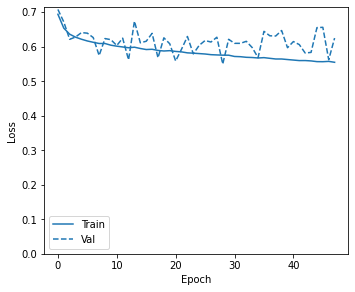

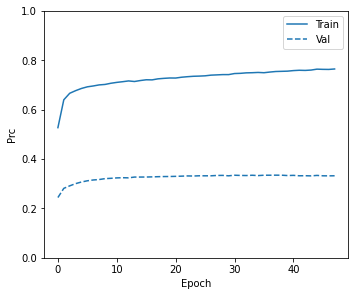

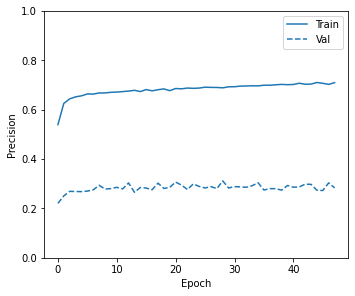

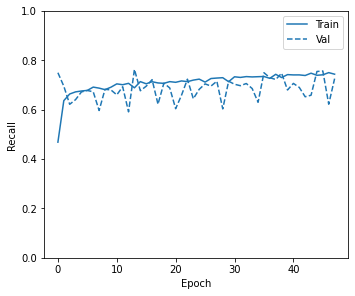

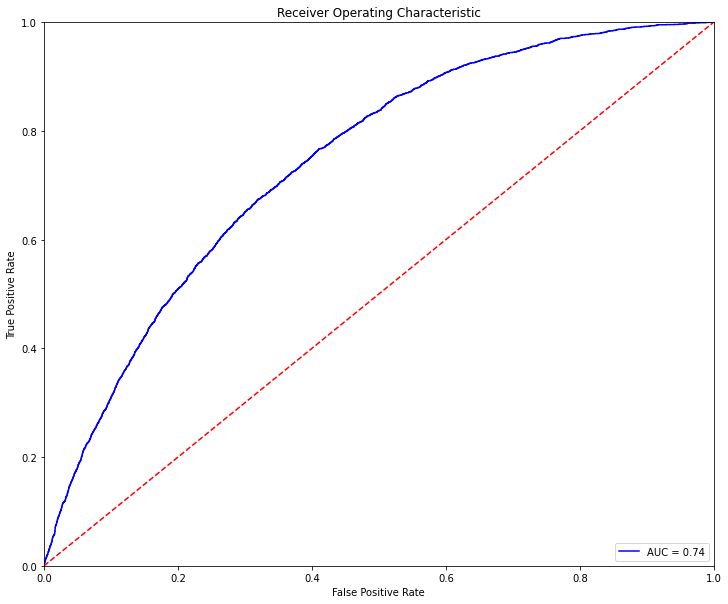

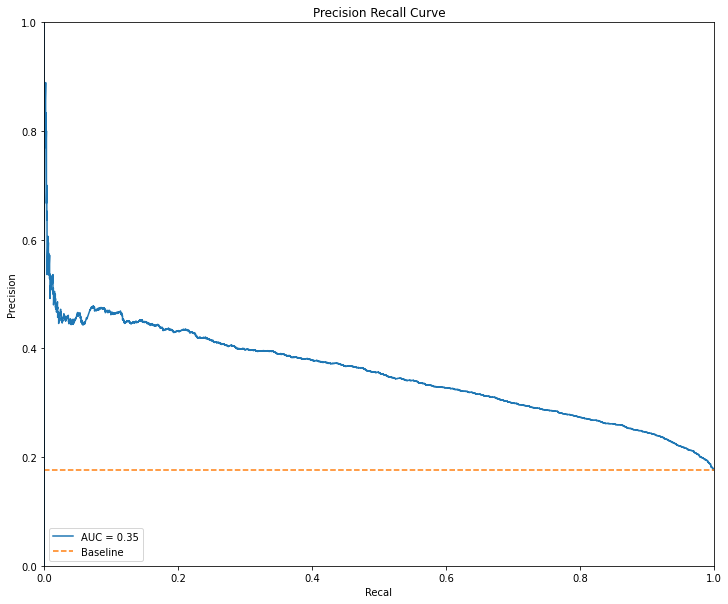

,threshold,tn,fp,fn,tp,f1,accuracy,precision,recall,auc
0,0.0,0,15979,0,3398,0.298397,0.175363,0.175363,1.000000,0.741828
1,0.1,983,14996,15,3383,0.310695,0.225319,0.184069,0.995586,0.741828
2,0.2,3176,12803,83,3315,0.339721,0.334985,0.205671,0.975574,0.741828
3,0.3,5542,10437,238,3160,0.371874,0.449089,0.232404,0.929959,0.741828
4,0.4,7872,8107,528,2870,0.399304,0.554369,0.261456,0.844614,0.741828
5,0.5,10021,5958,931,2467,0.417322,0.644475,0.292819,0.726015,0.741828
6,0.6,11991,3988,1427,1971,0.421289,0.720545,0.330760,0.580047,0.741828
7,0.7,13844,2135,2085,1313,0.383582,0.782216,0.380800,0.386404,0.741828
8,0.8,15237,742,2814,584,0.247248,0.816483,0.440422,0.171866,0.741828
9,0.9,15897,82,3326,72,0.040541,0.824121,0.467532,0.021189,0.741828


In [ ]:
model_rep = create_model()
model_rep.load_weights(initial_weights)

history = model_rep.fit(
  train_features_under,
  train_labels_under,
  batch_size=BATCH_SIZE,
  epochs=EPOCHS,
  callbacks=[early_stopping],
  validation_data=(val_features, val_labels), 
  verbose=1)
plot_metrics(history)
predictions = model_rep.predict(test_features, batch_size=BATCH_SIZE)
eval_train = evaluate_model(actual=test_labels, predicted=predictions, threshold=np.linspace(0,1,11))
display(eval_train)

Model: "sequential_7"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_14 (Dense)             (None, 16)                8320      
_________________________________________________________________
activation_7 (Activation)    (None, 16)                0         
_________________________________________________________________
dense_15 (Dense)             (None, 1)                 17        
Total params: 8,337
Trainable params: 8,337
Non-trainable params: 0
_________________________________________________________________


None

Epoch 1/100
101/101 [==============================] - 4s 18ms/step - loss: 0.6777 - tp: 18054.2255 - fp: 15710.3431 - tn: 23544.9510 - fn: 10906.6176 - accuracy: 0.6052 - precision: 0.5037 - recall: 0.6161 - auc: 0.6470 - prc: 0.4947 - val_loss: 0.6515 - val_tp: 1769.0000 - val_fp: 4991.0000 - val_tn: 7920.0000 - val_fn: 821.0000 - val_accuracy: 0.6251 - val_precision: 0.2617 - val_recall: 0.6830 - val_auc: 0.7010 - val_prc: 0.3061
Epoch 2/100
101/101 [==============================] - 1s 8ms/step - loss: 0.6182 - tp: 18020.8824 - fp: 9285.5980 - tn: 17033.5882 - fn: 8375.0686 - accuracy: 0.6639 - precision: 0.6590 - recall: 0.6829 - auc: 0.7171 - prc: 0.6871 - val_loss: 0.5934 - val_tp: 1608.0000 - val_fp: 4038.0000 - val_tn: 8873.0000 - val_fn: 982.0000 - val_accuracy: 0.6761 - val_precision: 0.2848 - val_recall: 0.6208 - val_auc: 0.7183 - val_prc: 0.3220
Epoch 3/100
101/101 [==============================] - 1s 7ms/step - loss: 0.6055 - tp: 18283.9412 - fp: 9015.4314 - tn: 17314.70

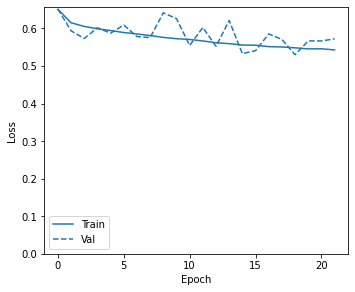

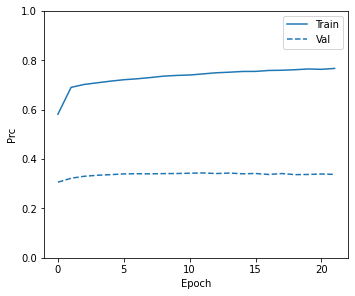

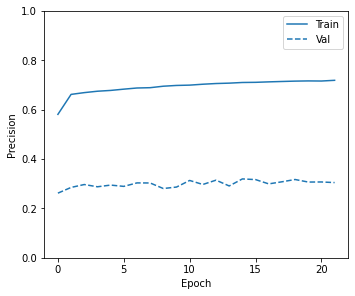

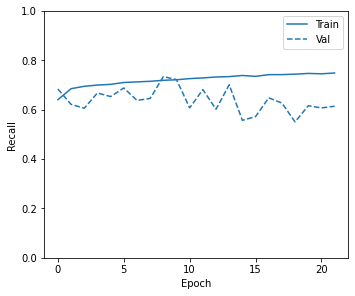

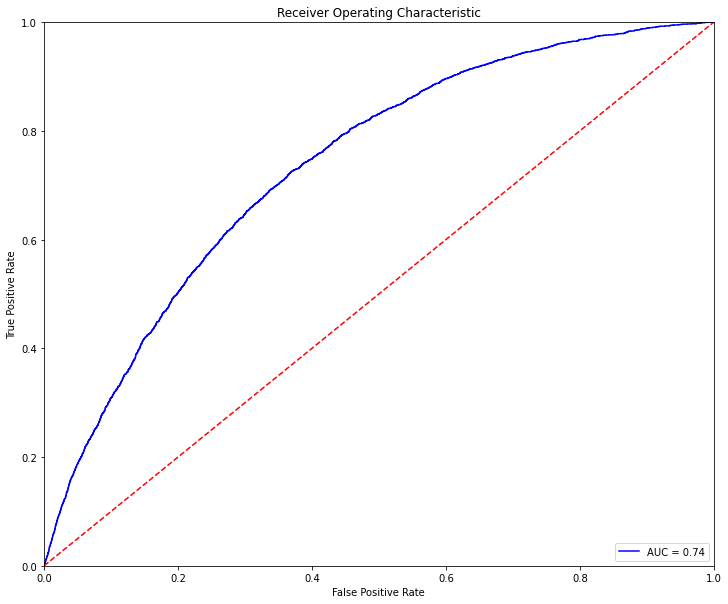

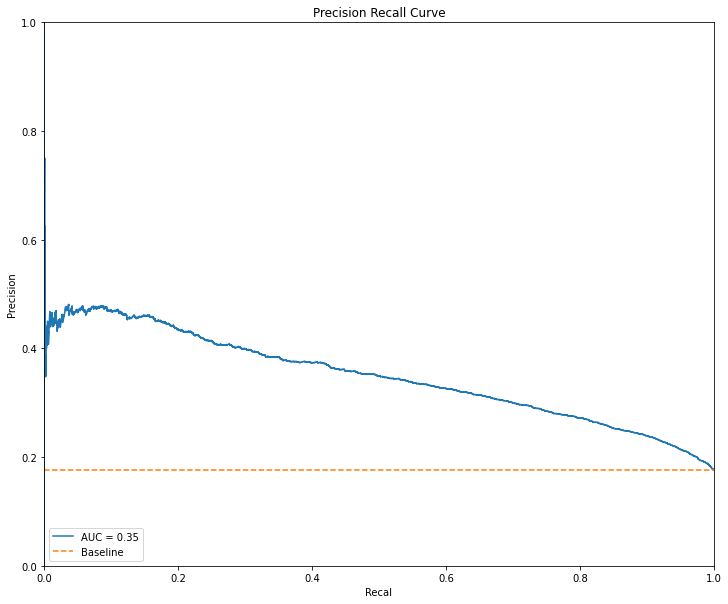

,threshold,tn,fp,fn,tp,f1,accuracy,precision,recall,auc
0,0.0,0,15979,0,3398,0.298397,0.175363,0.175363,1.000000,0.736572
1,0.1,1061,14918,22,3376,0.311267,0.228983,0.184541,0.993526,0.736572
2,0.2,3515,12464,127,3271,0.341922,0.350209,0.207881,0.962625,0.736572
3,0.3,6075,9904,322,3076,0.375626,0.472261,0.236980,0.905238,0.736572
4,0.4,8560,7419,654,2744,0.404690,0.583372,0.269999,0.807534,0.736572
5,0.5,10736,5243,1087,2311,0.422023,0.673324,0.305931,0.680106,0.736572
6,0.6,12650,3329,1645,1753,0.413443,0.743304,0.344943,0.515892,0.736572
7,0.7,14184,1795,2273,1125,0.356125,0.790060,0.385274,0.331077,0.736572
8,0.8,15342,637,2861,537,0.234908,0.819477,0.457411,0.158034,0.736572
9,0.9,15879,100,3317,81,0.045264,0.823657,0.447514,0.023838,0.736572


In [ ]:
model_rep = create_model()
model_rep.load_weights(initial_weights)

history = model_rep.fit(
  train_features_over,
  train_labels_over,
  batch_size=BATCH_SIZE,
  epochs=EPOCHS,
  callbacks=[early_stopping],
  validation_data=(val_features, val_labels), 
  verbose=1)
plot_metrics(history)
predictions = model_rep.predict(test_features, batch_size=BATCH_SIZE)
eval_train = evaluate_model(actual=test_labels, predicted=predictions, threshold=np.linspace(0,1,11))
display(eval_train)

<div class="images">
<strong> Carga de pesos de inicialización</strong> <br> 
Es clave para poder comparar resultados entre modelos
</div>

In [ ]:
weight_for_0 = (1 / neg) * (total / 2.0)
weight_for_1 = (1 / pos) * (total / 2.0)

class_weights = {0: weight_for_0, 1: weight_for_1}

print('Weight for class 0: {:.2f}'.format(weight_for_0))
print('Weight for class 1: {:.2f}'.format(weight_for_1))

Weight for class 0: 0.60
Weight for class 1: 2.93


Model: "sequential_5"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_10 (Dense)             (None, 16)                8320      
_________________________________________________________________
activation_5 (Activation)    (None, 16)                0         
_________________________________________________________________
dense_11 (Dense)             (None, 1)                 17        
Total params: 8,337
Trainable params: 8,337
Non-trainable params: 0
_________________________________________________________________


None

Instructions for updating:
The `validate_indices` argument has no effect. Indices are always validated on CPU and never validated on GPU.
Epoch 1/100
61/61 [==============================] - 4s 26ms/step - loss: 0.6915 - tp: 5161.0484 - fp: 16507.4355 - tn: 23120.2097 - fn: 2936.9194 - accuracy: 0.5926 - precision: 0.2391 - recall: 0.6405 - auc: 0.6569 - prc: 0.2745 - val_loss: 0.6776 - val_tp: 1817.0000 - val_fp: 5467.0000 - val_tn: 7444.0000 - val_fn: 773.0000 - val_accuracy: 0.5974 - val_precision: 0.2495 - val_recall: 0.7015 - val_auc: 0.6879 - val_prc: 0.2877
Epoch 2/100
61/61 [==============================] - 1s 9ms/step - loss: 0.6338 - tp: 3655.8387 - fp: 9769.6774 - tn: 16954.0323 - fn: 1845.0645 - accuracy: 0.6347 - precision: 0.2707 - recall: 0.6679 - auc: 0.6955 - prc: 0.2961 - val_loss: 0.6748 - val_tp: 1846.0000 - val_fp: 5391.0000 - val_tn: 7520.0000 - val_fn: 744.0000 - val_accuracy: 0.6042 - val_precision: 0.2551 - val_recall: 0.7127 - val_auc: 0.7035 - val_prc: 0.309

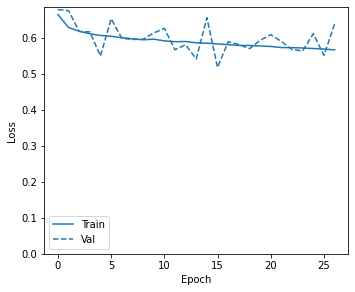

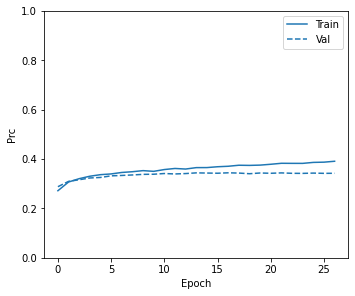

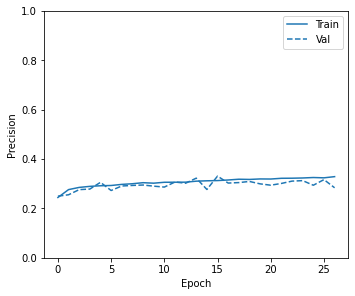

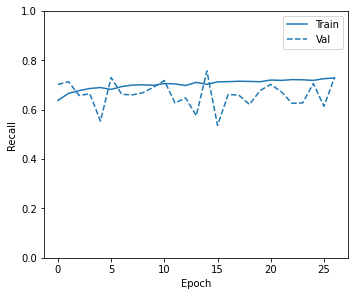

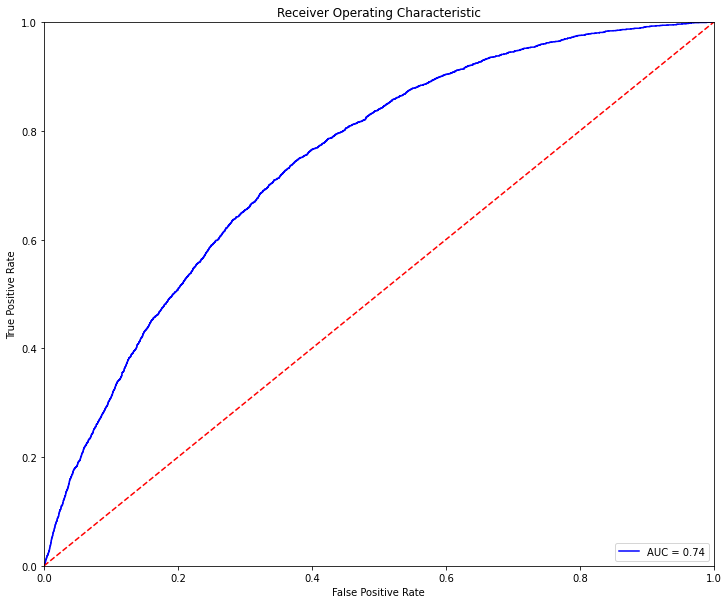

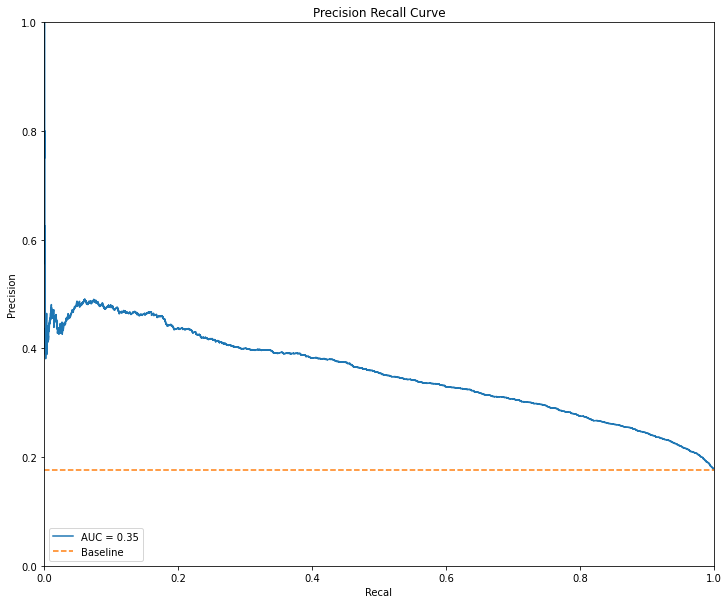

,threshold,tn,fp,fn,tp,f1,accuracy,precision,recall,auc
0,0.0,0,15979,0,3398,0.298397,0.175363,0.175363,1.000000,0.744162
1,0.1,741,15238,10,3388,0.307664,0.213088,0.181896,0.997057,0.744162
2,0.2,3158,12821,82,3316,0.339493,0.334107,0.205490,0.975868,0.744162
3,0.3,5929,10050,284,3114,0.376042,0.466687,0.236554,0.916421,0.744162
4,0.4,8675,7304,647,2751,0.408979,0.589668,0.273595,0.809594,0.744162
5,0.5,11035,4944,1138,2260,0.426335,0.686123,0.313715,0.665097,0.744162
6,0.6,12972,3007,1722,1676,0.414800,0.755948,0.357890,0.493231,0.744162
7,0.7,14492,1487,2406,992,0.337587,0.799092,0.400161,0.291936,0.744162
8,0.8,15483,496,2966,432,0.199723,0.821335,0.465517,0.127134,0.744162
9,0.9,15915,64,3346,52,0.029596,0.824018,0.448276,0.015303,0.744162


In [ ]:
weightened_model = create_model()
weightened_model.load_weights(initial_weights)

history = weightened_model.fit(
  train_features,
  train_labels,
  batch_size=BATCH_SIZE,
  epochs=EPOCHS,
  callbacks=[early_stopping],
  validation_data=(val_features, val_labels), 
  class_weight=class_weights,
  verbose=1)

plot_metrics(history)
predictions = weightened_model.predict(test_features, batch_size=BATCH_SIZE)
eval_train = evaluate_model(actual=test_labels, predicted=predictions, threshold=np.linspace(0,1,11))
display(eval_train)

<div class="images">
<strong> Los pesos tienen efecto y ayudan! Vemos como el f1 mejora!</strong> <br> 
</div>

<div class="info">
<strong> Con 16 nueronas da bastantes buenos resultados, veamos si incluyendo más neuronas los resultados mejoran!</strong> <br> 
</div>

In [ ]:
datasets_features = [train_features, train_features_under, train_features_over]
datasets_labels = [train_labels, train_labels_under, train_labels_over]

In [ ]:
def create_model_1l_32():
  model = keras.Sequential()
  model.add(Dense(units=32, input_shape=(train_features.shape[-1],)))
  model.add(Activation('relu'))
  model.add(Dense(1, activation='sigmoid'))

  display(model.summary())

  model.compile(
        optimizer=keras.optimizers.Adam(learning_rate=1e-3),
        loss=keras.losses.BinaryCrossentropy(),
      metrics=METRICS)
  
  return model

In [ ]:
model = create_model_1l_32()
initial_weights = os.path.join(tempfile.mkdtemp(), 'initial_weights')
model.save_weights(initial_weights)

Model: "sequential_9"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_17 (Dense)             (None, 32)                16640     
_________________________________________________________________
activation_9 (Activation)    (None, 32)                0         
_________________________________________________________________
dense_18 (Dense)             (None, 1)                 33        
Total params: 16,673
Trainable params: 16,673
Non-trainable params: 0
_________________________________________________________________


None

Model: "sequential_13"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_25 (Dense)             (None, 32)                16640     
_________________________________________________________________
activation_13 (Activation)   (None, 32)                0         
_________________________________________________________________
dense_26 (Dense)             (None, 1)                 33        
Total params: 16,673
Trainable params: 16,673
Non-trainable params: 0
_________________________________________________________________


None

Epoch 1/100
61/61 [==============================] - 4s 25ms/step - loss: 0.7119 - tp: 4672.9032 - fp: 14915.9355 - tn: 24711.7097 - fn: 3425.0645 - accuracy: 0.6214 - precision: 0.2413 - recall: 0.5689 - auc: 0.6446 - prc: 0.2495 - val_loss: 0.6578 - val_tp: 1791.0000 - val_fp: 5161.0000 - val_tn: 7750.0000 - val_fn: 799.0000 - val_accuracy: 0.6155 - val_precision: 0.2576 - val_recall: 0.6915 - val_auc: 0.6913 - val_prc: 0.2919
Epoch 2/100
61/61 [==============================] - 1s 9ms/step - loss: 0.6287 - tp: 3720.2097 - fp: 9793.3710 - tn: 16930.3387 - fn: 1780.6935 - accuracy: 0.6370 - precision: 0.2739 - recall: 0.6774 - auc: 0.7030 - prc: 0.3027 - val_loss: 0.6189 - val_tp: 1697.0000 - val_fp: 4470.0000 - val_tn: 8441.0000 - val_fn: 893.0000 - val_accuracy: 0.6540 - val_precision: 0.2752 - val_recall: 0.6552 - val_auc: 0.7119 - val_prc: 0.3149
Epoch 3/100
61/61 [==============================] - 0s 8ms/step - loss: 0.6095 - tp: 3734.9839 - fp: 9250.6935 - tn: 17486.5968 - fn: 1

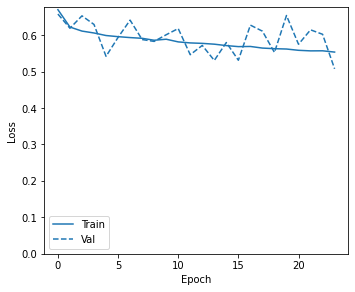

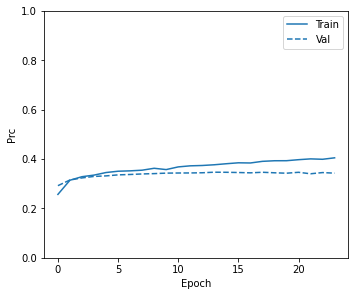

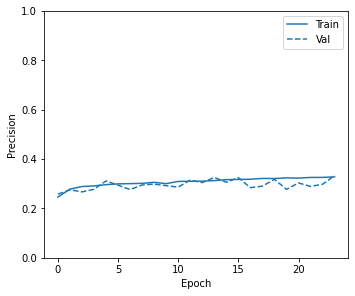

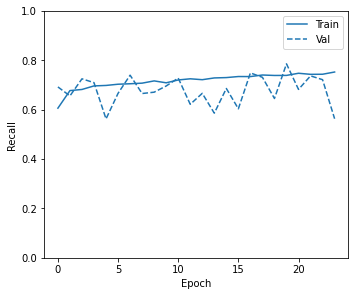

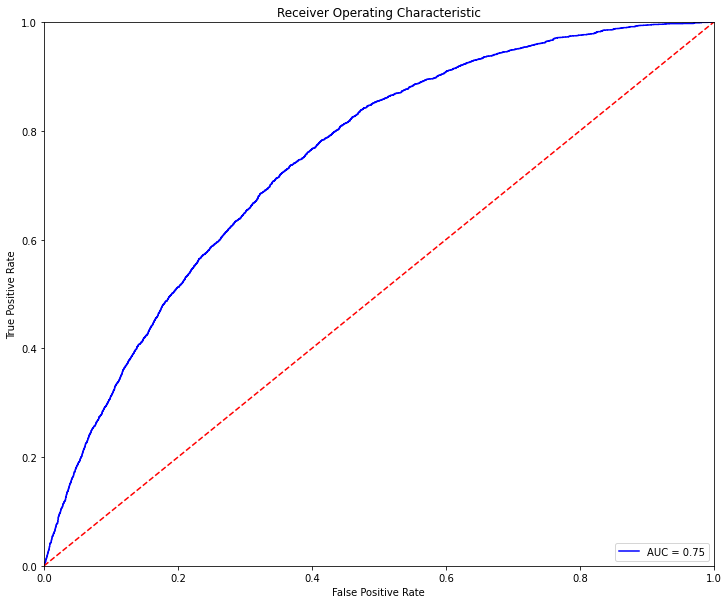

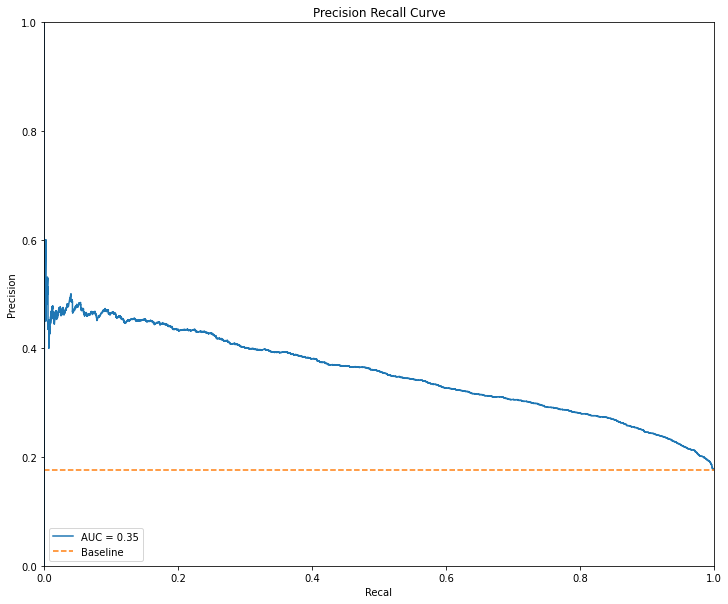

,threshold,tn,fp,fn,tp,f1,accuracy,precision,recall,auc
0,0.0,0,15979,0,3398,0.298397,0.175363,0.175363,1.000000,0.746706
1,0.1,1782,14197,21,3377,0.322048,0.266243,0.192159,0.993820,0.746706
2,0.2,4575,11404,160,3238,0.358980,0.403210,0.221145,0.952913,0.746706
3,0.3,7446,8533,434,2964,0.397986,0.537235,0.257806,0.872278,0.746706
4,0.4,9945,6034,870,2528,0.422742,0.643701,0.295258,0.743967,0.746706
5,0.5,11965,4014,1400,1998,0.424655,0.720597,0.332335,0.587993,0.746706
6,0.6,13651,2328,1999,1399,0.392702,0.776694,0.375369,0.411713,0.746706
7,0.7,14938,1041,2611,787,0.301186,0.811529,0.430525,0.231607,0.746706
8,0.8,15693,286,3150,248,0.126144,0.822676,0.464419,0.072984,0.746706
9,0.9,15966,13,3386,12,0.007011,0.824586,0.480000,0.003531,0.746706


Model: "sequential_14"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_27 (Dense)             (None, 32)                16640     
_________________________________________________________________
activation_14 (Activation)   (None, 32)                0         
_________________________________________________________________
dense_28 (Dense)             (None, 1)                 33        
Total params: 16,673
Trainable params: 16,673
Non-trainable params: 0
_________________________________________________________________


None

Epoch 1/100
21/21 [==============================] - 4s 88ms/step - loss: 0.7589 - tp: 4475.2273 - fp: 5899.9091 - tn: 12856.8182 - fn: 3964.8636 - accuracy: 0.6447 - precision: 0.4199 - recall: 0.5295 - auc: 0.6819 - prc: 0.4138 - val_loss: 0.6294 - val_tp: 1075.0000 - val_fp: 3339.0000 - val_tn: 9572.0000 - val_fn: 1515.0000 - val_accuracy: 0.6869 - val_precision: 0.2435 - val_recall: 0.4151 - val_auc: 0.6272 - val_prc: 0.2338
Epoch 2/100
21/21 [==============================] - 0s 11ms/step - loss: 0.6624 - tp: 3875.4091 - fp: 2529.2727 - tn: 3321.5909 - fn: 1969.5455 - accuracy: 0.6081 - precision: 0.6037 - recall: 0.6453 - auc: 0.6502 - prc: 0.6245 - val_loss: 0.7040 - val_tp: 1990.0000 - val_fp: 6443.0000 - val_tn: 6468.0000 - val_fn: 600.0000 - val_accuracy: 0.5456 - val_precision: 0.2360 - val_recall: 0.7683 - val_auc: 0.6808 - val_prc: 0.2788
Epoch 3/100
21/21 [==============================] - 0s 12ms/step - loss: 0.6382 - tp: 3901.6364 - fp: 2208.6364 - tn: 3642.7273 - fn: 1

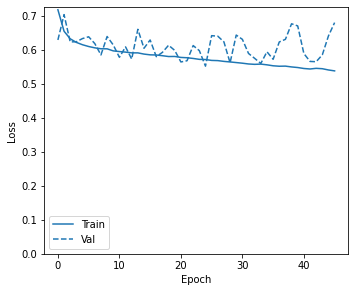

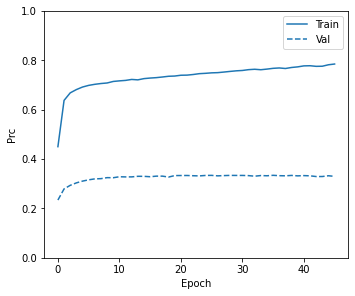

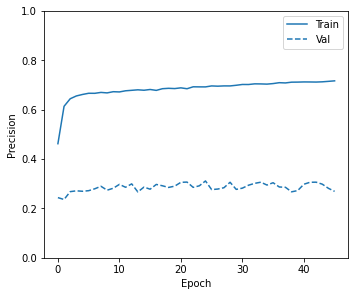

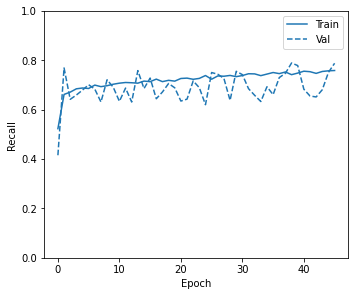

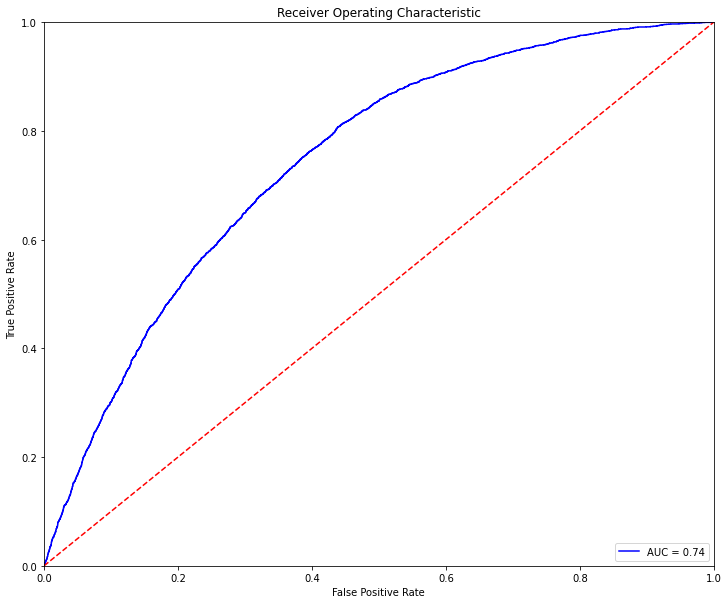

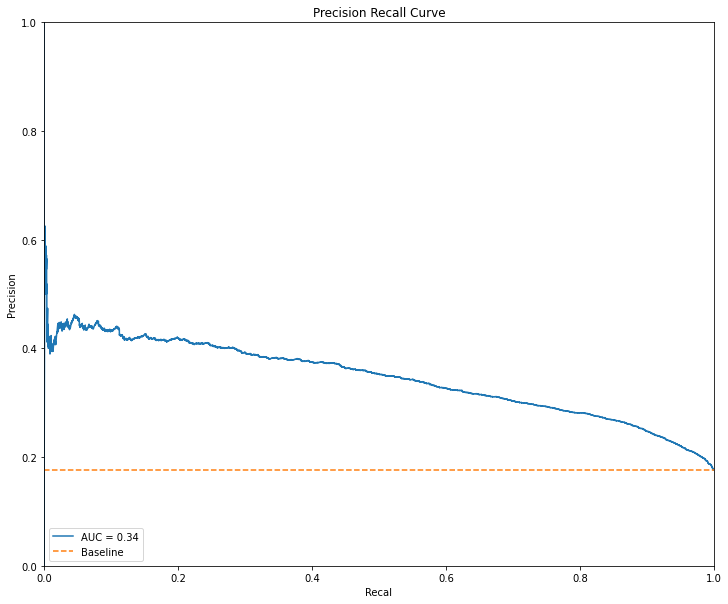

,threshold,tn,fp,fn,tp,f1,accuracy,precision,recall,auc
0,0.0,0,15979,0,3398,0.298397,0.175363,0.175363,1.000000,0.743575
1,0.1,1630,14349,30,3368,0.319015,0.257935,0.190100,0.991171,0.743575
2,0.2,4104,11875,143,3255,0.351360,0.379780,0.215135,0.957916,0.743575
3,0.3,6682,9297,340,3058,0.388244,0.502658,0.247511,0.899941,0.743575
4,0.4,9078,6901,693,2705,0.416026,0.608092,0.281595,0.796057,0.743575
5,0.5,11096,4883,1162,2236,0.425216,0.688032,0.314089,0.658034,0.743575
6,0.6,12923,3056,1721,1677,0.412495,0.753471,0.354321,0.493526,0.743575
7,0.7,14411,1568,2390,1008,0.337462,0.795737,0.391304,0.296645,0.743575
8,0.8,15499,480,3023,375,0.176346,0.819219,0.438596,0.110359,0.743575
9,0.9,15923,56,3360,38,0.021764,0.823709,0.404255,0.011183,0.743575


Model: "sequential_15"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_29 (Dense)             (None, 32)                16640     
_________________________________________________________________
activation_15 (Activation)   (None, 32)                0         
_________________________________________________________________
dense_30 (Dense)             (None, 1)                 33        
Total params: 16,673
Trainable params: 16,673
Non-trainable params: 0
_________________________________________________________________


None

Epoch 1/100
101/101 [==============================] - 4s 19ms/step - loss: 0.6854 - tp: 18327.2647 - fp: 16598.2941 - tn: 22657.0000 - fn: 10633.5784 - accuracy: 0.5919 - precision: 0.4919 - recall: 0.6266 - auc: 0.6347 - prc: 0.4826 - val_loss: 0.6378 - val_tp: 1752.0000 - val_fp: 4771.0000 - val_tn: 8140.0000 - val_fn: 838.0000 - val_accuracy: 0.6382 - val_precision: 0.2686 - val_recall: 0.6764 - val_auc: 0.7071 - val_prc: 0.3119
Epoch 2/100
101/101 [==============================] - 1s 8ms/step - loss: 0.6109 - tp: 18198.2255 - fp: 9258.9412 - tn: 17060.2451 - fn: 8197.7255 - accuracy: 0.6676 - precision: 0.6619 - recall: 0.6885 - auc: 0.7258 - prc: 0.6958 - val_loss: 0.6206 - val_tp: 1776.0000 - val_fp: 4568.0000 - val_tn: 8343.0000 - val_fn: 814.0000 - val_accuracy: 0.6528 - val_precision: 0.2799 - val_recall: 0.6857 - val_auc: 0.7267 - val_prc: 0.3294
Epoch 3/100
101/101 [==============================] - 1s 8ms/step - loss: 0.5962 - tp: 18539.7549 - fp: 8926.6765 - tn: 17403.46

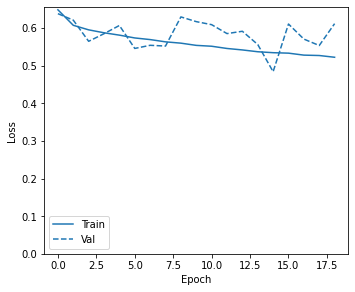

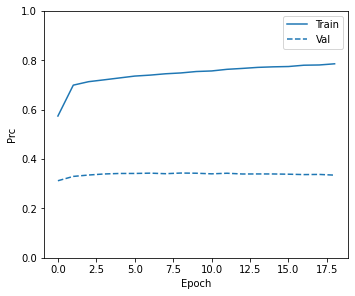

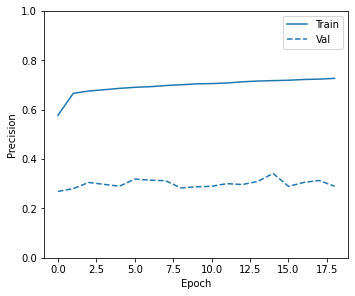

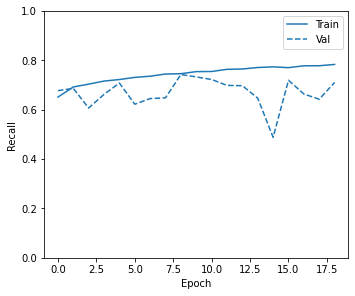

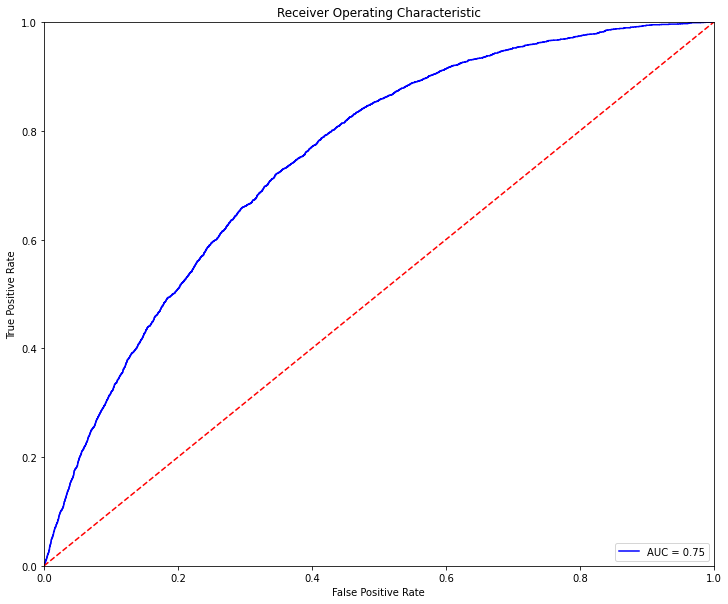

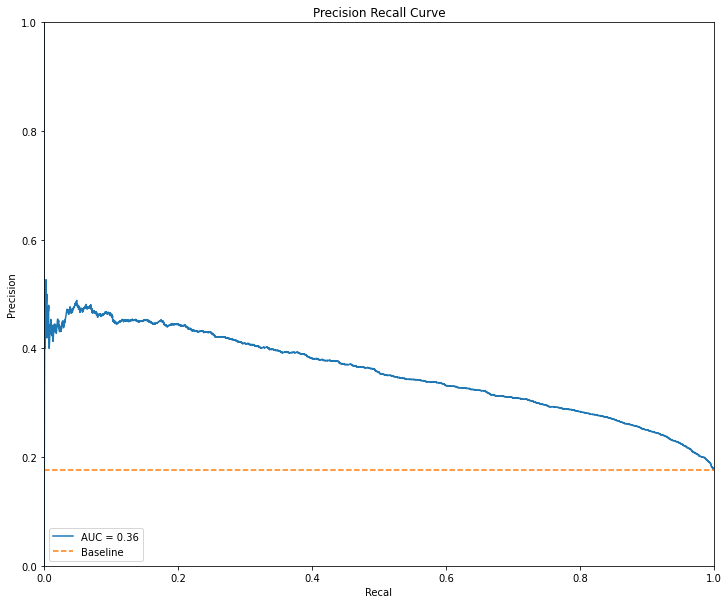

,threshold,tn,fp,fn,tp,f1,accuracy,precision,recall,auc
0,0.0,0,15979,0,3398,0.298397,0.175363,0.175363,1.000000,0.749178
1,0.1,1377,14602,16,3382,0.316341,0.245600,0.188056,0.995291,0.749178
2,0.2,3496,12483,103,3295,0.343659,0.350467,0.208835,0.969688,0.749178
3,0.3,5661,10318,229,3169,0.375363,0.455695,0.234967,0.932607,0.749178
4,0.4,7865,8114,473,2925,0.405209,0.556846,0.264970,0.860800,0.749178
5,0.5,9873,6106,846,2552,0.423358,0.641224,0.294756,0.751030,0.749178
6,0.6,11805,4174,1335,2063,0.428230,0.715694,0.330768,0.607122,0.749178
7,0.7,13618,2361,1966,1432,0.398276,0.776694,0.377538,0.421424,0.749178
8,0.8,15154,825,2740,658,0.269617,0.816019,0.443695,0.193643,0.749178
9,0.9,15914,65,3350,48,0.027343,0.823760,0.424779,0.014126,0.749178


In [ ]:
for i in range(0, len(datasets_features)):
  if i == 0: 
    model_1l_32 = create_model_1l_32()
    model_1l_32.load_weights(initial_weights)
    history = model_1l_32.fit(
      train_features, train_labels,
      batch_size=BATCH_SIZE,
      epochs=EPOCHS,
      callbacks=[early_stopping],
      validation_data=(val_features, val_labels),
      class_weight=class_weights, 
      verbose=1)

    plot_metrics(history)
    predictions = model_1l_32.predict(test_features, batch_size=BATCH_SIZE)
    eval_train = evaluate_model(actual=test_labels, predicted=predictions, threshold=np.linspace(0,1,11))
    display(eval_train)

  else:
    model_1l_32 = create_model_1l_32()
    model_1l_32.load_weights(initial_weights)
    history = model_1l_32.fit(
      datasets_features[i], datasets_labels[i],
      batch_size=BATCH_SIZE,
      epochs=EPOCHS,
      callbacks=[early_stopping],
      validation_data=(val_features, val_labels),
      verbose=1)

    plot_metrics(history)
    predictions = model_1l_32.predict(test_features, batch_size=BATCH_SIZE)
    eval_train = evaluate_model(actual=test_labels, predicted=predictions, threshold=np.linspace(0,1,11))
    display(eval_train)  

<div class="images">
<strong> Aplicación de diferentes dataset sobre misma arquitectura y comparación de modelos!</strong> <br> 
</div>

In [ ]:
def create_model_abstract_1l(units):
  model = keras.Sequential()
  model.add(Dense(units=units, input_shape=(train_features.shape[-1],)))
  model.add(Activation('relu'))
  model.add(Dense(1, activation='sigmoid'))

  display(model.summary())

  model.compile(
        optimizer=keras.optimizers.Adam(learning_rate=1e-3),
        loss=keras.losses.BinaryCrossentropy(),
      metrics=METRICS)
  
  return model

Number of units: 16
Model: "sequential_19"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_37 (Dense)             (None, 16)                8320      
_________________________________________________________________
activation_19 (Activation)   (None, 16)                0         
_________________________________________________________________
dense_38 (Dense)             (None, 1)                 17        
Total params: 8,337
Trainable params: 8,337
Non-trainable params: 0
_________________________________________________________________


None

Model: "sequential_20"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_39 (Dense)             (None, 16)                8320      
_________________________________________________________________
activation_20 (Activation)   (None, 16)                0         
_________________________________________________________________
dense_40 (Dense)             (None, 1)                 17        
Total params: 8,337
Trainable params: 8,337
Non-trainable params: 0
_________________________________________________________________


None

Epoch 1/100
61/61 [==============================] - 4s 26ms/step - loss: 0.6943 - tp: 5001.8548 - fp: 16462.4516 - tn: 23165.1935 - fn: 3096.1129 - accuracy: 0.5942 - precision: 0.2359 - recall: 0.6161 - auc: 0.6524 - prc: 0.2722 - val_loss: 0.6682 - val_tp: 1798.0000 - val_fp: 5321.0000 - val_tn: 7590.0000 - val_fn: 792.0000 - val_accuracy: 0.6056 - val_precision: 0.2526 - val_recall: 0.6942 - val_auc: 0.6858 - val_prc: 0.2864
Epoch 2/100
61/61 [==============================] - 0s 8ms/step - loss: 0.6324 - tp: 3662.7258 - fp: 9792.4839 - tn: 16931.2258 - fn: 1838.1774 - accuracy: 0.6350 - precision: 0.2707 - recall: 0.6670 - auc: 0.6976 - prc: 0.2959 - val_loss: 0.6465 - val_tp: 1739.0000 - val_fp: 4920.0000 - val_tn: 7991.0000 - val_fn: 851.0000 - val_accuracy: 0.6277 - val_precision: 0.2612 - val_recall: 0.6714 - val_auc: 0.7038 - val_prc: 0.3090
Epoch 3/100
61/61 [==============================] - 0s 8ms/step - loss: 0.6168 - tp: 3687.8387 - fp: 9330.7903 - tn: 17406.5000 - fn: 1

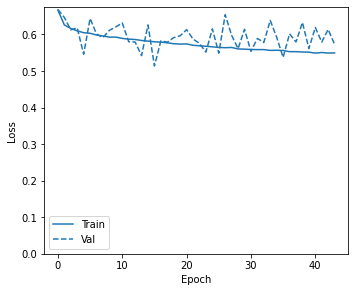

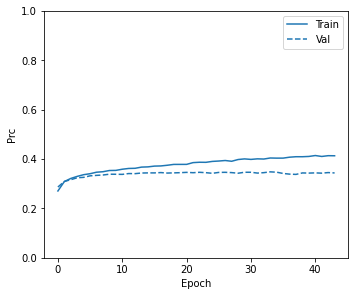

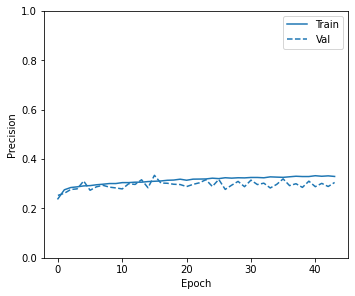

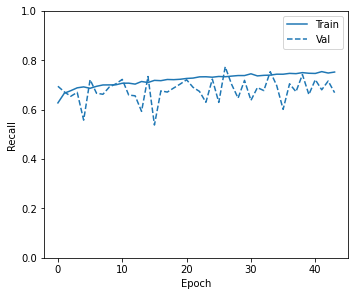

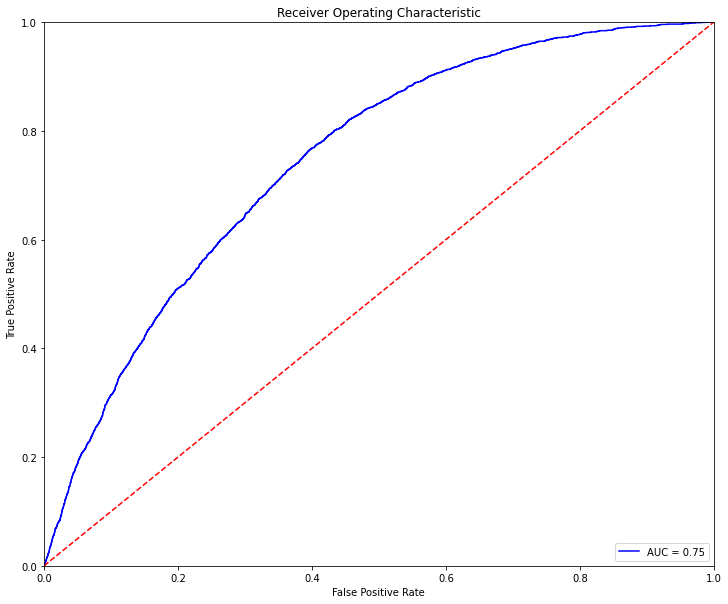

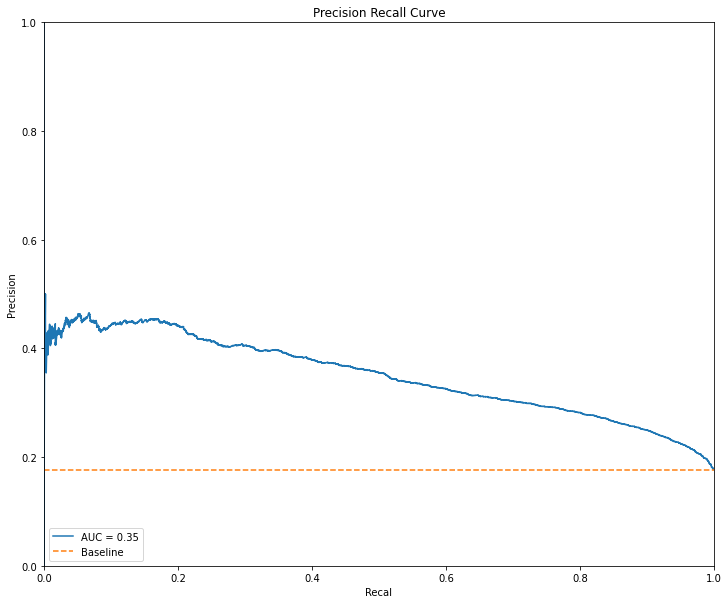

,threshold,tn,fp,fn,tp,f1,accuracy,precision,recall,auc
0,0.0,0,15979,0,3398,0.298397,0.175363,0.175363,1.000000,0.745487
1,0.1,1379,14600,21,3377,0.315977,0.245446,0.187851,0.993820,0.745487
2,0.2,3427,12552,87,3311,0.343804,0.347732,0.208725,0.974397,0.745487
3,0.3,5526,10453,223,3175,0.372959,0.449038,0.232976,0.934373,0.745487
4,0.4,7734,8245,475,2923,0.401346,0.549982,0.261730,0.860212,0.745487
5,0.5,9827,6152,854,2544,0.420704,0.638437,0.292548,0.748676,0.745487
6,0.6,11787,4192,1368,2030,0.422037,0.713062,0.326262,0.597410,0.745487
7,0.7,13608,2371,1987,1411,0.393036,0.775094,0.373083,0.415244,0.745487
8,0.8,15051,928,2684,714,0.283333,0.813593,0.434836,0.210124,0.745487
9,0.9,15850,129,3295,103,0.056749,0.823296,0.443966,0.030312,0.745487


Model: "sequential_21"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_41 (Dense)             (None, 16)                8320      
_________________________________________________________________
activation_21 (Activation)   (None, 16)                0         
_________________________________________________________________
dense_42 (Dense)             (None, 1)                 17        
Total params: 8,337
Trainable params: 8,337
Non-trainable params: 0
_________________________________________________________________


None

Epoch 1/100
21/21 [==============================] - 4s 82ms/step - loss: 0.7127 - tp: 5030.4545 - fp: 7038.0909 - tn: 11718.6364 - fn: 3409.6364 - accuracy: 0.6214 - precision: 0.4059 - recall: 0.6020 - auc: 0.6692 - prc: 0.4017 - val_loss: 0.7009 - val_tp: 1887.0000 - val_fp: 7183.0000 - val_tn: 5728.0000 - val_fn: 703.0000 - val_accuracy: 0.4913 - val_precision: 0.2080 - val_recall: 0.7286 - val_auc: 0.6168 - val_prc: 0.2235
Epoch 2/100
21/21 [==============================] - 0s 11ms/step - loss: 0.6695 - tp: 3755.6818 - fp: 2516.9545 - tn: 3333.9091 - fn: 2089.2727 - accuracy: 0.6005 - precision: 0.5928 - recall: 0.6576 - auc: 0.6386 - prc: 0.6153 - val_loss: 0.6753 - val_tp: 1804.0000 - val_fp: 5738.0000 - val_tn: 7173.0000 - val_fn: 786.0000 - val_accuracy: 0.5791 - val_precision: 0.2392 - val_recall: 0.6965 - val_auc: 0.6636 - val_prc: 0.2583
Epoch 3/100
21/21 [==============================] - 0s 12ms/step - loss: 0.6496 - tp: 3927.7727 - fp: 2298.8636 - tn: 3552.5000 - fn: 19

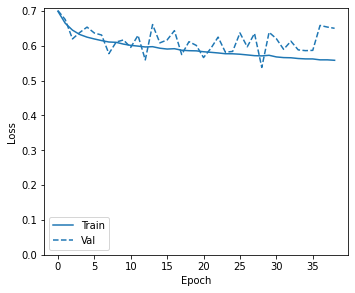

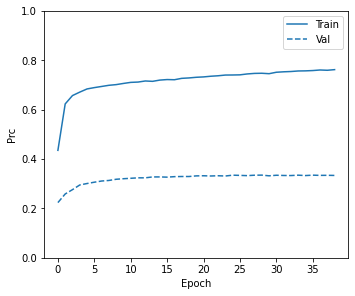

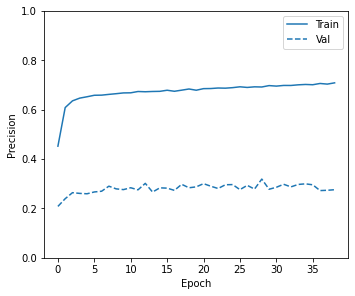

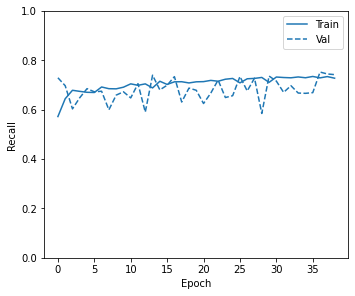

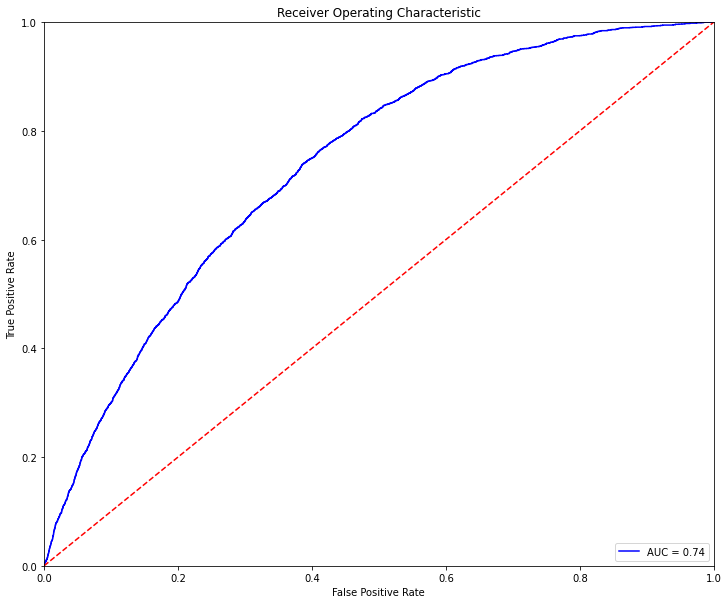

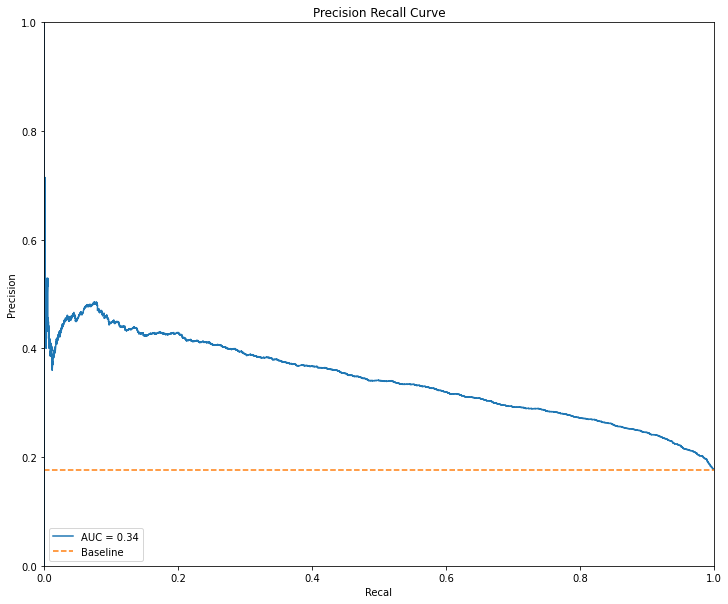

,threshold,tn,fp,fn,tp,f1,accuracy,precision,recall,auc
0,0.0,0,15979,0,3398,0.298397,0.175363,0.175363,1.000000,0.73717
1,0.1,1511,14468,27,3371,0.317465,0.251948,0.188968,0.992054,0.73717
2,0.2,4245,11734,155,3243,0.352980,0.386438,0.216532,0.954385,0.73717
3,0.3,7199,8780,435,2963,0.391388,0.524436,0.252321,0.871984,0.73717
4,0.4,9828,6151,894,2504,0.415498,0.636425,0.289313,0.736904,0.73717
5,0.5,11959,4020,1441,1957,0.417493,0.718171,0.327422,0.575927,0.73717
6,0.6,13706,2273,2072,1326,0.379020,0.775765,0.368436,0.390230,0.73717
7,0.7,15037,942,2701,697,0.276752,0.811994,0.425259,0.205121,0.73717
8,0.8,15721,258,3162,236,0.121274,0.823502,0.477733,0.069453,0.73717
9,0.9,15948,31,3375,23,0.013326,0.824225,0.425926,0.006769,0.73717


Model: "sequential_22"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_43 (Dense)             (None, 16)                8320      
_________________________________________________________________
activation_22 (Activation)   (None, 16)                0         
_________________________________________________________________
dense_44 (Dense)             (None, 1)                 17        
Total params: 8,337
Trainable params: 8,337
Non-trainable params: 0
_________________________________________________________________


None

Epoch 1/100
101/101 [==============================] - 4s 18ms/step - loss: 0.6809 - tp: 18565.2745 - fp: 16815.0392 - tn: 22440.2549 - fn: 10395.5686 - accuracy: 0.5956 - precision: 0.4952 - recall: 0.6394 - auc: 0.6391 - prc: 0.4862 - val_loss: 0.6427 - val_tp: 1702.0000 - val_fp: 4784.0000 - val_tn: 8127.0000 - val_fn: 888.0000 - val_accuracy: 0.6341 - val_precision: 0.2624 - val_recall: 0.6571 - val_auc: 0.7009 - val_prc: 0.3070
Epoch 2/100
101/101 [==============================] - 1s 8ms/step - loss: 0.6166 - tp: 18058.9216 - fp: 9292.5882 - tn: 17026.5980 - fn: 8337.0294 - accuracy: 0.6641 - precision: 0.6594 - recall: 0.6827 - auc: 0.7186 - prc: 0.6895 - val_loss: 0.5878 - val_tp: 1612.0000 - val_fp: 4009.0000 - val_tn: 8902.0000 - val_fn: 978.0000 - val_accuracy: 0.6783 - val_precision: 0.2868 - val_recall: 0.6224 - val_auc: 0.7192 - val_prc: 0.3227
Epoch 3/100
101/101 [==============================] - 1s 8ms/step - loss: 0.6032 - tp: 18327.8627 - fp: 9051.7745 - tn: 17278.36

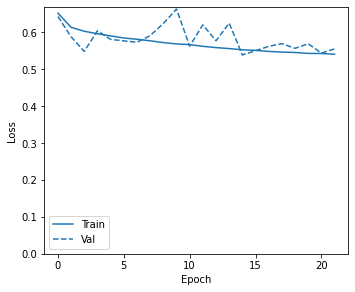

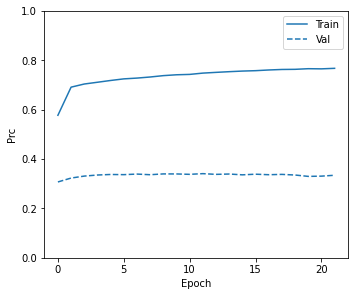

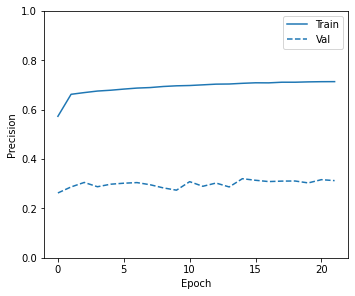

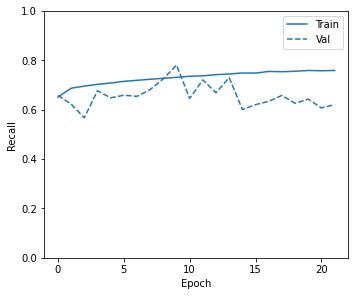

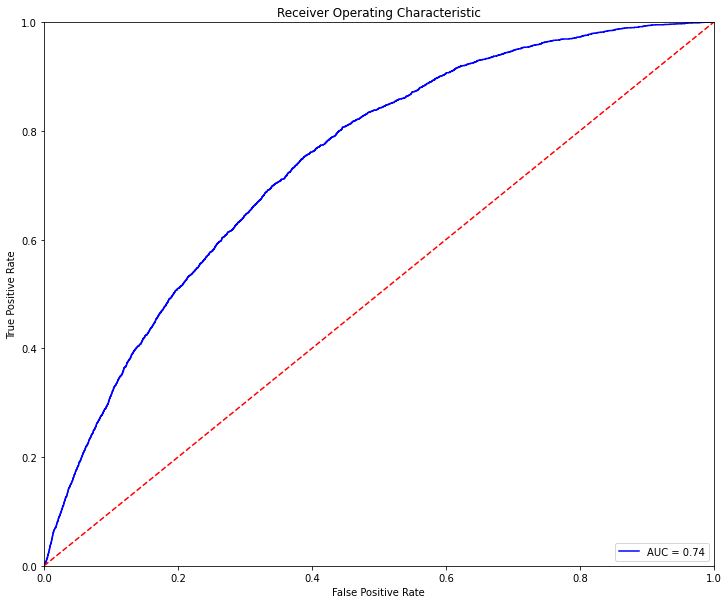

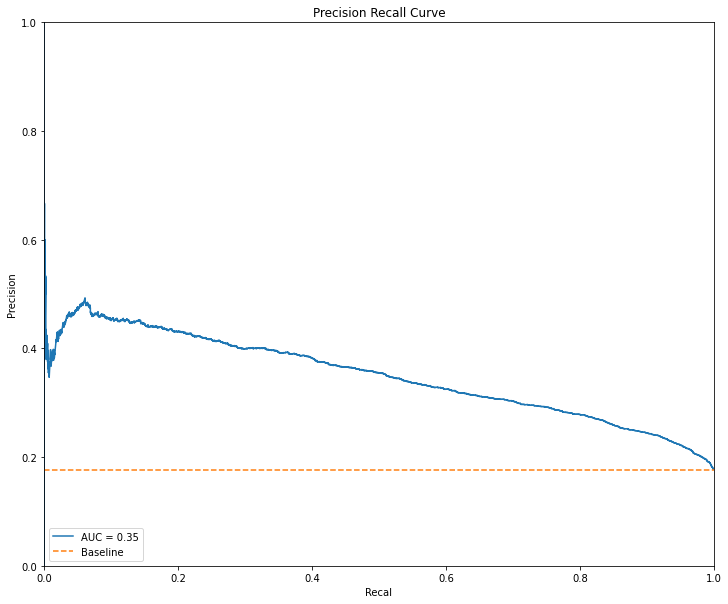

,threshold,tn,fp,fn,tp,f1,accuracy,precision,recall,auc
0,0.0,0,15979,0,3398,0.298397,0.175363,0.175363,1.000000,0.742418
1,0.1,1386,14593,17,3381,0.316395,0.246013,0.188105,0.994997,0.742418
2,0.2,3623,12356,106,3292,0.345689,0.356866,0.210378,0.968805,0.742418
3,0.3,5927,10052,269,3129,0.377465,0.467358,0.237387,0.920836,0.742418
4,0.4,8157,7822,558,2840,0.403983,0.567529,0.266367,0.835786,0.742418
5,0.5,10262,5717,979,2419,0.419456,0.654436,0.297321,0.711889,0.742418
6,0.6,12131,3848,1478,1920,0.418940,0.725138,0.332871,0.565038,0.742418
7,0.7,13854,2125,2065,1333,0.388856,0.783764,0.385483,0.392290,0.742418
8,0.8,15161,818,2772,626,0.258571,0.814729,0.433518,0.184226,0.742418
9,0.9,15862,117,3310,88,0.048848,0.823141,0.429268,0.025898,0.742418


Number of units: 32
Model: "sequential_23"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_45 (Dense)             (None, 32)                16640     
_________________________________________________________________
activation_23 (Activation)   (None, 32)                0         
_________________________________________________________________
dense_46 (Dense)             (None, 1)                 33        
Total params: 16,673
Trainable params: 16,673
Non-trainable params: 0
_________________________________________________________________


None

Model: "sequential_24"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_47 (Dense)             (None, 32)                16640     
_________________________________________________________________
activation_24 (Activation)   (None, 32)                0         
_________________________________________________________________
dense_48 (Dense)             (None, 1)                 33        
Total params: 16,673
Trainable params: 16,673
Non-trainable params: 0
_________________________________________________________________


None

Epoch 1/100
61/61 [==============================] - 4s 26ms/step - loss: 0.6781 - tp: 5028.0806 - fp: 15061.5161 - tn: 24566.1290 - fn: 3069.8871 - accuracy: 0.6217 - precision: 0.2509 - recall: 0.6175 - auc: 0.6705 - prc: 0.2845 - val_loss: 0.6524 - val_tp: 1792.0000 - val_fp: 4995.0000 - val_tn: 7916.0000 - val_fn: 798.0000 - val_accuracy: 0.6263 - val_precision: 0.2640 - val_recall: 0.6919 - val_auc: 0.7035 - val_prc: 0.3072
Epoch 2/100
61/61 [==============================] - 1s 9ms/step - loss: 0.6225 - tp: 3741.2581 - fp: 9556.7581 - tn: 17166.9516 - fn: 1759.6452 - accuracy: 0.6450 - precision: 0.2800 - recall: 0.6820 - auc: 0.7108 - prc: 0.3104 - val_loss: 0.5727 - val_tp: 1549.0000 - val_fp: 3658.0000 - val_tn: 9253.0000 - val_fn: 1041.0000 - val_accuracy: 0.6969 - val_precision: 0.2975 - val_recall: 0.5981 - val_auc: 0.7199 - val_prc: 0.3244
Epoch 3/100
61/61 [==============================] - 1s 9ms/step - loss: 0.6056 - tp: 3751.1774 - fp: 9125.9839 - tn: 17611.3065 - fn: 

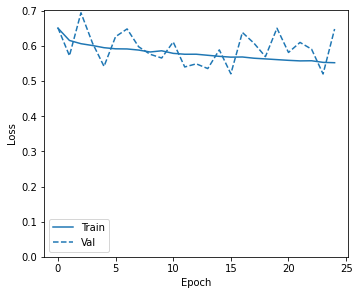

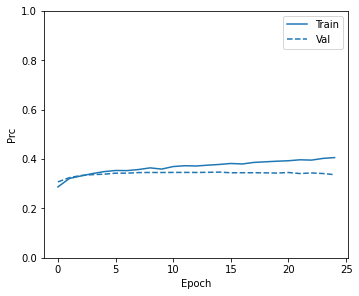

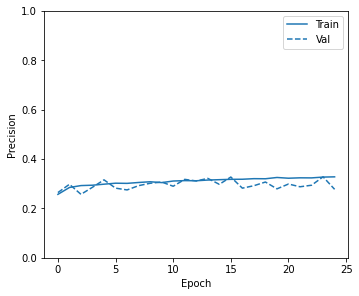

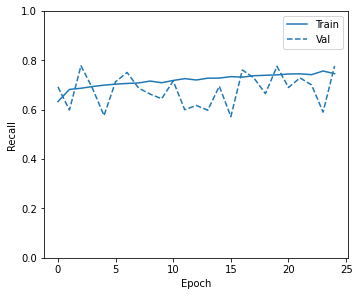

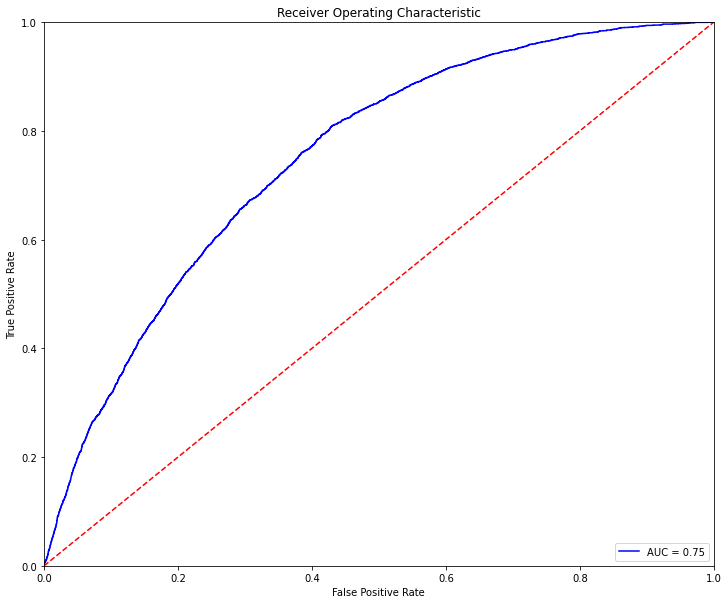

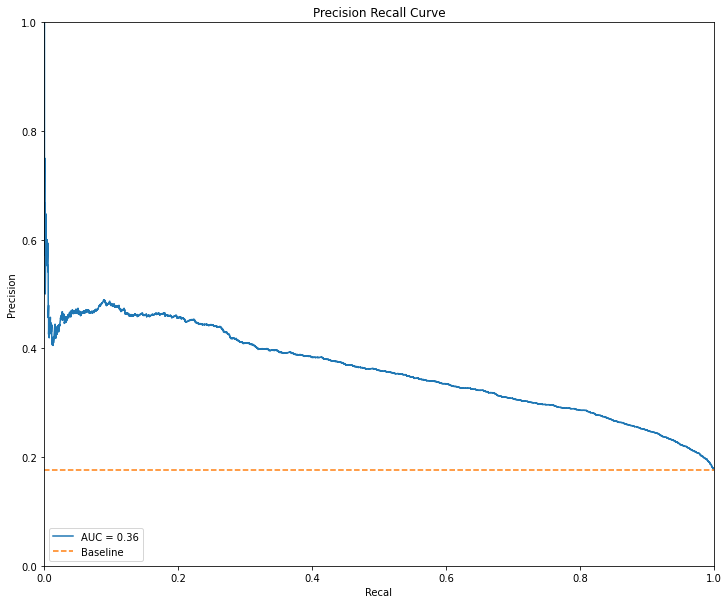

,threshold,tn,fp,fn,tp,f1,accuracy,precision,recall,auc
0,0.0,0,15979,0,3398,0.298397,0.175363,0.175363,1.000000,0.750229
1,0.1,1284,14695,18,3380,0.314814,0.240698,0.186999,0.994703,0.750229
2,0.2,3600,12379,97,3301,0.346053,0.356144,0.210523,0.971454,0.750229
3,0.3,6042,9937,267,3131,0.380299,0.473396,0.239593,0.921424,0.750229
4,0.4,8475,7504,562,2836,0.412869,0.583733,0.274275,0.834609,0.750229
5,0.5,10654,5325,1023,2375,0.428005,0.672395,0.308442,0.698941,0.750229
6,0.6,12644,3335,1583,1815,0.424661,0.746194,0.352427,0.534138,0.750229
7,0.7,14333,1646,2307,1091,0.355664,0.795995,0.398612,0.321071,0.750229
8,0.8,15528,451,2992,406,0.190834,0.822315,0.473746,0.119482,0.750229
9,0.9,15945,34,3372,26,0.015038,0.824225,0.433333,0.007652,0.750229


Model: "sequential_25"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_49 (Dense)             (None, 32)                16640     
_________________________________________________________________
activation_25 (Activation)   (None, 32)                0         
_________________________________________________________________
dense_50 (Dense)             (None, 1)                 33        
Total params: 16,673
Trainable params: 16,673
Non-trainable params: 0
_________________________________________________________________


None

Epoch 1/100
21/21 [==============================] - 3s 64ms/step - loss: 0.6897 - tp: 5480.0909 - fp: 7976.3182 - tn: 10780.4091 - fn: 2960.0000 - accuracy: 0.5985 - precision: 0.3948 - recall: 0.6574 - auc: 0.6561 - prc: 0.3875 - val_loss: 0.6644 - val_tp: 1747.0000 - val_fp: 5221.0000 - val_tn: 7690.0000 - val_fn: 843.0000 - val_accuracy: 0.6088 - val_precision: 0.2507 - val_recall: 0.6745 - val_auc: 0.6773 - val_prc: 0.2774
Epoch 2/100
21/21 [==============================] - 0s 13ms/step - loss: 0.6367 - tp: 3786.0455 - fp: 2023.9091 - tn: 3826.9545 - fn: 2058.9091 - accuracy: 0.6494 - precision: 0.6524 - recall: 0.6460 - auc: 0.6941 - prc: 0.6670 - val_loss: 0.6007 - val_tp: 1550.0000 - val_fp: 4005.0000 - val_tn: 8906.0000 - val_fn: 1040.0000 - val_accuracy: 0.6745 - val_precision: 0.2790 - val_recall: 0.5985 - val_auc: 0.6966 - val_prc: 0.2977
Epoch 3/100
21/21 [==============================] - 0s 12ms/step - loss: 0.6257 - tp: 3914.8182 - fp: 2054.9091 - tn: 3796.4545 - fn: 1

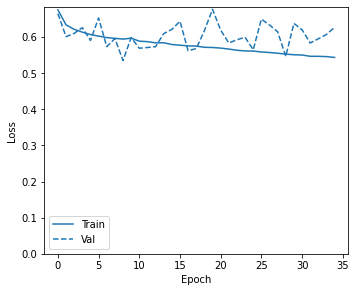

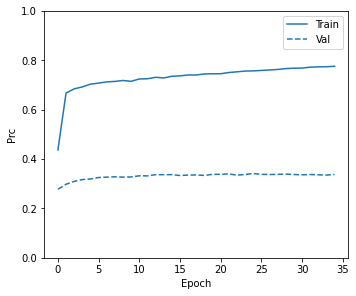

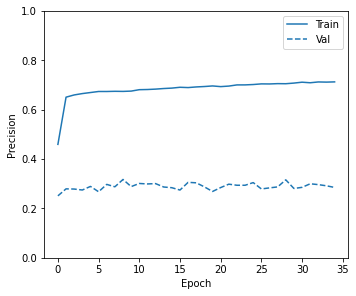

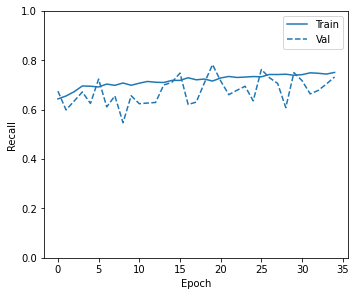

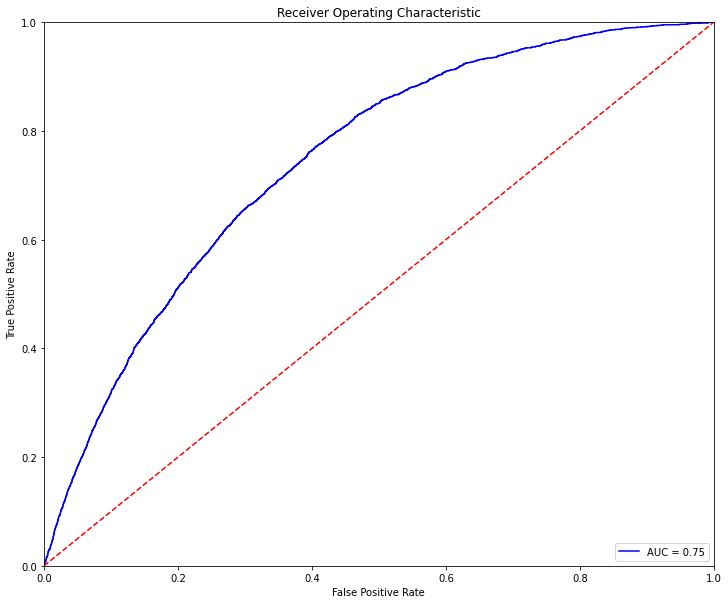

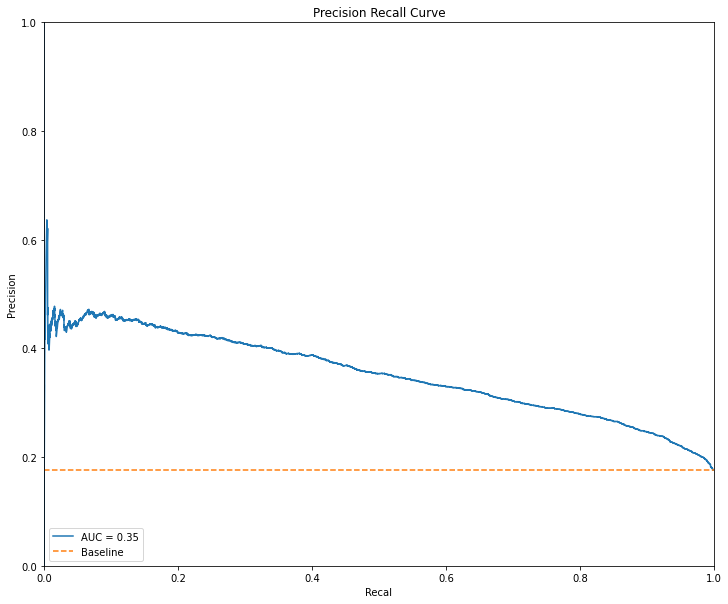

,threshold,tn,fp,fn,tp,f1,accuracy,precision,recall,auc
0,0.0,0,15979,0,3398,0.298397,0.175363,0.175363,1.000000,0.745038
1,0.1,1398,14581,22,3376,0.316179,0.246375,0.188005,0.993526,0.745038
2,0.2,3995,11984,132,3266,0.350279,0.374723,0.214164,0.961154,0.745038
3,0.3,6666,9313,344,3054,0.387441,0.501626,0.246948,0.898764,0.745038
4,0.4,9187,6792,721,2677,0.416103,0.612272,0.282712,0.787816,0.745038
5,0.5,11299,4680,1195,2203,0.428558,0.696805,0.320064,0.648323,0.745038
6,0.6,13135,2844,1797,1601,0.408262,0.760489,0.360180,0.471160,0.745038
7,0.7,14654,1325,2459,939,0.331685,0.804717,0.414753,0.276339,0.745038
8,0.8,15583,396,3063,335,0.162267,0.821489,0.458276,0.098587,0.745038
9,0.9,15948,31,3375,23,0.013326,0.824225,0.425926,0.006769,0.745038


Model: "sequential_26"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_51 (Dense)             (None, 32)                16640     
_________________________________________________________________
activation_26 (Activation)   (None, 32)                0         
_________________________________________________________________
dense_52 (Dense)             (None, 1)                 33        
Total params: 16,673
Trainable params: 16,673
Non-trainable params: 0
_________________________________________________________________


None

Epoch 1/100
101/101 [==============================] - 4s 19ms/step - loss: 0.6613 - tp: 18740.1471 - fp: 15263.7059 - tn: 23991.5882 - fn: 10220.6961 - accuracy: 0.6216 - precision: 0.5209 - recall: 0.6443 - auc: 0.6704 - prc: 0.5169 - val_loss: 0.6133 - val_tp: 1686.0000 - val_fp: 4413.0000 - val_tn: 8498.0000 - val_fn: 904.0000 - val_accuracy: 0.6570 - val_precision: 0.2764 - val_recall: 0.6510 - val_auc: 0.7134 - val_prc: 0.3201
Epoch 2/100
101/101 [==============================] - 1s 9ms/step - loss: 0.6070 - tp: 18329.6275 - fp: 9177.1373 - tn: 17142.0490 - fn: 8066.3235 - accuracy: 0.6722 - precision: 0.6664 - recall: 0.6929 - auc: 0.7301 - prc: 0.7005 - val_loss: 0.6169 - val_tp: 1776.0000 - val_fp: 4604.0000 - val_tn: 8307.0000 - val_fn: 814.0000 - val_accuracy: 0.6505 - val_precision: 0.2784 - val_recall: 0.6857 - val_auc: 0.7288 - val_prc: 0.3343
Epoch 3/100
101/101 [==============================] - 1s 9ms/step - loss: 0.5942 - tp: 18649.8824 - fp: 9029.5882 - tn: 17300.54

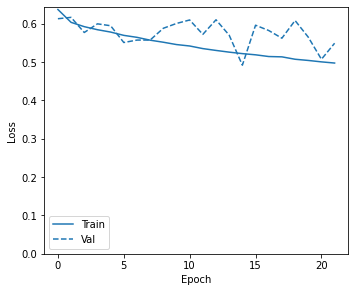

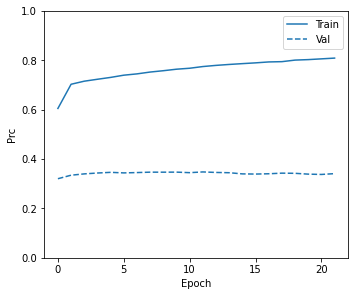

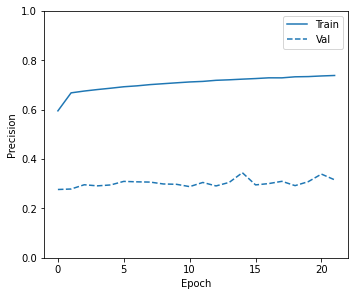

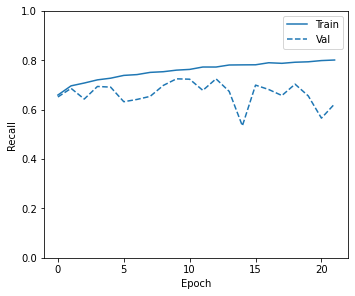

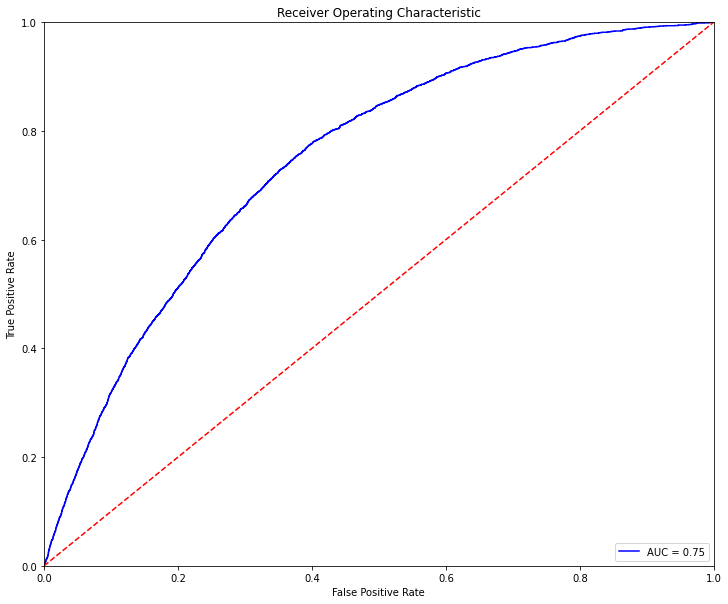

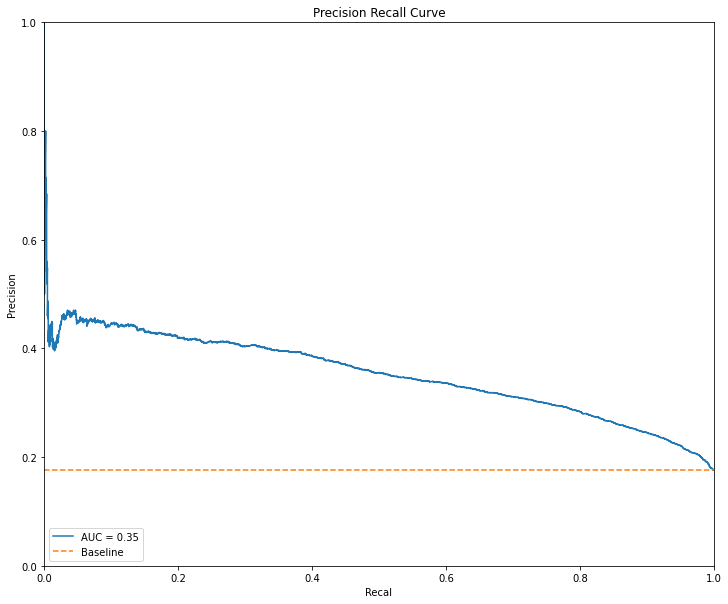

,threshold,tn,fp,fn,tp,f1,accuracy,precision,recall,auc
0,0.0,0,15979,0,3398,0.298397,0.175363,0.175363,1.000000,0.746186
1,0.1,2481,13498,60,3338,0.329940,0.300304,0.198266,0.982343,0.746186
2,0.2,4925,11054,196,3202,0.362751,0.419415,0.224607,0.942319,0.746186
3,0.3,7084,8895,400,2998,0.392126,0.520308,0.252081,0.882284,0.746186
4,0.4,9119,6860,681,2717,0.418805,0.610827,0.283701,0.799588,0.746186
5,0.5,10936,5043,1077,2321,0.431332,0.684162,0.315182,0.683049,0.746186
6,0.6,12586,3393,1598,1800,0.419043,0.742427,0.346620,0.529723,0.746186
7,0.7,14111,1868,2176,1222,0.376695,0.791299,0.395469,0.359623,0.746186
8,0.8,15302,677,2886,512,0.223240,0.816122,0.430614,0.150677,0.746186
9,0.9,15904,75,3347,51,0.028944,0.823399,0.404762,0.015009,0.746186


Number of units: 128
Model: "sequential_27"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_53 (Dense)             (None, 128)               66560     
_________________________________________________________________
activation_27 (Activation)   (None, 128)               0         
_________________________________________________________________
dense_54 (Dense)             (None, 1)                 129       
Total params: 66,689
Trainable params: 66,689
Non-trainable params: 0
_________________________________________________________________


None

Model: "sequential_28"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_55 (Dense)             (None, 128)               66560     
_________________________________________________________________
activation_28 (Activation)   (None, 128)               0         
_________________________________________________________________
dense_56 (Dense)             (None, 1)                 129       
Total params: 66,689
Trainable params: 66,689
Non-trainable params: 0
_________________________________________________________________


None

Epoch 1/100
61/61 [==============================] - 4s 28ms/step - loss: 0.6814 - tp: 5000.4355 - fp: 14486.7419 - tn: 25140.9032 - fn: 3097.5323 - accuracy: 0.6344 - precision: 0.2578 - recall: 0.6129 - auc: 0.6757 - prc: 0.2849 - val_loss: 0.6557 - val_tp: 1836.0000 - val_fp: 5161.0000 - val_tn: 7750.0000 - val_fn: 754.0000 - val_accuracy: 0.6184 - val_precision: 0.2624 - val_recall: 0.7089 - val_auc: 0.7104 - val_prc: 0.3198
Epoch 2/100
61/61 [==============================] - 1s 10ms/step - loss: 0.6154 - tp: 3786.9355 - fp: 9521.5000 - tn: 17202.2097 - fn: 1713.9677 - accuracy: 0.6478 - precision: 0.2836 - recall: 0.6915 - auc: 0.7194 - prc: 0.3229 - val_loss: 0.5612 - val_tp: 1542.0000 - val_fp: 3564.0000 - val_tn: 9347.0000 - val_fn: 1048.0000 - val_accuracy: 0.7025 - val_precision: 0.3020 - val_recall: 0.5954 - val_auc: 0.7258 - val_prc: 0.3309
Epoch 3/100
61/61 [==============================] - 1s 10ms/step - loss: 0.6002 - tp: 3801.3548 - fp: 9147.3226 - tn: 17589.9677 - fn

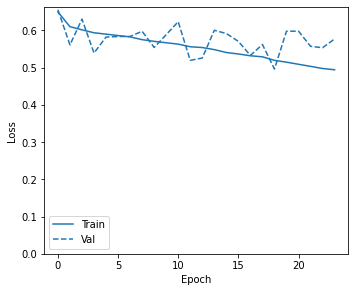

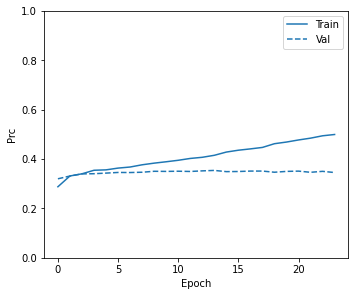

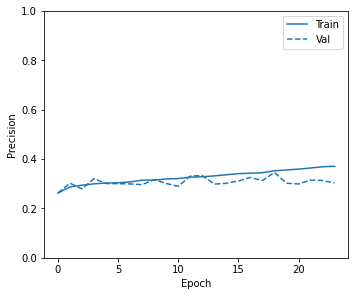

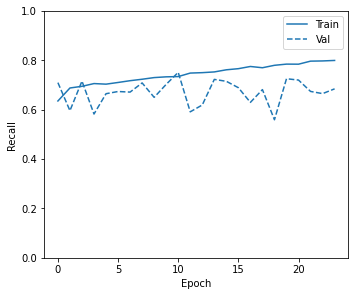

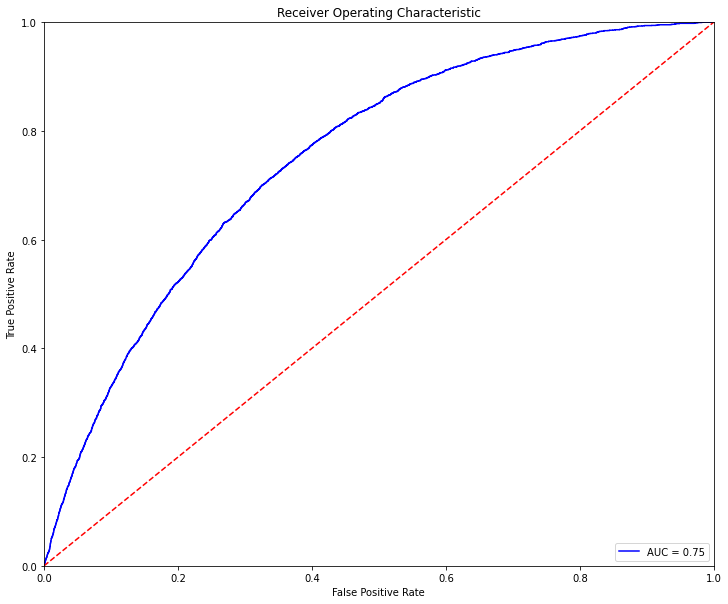

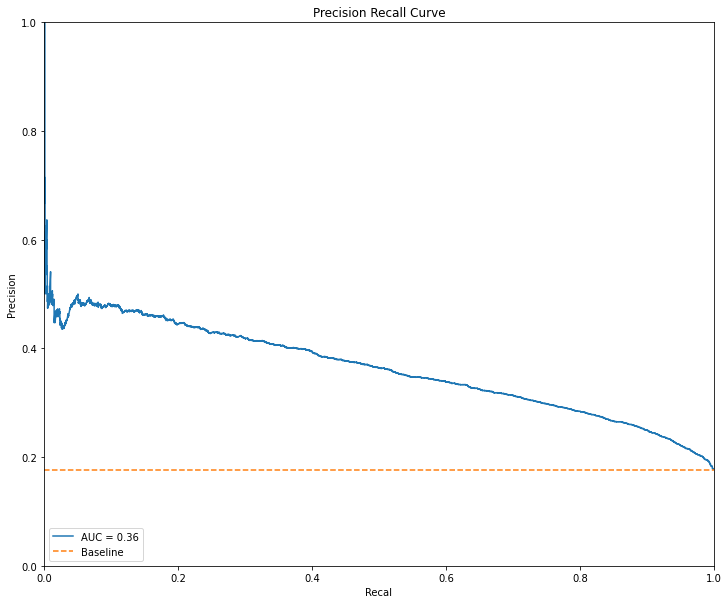

,threshold,tn,fp,fn,tp,f1,accuracy,precision,recall,auc
0,0.0,0,15979,0,3398,0.298397,0.175363,0.175363,1.000000,0.751299
1,0.1,1658,14321,23,3375,0.319996,0.259741,0.190721,0.993231,0.751299
2,0.2,3950,12029,121,3277,0.350406,0.372968,0.214099,0.964391,0.751299
3,0.3,6201,9778,282,3116,0.382519,0.480828,0.241663,0.917010,0.751299
4,0.4,8437,7542,564,2834,0.411500,0.581669,0.273130,0.834020,0.751299
5,0.5,10456,5523,954,2444,0.430092,0.665738,0.306765,0.719247,0.751299
6,0.6,12333,3646,1471,1927,0.429607,0.735924,0.345774,0.567098,0.751299
7,0.7,13985,1994,2076,1322,0.393804,0.789957,0.398673,0.389052,0.751299
8,0.8,15312,667,2832,566,0.244440,0.819425,0.459043,0.166569,0.751299
9,0.9,15933,46,3355,43,0.024663,0.824483,0.483146,0.012655,0.751299


Model: "sequential_29"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_57 (Dense)             (None, 128)               66560     
_________________________________________________________________
activation_29 (Activation)   (None, 128)               0         
_________________________________________________________________
dense_58 (Dense)             (None, 1)                 129       
Total params: 66,689
Trainable params: 66,689
Non-trainable params: 0
_________________________________________________________________


None

Epoch 1/100
21/21 [==============================] - 3s 64ms/step - loss: 0.6969 - tp: 5060.4091 - fp: 6643.1364 - tn: 12113.5909 - fn: 3379.6818 - accuracy: 0.6345 - precision: 0.4189 - recall: 0.6022 - auc: 0.6865 - prc: 0.4242 - val_loss: 0.6856 - val_tp: 1889.0000 - val_fp: 5845.0000 - val_tn: 7066.0000 - val_fn: 701.0000 - val_accuracy: 0.5777 - val_precision: 0.2442 - val_recall: 0.7293 - val_auc: 0.6865 - val_prc: 0.2920
Epoch 2/100
21/21 [==============================] - 0s 13ms/step - loss: 0.6329 - tp: 4002.4545 - fp: 2273.0909 - tn: 3577.7727 - fn: 1842.5000 - accuracy: 0.6446 - precision: 0.6329 - recall: 0.6994 - auc: 0.6987 - prc: 0.6731 - val_loss: 0.6484 - val_tp: 1772.0000 - val_fp: 4966.0000 - val_tn: 7945.0000 - val_fn: 818.0000 - val_accuracy: 0.6269 - val_precision: 0.2630 - val_recall: 0.6842 - val_auc: 0.7026 - val_prc: 0.3107
Epoch 3/100
21/21 [==============================] - 0s 13ms/step - loss: 0.6196 - tp: 3971.1364 - fp: 2081.6364 - tn: 3769.7273 - fn: 18

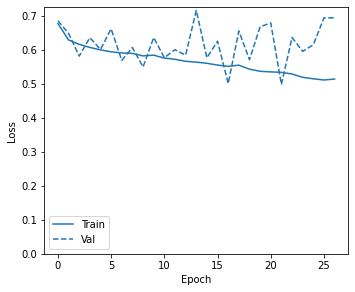

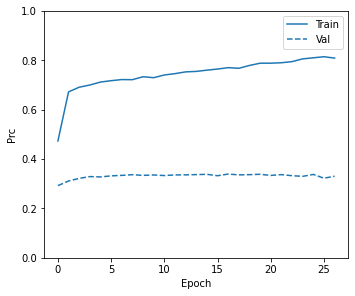

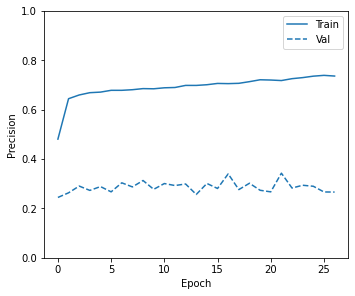

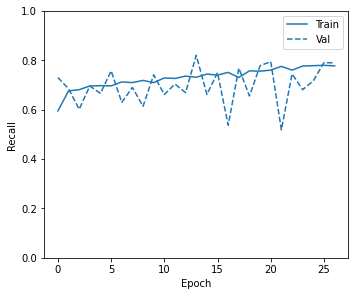

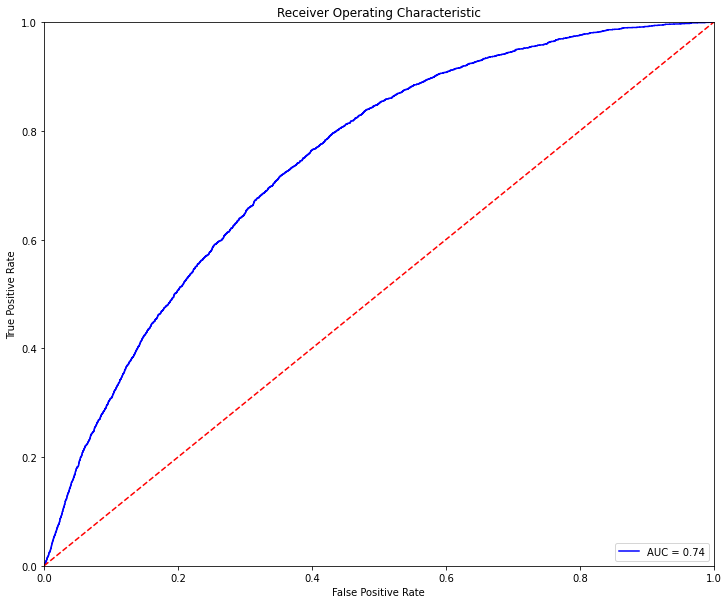

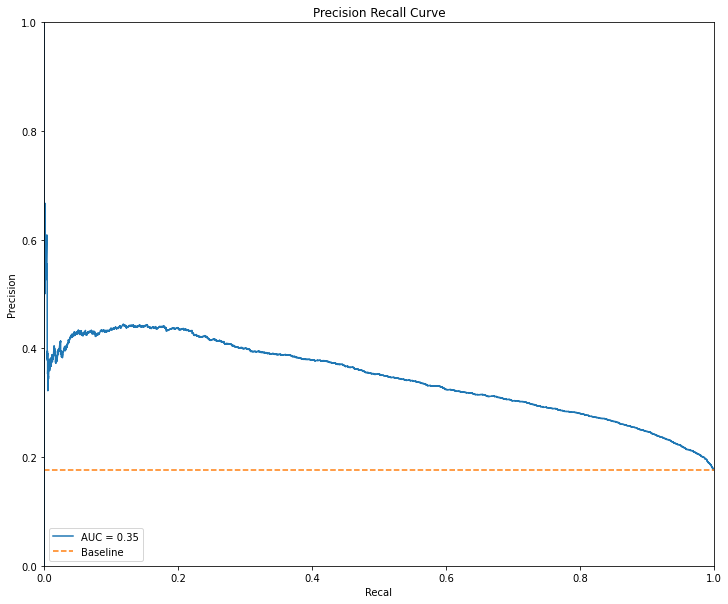

,threshold,tn,fp,fn,tp,f1,accuracy,precision,recall,auc
0,0.0,0,15979,0,3398,0.298397,0.175363,0.175363,1.000000,0.744001
1,0.1,2572,13407,52,3346,0.332093,0.305414,0.199725,0.984697,0.744001
2,0.2,5642,10337,245,3153,0.373401,0.453889,0.233729,0.927899,0.744001
3,0.3,8499,7480,593,2805,0.409998,0.583372,0.272727,0.825486,0.744001
4,0.4,10703,5276,1063,2335,0.424198,0.672860,0.306793,0.687169,0.744001
5,0.5,12547,3432,1597,1801,0.417333,0.740466,0.344162,0.530018,0.744001
6,0.6,14093,1886,2199,1199,0.369890,0.789183,0.388655,0.352855,0.744001
7,0.7,15215,764,2799,599,0.251628,0.816122,0.439472,0.176280,0.744001
8,0.8,15779,200,3250,148,0.079018,0.821954,0.425287,0.043555,0.744001
9,0.9,15970,9,3384,14,0.008185,0.824895,0.608696,0.004120,0.744001


Model: "sequential_30"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_59 (Dense)             (None, 128)               66560     
_________________________________________________________________
activation_30 (Activation)   (None, 128)               0         
_________________________________________________________________
dense_60 (Dense)             (None, 1)                 129       
Total params: 66,689
Trainable params: 66,689
Non-trainable params: 0
_________________________________________________________________


None

Epoch 1/100
101/101 [==============================] - 4s 20ms/step - loss: 0.6520 - tp: 19165.6961 - fp: 15615.1176 - tn: 23640.1765 - fn: 9795.1471 - accuracy: 0.6192 - precision: 0.5191 - recall: 0.6593 - auc: 0.6706 - prc: 0.5165 - val_loss: 0.5726 - val_tp: 1573.0000 - val_fp: 3715.0000 - val_tn: 9196.0000 - val_fn: 1017.0000 - val_accuracy: 0.6947 - val_precision: 0.2975 - val_recall: 0.6073 - val_auc: 0.7265 - val_prc: 0.3310
Epoch 2/100
101/101 [==============================] - 1s 9ms/step - loss: 0.5966 - tp: 18511.8725 - fp: 8975.9412 - tn: 17343.2451 - fn: 7884.0784 - accuracy: 0.6782 - precision: 0.6726 - recall: 0.6978 - auc: 0.7420 - prc: 0.7123 - val_loss: 0.6162 - val_tp: 1807.0000 - val_fp: 4515.0000 - val_tn: 8396.0000 - val_fn: 783.0000 - val_accuracy: 0.6582 - val_precision: 0.2858 - val_recall: 0.6977 - val_auc: 0.7386 - val_prc: 0.3414
Epoch 3/100
101/101 [==============================] - 1s 10ms/step - loss: 0.5816 - tp: 19034.6667 - fp: 8683.7059 - tn: 17646.4

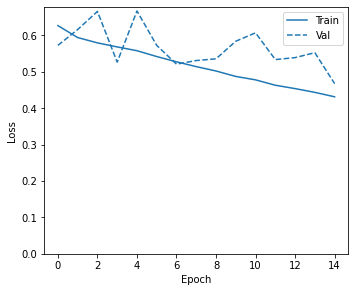

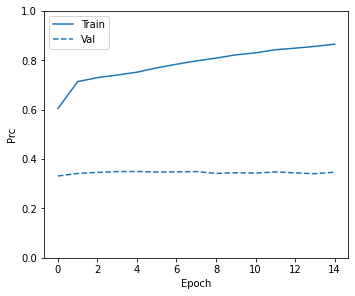

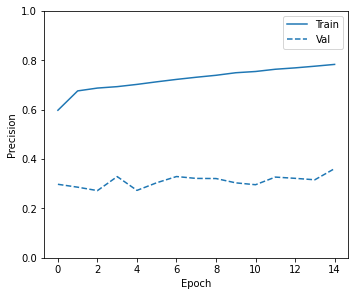

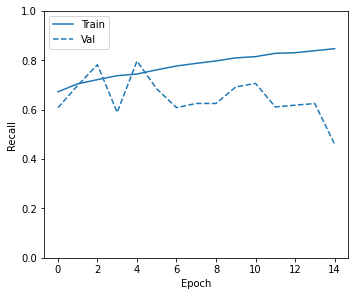

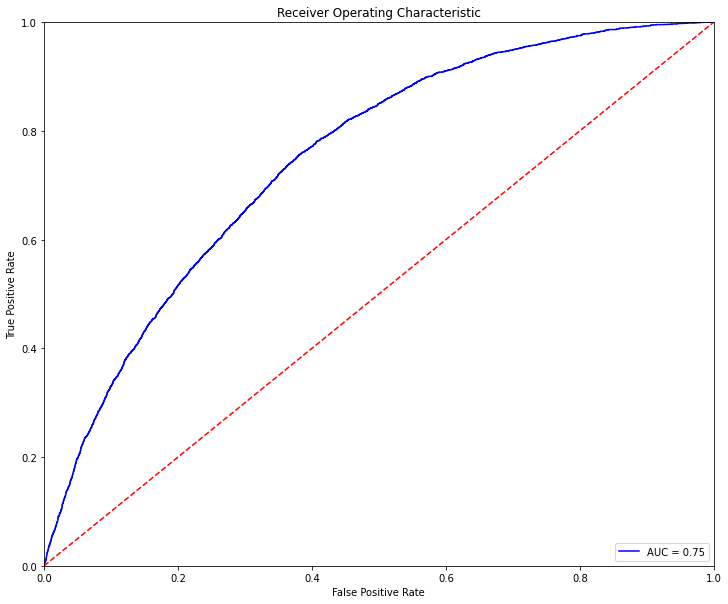

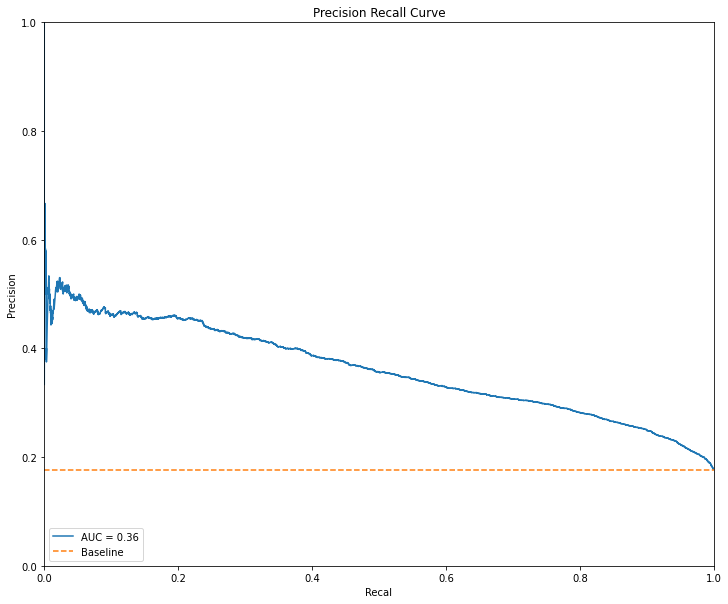

,threshold,tn,fp,fn,tp,f1,accuracy,precision,recall,auc
0,0.0,0,15979,0,3398,0.298397,0.175363,0.175363,1.000000,0.748893
1,0.1,831,15148,8,3390,0.309081,0.217836,0.182868,0.997646,0.748893
2,0.2,2675,13304,57,3341,0.333383,0.310471,0.200721,0.983225,0.748893
3,0.3,4720,11259,168,3230,0.361156,0.410280,0.222928,0.950559,0.748893
4,0.4,6929,9050,354,3044,0.392977,0.514682,0.251695,0.895821,0.748893
5,0.5,9230,6749,710,2688,0.418855,0.615059,0.284836,0.791054,0.748893
6,0.6,11322,4657,1220,2178,0.425682,0.696702,0.318654,0.640965,0.748893
7,0.7,13362,2617,1853,1545,0.408730,0.769314,0.371216,0.454679,0.748893
8,0.8,15116,863,2686,712,0.286346,0.816845,0.452063,0.209535,0.748893
9,0.9,15922,57,3343,55,0.031339,0.824534,0.491071,0.016186,0.748893


Number of units: 256
Model: "sequential_31"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_61 (Dense)             (None, 256)               133120    
_________________________________________________________________
activation_31 (Activation)   (None, 256)               0         
_________________________________________________________________
dense_62 (Dense)             (None, 1)                 257       
Total params: 133,377
Trainable params: 133,377
Non-trainable params: 0
_________________________________________________________________


None

Model: "sequential_32"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_63 (Dense)             (None, 256)               133120    
_________________________________________________________________
activation_32 (Activation)   (None, 256)               0         
_________________________________________________________________
dense_64 (Dense)             (None, 1)                 257       
Total params: 133,377
Trainable params: 133,377
Non-trainable params: 0
_________________________________________________________________


None

Epoch 1/100
61/61 [==============================] - 4s 27ms/step - loss: 0.6828 - tp: 4611.0161 - fp: 13149.7258 - tn: 26477.9194 - fn: 3486.9516 - accuracy: 0.6571 - precision: 0.2612 - recall: 0.5536 - auc: 0.6695 - prc: 0.2826 - val_loss: 0.6409 - val_tp: 1796.0000 - val_fp: 4953.0000 - val_tn: 7958.0000 - val_fn: 794.0000 - val_accuracy: 0.6292 - val_precision: 0.2661 - val_recall: 0.6934 - val_auc: 0.7120 - val_prc: 0.3170
Epoch 2/100
61/61 [==============================] - 1s 10ms/step - loss: 0.6140 - tp: 3776.2742 - fp: 9460.4839 - tn: 17263.2258 - fn: 1724.6290 - accuracy: 0.6498 - precision: 0.2845 - recall: 0.6892 - auc: 0.7214 - prc: 0.3213 - val_loss: 0.5412 - val_tp: 1444.0000 - val_fp: 3206.0000 - val_tn: 9705.0000 - val_fn: 1146.0000 - val_accuracy: 0.7192 - val_precision: 0.3105 - val_recall: 0.5575 - val_auc: 0.7273 - val_prc: 0.3315
Epoch 3/100
61/61 [==============================] - 1s 10ms/step - loss: 0.5984 - tp: 3841.0323 - fp: 9092.9839 - tn: 17644.3065 - fn

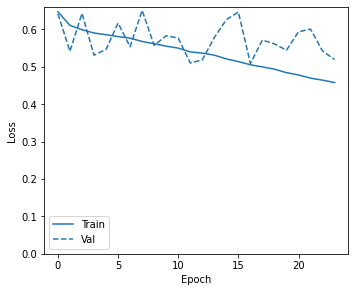

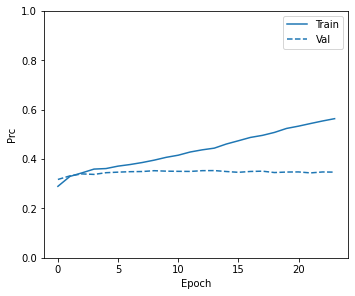

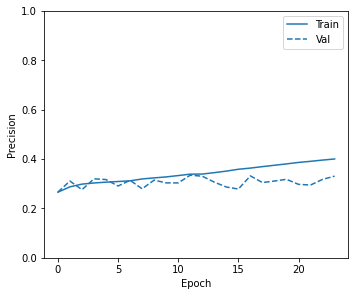

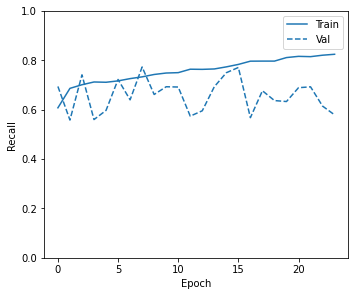

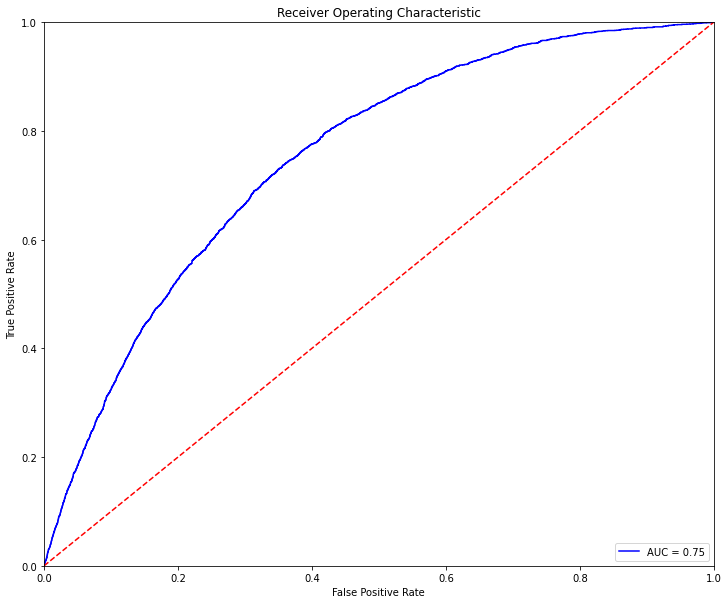

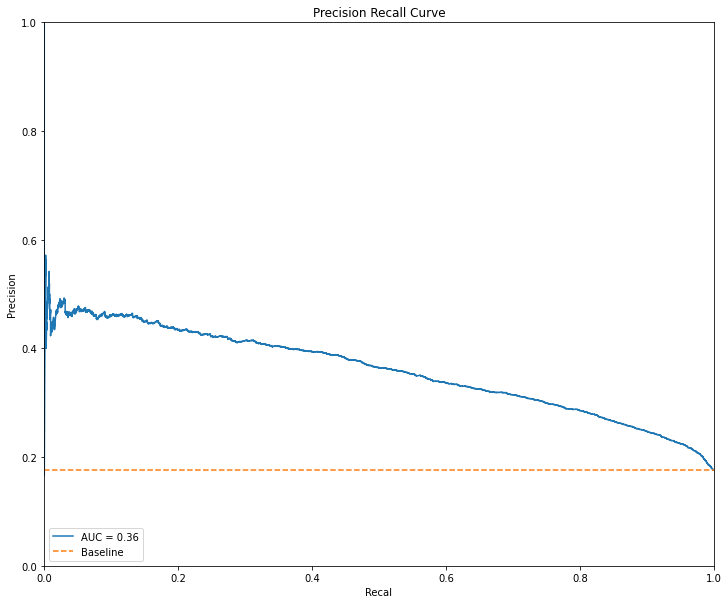

,threshold,tn,fp,fn,tp,f1,accuracy,precision,recall,auc
0,0.0,0,15979,0,3398,0.298397,0.175363,0.175363,1.000000,0.75121
1,0.1,2023,13956,42,3356,0.324095,0.277597,0.193854,0.987640,0.75121
2,0.2,4390,11589,135,3263,0.357589,0.394953,0.219701,0.960271,0.75121
3,0.3,6665,9314,338,3060,0.388029,0.501884,0.247293,0.900530,0.75121
4,0.4,8825,7154,621,2777,0.416685,0.598751,0.279629,0.817245,0.75121
5,0.5,10876,5103,1041,2357,0.434150,0.682923,0.315952,0.693643,0.75121
6,0.6,12695,3284,1572,1826,0.429243,0.749394,0.357339,0.537375,0.75121
7,0.7,14241,1738,2217,1181,0.373912,0.795892,0.404591,0.347557,0.75121
8,0.8,15403,576,2915,483,0.216738,0.819838,0.456091,0.142142,0.75121
9,0.9,15937,42,3365,33,0.019004,0.824173,0.440000,0.009712,0.75121


Model: "sequential_33"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_65 (Dense)             (None, 256)               133120    
_________________________________________________________________
activation_33 (Activation)   (None, 256)               0         
_________________________________________________________________
dense_66 (Dense)             (None, 1)                 257       
Total params: 133,377
Trainable params: 133,377
Non-trainable params: 0
_________________________________________________________________


None

Epoch 1/100
21/21 [==============================] - 3s 67ms/step - loss: 0.7404 - tp: 4703.0000 - fp: 5871.5455 - tn: 12885.1818 - fn: 3737.0909 - accuracy: 0.6524 - precision: 0.4316 - recall: 0.5557 - auc: 0.6917 - prc: 0.4344 - val_loss: 0.5793 - val_tp: 1213.0000 - val_fp: 2955.0000 - val_tn: 9956.0000 - val_fn: 1377.0000 - val_accuracy: 0.7205 - val_precision: 0.2910 - val_recall: 0.4683 - val_auc: 0.6783 - val_prc: 0.2817
Epoch 2/100
21/21 [==============================] - 0s 15ms/step - loss: 0.6382 - tp: 3701.7273 - fp: 1980.1818 - tn: 3870.6818 - fn: 2143.2273 - accuracy: 0.6438 - precision: 0.6592 - recall: 0.6073 - auc: 0.6944 - prc: 0.6686 - val_loss: 0.6045 - val_tp: 1584.0000 - val_fp: 4178.0000 - val_tn: 8733.0000 - val_fn: 1006.0000 - val_accuracy: 0.6656 - val_precision: 0.2749 - val_recall: 0.6116 - val_auc: 0.6968 - val_prc: 0.3035
Epoch 3/100
21/21 [==============================] - 0s 15ms/step - loss: 0.6203 - tp: 3886.0455 - fp: 1997.6818 - tn: 3853.6818 - fn: 

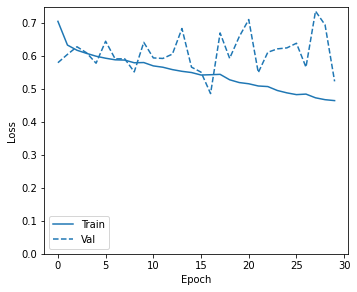

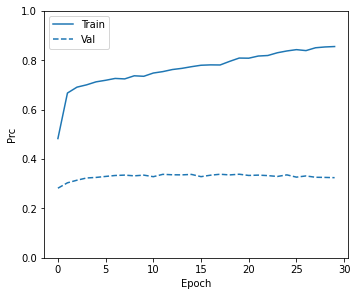

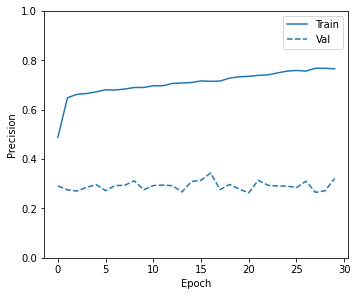

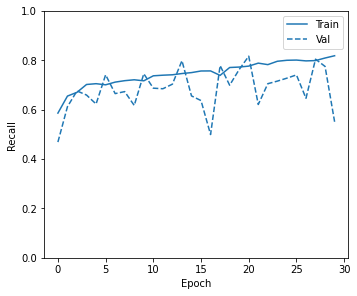

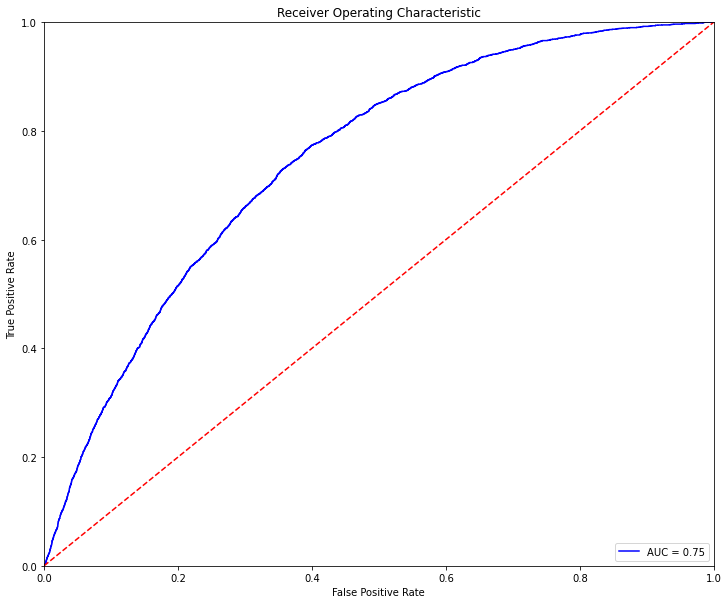

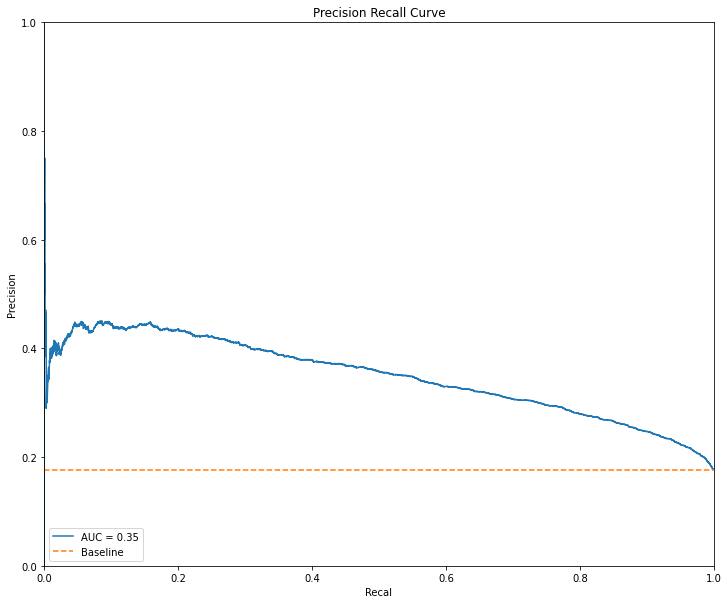

,threshold,tn,fp,fn,tp,f1,accuracy,precision,recall,auc
0,0.0,0,15979,0,3398,0.298397,0.175363,0.175363,1.000000,0.74675
1,0.1,1288,14691,18,3380,0.314873,0.240904,0.187040,0.994703,0.74675
2,0.2,3319,12660,84,3314,0.342143,0.342313,0.207462,0.975280,0.74675
3,0.3,5433,10546,214,3184,0.371789,0.444702,0.231901,0.937022,0.74675
4,0.4,7610,8369,453,2945,0.400353,0.544718,0.260297,0.866686,0.74675
5,0.5,9644,6335,783,2615,0.423550,0.632657,0.292179,0.769570,0.74675
6,0.6,11535,4444,1259,2139,0.428614,0.705682,0.324928,0.629488,0.74675
7,0.7,13318,2661,1848,1550,0.407412,0.767301,0.368084,0.456151,0.74675
8,0.8,14885,1094,2598,800,0.302343,0.809465,0.422386,0.235433,0.74675
9,0.9,15796,183,3262,136,0.073177,0.822212,0.426332,0.040024,0.74675


Model: "sequential_34"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_67 (Dense)             (None, 256)               133120    
_________________________________________________________________
activation_34 (Activation)   (None, 256)               0         
_________________________________________________________________
dense_68 (Dense)             (None, 1)                 257       
Total params: 133,377
Trainable params: 133,377
Non-trainable params: 0
_________________________________________________________________


None

Epoch 1/100
101/101 [==============================] - 4s 20ms/step - loss: 0.6729 - tp: 18151.8137 - fp: 13562.7059 - tn: 25692.5882 - fn: 10809.0294 - accuracy: 0.6431 - precision: 0.5429 - recall: 0.6097 - auc: 0.6930 - prc: 0.5467 - val_loss: 0.5644 - val_tp: 1525.0000 - val_fp: 3605.0000 - val_tn: 9306.0000 - val_fn: 1065.0000 - val_accuracy: 0.6987 - val_precision: 0.2973 - val_recall: 0.5888 - val_auc: 0.7231 - val_prc: 0.3282
Epoch 2/100
101/101 [==============================] - 1s 11ms/step - loss: 0.5959 - tp: 18683.5490 - fp: 9017.8431 - tn: 17301.3431 - fn: 7712.4020 - accuracy: 0.6812 - precision: 0.6744 - recall: 0.7041 - auc: 0.7431 - prc: 0.7126 - val_loss: 0.6133 - val_tp: 1808.0000 - val_fp: 4523.0000 - val_tn: 8388.0000 - val_fn: 782.0000 - val_accuracy: 0.6578 - val_precision: 0.2856 - val_recall: 0.6981 - val_auc: 0.7372 - val_prc: 0.3431
Epoch 3/100
101/101 [==============================] - 1s 10ms/step - loss: 0.5781 - tp: 19215.5490 - fp: 8677.5980 - tn: 17652

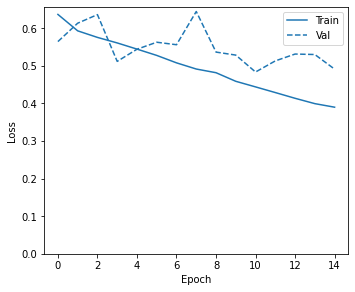

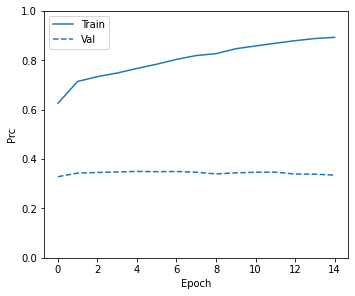

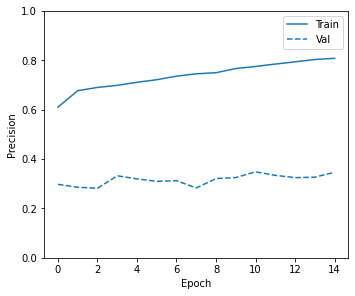

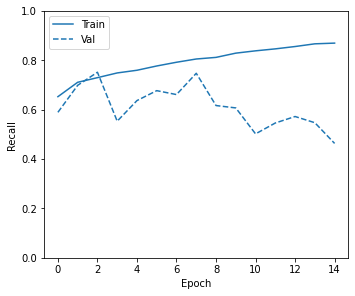

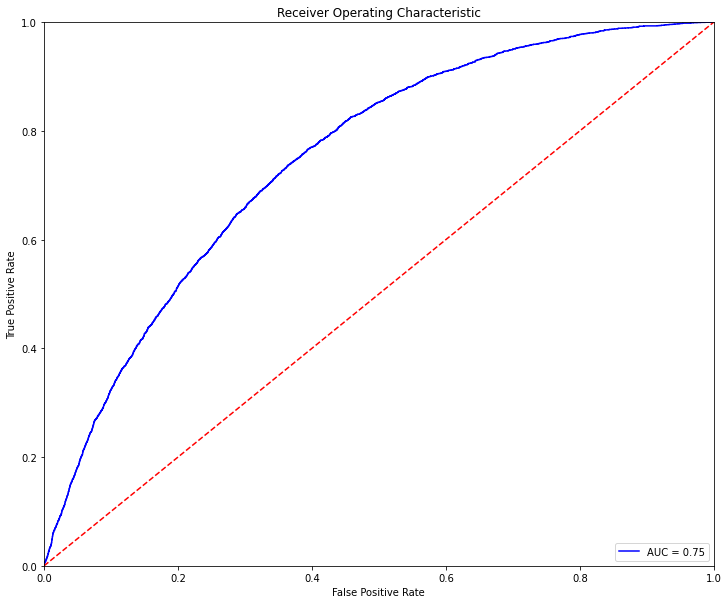

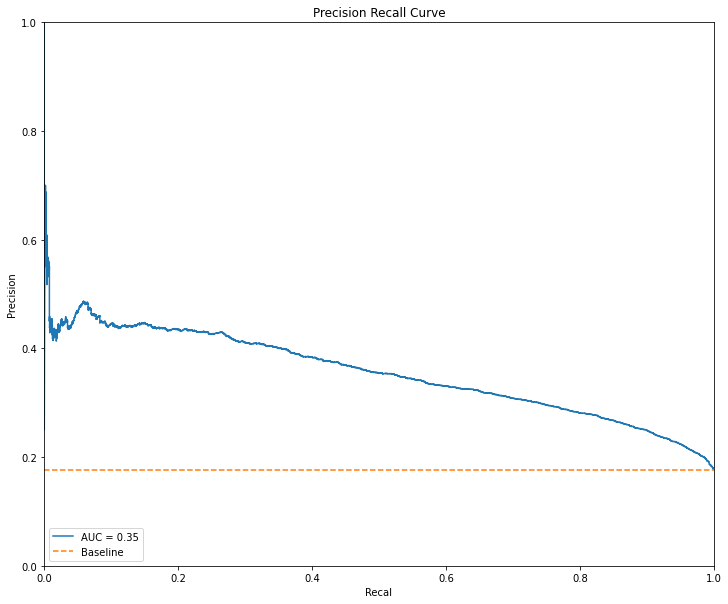

,threshold,tn,fp,fn,tp,f1,accuracy,precision,recall,auc
0,0.0,0,15979,0,3398,0.298397,0.175363,0.175363,1.000000,0.747859
1,0.1,2117,13862,37,3361,0.325978,0.282706,0.195146,0.989111,0.747859
2,0.2,4754,11225,167,3231,0.361936,0.412086,0.223506,0.950853,0.747859
3,0.3,7261,8718,405,2993,0.396188,0.529184,0.255572,0.880812,0.747859
4,0.4,9567,6412,779,2619,0.421434,0.628890,0.290001,0.770747,0.747859
5,0.5,11569,4410,1273,2125,0.427867,0.706714,0.325172,0.625368,0.747859
6,0.6,13299,2680,1842,1556,0.407650,0.766631,0.367328,0.457916,0.747859
7,0.7,14738,1241,2478,920,0.330995,0.808071,0.425729,0.270747,0.747859
8,0.8,15592,387,3086,312,0.152307,0.820767,0.446352,0.091819,0.747859
9,0.9,15953,26,3371,27,0.015648,0.824689,0.509434,0.007946,0.747859


Number of units: 512
Model: "sequential_35"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_69 (Dense)             (None, 512)               266240    
_________________________________________________________________
activation_35 (Activation)   (None, 512)               0         
_________________________________________________________________
dense_70 (Dense)             (None, 1)                 513       
Total params: 266,753
Trainable params: 266,753
Non-trainable params: 0
_________________________________________________________________


None

Model: "sequential_36"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_71 (Dense)             (None, 512)               266240    
_________________________________________________________________
activation_36 (Activation)   (None, 512)               0         
_________________________________________________________________
dense_72 (Dense)             (None, 1)                 513       
Total params: 266,753
Trainable params: 266,753
Non-trainable params: 0
_________________________________________________________________


None

Epoch 1/100
61/61 [==============================] - 4s 28ms/step - loss: 0.7068 - tp: 4566.3548 - fp: 13203.3710 - tn: 26424.2742 - fn: 3531.6129 - accuracy: 0.6557 - precision: 0.2594 - recall: 0.5494 - auc: 0.6621 - prc: 0.2657 - val_loss: 0.6578 - val_tp: 1845.0000 - val_fp: 5232.0000 - val_tn: 7679.0000 - val_fn: 745.0000 - val_accuracy: 0.6144 - val_precision: 0.2607 - val_recall: 0.7124 - val_auc: 0.7125 - val_prc: 0.3212
Epoch 2/100
61/61 [==============================] - 1s 12ms/step - loss: 0.6129 - tp: 3830.6452 - fp: 9434.8387 - tn: 17288.8710 - fn: 1670.2581 - accuracy: 0.6526 - precision: 0.2880 - recall: 0.6982 - auc: 0.7226 - prc: 0.3244 - val_loss: 0.5743 - val_tp: 1613.0000 - val_fp: 3849.0000 - val_tn: 9062.0000 - val_fn: 977.0000 - val_accuracy: 0.6887 - val_precision: 0.2953 - val_recall: 0.6228 - val_auc: 0.7283 - val_prc: 0.3333
Epoch 3/100
61/61 [==============================] - 1s 12ms/step - loss: 0.5978 - tp: 3844.7258 - fp: 9209.2581 - tn: 17528.0323 - fn:

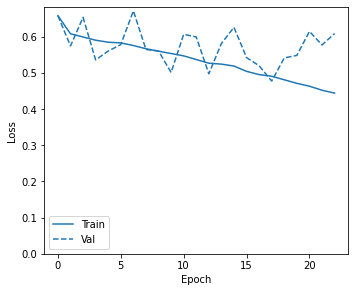

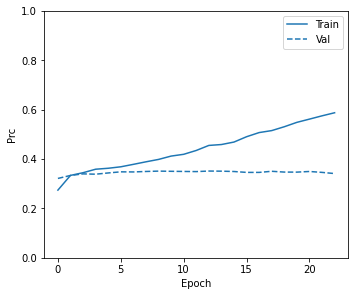

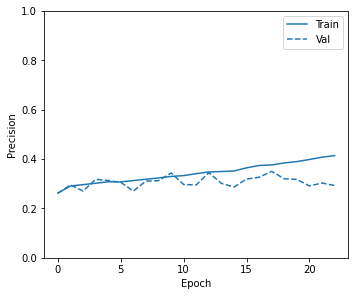

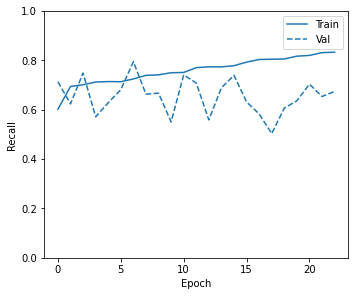

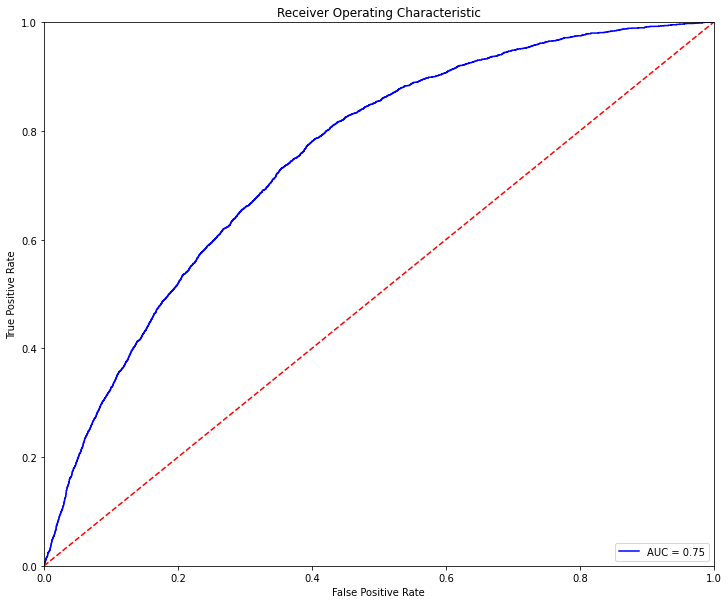

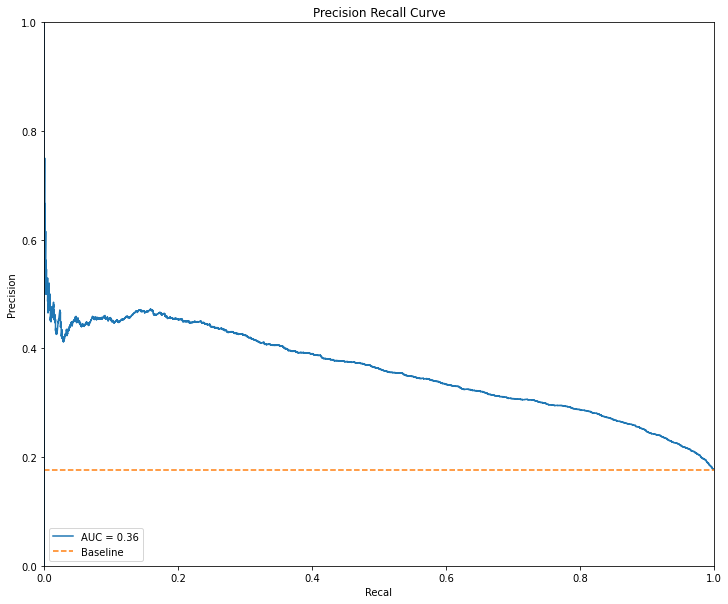

,threshold,tn,fp,fn,tp,f1,accuracy,precision,recall,auc
0,0.0,0,15979,0,3398,0.298397,0.175363,0.175363,1.000000,0.75041
1,0.1,3171,12808,84,3314,0.339549,0.334675,0.205558,0.975280,0.75041
2,0.2,6015,9964,270,3128,0.379381,0.471848,0.238925,0.920541,0.75041
3,0.3,8527,7452,567,2831,0.413859,0.586159,0.275309,0.833137,0.75041
4,0.4,10605,5374,1013,2385,0.427534,0.670382,0.307385,0.701883,0.75041
5,0.5,12481,3498,1527,1871,0.426828,0.740672,0.348482,0.550618,0.75041
6,0.6,14026,1953,2125,1273,0.384360,0.789544,0.394606,0.374632,0.75041
7,0.7,15170,809,2725,673,0.275820,0.817619,0.454116,0.198058,0.75041
8,0.8,15784,195,3236,162,0.086285,0.822934,0.453782,0.047675,0.75041
9,0.9,15974,5,3392,6,0.003520,0.824689,0.545455,0.001766,0.75041


Model: "sequential_37"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_73 (Dense)             (None, 512)               266240    
_________________________________________________________________
activation_37 (Activation)   (None, 512)               0         
_________________________________________________________________
dense_74 (Dense)             (None, 1)                 513       
Total params: 266,753
Trainable params: 266,753
Non-trainable params: 0
_________________________________________________________________


None

Epoch 1/100
21/21 [==============================] - 3s 68ms/step - loss: 0.7906 - tp: 4865.7273 - fp: 6824.2727 - tn: 11932.4545 - fn: 3574.3636 - accuracy: 0.6214 - precision: 0.4032 - recall: 0.5791 - auc: 0.6616 - prc: 0.4238 - val_loss: 0.5422 - val_tp: 1046.0000 - val_fp: 2429.0000 - val_tn: 10482.0000 - val_fn: 1544.0000 - val_accuracy: 0.7437 - val_precision: 0.3010 - val_recall: 0.4039 - val_auc: 0.6854 - val_prc: 0.2891
Epoch 2/100
21/21 [==============================] - 0s 15ms/step - loss: 0.6389 - tp: 3885.9545 - fp: 2168.7273 - tn: 3682.1364 - fn: 1959.0000 - accuracy: 0.6422 - precision: 0.6462 - recall: 0.6433 - auc: 0.6902 - prc: 0.6685 - val_loss: 0.6080 - val_tp: 1634.0000 - val_fp: 4252.0000 - val_tn: 8659.0000 - val_fn: 956.0000 - val_accuracy: 0.6640 - val_precision: 0.2776 - val_recall: 0.6309 - val_auc: 0.7012 - val_prc: 0.3093
Epoch 3/100
21/21 [==============================] - 0s 15ms/step - loss: 0.6193 - tp: 3902.9091 - fp: 2002.3182 - tn: 3849.0455 - fn: 

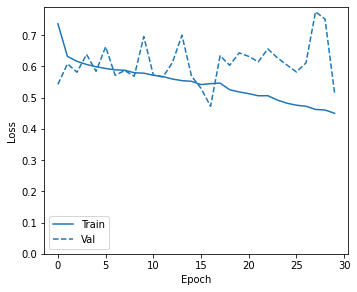

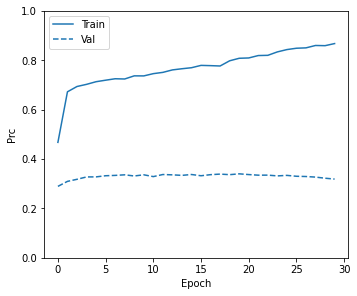

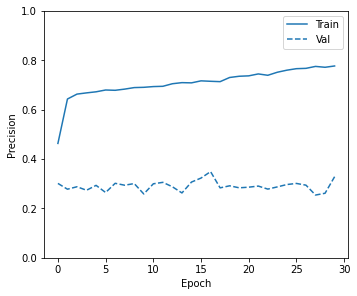

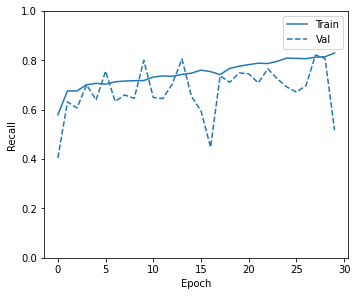

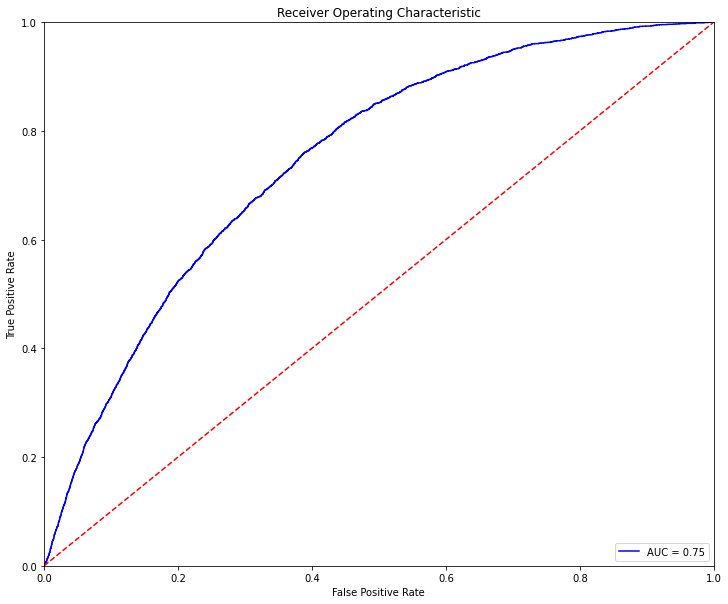

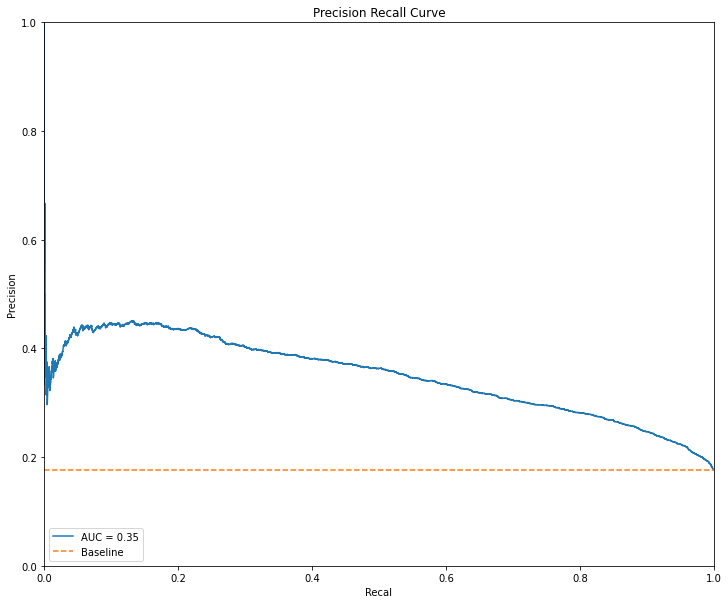

,threshold,tn,fp,fn,tp,f1,accuracy,precision,recall,auc
0,0.0,0,15979,0,3398,0.298397,0.175363,0.175363,1.000000,0.746728
1,0.1,1496,14483,23,3375,0.317557,0.251381,0.188991,0.993231,0.746728
2,0.2,3632,12347,113,3285,0.345244,0.356970,0.210146,0.966745,0.746728
3,0.3,5775,10204,253,3145,0.375590,0.460340,0.235598,0.925544,0.746728
4,0.4,7943,8036,500,2898,0.404410,0.559478,0.265045,0.852855,0.746728
5,0.5,9924,6055,862,2536,0.423054,0.643030,0.295193,0.746321,0.746728
6,0.6,11752,4227,1314,2084,0.429292,0.714042,0.330217,0.613302,0.746728
7,0.7,13501,2478,1915,1483,0.403044,0.773288,0.374400,0.436433,0.746728
8,0.8,14970,1009,2624,774,0.298784,0.812510,0.434100,0.227781,0.746728
9,0.9,15794,185,3264,134,0.072101,0.822005,0.420063,0.039435,0.746728


Model: "sequential_38"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_75 (Dense)             (None, 512)               266240    
_________________________________________________________________
activation_38 (Activation)   (None, 512)               0         
_________________________________________________________________
dense_76 (Dense)             (None, 1)                 513       
Total params: 266,753
Trainable params: 266,753
Non-trainable params: 0
_________________________________________________________________


None

Epoch 1/100
101/101 [==============================] - 4s 22ms/step - loss: 0.6702 - tp: 18406.6275 - fp: 12836.1863 - tn: 26419.1078 - fn: 10554.2157 - accuracy: 0.6585 - precision: 0.5604 - recall: 0.6155 - auc: 0.7075 - prc: 0.5619 - val_loss: 0.6012 - val_tp: 1729.0000 - val_fp: 4307.0000 - val_tn: 8604.0000 - val_fn: 861.0000 - val_accuracy: 0.6666 - val_precision: 0.2864 - val_recall: 0.6676 - val_auc: 0.7279 - val_prc: 0.3318
Epoch 2/100
101/101 [==============================] - 1s 11ms/step - loss: 0.5935 - tp: 18657.2255 - fp: 8951.5000 - tn: 17367.6863 - fn: 7738.7255 - accuracy: 0.6827 - precision: 0.6753 - recall: 0.7070 - auc: 0.7456 - prc: 0.7158 - val_loss: 0.5801 - val_tp: 1694.0000 - val_fp: 3947.0000 - val_tn: 8964.0000 - val_fn: 896.0000 - val_accuracy: 0.6876 - val_precision: 0.3003 - val_recall: 0.6541 - val_auc: 0.7389 - val_prc: 0.3439
Epoch 3/100
101/101 [==============================] - 1s 12ms/step - loss: 0.5758 - tp: 19199.8431 - fp: 8613.5980 - tn: 17716.

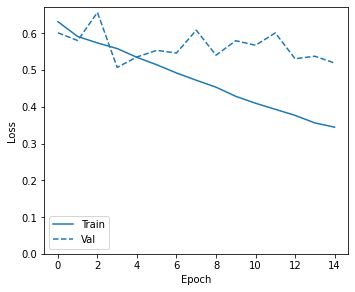

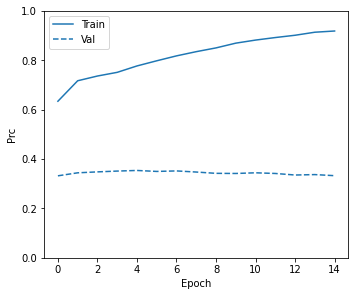

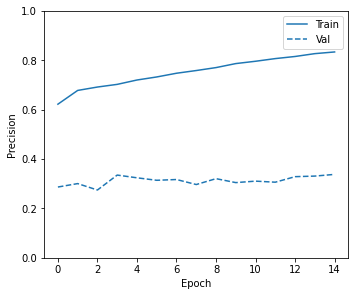

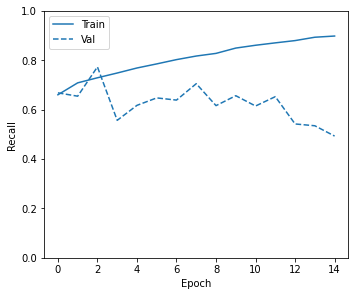

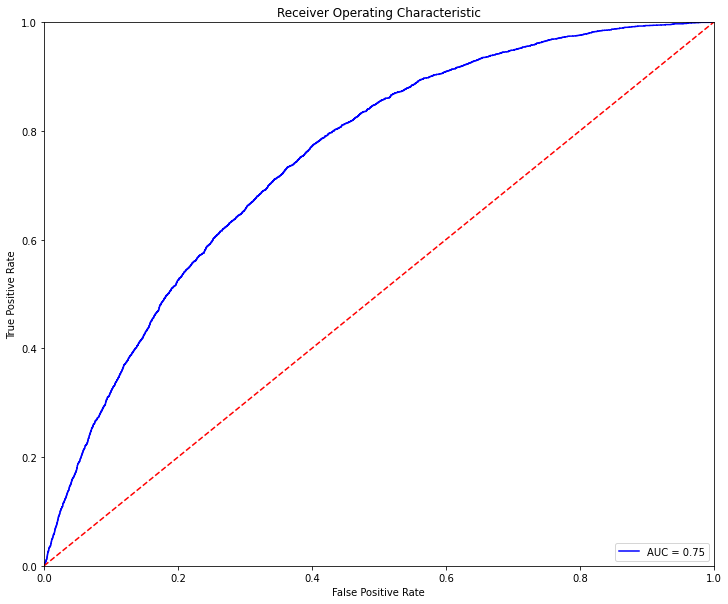

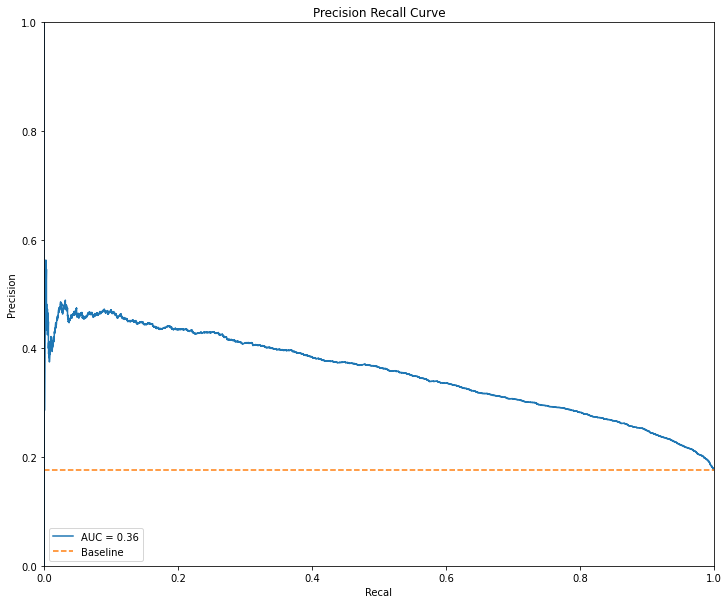

,threshold,tn,fp,fn,tp,f1,accuracy,precision,recall,auc
0,0.0,0,15979,0,3398,0.298397,0.175363,0.175363,1.000000,0.748781
1,0.1,2358,13621,42,3356,0.329423,0.294886,0.197679,0.987640,0.748781
2,0.2,5129,10850,197,3201,0.366898,0.429891,0.227813,0.942025,0.748781
3,0.3,7653,8326,449,2949,0.401963,0.547144,0.261552,0.867863,0.748781
4,0.4,9846,6133,842,2556,0.422934,0.640037,0.294165,0.752207,0.748781
5,0.5,11801,4178,1319,2079,0.430658,0.716313,0.332268,0.611830,0.748781
6,0.6,13413,2566,1867,1531,0.408539,0.771224,0.373688,0.450559,0.748781
7,0.7,14706,1273,2475,923,0.329996,0.806575,0.420310,0.271630,0.748781
8,0.8,15566,413,3040,358,0.171744,0.821799,0.464332,0.105356,0.748781
9,0.9,15932,47,3367,31,0.017837,0.823812,0.397436,0.009123,0.748781


Number of units: 1024
Model: "sequential_39"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_77 (Dense)             (None, 1024)              532480    
_________________________________________________________________
activation_39 (Activation)   (None, 1024)              0         
_________________________________________________________________
dense_78 (Dense)             (None, 1)                 1025      
Total params: 533,505
Trainable params: 533,505
Non-trainable params: 0
_________________________________________________________________


None

Model: "sequential_40"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_79 (Dense)             (None, 1024)              532480    
_________________________________________________________________
activation_40 (Activation)   (None, 1024)              0         
_________________________________________________________________
dense_80 (Dense)             (None, 1)                 1025      
Total params: 533,505
Trainable params: 533,505
Non-trainable params: 0
_________________________________________________________________


None

Epoch 1/100
61/61 [==============================] - 4s 30ms/step - loss: 0.6968 - tp: 4728.3065 - fp: 13036.0806 - tn: 26591.5645 - fn: 3369.6613 - accuracy: 0.6605 - precision: 0.2666 - recall: 0.5696 - auc: 0.6711 - prc: 0.2774 - val_loss: 0.6758 - val_tp: 1947.0000 - val_fp: 5561.0000 - val_tn: 7350.0000 - val_fn: 643.0000 - val_accuracy: 0.5998 - val_precision: 0.2593 - val_recall: 0.7517 - val_auc: 0.7218 - val_prc: 0.3265
Epoch 2/100
61/61 [==============================] - 1s 13ms/step - loss: 0.6075 - tp: 3819.0968 - fp: 9335.2581 - tn: 17388.4516 - fn: 1681.8065 - accuracy: 0.6544 - precision: 0.2893 - recall: 0.6980 - auc: 0.7296 - prc: 0.3311 - val_loss: 0.6802 - val_tp: 1985.0000 - val_fp: 5521.0000 - val_tn: 7390.0000 - val_fn: 605.0000 - val_accuracy: 0.6048 - val_precision: 0.2645 - val_recall: 0.7664 - val_auc: 0.7327 - val_prc: 0.3351
Epoch 3/100
61/61 [==============================] - 1s 13ms/step - loss: 0.5959 - tp: 3830.3710 - fp: 9107.4355 - tn: 17629.8548 - fn:

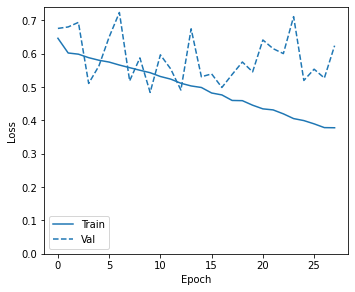

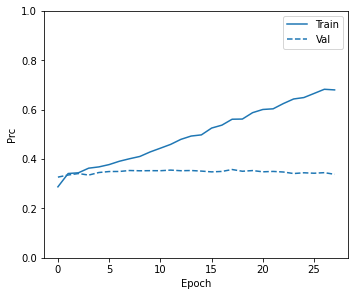

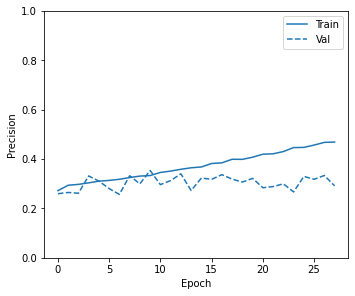

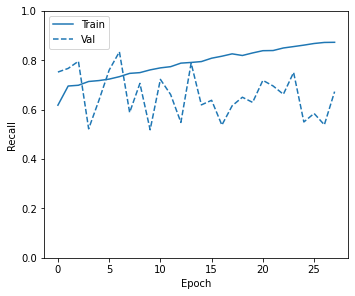

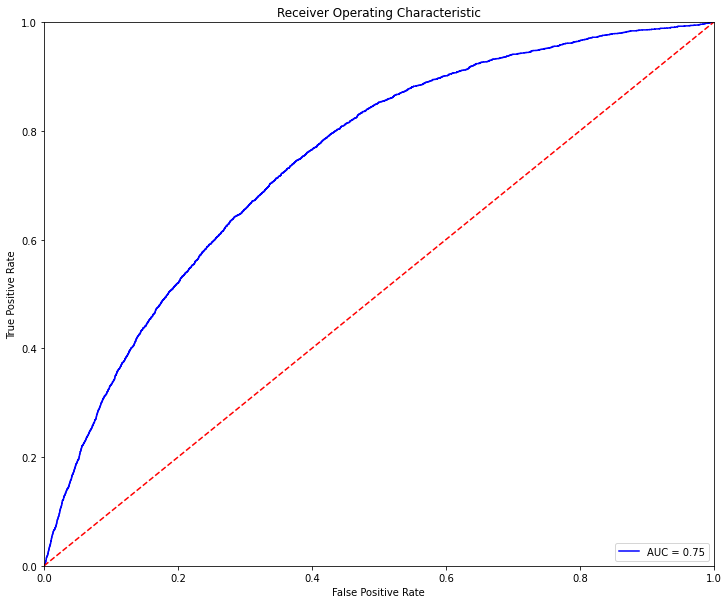

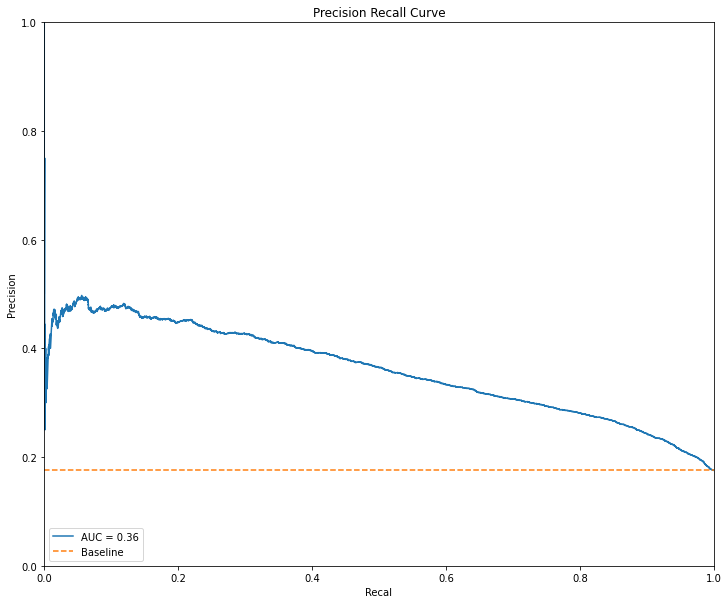

,threshold,tn,fp,fn,tp,f1,accuracy,precision,recall,auc
0,0.0,0,15979,0,3398,0.298397,0.175363,0.175363,1.000000,0.74605
1,0.1,3985,11994,164,3234,0.347257,0.372555,0.212372,0.951736,0.74605
2,0.2,6529,9450,349,3049,0.383594,0.494297,0.243940,0.897293,0.74605
3,0.3,8482,7497,579,2819,0.411113,0.583217,0.273265,0.829606,0.74605
4,0.4,10154,5825,913,2485,0.424496,0.652268,0.299037,0.731313,0.74605
5,0.5,11729,4250,1309,2089,0.429085,0.713113,0.329547,0.614773,0.74605
6,0.6,13102,2877,1727,1671,0.420589,0.762399,0.367414,0.491760,0.74605
7,0.7,14350,1629,2254,1144,0.370766,0.799608,0.412550,0.336669,0.74605
8,0.8,15335,644,2859,539,0.235320,0.819219,0.455621,0.158623,0.74605
9,0.9,15883,96,3320,78,0.043673,0.823709,0.448276,0.022955,0.74605


Model: "sequential_41"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_81 (Dense)             (None, 1024)              532480    
_________________________________________________________________
activation_41 (Activation)   (None, 1024)              0         
_________________________________________________________________
dense_82 (Dense)             (None, 1)                 1025      
Total params: 533,505
Trainable params: 533,505
Non-trainable params: 0
_________________________________________________________________


None

Epoch 1/100
21/21 [==============================] - 4s 72ms/step - loss: 0.9010 - tp: 4798.7273 - fp: 6902.2273 - tn: 11854.5000 - fn: 3641.3636 - accuracy: 0.6166 - precision: 0.3974 - recall: 0.5711 - auc: 0.6494 - prc: 0.4241 - val_loss: 0.5072 - val_tp: 481.0000 - val_fp: 923.0000 - val_tn: 11988.0000 - val_fn: 2109.0000 - val_accuracy: 0.8044 - val_precision: 0.3426 - val_recall: 0.1857 - val_auc: 0.6815 - val_prc: 0.2801
Epoch 2/100
21/21 [==============================] - 0s 17ms/step - loss: 0.6511 - tp: 3501.1364 - fp: 2001.6364 - tn: 3849.2273 - fn: 2343.8182 - accuracy: 0.6174 - precision: 0.6482 - recall: 0.5426 - auc: 0.6773 - prc: 0.6565 - val_loss: 0.7073 - val_tp: 1972.0000 - val_fp: 6152.0000 - val_tn: 6759.0000 - val_fn: 618.0000 - val_accuracy: 0.5633 - val_precision: 0.2427 - val_recall: 0.7614 - val_auc: 0.6989 - val_prc: 0.3082
Epoch 3/100
21/21 [==============================] - 0s 18ms/step - loss: 0.6248 - tp: 3903.5909 - fp: 2117.6364 - tn: 3733.7273 - fn: 19

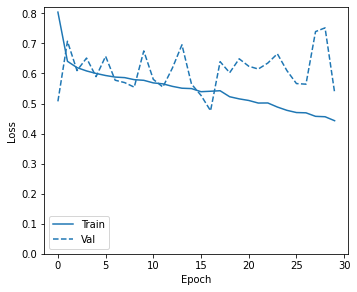

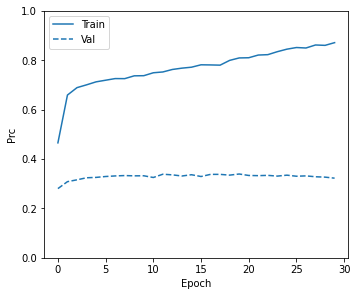

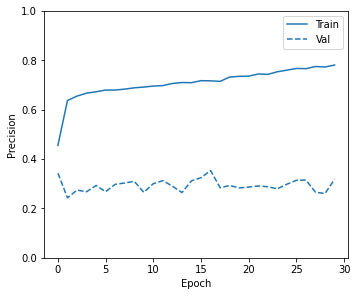

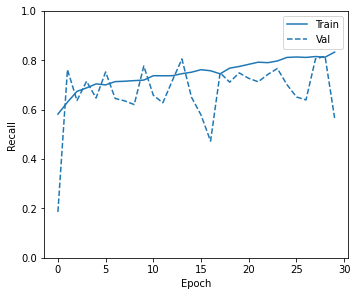

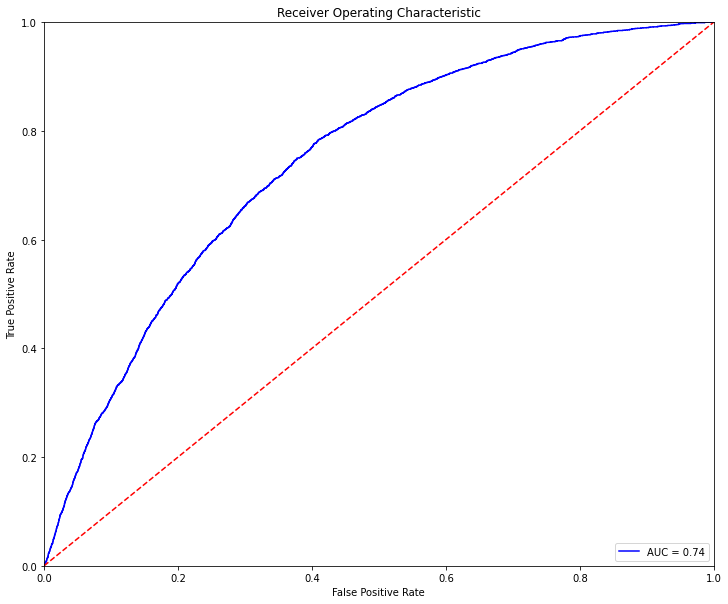

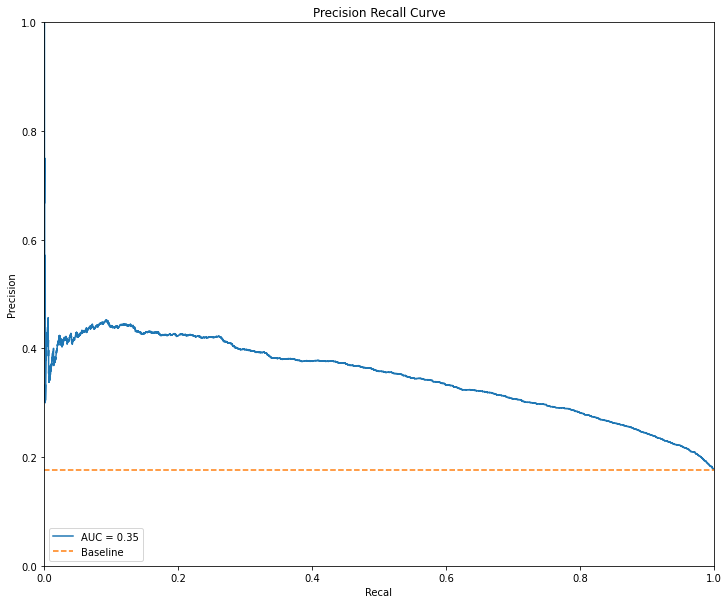

,threshold,tn,fp,fn,tp,f1,accuracy,precision,recall,auc
0,0.0,0,15979,0,3398,0.298397,0.175363,0.175363,1.000000,0.744759
1,0.1,1494,14485,30,3368,0.316973,0.250916,0.188652,0.991171,0.744759
2,0.2,3608,12371,114,3284,0.344723,0.355679,0.209773,0.966451,0.744759
3,0.3,5749,10230,270,3128,0.373359,0.458120,0.234167,0.920541,0.744759
4,0.4,7887,8092,510,2888,0.401725,0.556072,0.263024,0.849912,0.744759
5,0.5,9873,6106,847,2551,0.423227,0.641173,0.294675,0.750736,0.744759
6,0.6,11693,4286,1303,2095,0.428469,0.711565,0.328318,0.616539,0.744759
7,0.7,13398,2581,1869,1529,0.407299,0.770346,0.372019,0.449971,0.744759
8,0.8,14855,1124,2585,813,0.304780,0.808588,0.419721,0.239258,0.744759
9,0.9,15762,217,3236,162,0.085782,0.821799,0.427441,0.047675,0.744759


Model: "sequential_42"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_83 (Dense)             (None, 1024)              532480    
_________________________________________________________________
activation_42 (Activation)   (None, 1024)              0         
_________________________________________________________________
dense_84 (Dense)             (None, 1)                 1025      
Total params: 533,505
Trainable params: 533,505
Non-trainable params: 0
_________________________________________________________________


None

Epoch 1/100
101/101 [==============================] - 4s 23ms/step - loss: 0.6682 - tp: 18467.3235 - fp: 13113.9020 - tn: 26141.3922 - fn: 10493.5196 - accuracy: 0.6541 - precision: 0.5552 - recall: 0.6203 - auc: 0.7037 - prc: 0.5633 - val_loss: 0.6061 - val_tp: 1756.0000 - val_fp: 4386.0000 - val_tn: 8525.0000 - val_fn: 834.0000 - val_accuracy: 0.6632 - val_precision: 0.2859 - val_recall: 0.6780 - val_auc: 0.7304 - val_prc: 0.3339
Epoch 2/100
101/101 [==============================] - 1s 12ms/step - loss: 0.5904 - tp: 18817.6569 - fp: 8969.7941 - tn: 17349.3922 - fn: 7578.2941 - accuracy: 0.6855 - precision: 0.6768 - recall: 0.7133 - auc: 0.7492 - prc: 0.7190 - val_loss: 0.5962 - val_tp: 1793.0000 - val_fp: 4272.0000 - val_tn: 8639.0000 - val_fn: 797.0000 - val_accuracy: 0.6730 - val_precision: 0.2956 - val_recall: 0.6923 - val_auc: 0.7409 - val_prc: 0.3450
Epoch 3/100
101/101 [==============================] - 1s 12ms/step - loss: 0.5718 - tp: 19399.2059 - fp: 8615.2059 - tn: 17714.

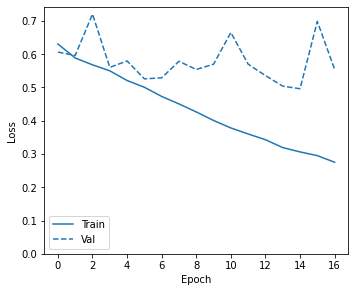

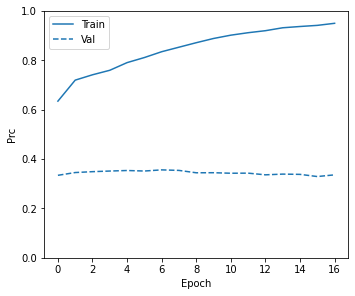

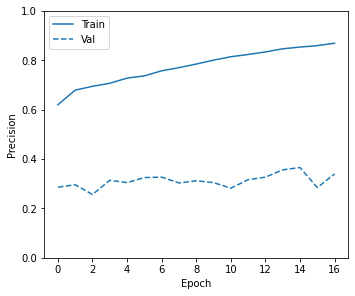

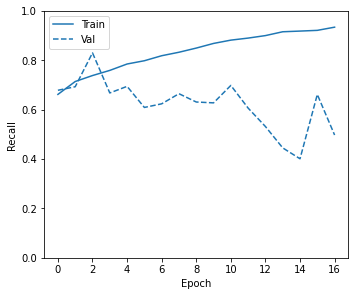

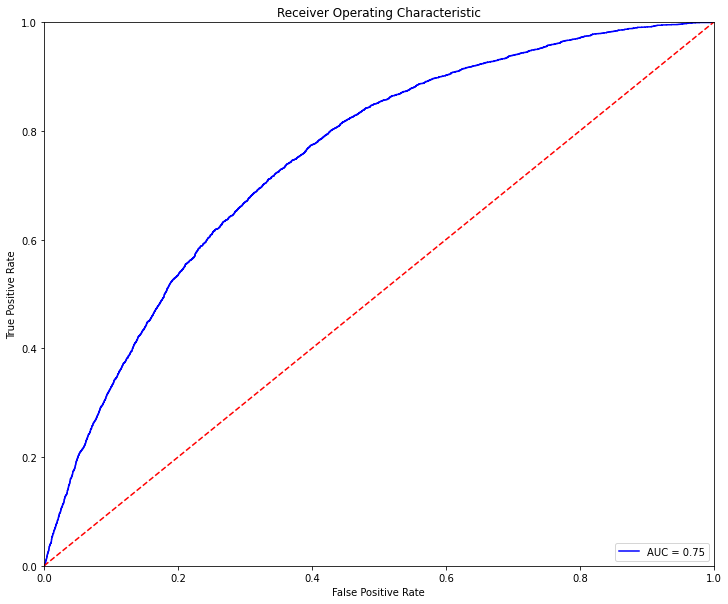

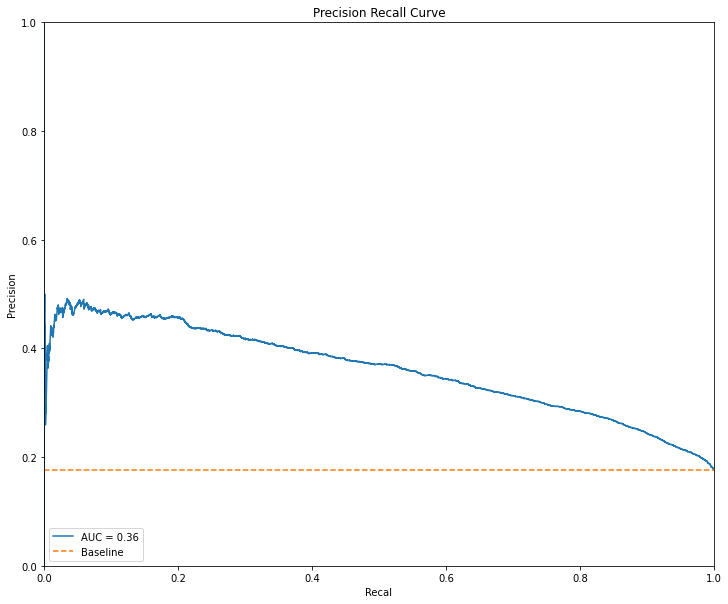

,threshold,tn,fp,fn,tp,f1,accuracy,precision,recall,auc
0,0.0,0,15979,0,3398,0.298397,0.175363,0.175363,1.000000,0.749909
1,0.1,3988,11991,149,3249,0.348643,0.373484,0.213189,0.956151,0.749909
2,0.2,6583,9396,346,3052,0.385208,0.497239,0.245180,0.898175,0.749909
3,0.3,8597,7382,589,2809,0.413423,0.588636,0.275635,0.826663,0.749909
4,0.4,10275,5704,913,2485,0.428929,0.658513,0.303456,0.731313,0.749909
5,0.5,11794,4185,1281,2117,0.436495,0.717913,0.335925,0.623014,0.749909
6,0.6,13154,2825,1729,1669,0.422960,0.764979,0.371384,0.491171,0.749909
7,0.7,14419,1560,2300,1098,0.362616,0.800795,0.413093,0.323131,0.749909
8,0.8,15427,552,2933,465,0.210646,0.820148,0.457227,0.136845,0.749909
9,0.9,15912,67,3342,56,0.031809,0.824070,0.455285,0.016480,0.749909


In [ ]:
units = [16, 32, 128, 256, 512, 1024]
for i in range(0, len(units)):
  print('Number of units: ' +str(units[i]))
  model = create_model_abstract_1l(units[i])
  initial_weights = os.path.join(tempfile.mkdtemp(), 'initial_weights')
  model.save_weights(initial_weights)

  for j in range(0, len(datasets_features)):
    if j == 0: 
      model = create_model_abstract_1l(units[i])
      model.load_weights(initial_weights)
      history = model.fit(
        train_features, train_labels,
        batch_size=BATCH_SIZE,
        epochs=EPOCHS,
        callbacks=[early_stopping],
        validation_data=(val_features, val_labels),
        class_weight=class_weights, 
        verbose=1)

      plot_metrics(history)
      predictions = model.predict(test_features, batch_size=BATCH_SIZE)
      eval_train = evaluate_model(actual=test_labels, predicted=predictions, threshold=np.linspace(0,1,11))
      display(eval_train)

    else:
      model = create_model_abstract_1l(units[i])
      model.load_weights(initial_weights)
      history = model.fit(
        datasets_features[j], datasets_labels[j],
        batch_size=BATCH_SIZE,
        epochs=EPOCHS,
        callbacks=[early_stopping],
        validation_data=(val_features, val_labels),
        verbose=1)

      plot_metrics(history)
      predictions = model.predict(test_features, batch_size=BATCH_SIZE)
      eval_train = evaluate_model(actual=test_labels, predicted=predictions, threshold=np.linspace(0,1,11))
      display(eval_train)  

In [ ]:
def create_model_abstract_2l(units):
  model = keras.Sequential()
  model.add(Dense(units=units, input_shape=(train_features.shape[-1],)))
  model.add(Activation('relu'))
  model.add(Dense(units=units))
  model.add(Activation('relu'))
  model.add(Dense(1, activation='sigmoid'))

  display(model.summary())

  model.compile(
        optimizer=keras.optimizers.Adam(learning_rate=1e-3),
        loss=keras.losses.BinaryCrossentropy(),
      metrics=METRICS)
  
  return model

Number of units: 16
Model: "sequential_46"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_92 (Dense)             (None, 16)                8320      
_________________________________________________________________
activation_47 (Activation)   (None, 16)                0         
_________________________________________________________________
dense_93 (Dense)             (None, 16)                272       
_________________________________________________________________
activation_48 (Activation)   (None, 16)                0         
_________________________________________________________________
dense_94 (Dense)             (None, 1)                 17        
Total params: 8,609
Trainable params: 8,609
Non-trainable params: 0
_________________________________________________________________


None

Model: "sequential_47"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_95 (Dense)             (None, 16)                8320      
_________________________________________________________________
activation_49 (Activation)   (None, 16)                0         
_________________________________________________________________
dense_96 (Dense)             (None, 16)                272       
_________________________________________________________________
activation_50 (Activation)   (None, 16)                0         
_________________________________________________________________
dense_97 (Dense)             (None, 1)                 17        
Total params: 8,609
Trainable params: 8,609
Non-trainable params: 0
_________________________________________________________________


None

Epoch 1/100
61/61 [==============================] - 4s 26ms/step - loss: 0.7409 - tp: 4569.3710 - fp: 16724.2419 - tn: 22903.4032 - fn: 3528.5968 - accuracy: 0.5832 - precision: 0.2192 - recall: 0.5627 - auc: 0.6153 - prc: 0.2419 - val_loss: 0.6779 - val_tp: 1919.0000 - val_fp: 6370.0000 - val_tn: 6541.0000 - val_fn: 671.0000 - val_accuracy: 0.5458 - val_precision: 0.2315 - val_recall: 0.7409 - val_auc: 0.6707 - val_prc: 0.2734
Epoch 2/100
61/61 [==============================] - 1s 8ms/step - loss: 0.6486 - tp: 3716.9355 - fp: 10547.1935 - tn: 16176.5161 - fn: 1783.9677 - accuracy: 0.6119 - precision: 0.2593 - recall: 0.6808 - auc: 0.6814 - prc: 0.2877 - val_loss: 0.6785 - val_tp: 1879.0000 - val_fp: 5755.0000 - val_tn: 7156.0000 - val_fn: 711.0000 - val_accuracy: 0.5829 - val_precision: 0.2461 - val_recall: 0.7255 - val_auc: 0.6947 - val_prc: 0.3015
Epoch 3/100
61/61 [==============================] - 0s 8ms/step - loss: 0.6241 - tp: 3710.4194 - fp: 9679.4839 - tn: 17057.8065 - fn: 

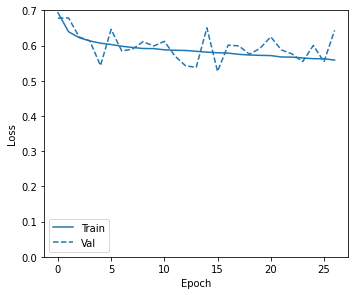

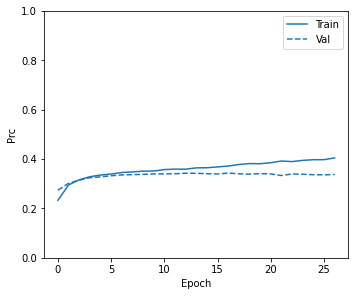

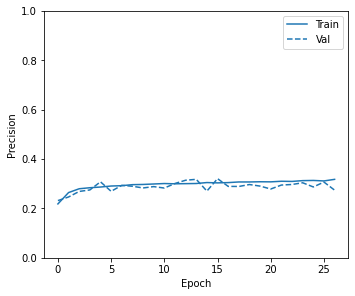

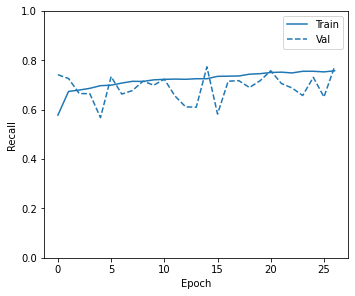

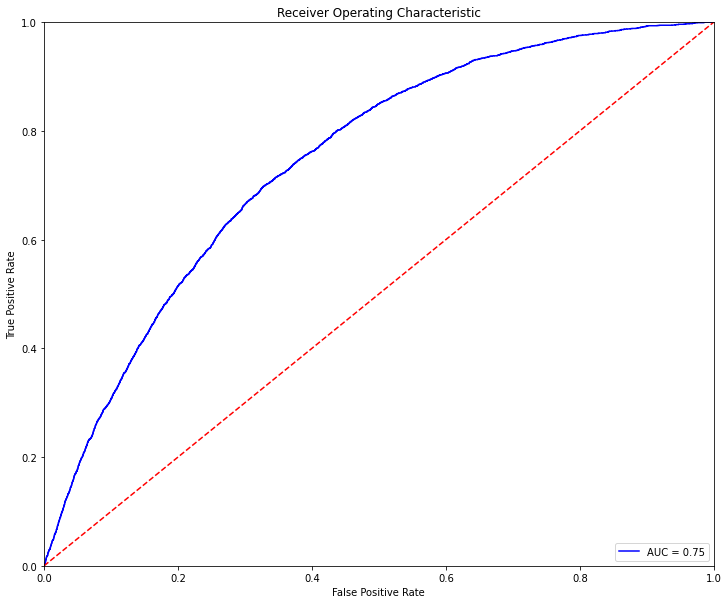

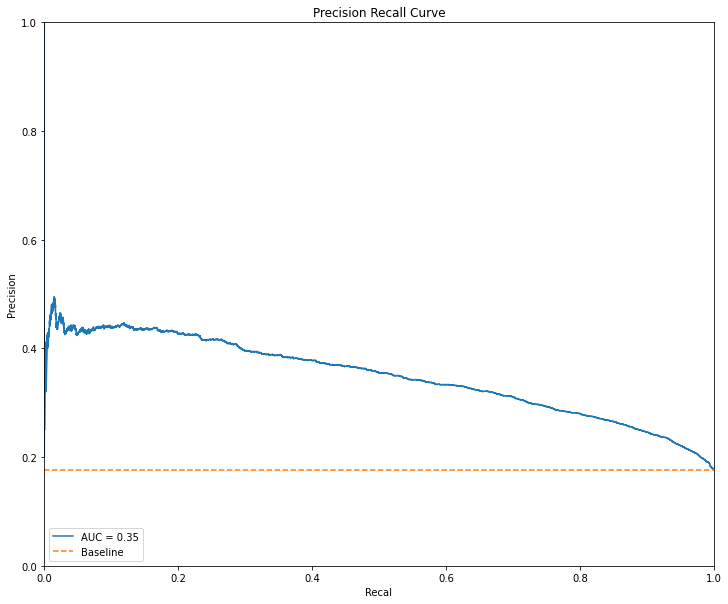

,threshold,tn,fp,fn,tp,f1,accuracy,precision,recall,auc
0,0.0,0,15979,0,3398,0.298397,0.175363,0.175363,1.000000,0.745219
1,0.1,1180,14799,19,3379,0.313218,0.235279,0.185884,0.994408,0.745219
2,0.2,3565,12414,104,3294,0.344813,0.353976,0.209702,0.969394,0.745219
3,0.3,5877,10102,260,3138,0.377209,0.465242,0.237009,0.923484,0.745219
4,0.4,8189,7790,545,2853,0.406381,0.569851,0.268064,0.839612,0.745219
5,0.5,10293,5686,947,2451,0.424967,0.657687,0.301217,0.721307,0.745219
6,0.6,12200,3779,1463,1935,0.424715,0.729473,0.338642,0.569453,0.745219
7,0.7,14086,1893,2202,1196,0.368737,0.788667,0.387180,0.351972,0.745219
8,0.8,15652,327,3146,252,0.126729,0.820767,0.435233,0.074161,0.745219
9,0.9,15977,2,3397,1,0.000588,0.824586,0.333333,0.000294,0.745219


Model: "sequential_48"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_98 (Dense)             (None, 16)                8320      
_________________________________________________________________
activation_51 (Activation)   (None, 16)                0         
_________________________________________________________________
dense_99 (Dense)             (None, 16)                272       
_________________________________________________________________
activation_52 (Activation)   (None, 16)                0         
_________________________________________________________________
dense_100 (Dense)            (None, 1)                 17        
Total params: 8,609
Trainable params: 8,609
Non-trainable params: 0
_________________________________________________________________


None

Epoch 1/100
21/21 [==============================] - 4s 84ms/step - loss: 0.8085 - tp: 5772.5909 - fp: 9173.1364 - tn: 9583.5909 - fn: 2667.5000 - accuracy: 0.5690 - precision: 0.3793 - recall: 0.7123 - auc: 0.6604 - prc: 0.4036 - val_loss: 0.7088 - val_tp: 1907.0000 - val_fp: 8305.0000 - val_tn: 4606.0000 - val_fn: 683.0000 - val_accuracy: 0.4202 - val_precision: 0.1867 - val_recall: 0.7363 - val_auc: 0.5659 - val_prc: 0.1939
Epoch 2/100
21/21 [==============================] - 0s 12ms/step - loss: 0.6831 - tp: 3416.7273 - fp: 2595.5455 - tn: 3255.3182 - fn: 2428.2273 - accuracy: 0.5656 - precision: 0.5633 - recall: 0.6072 - auc: 0.5923 - prc: 0.5690 - val_loss: 0.6760 - val_tp: 1812.0000 - val_fp: 6129.0000 - val_tn: 6782.0000 - val_fn: 778.0000 - val_accuracy: 0.5544 - val_precision: 0.2282 - val_recall: 0.6996 - val_auc: 0.6487 - val_prc: 0.2524
Epoch 3/100
21/21 [==============================] - 0s 12ms/step - loss: 0.6647 - tp: 3824.4545 - fp: 2397.8636 - tn: 3453.5000 - fn: 202

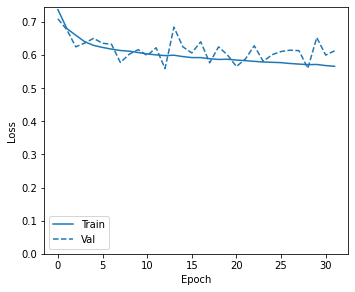

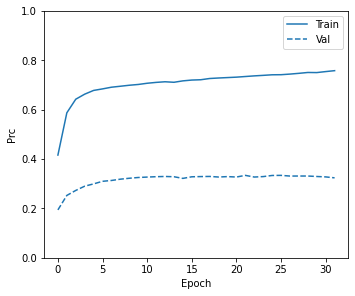

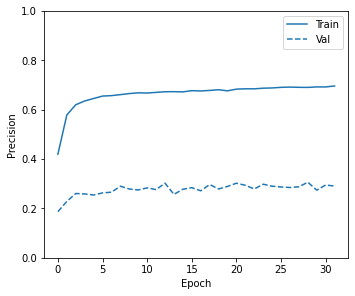

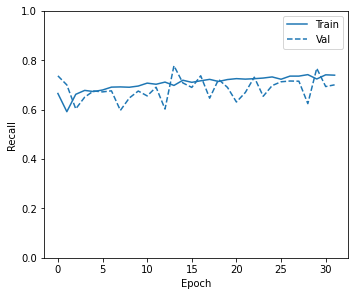

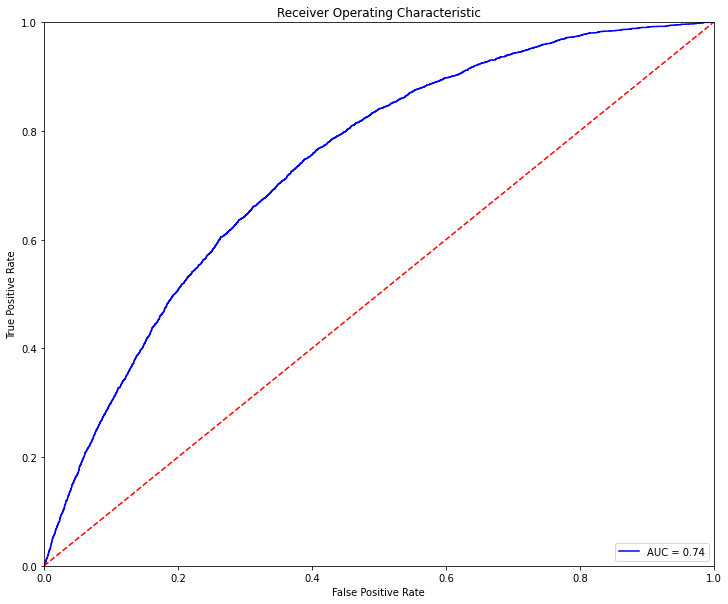

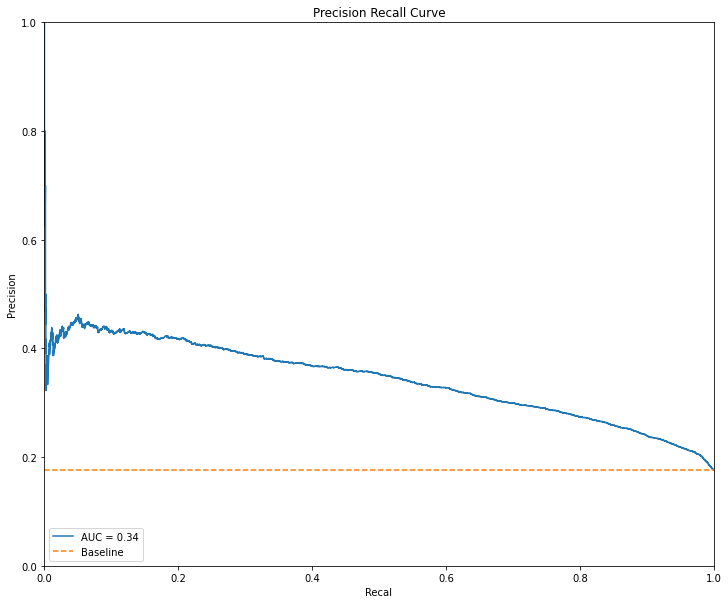

,threshold,tn,fp,fn,tp,f1,accuracy,precision,recall,auc
0,0.0,0,15979,0,3398,0.298397,0.175363,0.175363,1.000000,0.738252
1,0.1,918,15061,18,3380,0.309538,0.221809,0.183287,0.994703,0.738252
2,0.2,3390,12589,93,3305,0.342629,0.345513,0.207940,0.972631,0.738252
3,0.3,5932,10047,303,3095,0.374244,0.465862,0.235504,0.910830,0.738252
4,0.4,8543,7436,632,2766,0.406765,0.583630,0.271123,0.814008,0.738252
5,0.5,10801,5178,1116,2282,0.420335,0.675182,0.305898,0.671572,0.738252
6,0.6,12742,3237,1659,1739,0.415333,0.747329,0.349477,0.511772,0.738252
7,0.7,14418,1561,2393,1005,0.337022,0.795944,0.391660,0.295762,0.738252
8,0.8,15693,286,3168,230,0.117527,0.821747,0.445736,0.067687,0.738252
9,0.9,15974,5,3391,7,0.004106,0.824741,0.583333,0.002060,0.738252


Model: "sequential_49"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_101 (Dense)            (None, 16)                8320      
_________________________________________________________________
activation_53 (Activation)   (None, 16)                0         
_________________________________________________________________
dense_102 (Dense)            (None, 16)                272       
_________________________________________________________________
activation_54 (Activation)   (None, 16)                0         
_________________________________________________________________
dense_103 (Dense)            (None, 1)                 17        
Total params: 8,609
Trainable params: 8,609
Non-trainable params: 0
_________________________________________________________________


None

Epoch 1/100
101/101 [==============================] - 4s 19ms/step - loss: 0.7169 - tp: 18034.0686 - fp: 17273.1471 - tn: 21982.1471 - fn: 10926.7745 - accuracy: 0.5856 - precision: 0.4861 - recall: 0.6315 - auc: 0.6317 - prc: 0.4757 - val_loss: 0.6275 - val_tp: 1656.0000 - val_fp: 4650.0000 - val_tn: 8261.0000 - val_fn: 934.0000 - val_accuracy: 0.6398 - val_precision: 0.2626 - val_recall: 0.6394 - val_auc: 0.6899 - val_prc: 0.2938
Epoch 2/100
101/101 [==============================] - 1s 8ms/step - loss: 0.6261 - tp: 18144.3627 - fp: 9732.2843 - tn: 16586.9020 - fn: 8251.5882 - accuracy: 0.6573 - precision: 0.6495 - recall: 0.6874 - auc: 0.7074 - prc: 0.6802 - val_loss: 0.6035 - val_tp: 1664.0000 - val_fp: 4331.0000 - val_tn: 8580.0000 - val_fn: 926.0000 - val_accuracy: 0.6609 - val_precision: 0.2776 - val_recall: 0.6425 - val_auc: 0.7127 - val_prc: 0.3196
Epoch 3/100
101/101 [==============================] - 1s 9ms/step - loss: 0.6079 - tp: 18426.9216 - fp: 9255.2059 - tn: 17074.93

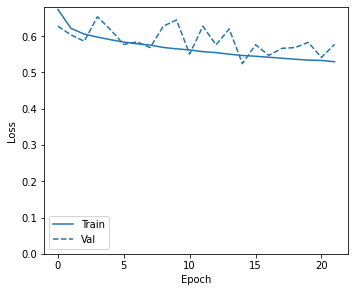

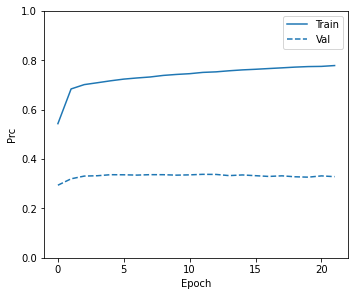

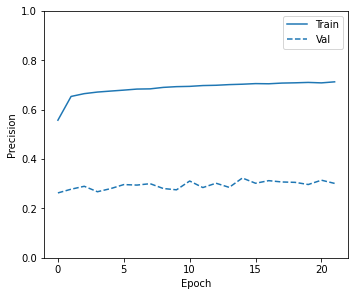

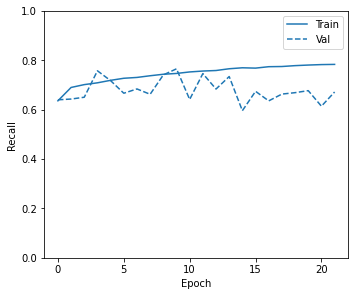

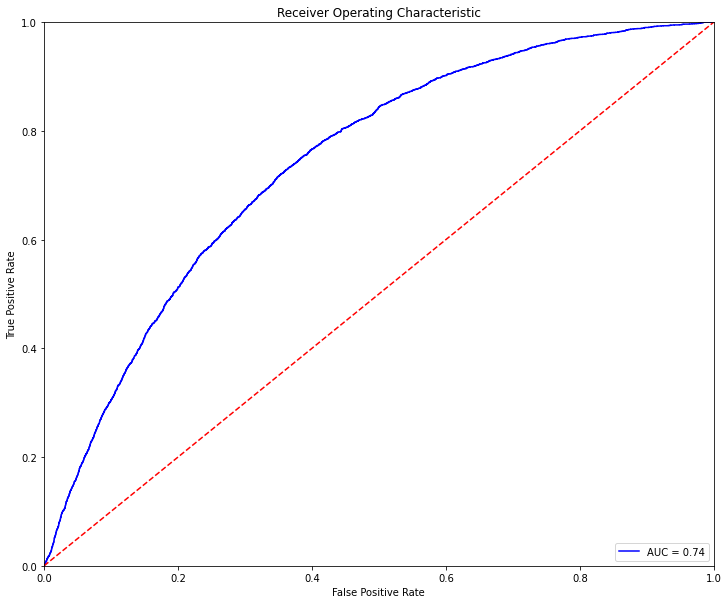

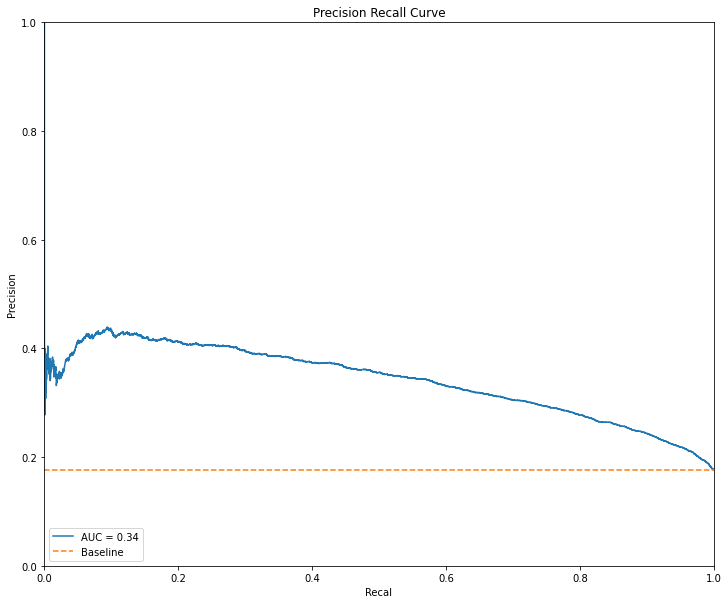

,threshold,tn,fp,fn,tp,f1,accuracy,precision,recall,auc
0,0.0,0,15979,0,3398,0.298397,0.175363,0.175363,1.000000,0.741536
1,0.1,1747,14232,40,3358,0.319992,0.263457,0.190904,0.988228,0.741536
2,0.2,4052,11927,140,3258,0.350643,0.377251,0.214554,0.958799,0.741536
3,0.3,6182,9797,312,3086,0.379092,0.478299,0.239540,0.908181,0.741536
4,0.4,8086,7893,564,2834,0.401274,0.563555,0.264193,0.834020,0.741536
5,0.5,9942,6037,873,2525,0.422241,0.643392,0.294908,0.743084,0.741536
6,0.6,11680,4299,1307,2091,0.427258,0.710688,0.327230,0.615362,0.741536
7,0.7,13348,2631,1877,1521,0.402914,0.767353,0.366329,0.447616,0.741536
8,0.8,15157,822,2813,585,0.243496,0.812406,0.415778,0.172160,0.741536
9,0.9,15955,24,3383,15,0.008729,0.824173,0.384615,0.004414,0.741536


Number of units: 32
Model: "sequential_50"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_104 (Dense)            (None, 32)                16640     
_________________________________________________________________
activation_55 (Activation)   (None, 32)                0         
_________________________________________________________________
dense_105 (Dense)            (None, 32)                1056      
_________________________________________________________________
activation_56 (Activation)   (None, 32)                0         
_________________________________________________________________
dense_106 (Dense)            (None, 1)                 33        
Total params: 17,729
Trainable params: 17,729
Non-trainable params: 0
_________________________________________________________________


None

Model: "sequential_51"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_107 (Dense)            (None, 32)                16640     
_________________________________________________________________
activation_57 (Activation)   (None, 32)                0         
_________________________________________________________________
dense_108 (Dense)            (None, 32)                1056      
_________________________________________________________________
activation_58 (Activation)   (None, 32)                0         
_________________________________________________________________
dense_109 (Dense)            (None, 1)                 33        
Total params: 17,729
Trainable params: 17,729
Non-trainable params: 0
_________________________________________________________________


None

Epoch 1/100
61/61 [==============================] - 4s 26ms/step - loss: 0.6673 - tp: 5219.0484 - fp: 15319.6129 - tn: 24308.0323 - fn: 2878.9194 - accuracy: 0.6197 - precision: 0.2548 - recall: 0.6441 - auc: 0.6806 - prc: 0.2904 - val_loss: 0.6399 - val_tp: 1762.0000 - val_fp: 4939.0000 - val_tn: 7972.0000 - val_fn: 828.0000 - val_accuracy: 0.6280 - val_precision: 0.2629 - val_recall: 0.6803 - val_auc: 0.6999 - val_prc: 0.3057
Epoch 2/100
61/61 [==============================] - 1s 9ms/step - loss: 0.6247 - tp: 3773.2581 - fp: 9864.9032 - tn: 16858.8065 - fn: 1727.6452 - accuracy: 0.6379 - precision: 0.2760 - recall: 0.6859 - auc: 0.7067 - prc: 0.3062 - val_loss: 0.5705 - val_tp: 1572.0000 - val_fp: 3768.0000 - val_tn: 9143.0000 - val_fn: 1018.0000 - val_accuracy: 0.6912 - val_precision: 0.2944 - val_recall: 0.6069 - val_auc: 0.7149 - val_prc: 0.3197
Epoch 3/100
61/61 [==============================] - 1s 9ms/step - loss: 0.6066 - tp: 3807.2419 - fp: 9448.0968 - tn: 17289.1935 - fn: 

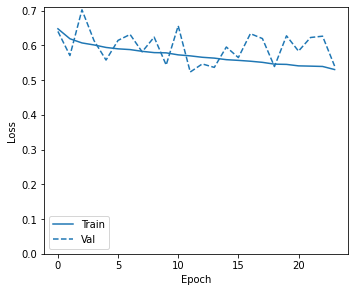

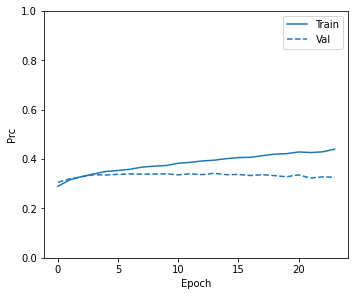

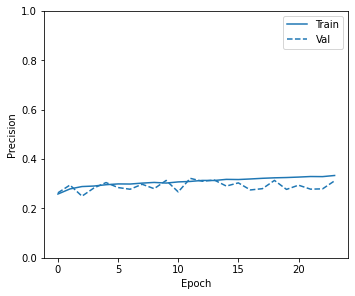

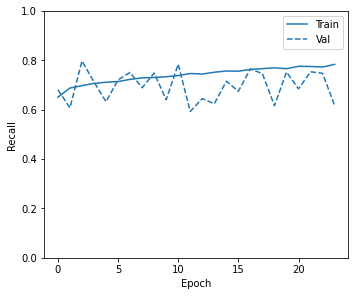

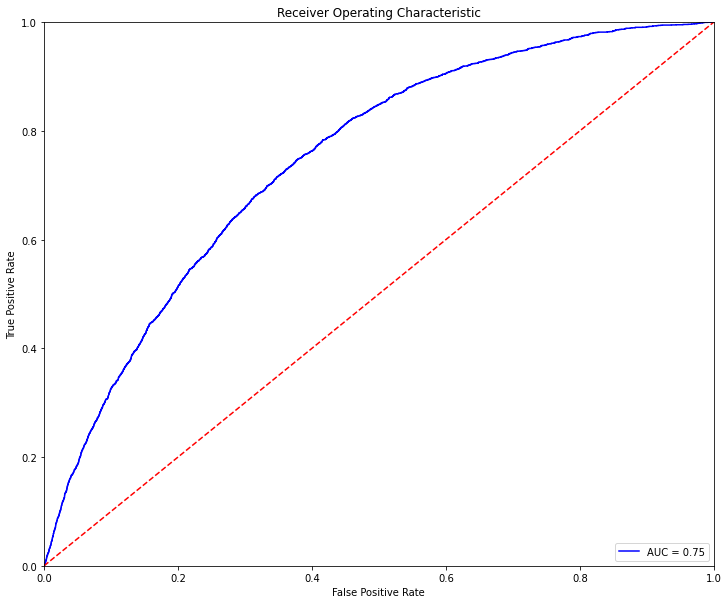

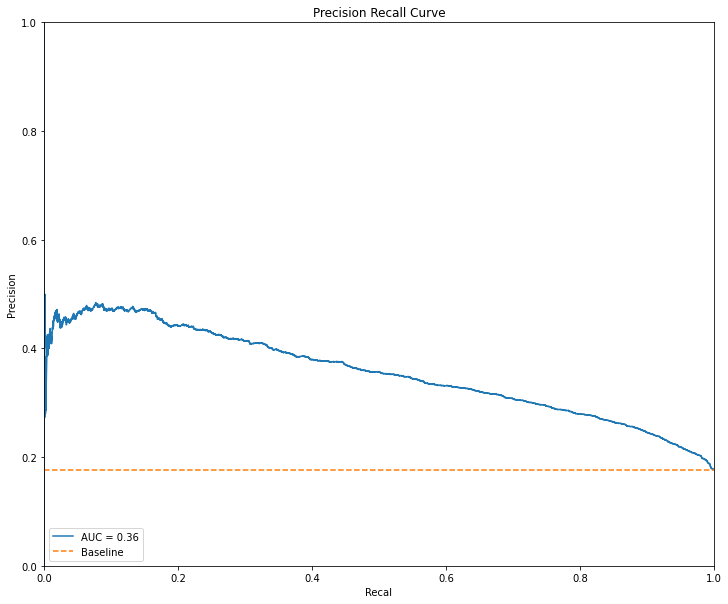

,threshold,tn,fp,fn,tp,f1,accuracy,precision,recall,auc
0,0.0,0,15979,0,3398,0.298397,0.175363,0.175363,1.000000,0.745982
1,0.1,2865,13114,67,3331,0.335736,0.319761,0.202554,0.980283,0.745982
2,0.2,5507,10472,246,3152,0.370344,0.446870,0.231356,0.927604,0.745982
3,0.3,7819,8160,496,2902,0.401383,0.553285,0.262340,0.854032,0.745982
4,0.4,9880,6099,852,2546,0.422818,0.641276,0.294505,0.749264,0.745982
5,0.5,11589,4390,1265,2133,0.429997,0.708159,0.326997,0.627722,0.745982
6,0.6,13128,2851,1789,1609,0.409519,0.760541,0.360762,0.473514,0.745982
7,0.7,14602,1377,2416,982,0.341150,0.804252,0.416278,0.288994,0.745982
8,0.8,15694,285,3133,265,0.134245,0.823605,0.481818,0.077987,0.745982
9,0.9,15976,3,3395,3,0.001763,0.824637,0.500000,0.000883,0.745982


Model: "sequential_52"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_110 (Dense)            (None, 32)                16640     
_________________________________________________________________
activation_59 (Activation)   (None, 32)                0         
_________________________________________________________________
dense_111 (Dense)            (None, 32)                1056      
_________________________________________________________________
activation_60 (Activation)   (None, 32)                0         
_________________________________________________________________
dense_112 (Dense)            (None, 1)                 33        
Total params: 17,729
Trainable params: 17,729
Non-trainable params: 0
_________________________________________________________________


None

Epoch 1/100
21/21 [==============================] - 4s 69ms/step - loss: 0.6749 - tp: 5121.4545 - fp: 5939.0455 - tn: 12817.6818 - fn: 3318.6364 - accuracy: 0.6623 - precision: 0.4467 - recall: 0.6010 - auc: 0.7063 - prc: 0.4222 - val_loss: 0.6125 - val_tp: 1512.0000 - val_fp: 4114.0000 - val_tn: 8797.0000 - val_fn: 1078.0000 - val_accuracy: 0.6651 - val_precision: 0.2688 - val_recall: 0.5838 - val_auc: 0.6773 - val_prc: 0.2801
Epoch 2/100
21/21 [==============================] - 0s 13ms/step - loss: 0.6366 - tp: 3782.0455 - fp: 2051.9545 - tn: 3798.9091 - fn: 2062.9091 - accuracy: 0.6452 - precision: 0.6501 - recall: 0.6358 - auc: 0.6921 - prc: 0.6663 - val_loss: 0.6164 - val_tp: 1634.0000 - val_fp: 4429.0000 - val_tn: 8482.0000 - val_fn: 956.0000 - val_accuracy: 0.6526 - val_precision: 0.2695 - val_recall: 0.6309 - val_auc: 0.6934 - val_prc: 0.2981
Epoch 3/100
21/21 [==============================] - 0s 12ms/step - loss: 0.6262 - tp: 3946.4545 - fp: 2116.9091 - tn: 3734.4545 - fn: 1

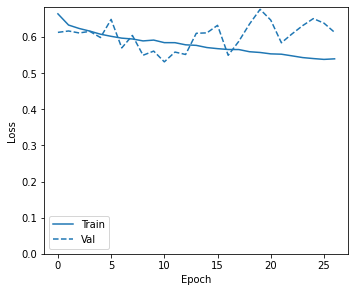

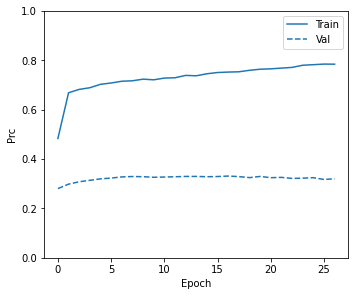

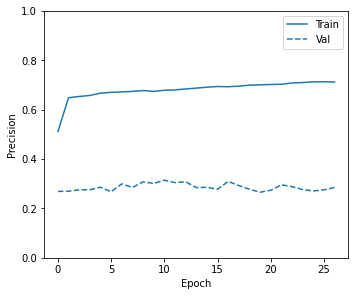

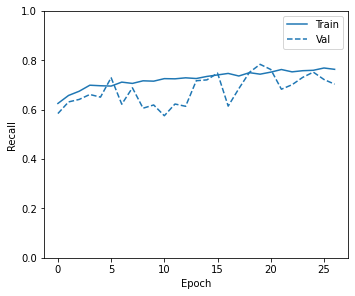

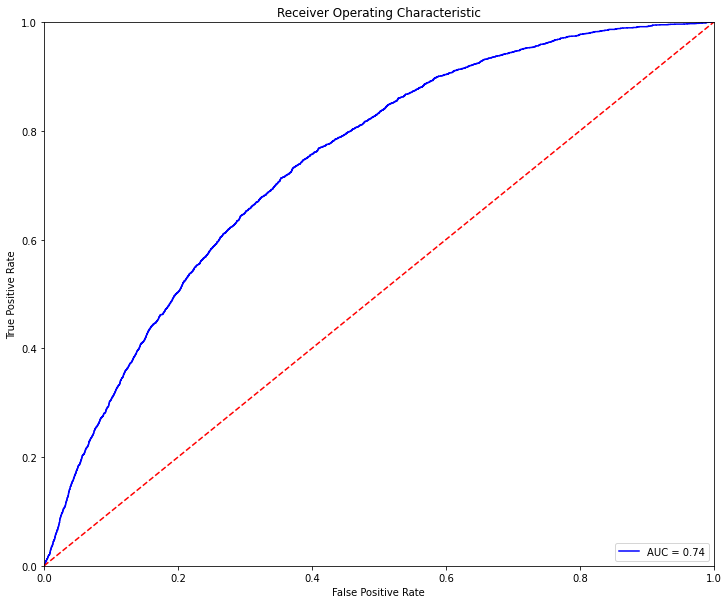

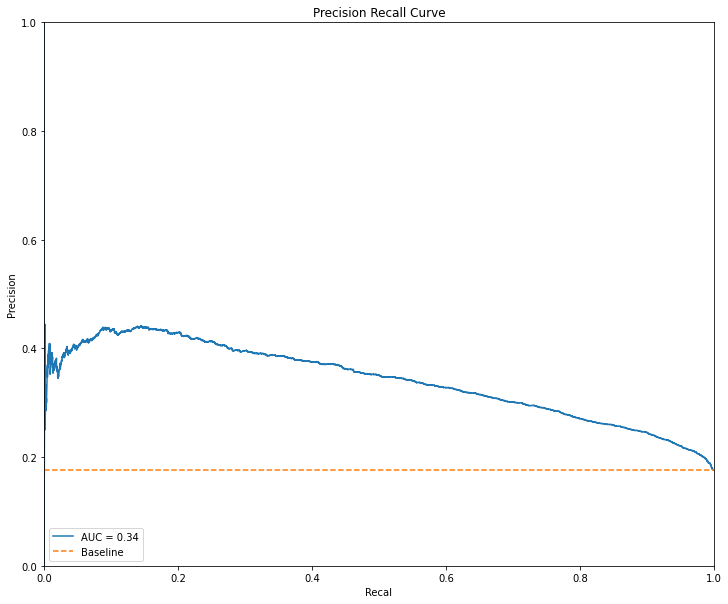

,threshold,tn,fp,fn,tp,f1,accuracy,precision,recall,auc
0,0.0,0,15979,0,3398,0.298397,0.175363,0.175363,1.000000,0.740236
1,0.1,2063,13916,35,3363,0.325289,0.280023,0.194629,0.989700,0.740236
2,0.2,4760,11219,184,3214,0.360496,0.411519,0.222684,0.945851,0.740236
3,0.3,7326,8653,450,2948,0.393093,0.530216,0.254116,0.867569,0.740236
4,0.4,9596,6383,827,2571,0.416289,0.627909,0.287134,0.756622,0.740236
5,0.5,11547,4432,1289,2109,0.424389,0.704753,0.322428,0.620659,0.740236
6,0.6,13159,2820,1827,1571,0.403389,0.760180,0.357777,0.462331,0.740236
7,0.7,14587,1392,2466,932,0.325760,0.800898,0.401033,0.274279,0.740236
8,0.8,15597,382,3100,298,0.146150,0.820302,0.438235,0.087699,0.740236
9,0.9,15963,16,3390,8,0.004676,0.824225,0.333333,0.002354,0.740236


Model: "sequential_53"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_113 (Dense)            (None, 32)                16640     
_________________________________________________________________
activation_61 (Activation)   (None, 32)                0         
_________________________________________________________________
dense_114 (Dense)            (None, 32)                1056      
_________________________________________________________________
activation_62 (Activation)   (None, 32)                0         
_________________________________________________________________
dense_115 (Dense)            (None, 1)                 33        
Total params: 17,729
Trainable params: 17,729
Non-trainable params: 0
_________________________________________________________________


None

Epoch 1/100
101/101 [==============================] - 4s 19ms/step - loss: 0.6546 - tp: 19084.4902 - fp: 15068.8333 - tn: 24186.4608 - fn: 9876.3529 - accuracy: 0.6313 - precision: 0.5299 - recall: 0.6550 - auc: 0.6807 - prc: 0.5211 - val_loss: 0.5988 - val_tp: 1664.0000 - val_fp: 4326.0000 - val_tn: 8585.0000 - val_fn: 926.0000 - val_accuracy: 0.6612 - val_precision: 0.2778 - val_recall: 0.6425 - val_auc: 0.7108 - val_prc: 0.3152
Epoch 2/100
101/101 [==============================] - 1s 9ms/step - loss: 0.6058 - tp: 18607.8431 - fp: 9406.1765 - tn: 16913.0098 - fn: 7788.1078 - accuracy: 0.6726 - precision: 0.6641 - recall: 0.7020 - auc: 0.7302 - prc: 0.7001 - val_loss: 0.6497 - val_tp: 1944.0000 - val_fp: 5282.0000 - val_tn: 7629.0000 - val_fn: 646.0000 - val_accuracy: 0.6176 - val_precision: 0.2690 - val_recall: 0.7506 - val_auc: 0.7297 - val_prc: 0.3322
Epoch 3/100
101/101 [==============================] - 1s 9ms/step - loss: 0.5895 - tp: 19063.6373 - fp: 9256.6078 - tn: 17073.529

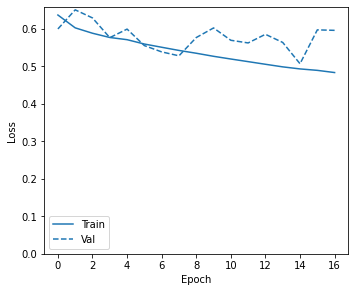

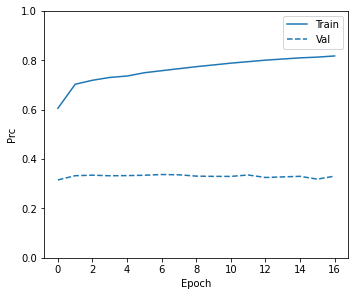

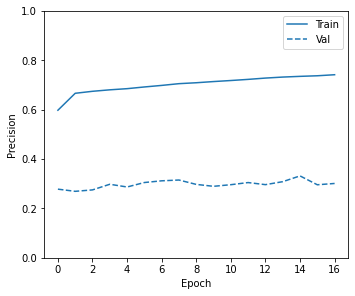

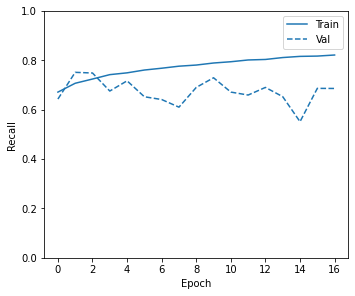

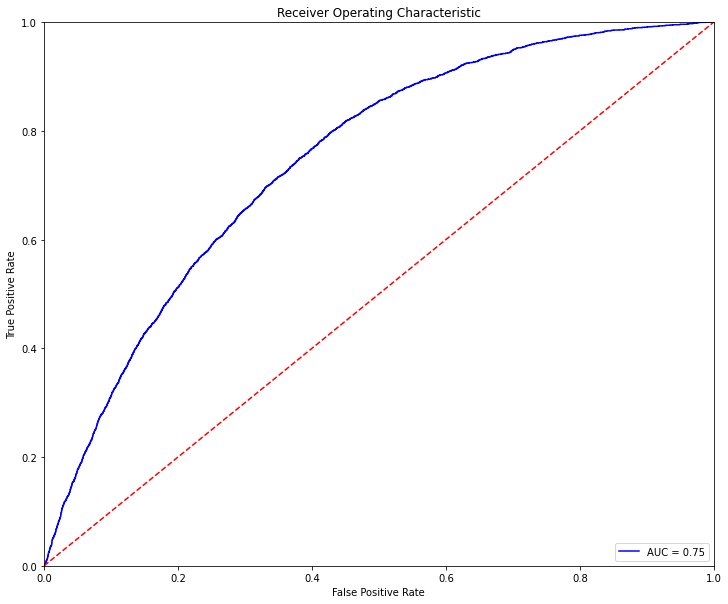

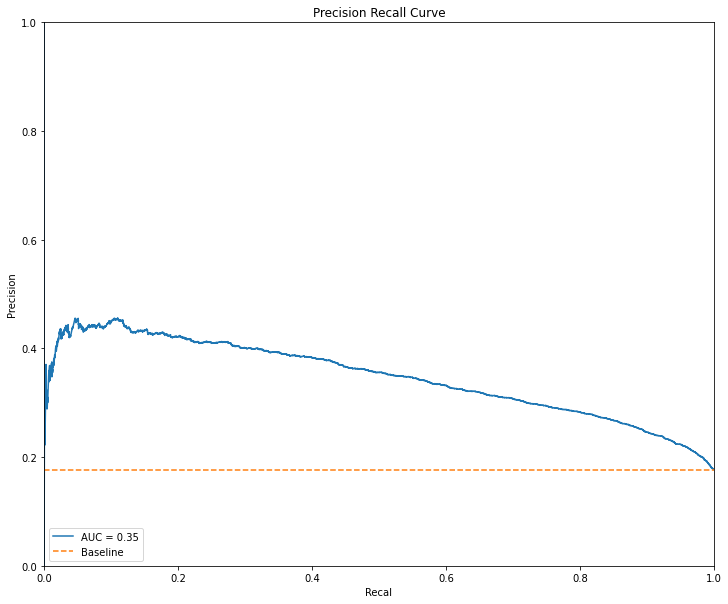

,threshold,tn,fp,fn,tp,f1,accuracy,precision,recall,auc
0,0.0,0,15979,0,3398,0.298397,0.175363,0.175363,1.000000,0.745853
1,0.1,3039,12940,78,3320,0.337776,0.328173,0.204182,0.977045,0.745853
2,0.2,5600,10379,239,3159,0.373051,0.452031,0.233343,0.929665,0.745853
3,0.3,7923,8056,487,2911,0.405291,0.559116,0.265433,0.856680,0.745853
4,0.4,9776,6203,837,2561,0.421148,0.636683,0.292218,0.753679,0.745853
5,0.5,11402,4577,1231,2167,0.427332,0.700263,0.321323,0.637728,0.745853
6,0.6,12997,2982,1737,1661,0.413133,0.756464,0.357743,0.488817,0.745853
7,0.7,14543,1436,2424,974,0.335399,0.800795,0.404149,0.286639,0.745853
8,0.8,15702,277,3185,213,0.109568,0.821335,0.434694,0.062684,0.745853
9,0.9,15969,10,3395,3,0.001759,0.824276,0.230769,0.000883,0.745853


Number of units: 128
Model: "sequential_54"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_116 (Dense)            (None, 128)               66560     
_________________________________________________________________
activation_63 (Activation)   (None, 128)               0         
_________________________________________________________________
dense_117 (Dense)            (None, 128)               16512     
_________________________________________________________________
activation_64 (Activation)   (None, 128)               0         
_________________________________________________________________
dense_118 (Dense)            (None, 1)                 129       
Total params: 83,201
Trainable params: 83,201
Non-trainable params: 0
_________________________________________________________________


None

Model: "sequential_55"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_119 (Dense)            (None, 128)               66560     
_________________________________________________________________
activation_65 (Activation)   (None, 128)               0         
_________________________________________________________________
dense_120 (Dense)            (None, 128)               16512     
_________________________________________________________________
activation_66 (Activation)   (None, 128)               0         
_________________________________________________________________
dense_121 (Dense)            (None, 1)                 129       
Total params: 83,201
Trainable params: 83,201
Non-trainable params: 0
_________________________________________________________________


None

Epoch 1/100
61/61 [==============================] - 4s 28ms/step - loss: 0.6690 - tp: 5231.0645 - fp: 15089.8065 - tn: 24537.8387 - fn: 2866.9032 - accuracy: 0.6230 - precision: 0.2570 - recall: 0.6456 - auc: 0.6832 - prc: 0.2927 - val_loss: 0.6925 - val_tp: 1967.0000 - val_fp: 5855.0000 - val_tn: 7056.0000 - val_fn: 623.0000 - val_accuracy: 0.5821 - val_precision: 0.2515 - val_recall: 0.7595 - val_auc: 0.7119 - val_prc: 0.3187
Epoch 2/100
61/61 [==============================] - 1s 10ms/step - loss: 0.6141 - tp: 3799.3548 - fp: 9632.0000 - tn: 17091.7097 - fn: 1701.5484 - accuracy: 0.6444 - precision: 0.2811 - recall: 0.6902 - auc: 0.7207 - prc: 0.3213 - val_loss: 0.6682 - val_tp: 1952.0000 - val_fp: 5526.0000 - val_tn: 7385.0000 - val_fn: 638.0000 - val_accuracy: 0.6023 - val_precision: 0.2610 - val_recall: 0.7537 - val_auc: 0.7275 - val_prc: 0.3315
Epoch 3/100
61/61 [==============================] - 1s 10ms/step - loss: 0.5986 - tp: 3908.9677 - fp: 9640.1290 - tn: 17097.1613 - fn:

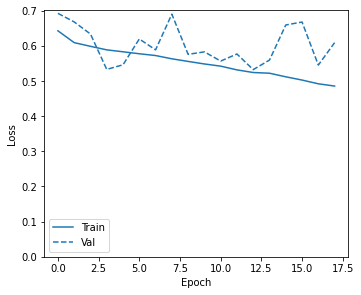

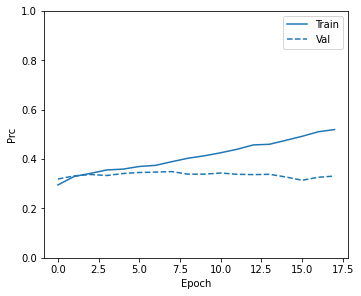

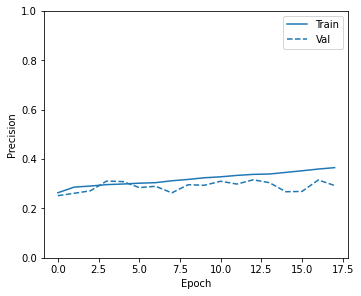

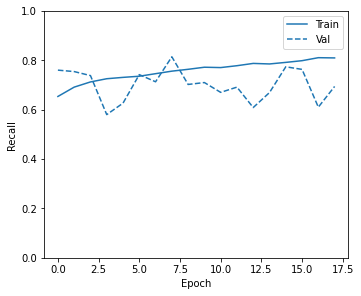

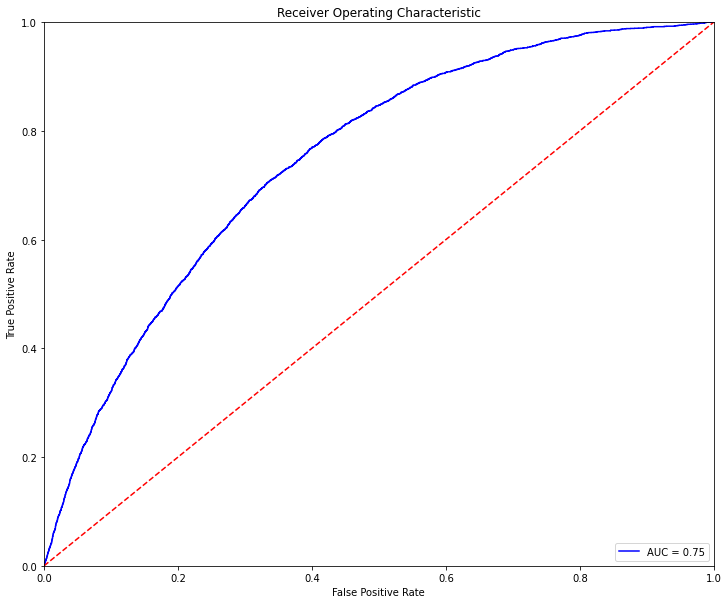

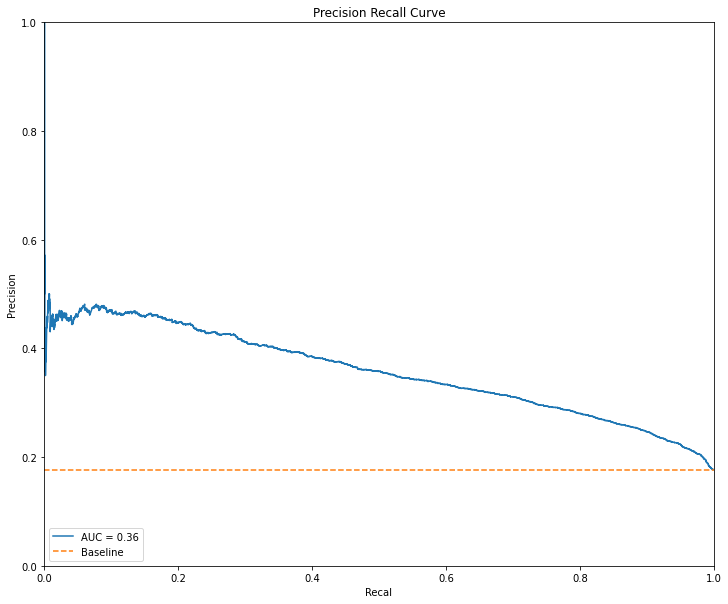

,threshold,tn,fp,fn,tp,f1,accuracy,precision,recall,auc
0,0.0,0,15979,0,3398,0.298397,0.175363,0.175363,1.000000,0.747191
1,0.1,1063,14916,25,3373,0.311062,0.228931,0.184428,0.992643,0.747191
2,0.2,2805,13174,62,3336,0.335142,0.316922,0.202059,0.981754,0.747191
3,0.3,4643,11336,164,3234,0.359973,0.406513,0.221963,0.951736,0.747191
4,0.4,6624,9355,339,3059,0.386921,0.499716,0.246415,0.900235,0.747191
5,0.5,8707,7272,630,2768,0.411966,0.592197,0.275697,0.814597,0.747191
6,0.6,10720,5259,1028,2370,0.429854,0.675543,0.310657,0.697469,0.747191
7,0.7,12780,3199,1650,1748,0.418933,0.749755,0.353345,0.514420,0.747191
8,0.8,14946,1033,2610,788,0.301974,0.811994,0.432729,0.231901,0.747191
9,0.9,15963,16,3387,11,0.006423,0.824379,0.407407,0.003237,0.747191


Model: "sequential_56"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_122 (Dense)            (None, 128)               66560     
_________________________________________________________________
activation_67 (Activation)   (None, 128)               0         
_________________________________________________________________
dense_123 (Dense)            (None, 128)               16512     
_________________________________________________________________
activation_68 (Activation)   (None, 128)               0         
_________________________________________________________________
dense_124 (Dense)            (None, 1)                 129       
Total params: 83,201
Trainable params: 83,201
Non-trainable params: 0
_________________________________________________________________


None

Epoch 1/100
21/21 [==============================] - 4s 90ms/step - loss: 0.7050 - tp: 5105.9545 - fp: 7289.1364 - tn: 11467.5909 - fn: 3334.1364 - accuracy: 0.6126 - precision: 0.3998 - recall: 0.6119 - auc: 0.6638 - prc: 0.3918 - val_loss: 0.6105 - val_tp: 1451.0000 - val_fp: 3937.0000 - val_tn: 8974.0000 - val_fn: 1139.0000 - val_accuracy: 0.6725 - val_precision: 0.2693 - val_recall: 0.5602 - val_auc: 0.6807 - val_prc: 0.2830
Epoch 2/100
21/21 [==============================] - 0s 14ms/step - loss: 0.6354 - tp: 3837.0909 - fp: 2090.0455 - tn: 3760.8182 - fn: 2007.8636 - accuracy: 0.6456 - precision: 0.6478 - recall: 0.6456 - auc: 0.6950 - prc: 0.6710 - val_loss: 0.6743 - val_tp: 1867.0000 - val_fp: 5471.0000 - val_tn: 7440.0000 - val_fn: 723.0000 - val_accuracy: 0.6004 - val_precision: 0.2544 - val_recall: 0.7208 - val_auc: 0.7022 - val_prc: 0.3109
Epoch 3/100
21/21 [==============================] - 0s 12ms/step - loss: 0.6191 - tp: 4001.2273 - fp: 2129.0455 - tn: 3722.3182 - fn: 1

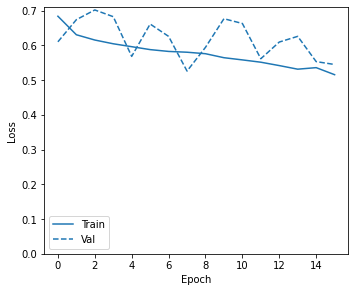

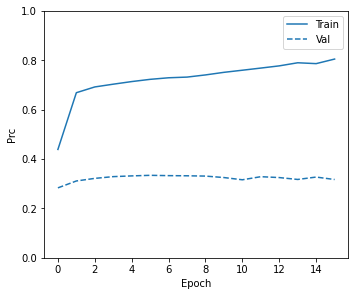

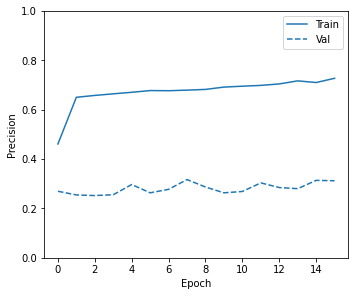

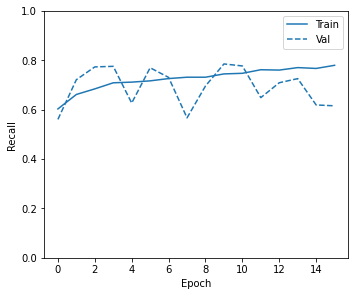

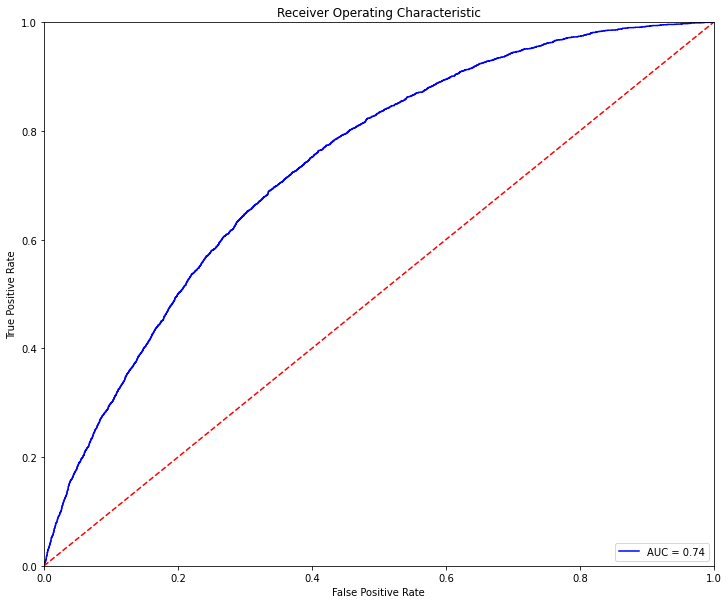

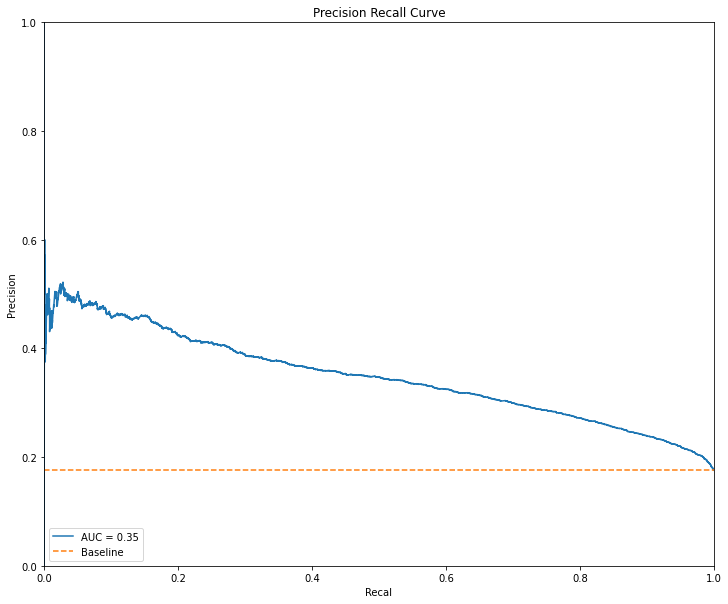

,threshold,tn,fp,fn,tp,f1,accuracy,precision,recall,auc
0,0.0,0,15979,0,3398,0.298397,0.175363,0.175363,1.000000,0.737168
1,0.1,418,15561,4,3394,0.303673,0.196728,0.179056,0.998823,0.737168
2,0.2,2155,13824,38,3360,0.326499,0.284616,0.195531,0.988817,0.737168
3,0.3,4171,11808,150,3248,0.352010,0.382877,0.215728,0.955856,0.737168
4,0.4,6577,9402,379,3019,0.381693,0.495226,0.243056,0.888464,0.737168
5,0.5,9108,6871,750,2648,0.410002,0.606699,0.278180,0.779282,0.737168
6,0.6,11525,4454,1303,2095,0.421233,0.702895,0.319896,0.616539,0.737168
7,0.7,13768,2211,2112,1286,0.373024,0.776900,0.367744,0.378458,0.737168
8,0.8,15531,448,3012,386,0.182420,0.821438,0.462830,0.113596,0.737168
9,0.9,15970,9,3392,6,0.003516,0.824483,0.400000,0.001766,0.737168


Model: "sequential_57"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_125 (Dense)            (None, 128)               66560     
_________________________________________________________________
activation_69 (Activation)   (None, 128)               0         
_________________________________________________________________
dense_126 (Dense)            (None, 128)               16512     
_________________________________________________________________
activation_70 (Activation)   (None, 128)               0         
_________________________________________________________________
dense_127 (Dense)            (None, 1)                 129       
Total params: 83,201
Trainable params: 83,201
Non-trainable params: 0
_________________________________________________________________


None

Epoch 1/100
101/101 [==============================] - 4s 20ms/step - loss: 0.6582 - tp: 18541.4804 - fp: 14034.3725 - tn: 25220.9216 - fn: 10419.3627 - accuracy: 0.6400 - precision: 0.5390 - recall: 0.6270 - auc: 0.6946 - prc: 0.5417 - val_loss: 0.6464 - val_tp: 1919.0000 - val_fp: 5290.0000 - val_tn: 7621.0000 - val_fn: 671.0000 - val_accuracy: 0.6154 - val_precision: 0.2662 - val_recall: 0.7409 - val_auc: 0.7264 - val_prc: 0.3330
Epoch 2/100
101/101 [==============================] - 1s 9ms/step - loss: 0.5936 - tp: 19000.5980 - fp: 9331.3431 - tn: 16987.8431 - fn: 7395.3529 - accuracy: 0.6816 - precision: 0.6698 - recall: 0.7196 - auc: 0.7443 - prc: 0.7129 - val_loss: 0.5844 - val_tp: 1772.0000 - val_fp: 4257.0000 - val_tn: 8654.0000 - val_fn: 818.0000 - val_accuracy: 0.6726 - val_precision: 0.2939 - val_recall: 0.6842 - val_auc: 0.7393 - val_prc: 0.3441
Epoch 3/100
101/101 [==============================] - 1s 9ms/step - loss: 0.5726 - tp: 19711.2941 - fp: 9039.0294 - tn: 17291.10

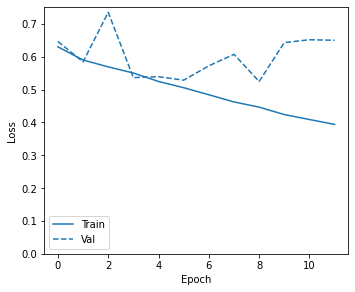

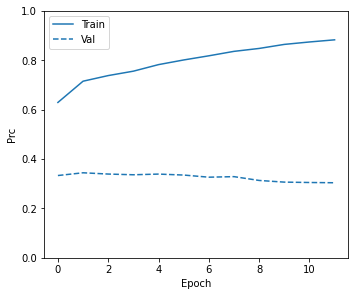

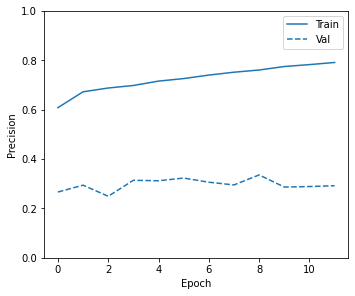

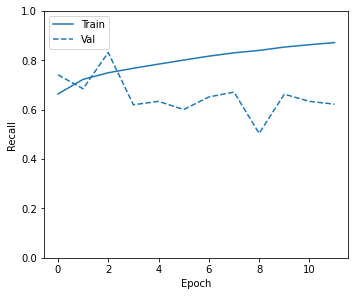

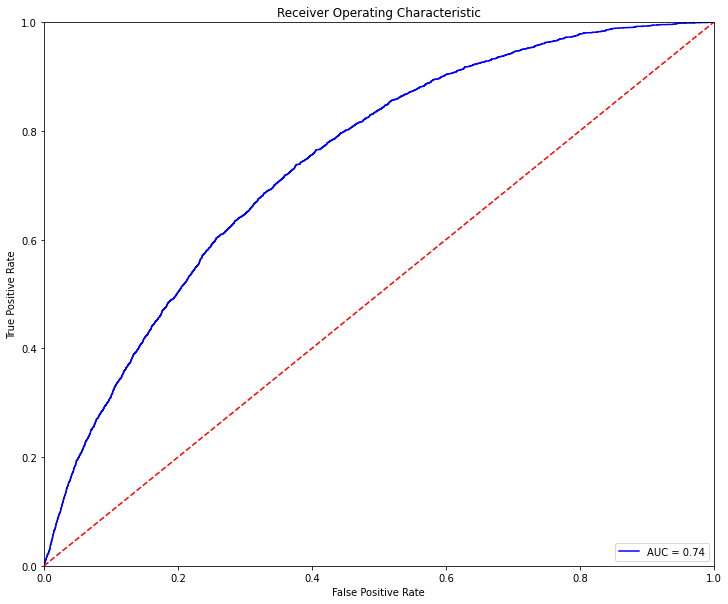

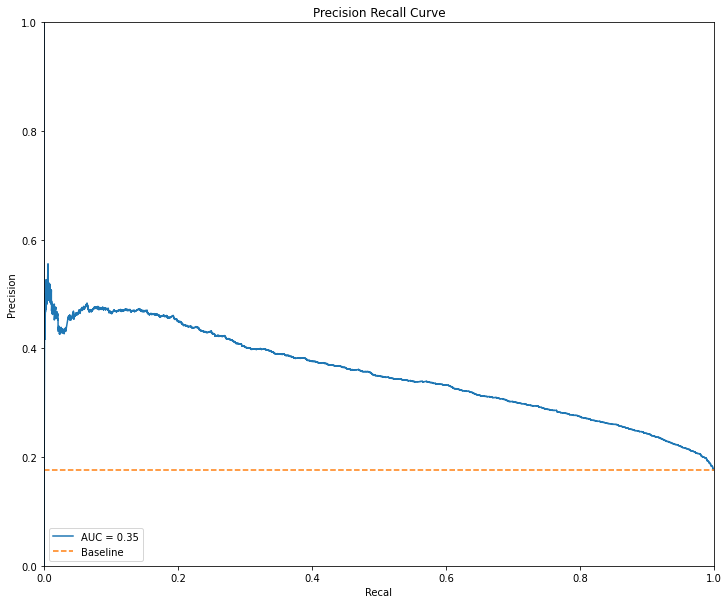

,threshold,tn,fp,fn,tp,f1,accuracy,precision,recall,auc
0,0.0,0,15979,0,3398,0.298397,0.175363,0.175363,1.000000,0.742529
1,0.1,1198,14781,15,3383,0.313793,0.236414,0.186248,0.995586,0.742529
2,0.2,3520,12459,94,3304,0.344867,0.352170,0.209605,0.972337,0.742529
3,0.3,5927,10052,279,3119,0.376486,0.466842,0.236808,0.917893,0.742529
4,0.4,8373,7606,617,2781,0.403482,0.575631,0.267739,0.818423,0.742529
5,0.5,10637,5342,1054,2344,0.422952,0.669918,0.304970,0.689818,0.742529
6,0.6,12687,3292,1650,1748,0.414316,0.744955,0.346825,0.514420,0.742529
7,0.7,14529,1450,2400,998,0.341430,0.801311,0.407680,0.293702,0.742529
8,0.8,15735,244,3176,222,0.114907,0.823502,0.476395,0.065333,0.742529
9,0.9,15977,2,3398,0,0.000000,0.824534,0.000000,0.000000,0.742529


Number of units: 256
Model: "sequential_58"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_128 (Dense)            (None, 256)               133120    
_________________________________________________________________
activation_71 (Activation)   (None, 256)               0         
_________________________________________________________________
dense_129 (Dense)            (None, 256)               65792     
_________________________________________________________________
activation_72 (Activation)   (None, 256)               0         
_________________________________________________________________
dense_130 (Dense)            (None, 1)                 257       
Total params: 199,169
Trainable params: 199,169
Non-trainable params: 0
_________________________________________________________________


None

Model: "sequential_59"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_131 (Dense)            (None, 256)               133120    
_________________________________________________________________
activation_73 (Activation)   (None, 256)               0         
_________________________________________________________________
dense_132 (Dense)            (None, 256)               65792     
_________________________________________________________________
activation_74 (Activation)   (None, 256)               0         
_________________________________________________________________
dense_133 (Dense)            (None, 1)                 257       
Total params: 199,169
Trainable params: 199,169
Non-trainable params: 0
_________________________________________________________________


None

Epoch 1/100
61/61 [==============================] - 4s 29ms/step - loss: 0.7013 - tp: 4851.6774 - fp: 15137.5806 - tn: 24490.0645 - fn: 3246.2903 - accuracy: 0.6175 - precision: 0.2432 - recall: 0.5919 - auc: 0.6492 - prc: 0.2580 - val_loss: 0.6716 - val_tp: 1902.0000 - val_fp: 5621.0000 - val_tn: 7290.0000 - val_fn: 688.0000 - val_accuracy: 0.5930 - val_precision: 0.2528 - val_recall: 0.7344 - val_auc: 0.7073 - val_prc: 0.3148
Epoch 2/100
61/61 [==============================] - 1s 11ms/step - loss: 0.6178 - tp: 3837.0645 - fp: 9898.9032 - tn: 16824.8065 - fn: 1663.8387 - accuracy: 0.6348 - precision: 0.2769 - recall: 0.7015 - auc: 0.7160 - prc: 0.3181 - val_loss: 0.5871 - val_tp: 1680.0000 - val_fp: 4202.0000 - val_tn: 8709.0000 - val_fn: 910.0000 - val_accuracy: 0.6702 - val_precision: 0.2856 - val_recall: 0.6486 - val_auc: 0.7263 - val_prc: 0.3311
Epoch 3/100
61/61 [==============================] - 1s 11ms/step - loss: 0.5981 - tp: 3918.5968 - fp: 9612.6935 - tn: 17124.5968 - fn:

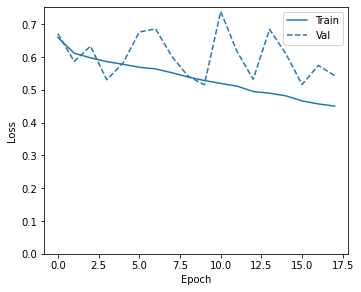

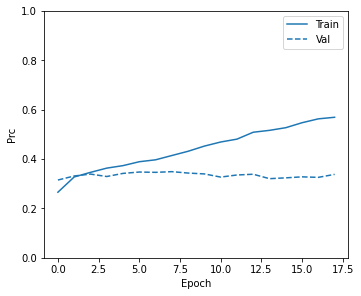

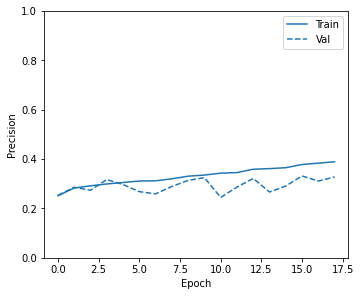

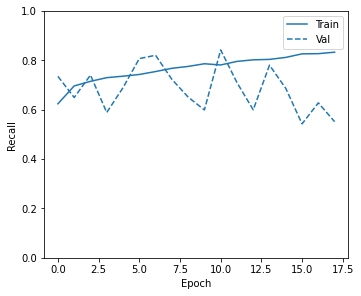

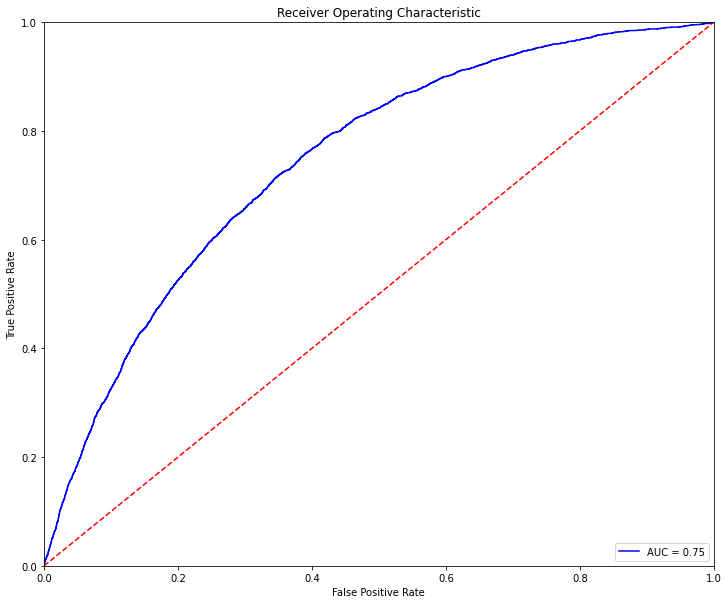

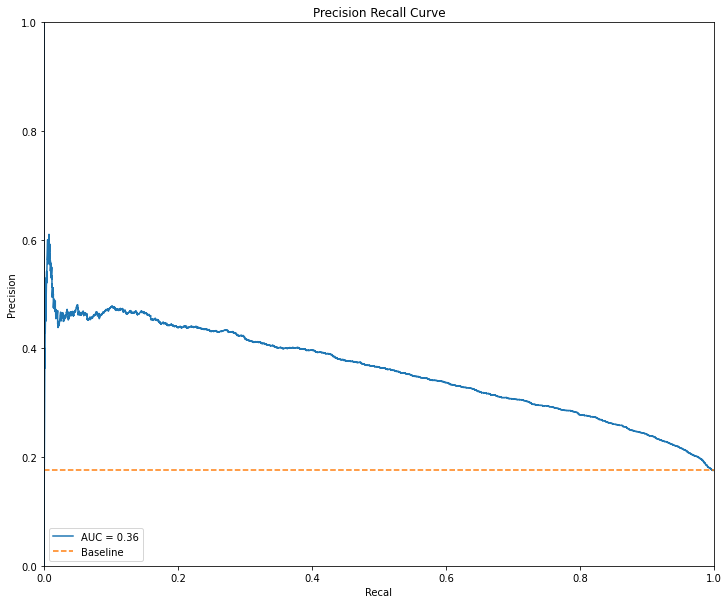

,threshold,tn,fp,fn,tp,f1,accuracy,precision,recall,auc
0,0.0,0,15979,0,3398,0.298397,0.175363,0.175363,1.000000,0.74534
1,0.1,1940,14039,52,3346,0.321994,0.272798,0.192465,0.984697,0.74534
2,0.2,4155,11824,158,3240,0.350991,0.381638,0.215082,0.953502,0.74534
3,0.3,6214,9765,326,3072,0.378442,0.479228,0.239308,0.904061,0.74534
4,0.4,8305,7674,575,2823,0.406333,0.574289,0.268934,0.830783,0.74534
5,0.5,10291,5688,939,2459,0.425985,0.657997,0.301829,0.723661,0.74534
6,0.6,12136,3843,1410,1988,0.430816,0.728905,0.340936,0.585050,0.74534
7,0.7,13937,2042,2057,1341,0.395517,0.788461,0.396394,0.394644,0.74534
8,0.8,15471,508,2956,442,0.203312,0.821231,0.465263,0.130077,0.74534
9,0.9,15968,11,3388,10,0.005850,0.824586,0.476190,0.002943,0.74534


Model: "sequential_60"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_134 (Dense)            (None, 256)               133120    
_________________________________________________________________
activation_75 (Activation)   (None, 256)               0         
_________________________________________________________________
dense_135 (Dense)            (None, 256)               65792     
_________________________________________________________________
activation_76 (Activation)   (None, 256)               0         
_________________________________________________________________
dense_136 (Dense)            (None, 1)                 257       
Total params: 199,169
Trainable params: 199,169
Non-trainable params: 0
_________________________________________________________________


None

Epoch 1/100
21/21 [==============================] - 4s 70ms/step - loss: 0.7295 - tp: 4413.7727 - fp: 5530.4545 - tn: 13226.2727 - fn: 4026.3182 - accuracy: 0.6547 - precision: 0.4299 - recall: 0.5181 - auc: 0.6972 - prc: 0.4305 - val_loss: 0.7426 - val_tp: 2263.0000 - val_fp: 8597.0000 - val_tn: 4314.0000 - val_fn: 327.0000 - val_accuracy: 0.4243 - val_precision: 0.2084 - val_recall: 0.8737 - val_auc: 0.6876 - val_prc: 0.2952
Epoch 2/100
21/21 [==============================] - 0s 15ms/step - loss: 0.6406 - tp: 4081.8636 - fp: 2387.5455 - tn: 3463.3182 - fn: 1763.0909 - accuracy: 0.6407 - precision: 0.6243 - recall: 0.7237 - auc: 0.6929 - prc: 0.6677 - val_loss: 0.5670 - val_tp: 1445.0000 - val_fp: 3651.0000 - val_tn: 9260.0000 - val_fn: 1145.0000 - val_accuracy: 0.6906 - val_precision: 0.2836 - val_recall: 0.5579 - val_auc: 0.6968 - val_prc: 0.3049
Epoch 3/100
21/21 [==============================] - 0s 15ms/step - loss: 0.6211 - tp: 4018.0455 - fp: 2114.5909 - tn: 3736.7727 - fn: 1

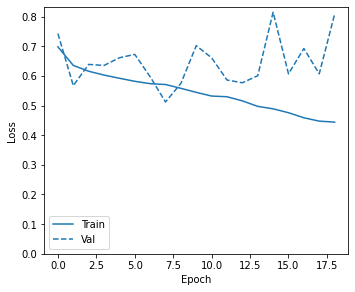

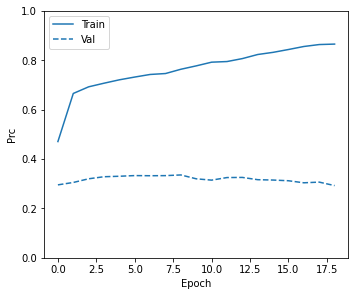

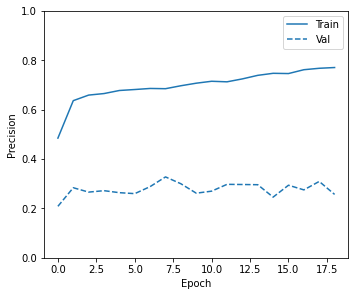

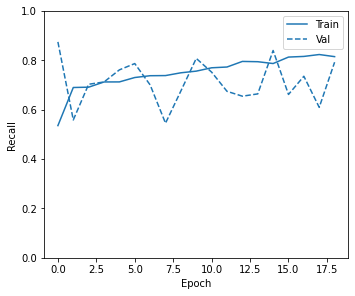

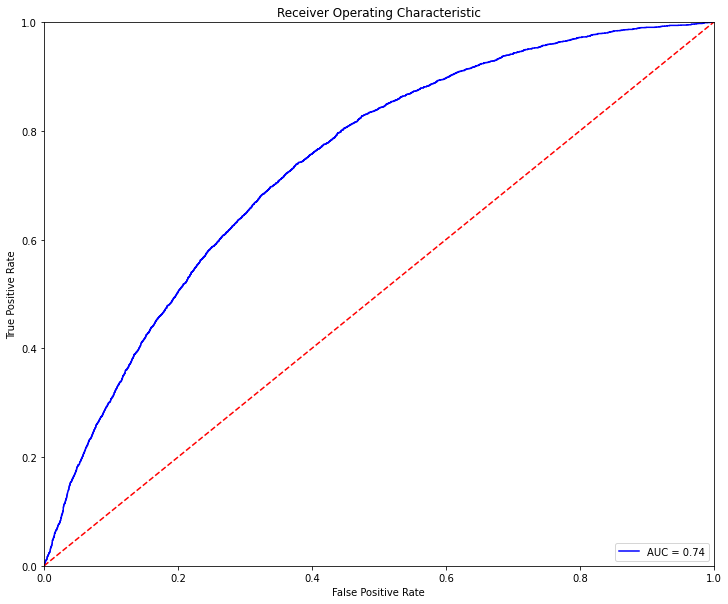

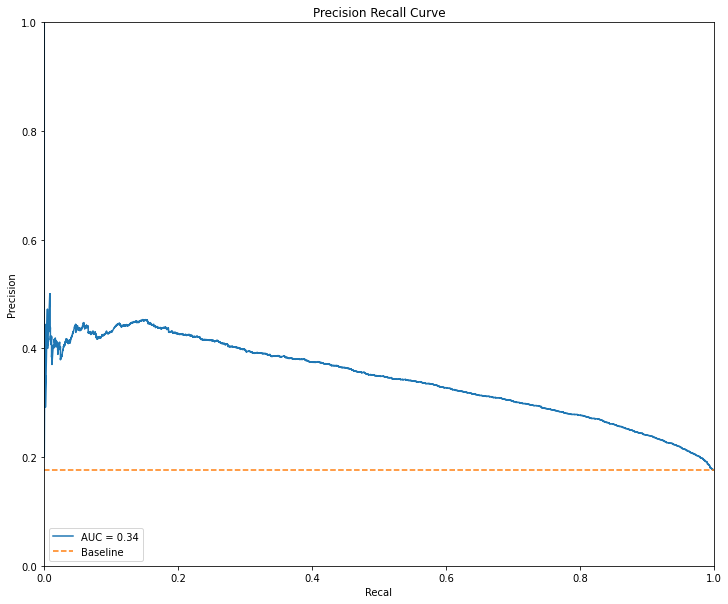

,threshold,tn,fp,fn,tp,f1,accuracy,precision,recall,auc
0,0.0,0,15979,0,3398,0.298397,0.175363,0.175363,1.000000,0.739858
1,0.1,2392,13587,57,3341,0.328742,0.295866,0.197365,0.983225,0.739858
2,0.2,4781,11198,195,3203,0.359908,0.412035,0.222415,0.942613,0.739858
3,0.3,6999,8980,414,2984,0.388491,0.515198,0.249415,0.878164,0.739858
4,0.4,9085,6894,726,2672,0.412218,0.606750,0.279323,0.786345,0.739858
5,0.5,10872,5107,1107,2291,0.424416,0.679311,0.309678,0.674220,0.739858
6,0.6,12549,3430,1607,1791,0.415593,0.740053,0.343038,0.527075,0.739858
7,0.7,14214,1765,2271,1127,0.358347,0.791712,0.389696,0.331666,0.739858
8,0.8,15492,487,3011,387,0.181180,0.819477,0.442792,0.113891,0.739858
9,0.9,15950,29,3373,25,0.014484,0.824431,0.462963,0.007357,0.739858


Model: "sequential_61"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_137 (Dense)            (None, 256)               133120    
_________________________________________________________________
activation_77 (Activation)   (None, 256)               0         
_________________________________________________________________
dense_138 (Dense)            (None, 256)               65792     
_________________________________________________________________
activation_78 (Activation)   (None, 256)               0         
_________________________________________________________________
dense_139 (Dense)            (None, 1)                 257       
Total params: 199,169
Trainable params: 199,169
Non-trainable params: 0
_________________________________________________________________


None

Epoch 1/100
101/101 [==============================] - 5s 25ms/step - loss: 0.6741 - tp: 18580.4510 - fp: 16263.0980 - tn: 22992.1961 - fn: 10380.3922 - accuracy: 0.5990 - precision: 0.4987 - recall: 0.6314 - auc: 0.6415 - prc: 0.4800 - val_loss: 0.6256 - val_tp: 1812.0000 - val_fp: 4830.0000 - val_tn: 8081.0000 - val_fn: 778.0000 - val_accuracy: 0.6382 - val_precision: 0.2728 - val_recall: 0.6996 - val_auc: 0.7229 - val_prc: 0.3292
Epoch 2/100
101/101 [==============================] - 1s 11ms/step - loss: 0.5918 - tp: 19126.6275 - fp: 9355.8235 - tn: 16963.3627 - fn: 7269.3235 - accuracy: 0.6833 - precision: 0.6707 - recall: 0.7234 - auc: 0.7464 - prc: 0.7166 - val_loss: 0.6522 - val_tp: 2033.0000 - val_fp: 5604.0000 - val_tn: 7307.0000 - val_fn: 557.0000 - val_accuracy: 0.6025 - val_precision: 0.2662 - val_recall: 0.7849 - val_auc: 0.7398 - val_prc: 0.3440
Epoch 3/100
101/101 [==============================] - 1s 10ms/step - loss: 0.5667 - tp: 19955.4804 - fp: 9039.9412 - tn: 17290.

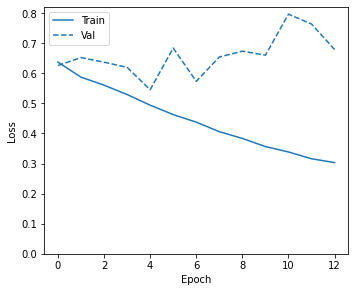

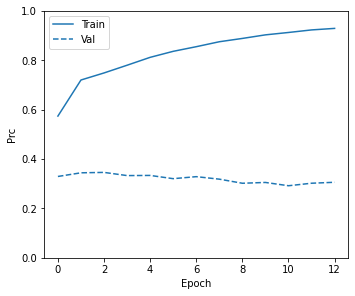

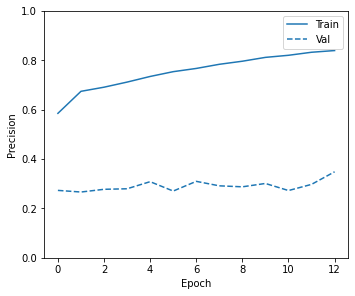

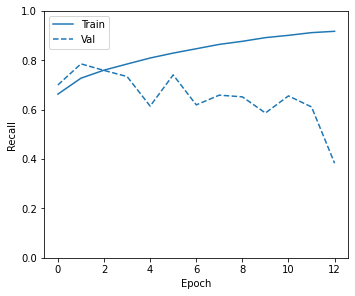

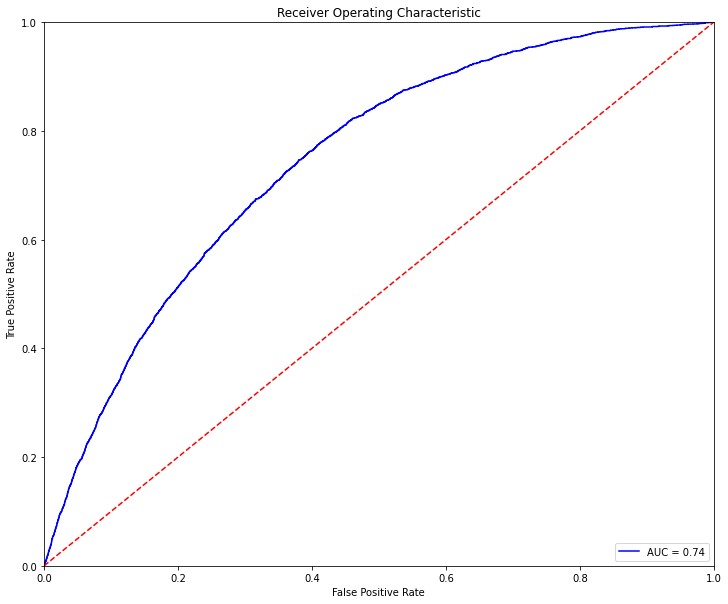

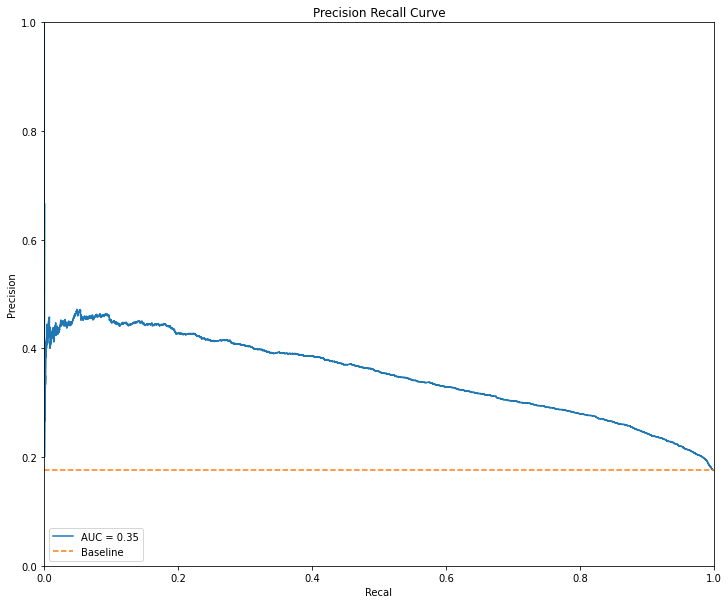

,threshold,tn,fp,fn,tp,f1,accuracy,precision,recall,auc
0,0.0,0,15979,0,3398,0.298397,0.175363,0.175363,1.000000,0.74442
1,0.1,2173,13806,41,3357,0.326541,0.285390,0.195595,0.987934,0.74442
2,0.2,4155,11824,147,3251,0.351973,0.382206,0.215655,0.956739,0.74442
3,0.3,6024,9955,295,3103,0.377127,0.471022,0.237632,0.913184,0.74442
4,0.4,7818,8161,493,2905,0.401687,0.553388,0.262516,0.854915,0.74442
5,0.5,9652,6327,811,2587,0.420240,0.631625,0.290218,0.761330,0.74442
6,0.6,11397,4582,1238,2160,0.426036,0.699644,0.320380,0.635668,0.74442
7,0.7,13266,2713,1819,1579,0.410663,0.766114,0.367894,0.464685,0.74442
8,0.8,15056,923,2711,687,0.274361,0.812458,0.426708,0.202178,0.74442
9,0.9,15948,31,3374,24,0.013901,0.824276,0.436364,0.007063,0.74442


Number of units: 512
Model: "sequential_62"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_140 (Dense)            (None, 512)               266240    
_________________________________________________________________
activation_79 (Activation)   (None, 512)               0         
_________________________________________________________________
dense_141 (Dense)            (None, 512)               262656    
_________________________________________________________________
activation_80 (Activation)   (None, 512)               0         
_________________________________________________________________
dense_142 (Dense)            (None, 1)                 513       
Total params: 529,409
Trainable params: 529,409
Non-trainable params: 0
_________________________________________________________________


None

Model: "sequential_63"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_143 (Dense)            (None, 512)               266240    
_________________________________________________________________
activation_81 (Activation)   (None, 512)               0         
_________________________________________________________________
dense_144 (Dense)            (None, 512)               262656    
_________________________________________________________________
activation_82 (Activation)   (None, 512)               0         
_________________________________________________________________
dense_145 (Dense)            (None, 1)                 513       
Total params: 529,409
Trainable params: 529,409
Non-trainable params: 0
_________________________________________________________________


None

Epoch 1/100
61/61 [==============================] - 4s 30ms/step - loss: 0.7267 - tp: 4376.5000 - fp: 13617.0323 - tn: 26010.6129 - fn: 3721.4677 - accuracy: 0.6427 - precision: 0.2437 - recall: 0.5208 - auc: 0.6336 - prc: 0.2564 - val_loss: 0.6802 - val_tp: 1912.0000 - val_fp: 5586.0000 - val_tn: 7325.0000 - val_fn: 678.0000 - val_accuracy: 0.5959 - val_precision: 0.2550 - val_recall: 0.7382 - val_auc: 0.7097 - val_prc: 0.3172
Epoch 2/100
61/61 [==============================] - 1s 13ms/step - loss: 0.6164 - tp: 3811.4516 - fp: 9604.8387 - tn: 17118.8710 - fn: 1689.4516 - accuracy: 0.6459 - precision: 0.2829 - recall: 0.6949 - auc: 0.7185 - prc: 0.3204 - val_loss: 0.7504 - val_tp: 2136.0000 - val_fp: 6553.0000 - val_tn: 6358.0000 - val_fn: 454.0000 - val_accuracy: 0.5480 - val_precision: 0.2458 - val_recall: 0.8247 - val_auc: 0.7295 - val_prc: 0.3352
Epoch 3/100
61/61 [==============================] - 1s 12ms/step - loss: 0.6018 - tp: 3881.0968 - fp: 9430.7097 - tn: 17306.5806 - fn:

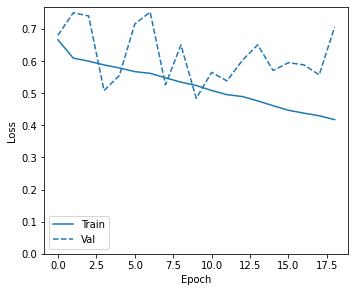

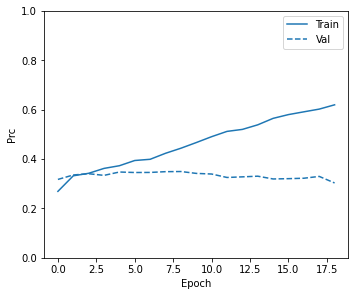

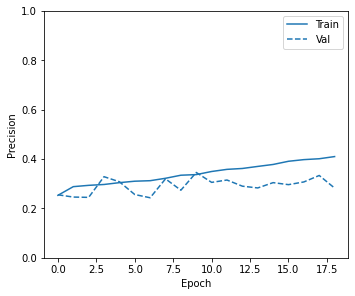

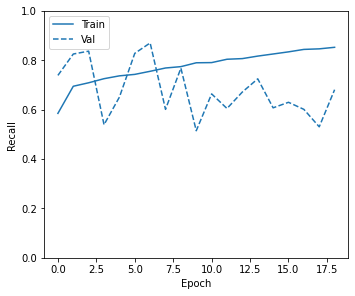

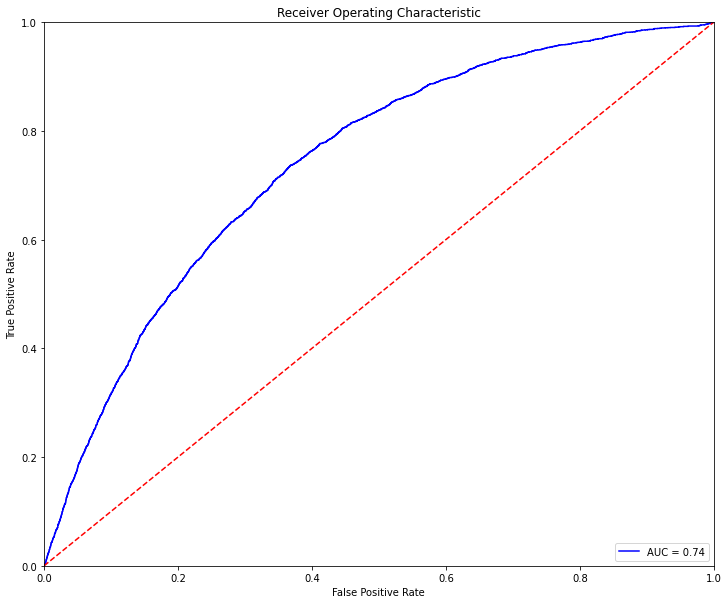

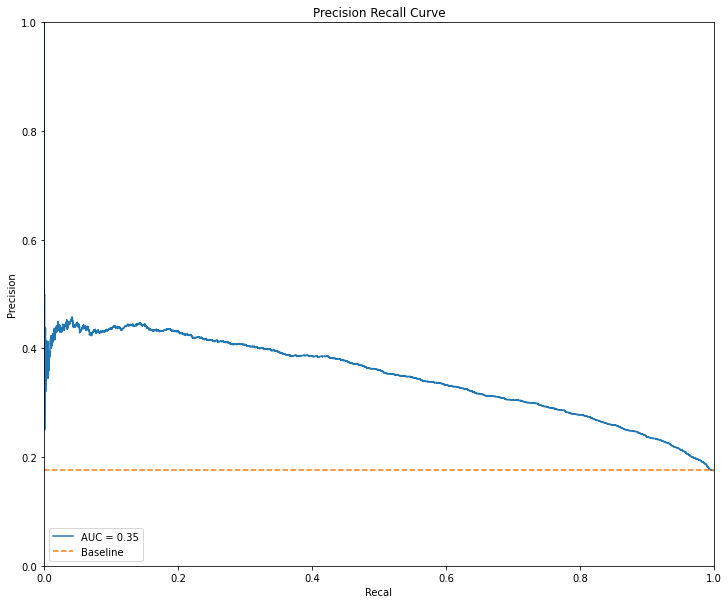

,threshold,tn,fp,fn,tp,f1,accuracy,precision,recall,auc
0,0.0,0,15979,0,3398,0.298397,0.175363,0.175363,1.000000,0.740594
1,0.1,2100,13879,64,3334,0.323517,0.280436,0.193691,0.981165,0.740594
2,0.2,4085,11894,167,3231,0.348864,0.377561,0.213620,0.950853,0.740594
3,0.3,5873,10106,306,3092,0.372620,0.462662,0.234278,0.909947,0.740594
4,0.4,7666,8313,499,2899,0.396851,0.545234,0.258562,0.853149,0.740594
5,0.5,9481,6498,785,2613,0.417779,0.624142,0.286796,0.768982,0.740594
6,0.6,11274,4705,1206,2192,0.425838,0.694948,0.317819,0.645085,0.740594
7,0.7,13166,2813,1773,1625,0.414752,0.763328,0.366156,0.478222,0.740594
8,0.8,14999,980,2671,727,0.284819,0.811581,0.425893,0.213949,0.740594
9,0.9,15921,58,3357,41,0.023449,0.823760,0.414141,0.012066,0.740594


Model: "sequential_64"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_146 (Dense)            (None, 512)               266240    
_________________________________________________________________
activation_83 (Activation)   (None, 512)               0         
_________________________________________________________________
dense_147 (Dense)            (None, 512)               262656    
_________________________________________________________________
activation_84 (Activation)   (None, 512)               0         
_________________________________________________________________
dense_148 (Dense)            (None, 1)                 513       
Total params: 529,409
Trainable params: 529,409
Non-trainable params: 0
_________________________________________________________________


None

Epoch 1/100
21/21 [==============================] - 4s 70ms/step - loss: 0.8114 - tp: 5046.7273 - fp: 7642.9545 - tn: 11113.7727 - fn: 3393.3636 - accuracy: 0.5983 - precision: 0.3868 - recall: 0.6074 - auc: 0.6366 - prc: 0.3747 - val_loss: 0.6265 - val_tp: 1158.0000 - val_fp: 2786.0000 - val_tn: 10125.0000 - val_fn: 1432.0000 - val_accuracy: 0.7279 - val_precision: 0.2936 - val_recall: 0.4471 - val_auc: 0.6781 - val_prc: 0.2843
Epoch 2/100
21/21 [==============================] - 0s 17ms/step - loss: 0.6485 - tp: 3707.4545 - fp: 2047.1818 - tn: 3803.6818 - fn: 2137.5000 - accuracy: 0.6389 - precision: 0.6482 - recall: 0.6179 - auc: 0.6852 - prc: 0.6634 - val_loss: 0.6962 - val_tp: 1886.0000 - val_fp: 5633.0000 - val_tn: 7278.0000 - val_fn: 704.0000 - val_accuracy: 0.5912 - val_precision: 0.2508 - val_recall: 0.7282 - val_auc: 0.6983 - val_prc: 0.3051
Epoch 3/100
21/21 [==============================] - 0s 15ms/step - loss: 0.6237 - tp: 3944.5909 - fp: 2111.3636 - tn: 3740.0000 - fn: 

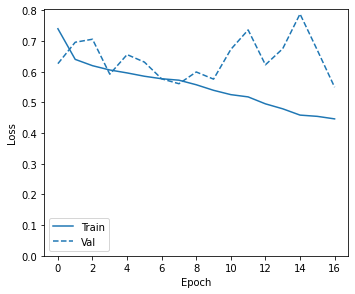

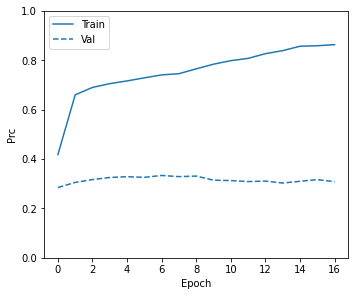

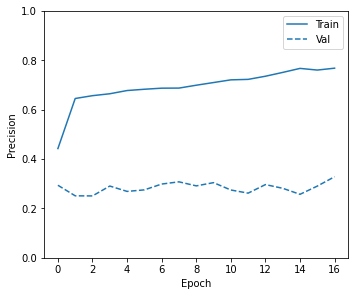

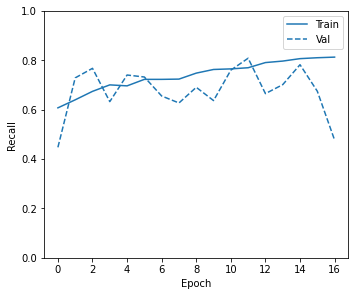

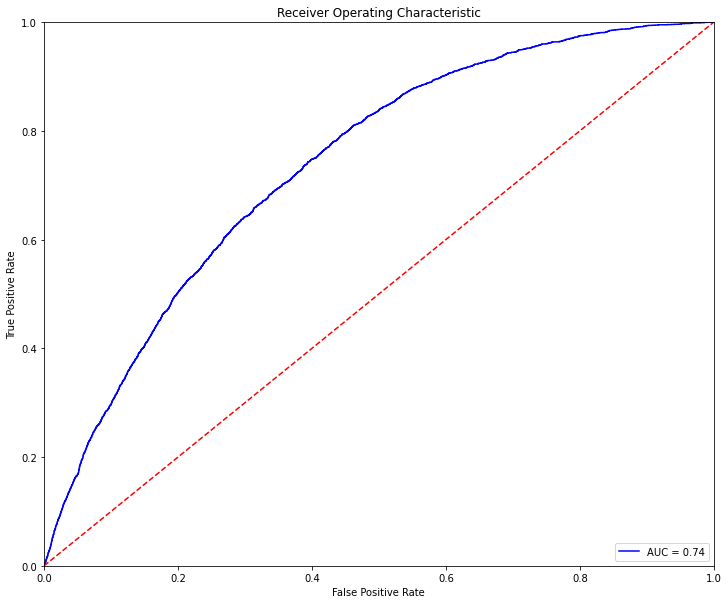

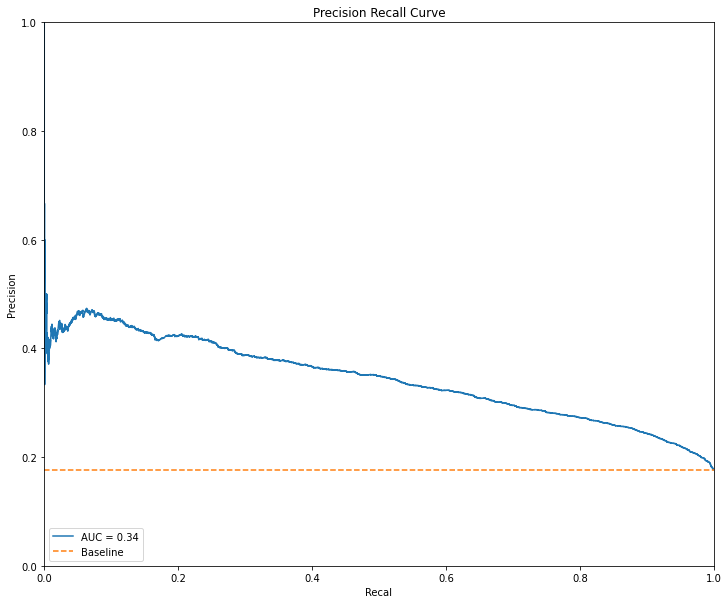

,threshold,tn,fp,fn,tp,f1,accuracy,precision,recall,auc
0,0.0,0,15979,0,3398,0.298397,0.175363,0.175363,1.000000,0.73739
1,0.1,1445,14534,19,3379,0.317113,0.248955,0.188634,0.994408,0.73739
2,0.2,3927,12052,130,3268,0.349183,0.371317,0.213316,0.961742,0.73739
3,0.3,6482,9497,339,3059,0.383477,0.492388,0.243629,0.900235,0.73739
4,0.4,8916,7063,713,2685,0.408489,0.598699,0.275441,0.790171,0.73739
5,0.5,10991,4988,1178,2220,0.418631,0.681788,0.307991,0.653325,0.73739
6,0.6,12812,3167,1699,1699,0.411181,0.748878,0.349157,0.500000,0.73739
7,0.7,14509,1470,2433,965,0.330876,0.798576,0.396304,0.283991,0.73739
8,0.8,15582,397,3070,328,0.159107,0.821077,0.452414,0.096527,0.73739
9,0.9,15955,24,3382,16,0.009308,0.824225,0.400000,0.004709,0.73739


Model: "sequential_65"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_149 (Dense)            (None, 512)               266240    
_________________________________________________________________
activation_85 (Activation)   (None, 512)               0         
_________________________________________________________________
dense_150 (Dense)            (None, 512)               262656    
_________________________________________________________________
activation_86 (Activation)   (None, 512)               0         
_________________________________________________________________
dense_151 (Dense)            (None, 1)                 513       
Total params: 529,409
Trainable params: 529,409
Non-trainable params: 0
_________________________________________________________________


None

Epoch 1/100
101/101 [==============================] - 4s 23ms/step - loss: 0.7039 - tp: 17822.7255 - fp: 13567.6667 - tn: 25687.6275 - fn: 11138.1176 - accuracy: 0.6386 - precision: 0.5377 - recall: 0.5940 - auc: 0.6816 - prc: 0.5281 - val_loss: 0.5644 - val_tp: 1581.0000 - val_fp: 3716.0000 - val_tn: 9195.0000 - val_fn: 1009.0000 - val_accuracy: 0.6952 - val_precision: 0.2985 - val_recall: 0.6104 - val_auc: 0.7272 - val_prc: 0.3302
Epoch 2/100
101/101 [==============================] - 1s 13ms/step - loss: 0.5917 - tp: 18977.2941 - fp: 9188.8137 - tn: 17130.3725 - fn: 7418.6569 - accuracy: 0.6834 - precision: 0.6743 - recall: 0.7127 - auc: 0.7466 - prc: 0.7178 - val_loss: 0.5727 - val_tp: 1738.0000 - val_fp: 4109.0000 - val_tn: 8802.0000 - val_fn: 852.0000 - val_accuracy: 0.6800 - val_precision: 0.2972 - val_recall: 0.6710 - val_auc: 0.7404 - val_prc: 0.3424
Epoch 3/100
101/101 [==============================] - 1s 12ms/step - loss: 0.5649 - tp: 19837.2745 - fp: 8882.5588 - tn: 17447

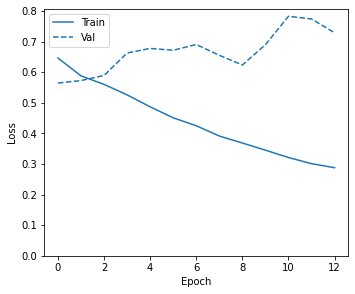

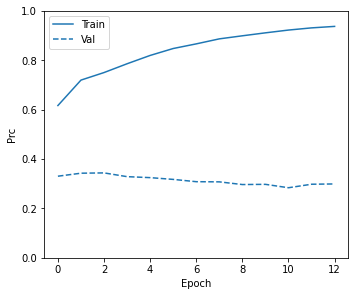

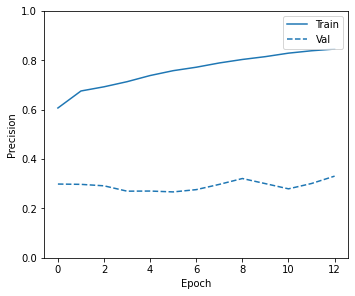

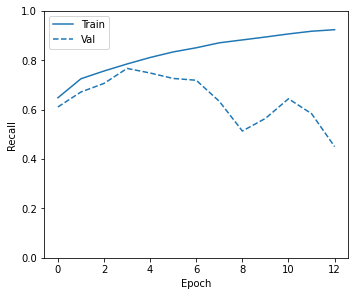

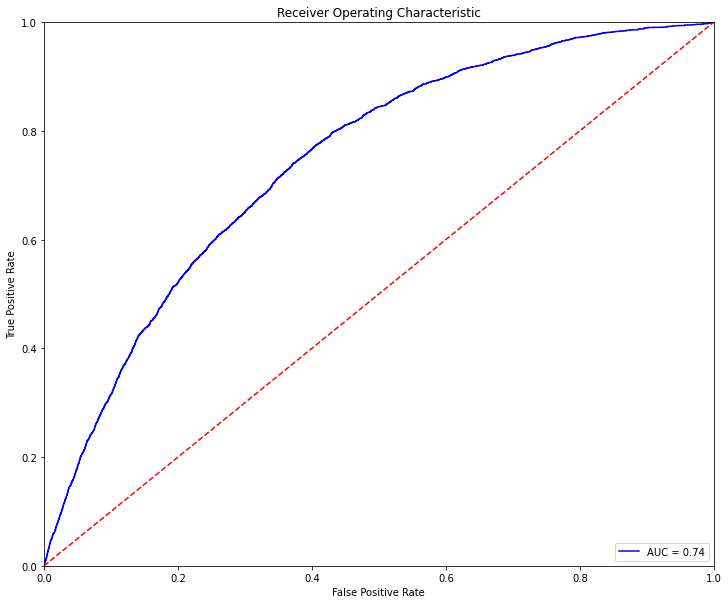

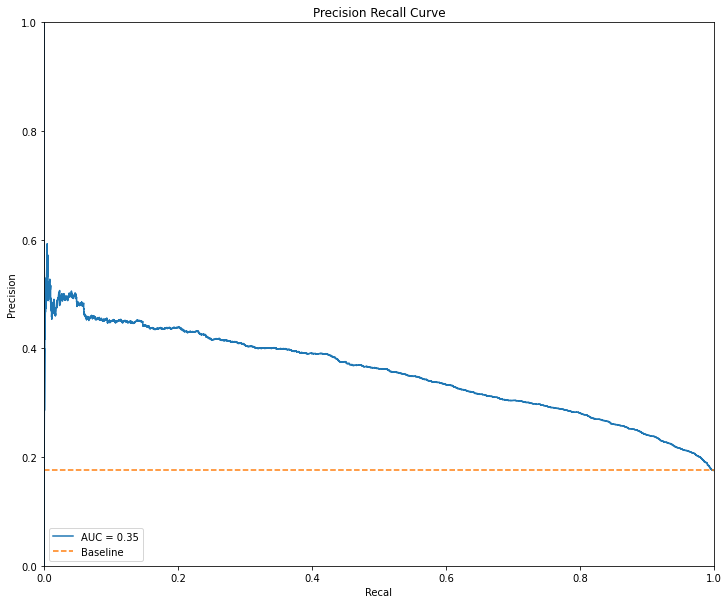

,threshold,tn,fp,fn,tp,f1,accuracy,precision,recall,auc
0,0.0,0,15979,0,3398,0.298397,0.175363,0.175363,1.000000,0.743902
1,0.1,2506,13473,63,3335,0.330100,0.301440,0.198417,0.981460,0.743902
2,0.2,4794,11185,208,3190,0.358971,0.412035,0.221913,0.938788,0.743902
3,0.3,6867,9112,385,3013,0.388198,0.509883,0.248495,0.886698,0.743902
4,0.4,8704,7275,636,2762,0.411165,0.591732,0.275182,0.812831,0.743902
5,0.5,10403,5576,976,2422,0.425061,0.661867,0.302826,0.712772,0.743902
6,0.6,12087,3892,1412,1986,0.428202,0.726273,0.337870,0.584461,0.743902
7,0.7,13871,2108,2044,1354,0.394752,0.785725,0.391103,0.398470,0.743902
8,0.8,15499,480,3005,393,0.184032,0.820148,0.450172,0.115656,0.743902
9,0.9,15971,8,3390,8,0.004687,0.824637,0.500000,0.002354,0.743902


Number of units: 1024
Model: "sequential_66"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_152 (Dense)            (None, 1024)              532480    
_________________________________________________________________
activation_87 (Activation)   (None, 1024)              0         
_________________________________________________________________
dense_153 (Dense)            (None, 1024)              1049600   
_________________________________________________________________
activation_88 (Activation)   (None, 1024)              0         
_________________________________________________________________
dense_154 (Dense)            (None, 1)                 1025      
Total params: 1,583,105
Trainable params: 1,583,105
Non-trainable params: 0
_________________________________________________________________


None

Model: "sequential_67"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_155 (Dense)            (None, 1024)              532480    
_________________________________________________________________
activation_89 (Activation)   (None, 1024)              0         
_________________________________________________________________
dense_156 (Dense)            (None, 1024)              1049600   
_________________________________________________________________
activation_90 (Activation)   (None, 1024)              0         
_________________________________________________________________
dense_157 (Dense)            (None, 1)                 1025      
Total params: 1,583,105
Trainable params: 1,583,105
Non-trainable params: 0
_________________________________________________________________


None

Epoch 1/100
61/61 [==============================] - 4s 35ms/step - loss: 0.8200 - tp: 4246.5323 - fp: 13798.9032 - tn: 25828.7419 - fn: 3851.4355 - accuracy: 0.6370 - precision: 0.2378 - recall: 0.5111 - auc: 0.6237 - prc: 0.2395 - val_loss: 0.7111 - val_tp: 2012.0000 - val_fp: 6309.0000 - val_tn: 6602.0000 - val_fn: 578.0000 - val_accuracy: 0.5557 - val_precision: 0.2418 - val_recall: 0.7768 - val_auc: 0.7075 - val_prc: 0.3172
Epoch 2/100
61/61 [==============================] - 1s 17ms/step - loss: 0.6183 - tp: 3836.0645 - fp: 9800.8226 - tn: 16922.8871 - fn: 1664.8387 - accuracy: 0.6391 - precision: 0.2798 - recall: 0.7020 - auc: 0.7162 - prc: 0.3157 - val_loss: 0.6272 - val_tp: 1828.0000 - val_fp: 4868.0000 - val_tn: 8043.0000 - val_fn: 762.0000 - val_accuracy: 0.6368 - val_precision: 0.2730 - val_recall: 0.7058 - val_auc: 0.7272 - val_prc: 0.3314
Epoch 3/100
61/61 [==============================] - 1s 16ms/step - loss: 0.5977 - tp: 3948.6774 - fp: 9776.8065 - tn: 16960.4839 - fn:

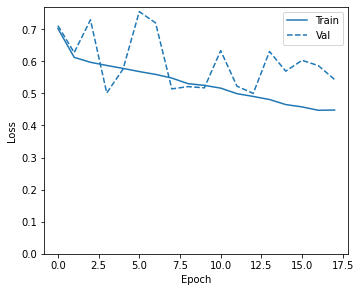

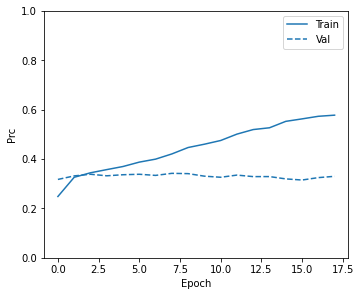

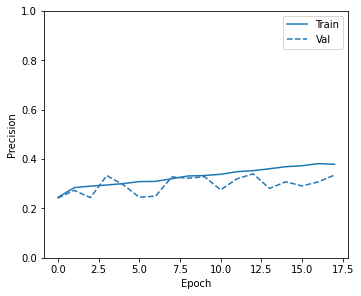

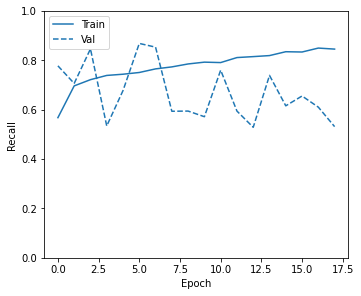

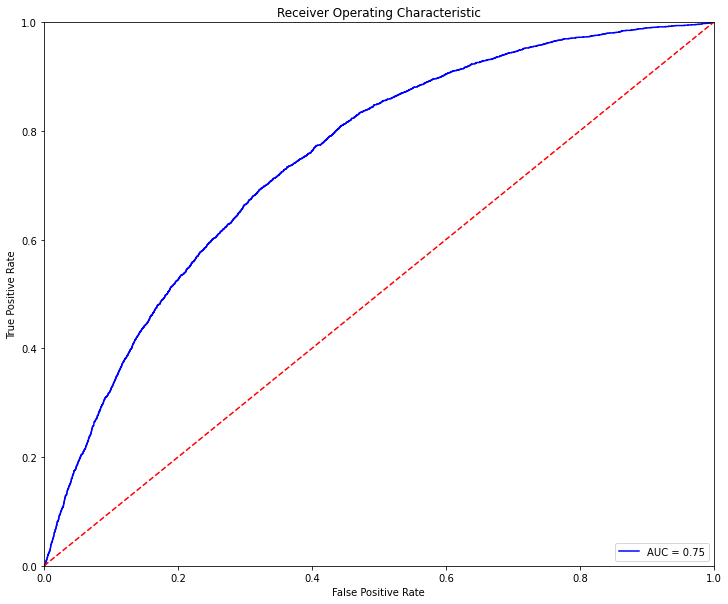

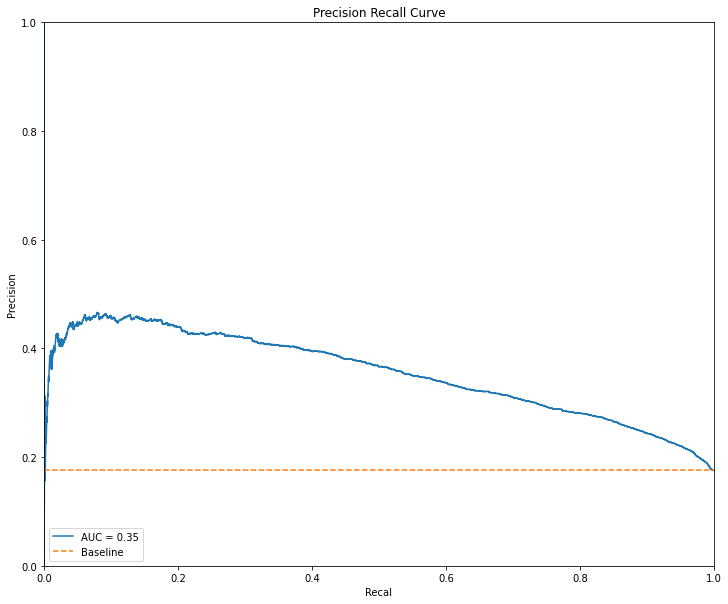

,threshold,tn,fp,fn,tp,f1,accuracy,precision,recall,auc
0,0.0,0,15979,0,3398,0.298397,0.175363,0.175363,1.000000,0.747676
1,0.1,4446,11533,161,3237,0.356341,0.396501,0.219160,0.952619,0.747676
2,0.2,6935,9044,389,3009,0.389489,0.513186,0.249647,0.885521,0.747676
3,0.3,8905,7074,651,2747,0.415614,0.601331,0.279707,0.808417,0.747676
4,0.4,10567,5412,993,2405,0.428890,0.669453,0.307663,0.707769,0.747676
5,0.5,12029,3950,1376,2022,0.431590,0.725138,0.338580,0.595056,0.747676
6,0.6,13376,2603,1816,1582,0.417249,0.771946,0.378017,0.465568,0.747676
7,0.7,14559,1420,2373,1025,0.350847,0.804252,0.419223,0.301648,0.747676
8,0.8,15563,416,3049,349,0.167668,0.821180,0.456209,0.102707,0.747676
9,0.9,15957,22,3393,5,0.002920,0.823760,0.185185,0.001471,0.747676


Model: "sequential_68"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_158 (Dense)            (None, 1024)              532480    
_________________________________________________________________
activation_91 (Activation)   (None, 1024)              0         
_________________________________________________________________
dense_159 (Dense)            (None, 1024)              1049600   
_________________________________________________________________
activation_92 (Activation)   (None, 1024)              0         
_________________________________________________________________
dense_160 (Dense)            (None, 1)                 1025      
Total params: 1,583,105
Trainable params: 1,583,105
Non-trainable params: 0
_________________________________________________________________


None

Epoch 1/100
21/21 [==============================] - 4s 77ms/step - loss: 1.0175 - tp: 4539.1364 - fp: 5841.0000 - tn: 12915.7273 - fn: 3900.9545 - accuracy: 0.6496 - precision: 0.4273 - recall: 0.5411 - auc: 0.6650 - prc: 0.4223 - val_loss: 0.6857 - val_tp: 1805.0000 - val_fp: 5609.0000 - val_tn: 7302.0000 - val_fn: 785.0000 - val_accuracy: 0.5875 - val_precision: 0.2435 - val_recall: 0.6969 - val_auc: 0.6756 - val_prc: 0.2805
Epoch 2/100
21/21 [==============================] - 0s 22ms/step - loss: 0.6583 - tp: 3897.3182 - fp: 2146.4545 - tn: 3704.4091 - fn: 1947.6364 - accuracy: 0.6472 - precision: 0.6428 - recall: 0.6693 - auc: 0.6879 - prc: 0.6618 - val_loss: 0.6339 - val_tp: 1673.0000 - val_fp: 4593.0000 - val_tn: 8318.0000 - val_fn: 917.0000 - val_accuracy: 0.6445 - val_precision: 0.2670 - val_recall: 0.6459 - val_auc: 0.6950 - val_prc: 0.3012
Epoch 3/100
21/21 [==============================] - 0s 21ms/step - loss: 0.6232 - tp: 3869.7727 - fp: 2001.3182 - tn: 3850.0455 - fn: 19

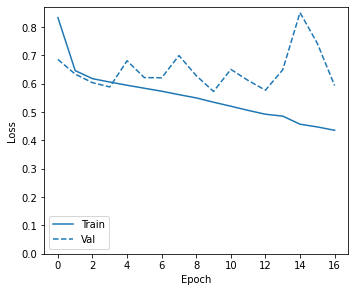

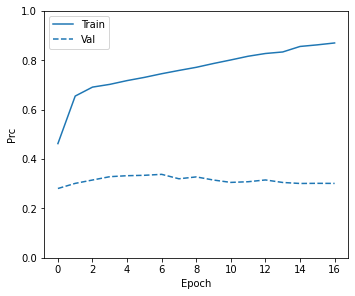

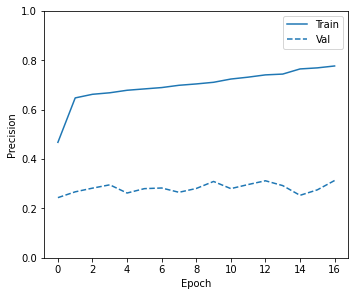

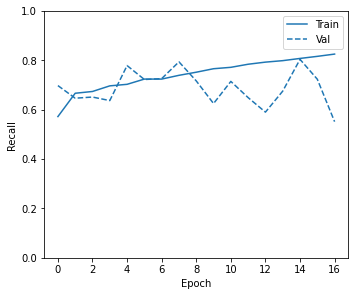

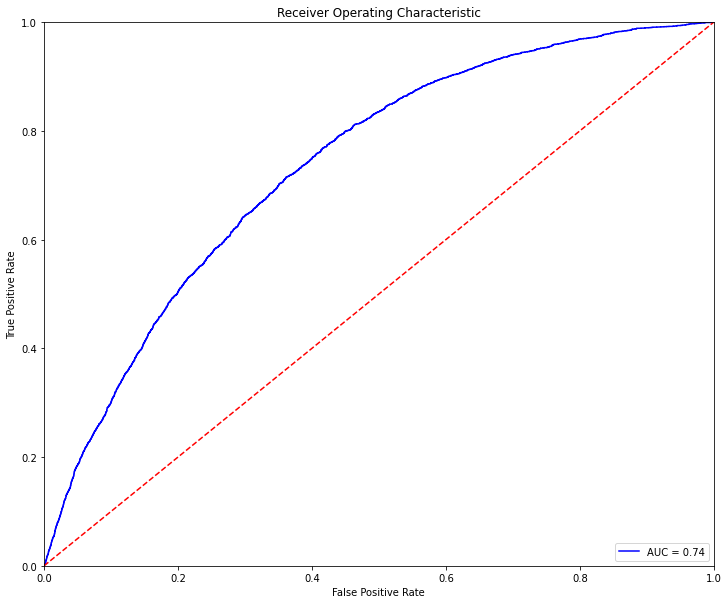

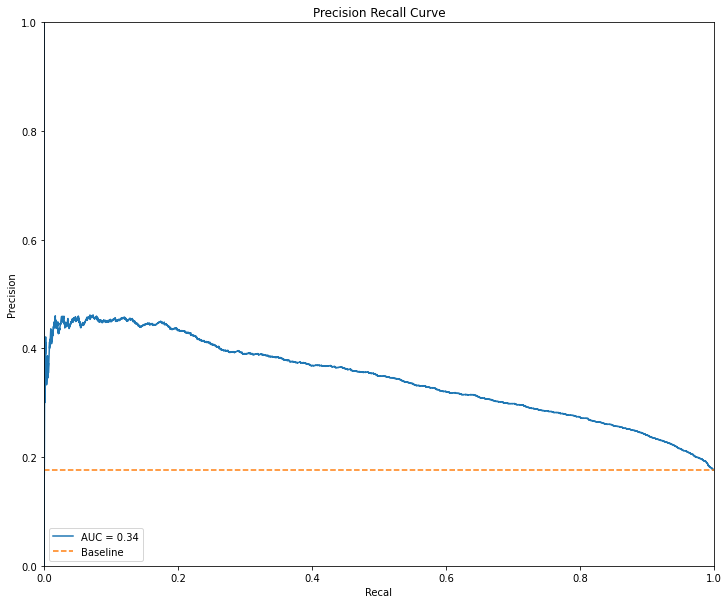

,threshold,tn,fp,fn,tp,f1,accuracy,precision,recall,auc
0,0.0,0,15979,0,3398,0.298397,0.175363,0.175363,1.000000,0.736504
1,0.1,1214,14765,29,3369,0.312930,0.236518,0.185784,0.991466,0.736504
2,0.2,3448,12531,121,3277,0.341248,0.347061,0.207300,0.964391,0.736504
3,0.3,5672,10307,279,3119,0.370780,0.453682,0.232310,0.917893,0.736504
4,0.4,7962,8017,555,2843,0.398794,0.557620,0.261786,0.836669,0.736504
5,0.5,10121,5858,957,2441,0.417372,0.648294,0.294132,0.718364,0.736504
6,0.6,12005,3974,1453,1945,0.417516,0.719926,0.328603,0.572396,0.736504
7,0.7,13889,2090,2141,1257,0.372721,0.781648,0.375560,0.369923,0.736504
8,0.8,15387,592,2924,474,0.212366,0.818548,0.444653,0.139494,0.736504
9,0.9,15939,40,3371,27,0.015584,0.823967,0.402985,0.007946,0.736504


Model: "sequential_69"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_161 (Dense)            (None, 1024)              532480    
_________________________________________________________________
activation_93 (Activation)   (None, 1024)              0         
_________________________________________________________________
dense_162 (Dense)            (None, 1024)              1049600   
_________________________________________________________________
activation_94 (Activation)   (None, 1024)              0         
_________________________________________________________________
dense_163 (Dense)            (None, 1)                 1025      
Total params: 1,583,105
Trainable params: 1,583,105
Non-trainable params: 0
_________________________________________________________________


None

Epoch 1/100
101/101 [==============================] - 5s 30ms/step - loss: 0.7719 - tp: 17516.3039 - fp: 14121.5784 - tn: 25133.7157 - fn: 11444.5392 - accuracy: 0.6243 - precision: 0.5218 - recall: 0.5848 - auc: 0.6592 - prc: 0.5087 - val_loss: 0.6480 - val_tp: 1892.0000 - val_fp: 5217.0000 - val_tn: 7694.0000 - val_fn: 698.0000 - val_accuracy: 0.6184 - val_precision: 0.2661 - val_recall: 0.7305 - val_auc: 0.7268 - val_prc: 0.3308
Epoch 2/100
101/101 [==============================] - 2s 16ms/step - loss: 0.5942 - tp: 19144.6078 - fp: 9335.7549 - tn: 16983.4314 - fn: 7251.3431 - accuracy: 0.6844 - precision: 0.6719 - recall: 0.7237 - auc: 0.7439 - prc: 0.7143 - val_loss: 0.6156 - val_tp: 1916.0000 - val_fp: 4912.0000 - val_tn: 7999.0000 - val_fn: 674.0000 - val_accuracy: 0.6396 - val_precision: 0.2806 - val_recall: 0.7398 - val_auc: 0.7406 - val_prc: 0.3379
Epoch 3/100
101/101 [==============================] - 2s 17ms/step - loss: 0.5626 - tp: 20060.1961 - fp: 8931.6078 - tn: 17398.

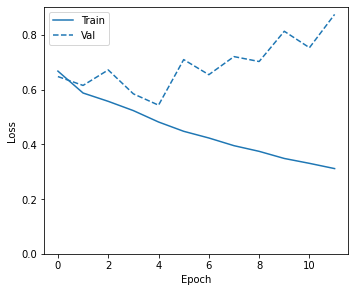

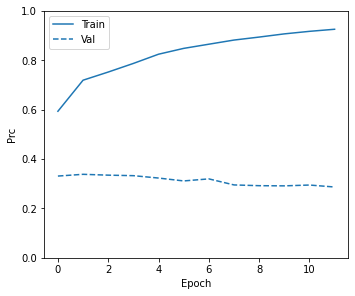

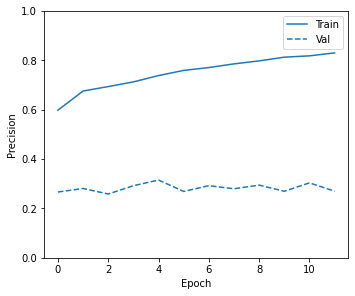

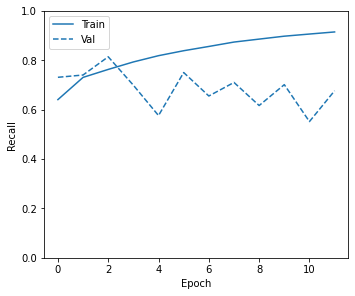

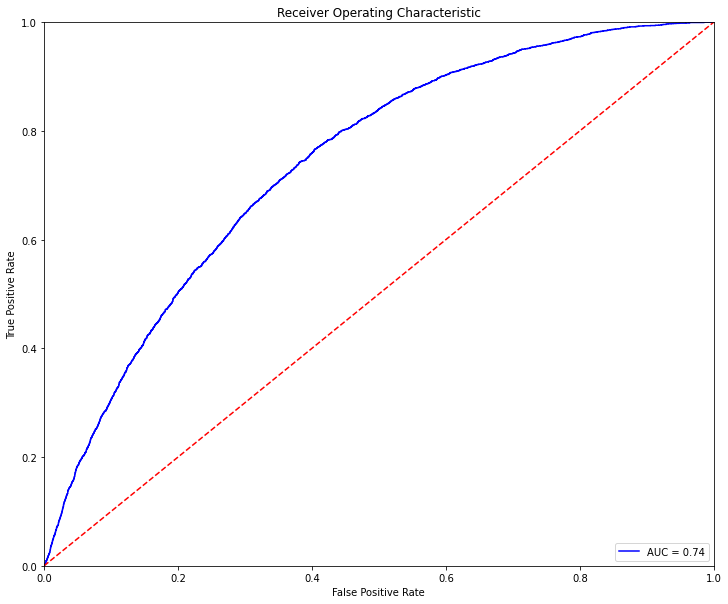

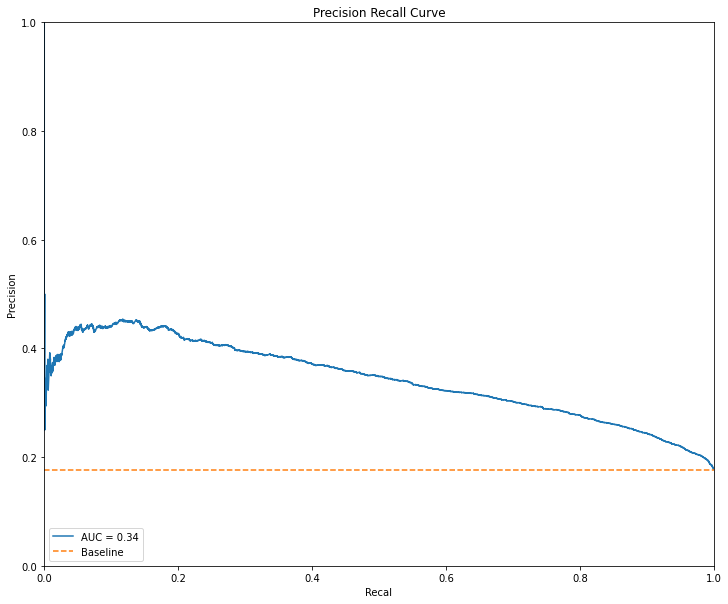

,threshold,tn,fp,fn,tp,f1,accuracy,precision,recall,auc
0,0.0,0,15979,0,3398,0.298397,0.175363,0.175363,1.000000,0.73995
1,0.1,1238,14741,15,3383,0.314376,0.238479,0.186659,0.995586,0.73995
2,0.2,3444,12535,107,3291,0.342385,0.347577,0.207949,0.968511,0.73995
3,0.3,5544,10435,261,3137,0.369711,0.448005,0.231138,0.923190,0.73995
4,0.4,7750,8229,504,2894,0.398595,0.549311,0.260182,0.851677,0.73995
5,0.5,9831,6148,869,2529,0.418882,0.637870,0.291460,0.744261,0.73995
6,0.6,11842,4137,1404,1994,0.418512,0.714042,0.325232,0.586816,0.73995
7,0.7,13972,2007,2147,1251,0.375901,0.785622,0.383978,0.368158,0.73995
8,0.8,15602,377,3102,296,0.145419,0.820457,0.439822,0.087110,0.73995
9,0.9,15955,24,3388,10,0.005828,0.823915,0.294118,0.002943,0.73995


In [ ]:
units = [16, 32, 128, 256, 512, 1024]
for i in range(0, len(units)):
  print('Number of units: ' +str(units[i]))
  model = create_model_abstract_2l(units[i])
  initial_weights = os.path.join(tempfile.mkdtemp(), 'initial_weights')
  model.save_weights(initial_weights)

  for j in range(0, len(datasets_features)):
    if j == 0: 
      model = create_model_abstract_2l(units[i])
      model.load_weights(initial_weights)
      history = model.fit(
        train_features, train_labels,
        batch_size=BATCH_SIZE,
        epochs=EPOCHS,
        callbacks=[early_stopping],
        validation_data=(val_features, val_labels),
        class_weight=class_weights, 
        verbose=1)

      plot_metrics(history)
      predictions = model.predict(test_features, batch_size=BATCH_SIZE)
      eval_train = evaluate_model(actual=test_labels, predicted=predictions, threshold=np.linspace(0,1,11))
      display(eval_train)

    else:
      model = create_model_abstract_2l(units[i])
      model.load_weights(initial_weights)
      history = model.fit(
        datasets_features[j], datasets_labels[j],
        batch_size=BATCH_SIZE,
        epochs=EPOCHS,
        callbacks=[early_stopping],
        validation_data=(val_features, val_labels),
        verbose=1)

      plot_metrics(history)
      predictions = model.predict(test_features, batch_size=BATCH_SIZE)
      eval_train = evaluate_model(actual=test_labels, predicted=predictions, threshold=np.linspace(0,1,11))
      display(eval_train)  

<div class="images">
<strong> A partir de 128 neuronas de peores resutlados!</strong> <br> 
</div>

In [ ]:
def create_model_abstract_2l_batch_drop(units):
  model = keras.Sequential()
  model.add(Dense(units=units, input_shape=(train_features.shape[-1],)))
  model.add(Activation('relu'))
  model.add(Dropout(0.5))
  model.add(BatchNormalization())
  model.add(Dense(units=units))
  model.add(Activation('relu'))
  model.add(Dropout(0.5))
  model.add(BatchNormalization())
  model.add(Dense(1, activation='sigmoid'))

  display(model.summary())

  model.compile(
        optimizer=keras.optimizers.Adam(learning_rate=1e-3),
        loss=keras.losses.BinaryCrossentropy(),
      metrics=METRICS)
  
  return model

Number of units: 16
Model: "sequential_70"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_164 (Dense)            (None, 16)                8320      
_________________________________________________________________
activation_95 (Activation)   (None, 16)                0         
_________________________________________________________________
dropout (Dropout)            (None, 16)                0         
_________________________________________________________________
batch_normalization (BatchNo (None, 16)                64        
_________________________________________________________________
dense_165 (Dense)            (None, 16)                272       
_________________________________________________________________
activation_96 (Activation)   (None, 16)                0         
_________________________________________________________________
dropout_1 (Dropout)          (Non

None

Model: "sequential_71"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_167 (Dense)            (None, 16)                8320      
_________________________________________________________________
activation_97 (Activation)   (None, 16)                0         
_________________________________________________________________
dropout_2 (Dropout)          (None, 16)                0         
_________________________________________________________________
batch_normalization_2 (Batch (None, 16)                64        
_________________________________________________________________
dense_168 (Dense)            (None, 16)                272       
_________________________________________________________________
activation_98 (Activation)   (None, 16)                0         
_________________________________________________________________
dropout_3 (Dropout)          (None, 16)              

None

Epoch 1/100
61/61 [==============================] - 7s 29ms/step - loss: 0.8729 - tp: 4622.7903 - fp: 17680.1613 - tn: 21947.4839 - fn: 3475.1774 - accuracy: 0.5641 - precision: 0.2128 - recall: 0.5793 - auc: 0.6050 - prc: 0.2263 - val_loss: 0.6402 - val_tp: 1219.0000 - val_fp: 3427.0000 - val_tn: 9484.0000 - val_fn: 1371.0000 - val_accuracy: 0.6905 - val_precision: 0.2624 - val_recall: 0.4707 - val_auc: 0.6527 - val_prc: 0.2518
Epoch 2/100
61/61 [==============================] - 1s 9ms/step - loss: 0.7603 - tp: 2994.7097 - fp: 11662.2419 - tn: 15061.4677 - fn: 2506.1935 - accuracy: 0.5588 - precision: 0.2033 - recall: 0.5398 - auc: 0.5751 - prc: 0.2113 - val_loss: 0.6825 - val_tp: 1673.0000 - val_fp: 5184.0000 - val_tn: 7727.0000 - val_fn: 917.0000 - val_accuracy: 0.6064 - val_precision: 0.2440 - val_recall: 0.6459 - val_auc: 0.6640 - val_prc: 0.2667
Epoch 3/100
61/61 [==============================] - 1s 10ms/step - loss: 0.7105 - tp: 3023.0484 - fp: 11132.1452 - tn: 15605.1452 - f

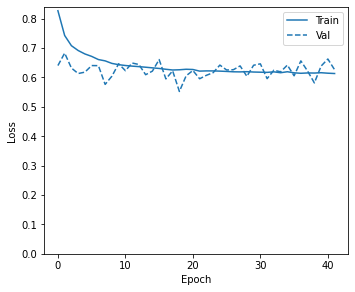

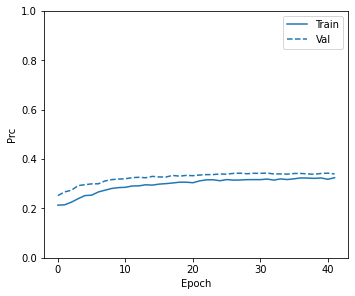

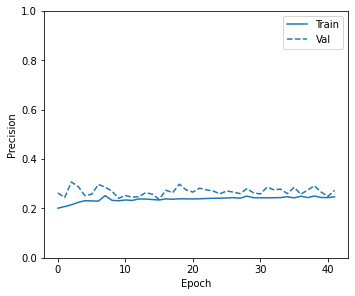

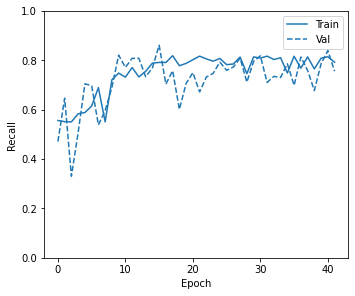

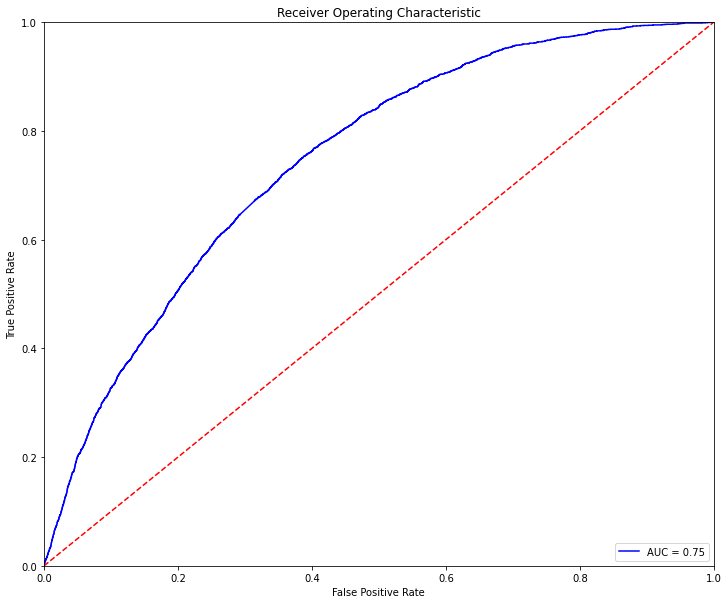

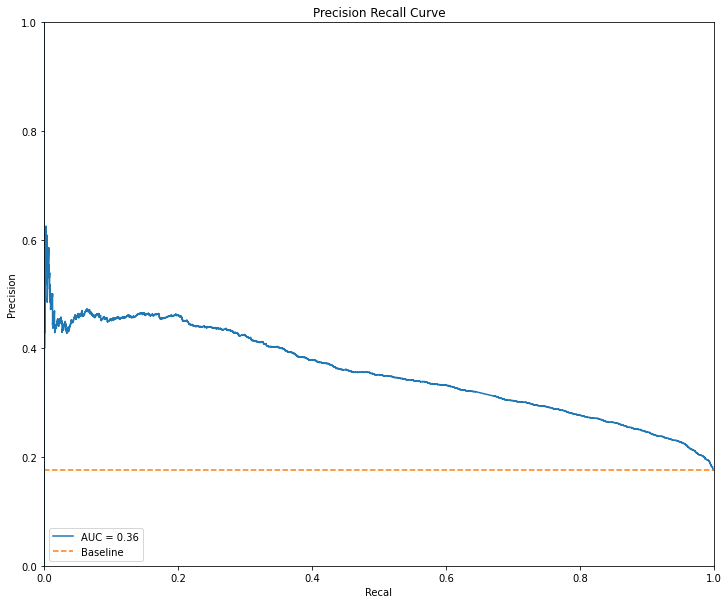

,threshold,tn,fp,fn,tp,f1,accuracy,precision,recall,auc
0,0.0,0,15979,0,3398,0.298397,0.175363,0.175363,1.000000,0.746248
1,0.1,169,15810,3,3395,0.300403,0.183929,0.176777,0.999117,0.746248
2,0.2,1174,14805,14,3384,0.313522,0.235227,0.186047,0.995880,0.746248
3,0.3,3508,12471,92,3306,0.344824,0.351654,0.209546,0.972925,0.746248
4,0.4,6820,9159,363,3035,0.389302,0.508593,0.248893,0.893172,0.746248
5,0.5,10253,5726,946,2452,0.423635,0.655674,0.299829,0.721601,0.746248
6,0.6,14033,1946,2142,1256,0.380606,0.789028,0.392255,0.369629,0.746248
7,0.7,15851,128,3296,102,0.056229,0.823296,0.443478,0.030018,0.746248
8,0.8,15978,1,3398,0,0.000000,0.824586,0.000000,0.000000,0.746248
9,0.9,15979,0,3398,0,0.000000,0.824637,0.000000,0.000000,0.746248


Model: "sequential_72"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_170 (Dense)            (None, 16)                8320      
_________________________________________________________________
activation_99 (Activation)   (None, 16)                0         
_________________________________________________________________
dropout_4 (Dropout)          (None, 16)                0         
_________________________________________________________________
batch_normalization_4 (Batch (None, 16)                64        
_________________________________________________________________
dense_171 (Dense)            (None, 16)                272       
_________________________________________________________________
activation_100 (Activation)  (None, 16)                0         
_________________________________________________________________
dropout_5 (Dropout)          (None, 16)              

None

Epoch 1/100
21/21 [==============================] - 4s 72ms/step - loss: 0.8976 - tp: 4803.6818 - fp: 7901.9091 - tn: 10854.8182 - fn: 3636.4091 - accuracy: 0.5794 - precision: 0.3689 - recall: 0.5839 - auc: 0.6004 - prc: 0.4035 - val_loss: 0.5097 - val_tp: 39.0000 - val_fp: 179.0000 - val_tn: 12732.0000 - val_fn: 2551.0000 - val_accuracy: 0.8239 - val_precision: 0.1789 - val_recall: 0.0151 - val_auc: 0.5590 - val_prc: 0.1906
Epoch 2/100
21/21 [==============================] - 0s 13ms/step - loss: 0.8103 - tp: 3004.0909 - fp: 2700.7273 - tn: 3150.1364 - fn: 2840.8636 - accuracy: 0.5266 - precision: 0.5295 - recall: 0.5133 - auc: 0.5376 - prc: 0.5387 - val_loss: 0.6007 - val_tp: 185.0000 - val_fp: 439.0000 - val_tn: 12472.0000 - val_fn: 2405.0000 - val_accuracy: 0.8165 - val_precision: 0.2965 - val_recall: 0.0714 - val_auc: 0.6225 - val_prc: 0.2323
Epoch 3/100
21/21 [==============================] - 0s 13ms/step - loss: 0.7715 - tp: 3164.1364 - fp: 2746.5000 - tn: 3104.8636 - fn: 268

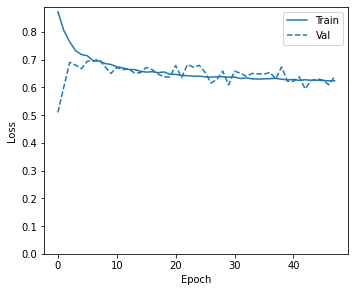

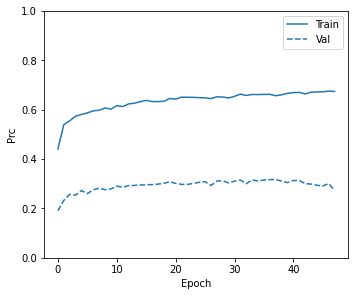

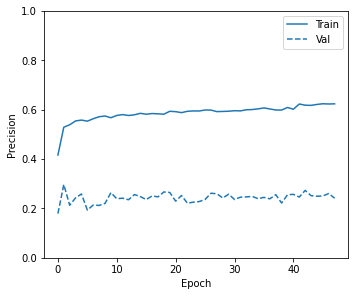

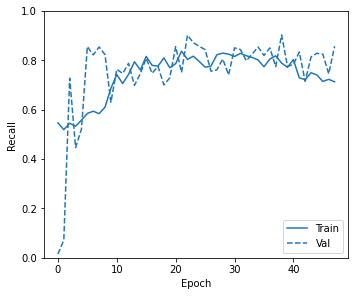

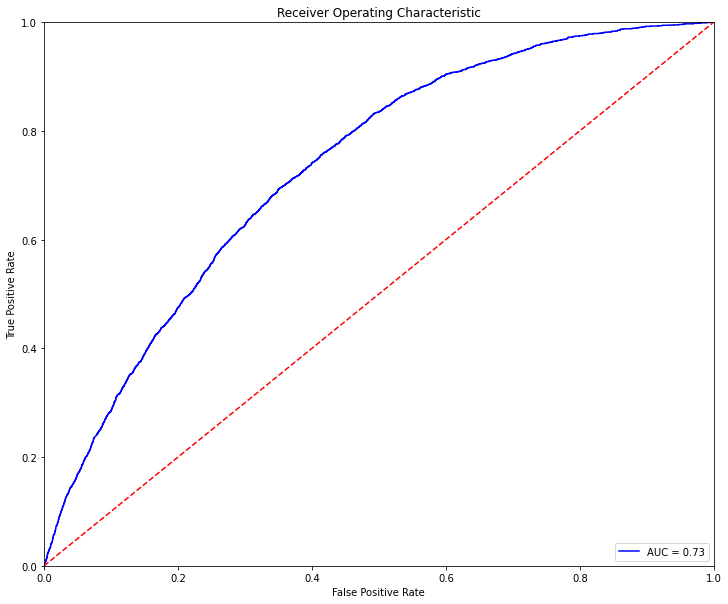

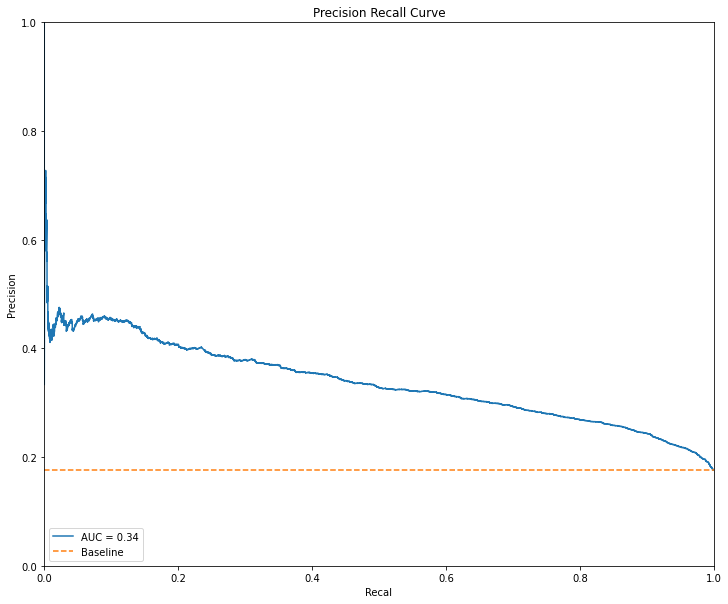

,threshold,tn,fp,fn,tp,f1,accuracy,precision,recall,auc
0,0.0,0,15979,0,3398,0.298397,0.175363,0.175363,1.000000,0.731295
1,0.1,4,15975,0,3398,0.298450,0.175569,0.175399,1.000000,0.731295
2,0.2,280,15699,4,3394,0.301810,0.189606,0.177761,0.998823,0.731295
3,0.3,1587,14392,26,3372,0.318684,0.255922,0.189822,0.992348,0.731295
4,0.4,4254,11725,150,3248,0.353601,0.387160,0.216924,0.955856,0.731295
5,0.5,8779,7200,712,2686,0.404396,0.591681,0.271697,0.790465,0.731295
6,0.6,15772,207,3231,167,0.088547,0.822573,0.446524,0.049147,0.731295
7,0.7,15979,0,3398,0,0.000000,0.824637,0.000000,0.000000,0.731295
8,0.8,15979,0,3398,0,0.000000,0.824637,0.000000,0.000000,0.731295
9,0.9,15979,0,3398,0,0.000000,0.824637,0.000000,0.000000,0.731295


Model: "sequential_73"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_173 (Dense)            (None, 16)                8320      
_________________________________________________________________
activation_101 (Activation)  (None, 16)                0         
_________________________________________________________________
dropout_6 (Dropout)          (None, 16)                0         
_________________________________________________________________
batch_normalization_6 (Batch (None, 16)                64        
_________________________________________________________________
dense_174 (Dense)            (None, 16)                272       
_________________________________________________________________
activation_102 (Activation)  (None, 16)                0         
_________________________________________________________________
dropout_7 (Dropout)          (None, 16)              

None

Epoch 1/100
101/101 [==============================] - 5s 21ms/step - loss: 0.8291 - tp: 16018.7059 - fp: 19186.4118 - tn: 20068.8824 - fn: 12942.1373 - accuracy: 0.5265 - precision: 0.4326 - recall: 0.5686 - auc: 0.5675 - prc: 0.4770 - val_loss: 0.6707 - val_tp: 1279.0000 - val_fp: 3796.0000 - val_tn: 9115.0000 - val_fn: 1311.0000 - val_accuracy: 0.6705 - val_precision: 0.2520 - val_recall: 0.4938 - val_auc: 0.6388 - val_prc: 0.2476
Epoch 2/100
101/101 [==============================] - 1s 9ms/step - loss: 0.7100 - tp: 14895.1961 - fp: 11144.2353 - tn: 15174.9510 - fn: 11500.7549 - accuracy: 0.5687 - precision: 0.5706 - recall: 0.5633 - auc: 0.6019 - prc: 0.5821 - val_loss: 0.6546 - val_tp: 1121.0000 - val_fp: 2694.0000 - val_tn: 10217.0000 - val_fn: 1469.0000 - val_accuracy: 0.7314 - val_precision: 0.2938 - val_recall: 0.4328 - val_auc: 0.6836 - val_prc: 0.2823
Epoch 3/100
101/101 [==============================] - 1s 9ms/step - loss: 0.6789 - tp: 15102.4608 - fp: 10566.7647 - tn: 15

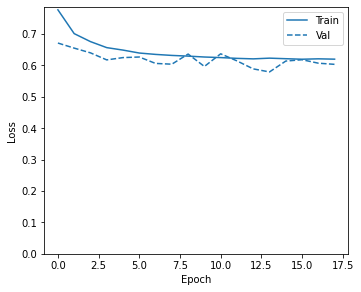

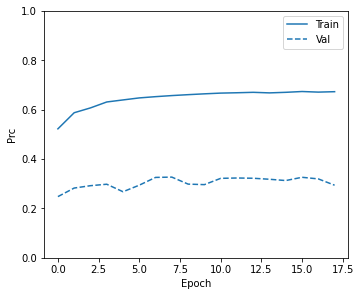

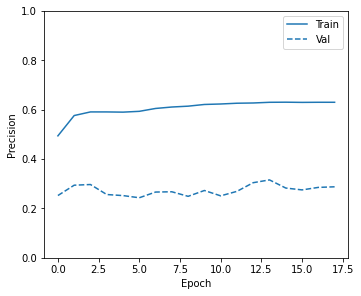

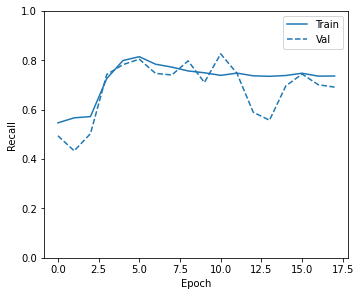

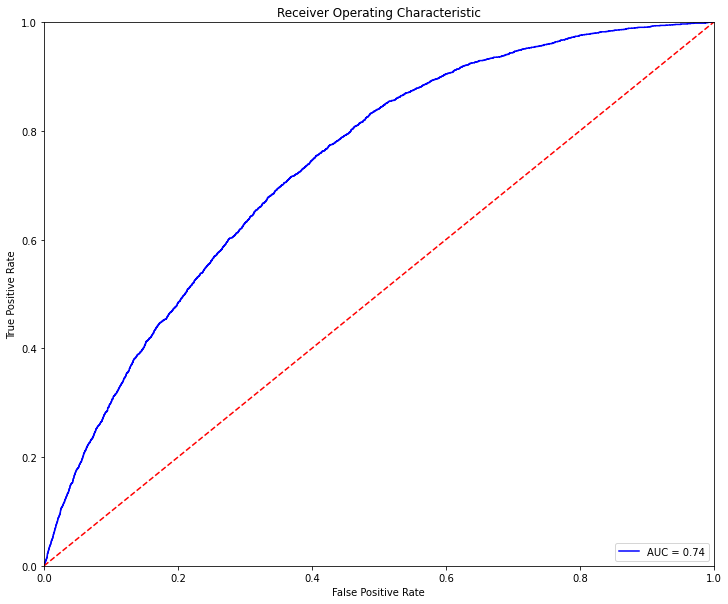

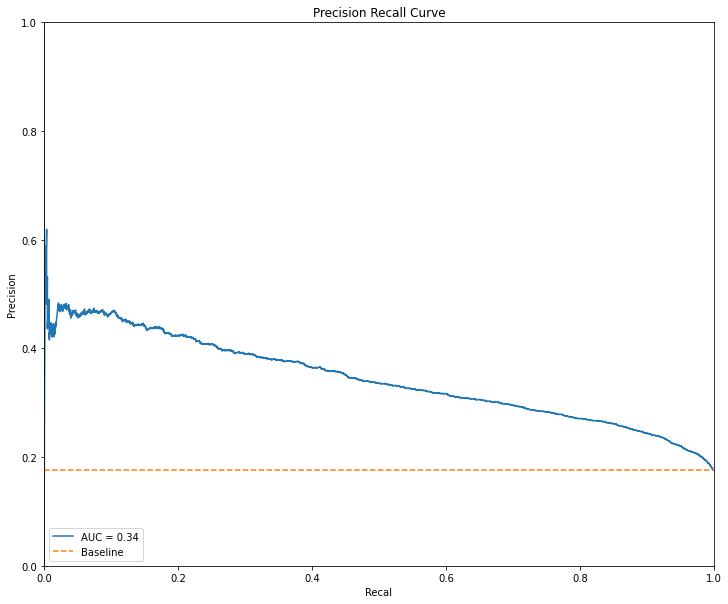

,threshold,tn,fp,fn,tp,f1,accuracy,precision,recall,auc
0,0.0,0,15979,0,3398,0.298397,0.175363,0.175363,1.000000,0.735518
1,0.1,70,15909,0,3398,0.299317,0.178975,0.175998,1.000000,0.735518
2,0.2,663,15316,11,3387,0.306502,0.209011,0.181094,0.996763,0.735518
3,0.3,2325,13654,49,3349,0.328317,0.292821,0.196965,0.985580,0.735518
4,0.4,5301,10678,225,3173,0.367905,0.437323,0.229081,0.933785,0.735518
5,0.5,9464,6515,833,2565,0.411124,0.620788,0.282489,0.754856,0.735518
6,0.6,15968,11,3385,13,0.007598,0.824741,0.541667,0.003826,0.735518
7,0.7,15978,1,3397,1,0.000588,0.824637,0.500000,0.000294,0.735518
8,0.8,15978,1,3398,0,0.000000,0.824586,0.000000,0.000000,0.735518
9,0.9,15978,1,3398,0,0.000000,0.824586,0.000000,0.000000,0.735518


Number of units: 32
Model: "sequential_74"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_176 (Dense)            (None, 32)                16640     
_________________________________________________________________
activation_103 (Activation)  (None, 32)                0         
_________________________________________________________________
dropout_8 (Dropout)          (None, 32)                0         
_________________________________________________________________
batch_normalization_8 (Batch (None, 32)                128       
_________________________________________________________________
dense_177 (Dense)            (None, 32)                1056      
_________________________________________________________________
activation_104 (Activation)  (None, 32)                0         
_________________________________________________________________
dropout_9 (Dropout)          (Non

None

Model: "sequential_75"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_179 (Dense)            (None, 32)                16640     
_________________________________________________________________
activation_105 (Activation)  (None, 32)                0         
_________________________________________________________________
dropout_10 (Dropout)         (None, 32)                0         
_________________________________________________________________
batch_normalization_10 (Batc (None, 32)                128       
_________________________________________________________________
dense_180 (Dense)            (None, 32)                1056      
_________________________________________________________________
activation_106 (Activation)  (None, 32)                0         
_________________________________________________________________
dropout_11 (Dropout)         (None, 32)              

None

Epoch 1/100
61/61 [==============================] - 5s 30ms/step - loss: 0.7994 - tp: 4893.0484 - fp: 18433.0484 - tn: 21194.5968 - fn: 3204.9194 - accuracy: 0.5574 - precision: 0.2165 - recall: 0.6098 - auc: 0.5801 - prc: 0.1952 - val_loss: 0.6465 - val_tp: 363.0000 - val_fp: 1318.0000 - val_tn: 11593.0000 - val_fn: 2227.0000 - val_accuracy: 0.7713 - val_precision: 0.2159 - val_recall: 0.1402 - val_auc: 0.6087 - val_prc: 0.2112
Epoch 2/100
61/61 [==============================] - 1s 10ms/step - loss: 0.7220 - tp: 3543.1613 - fp: 13898.1613 - tn: 12825.5484 - fn: 1957.7419 - accuracy: 0.5081 - precision: 0.2018 - recall: 0.6336 - auc: 0.5744 - prc: 0.1995 - val_loss: 0.5999 - val_tp: 1084.0000 - val_fp: 2798.0000 - val_tn: 10113.0000 - val_fn: 1506.0000 - val_accuracy: 0.7223 - val_precision: 0.2792 - val_recall: 0.4185 - val_auc: 0.6753 - val_prc: 0.2658
Epoch 3/100
61/61 [==============================] - 1s 10ms/step - loss: 0.6871 - tp: 3816.1129 - fp: 13490.3710 - tn: 13246.9194 

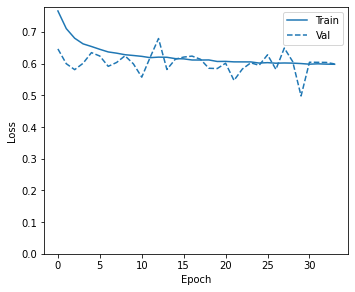

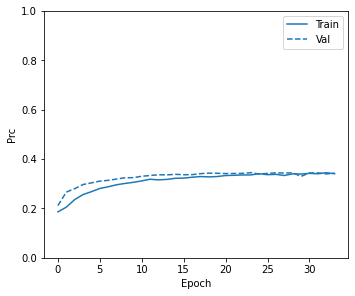

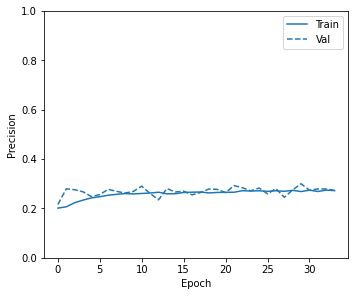

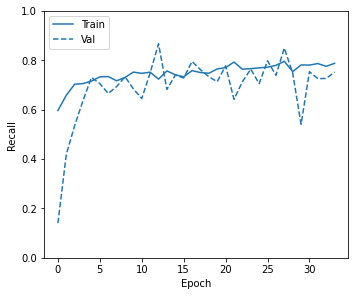

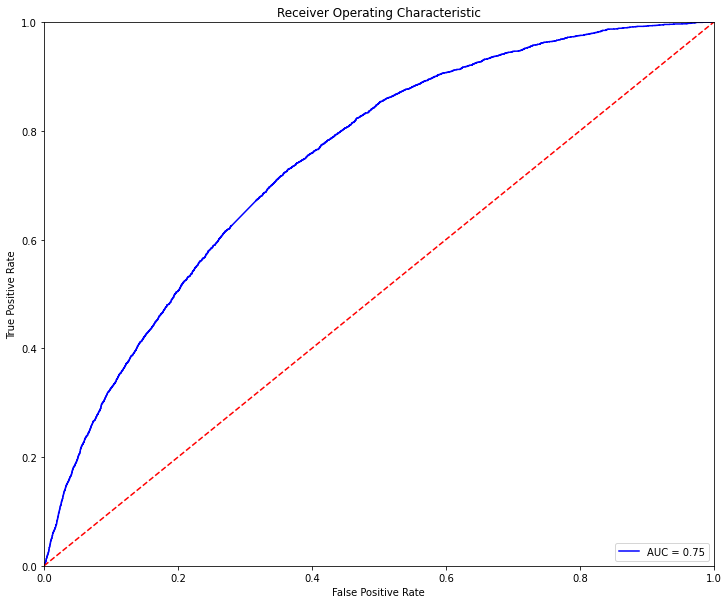

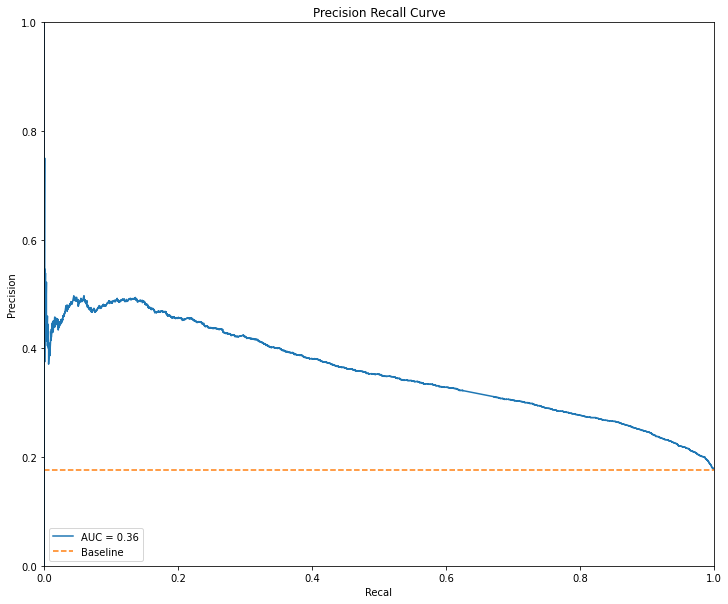

,threshold,tn,fp,fn,tp,f1,accuracy,precision,recall,auc
0,0.0,0,15979,0,3398,0.298397,0.175363,0.175363,1.000000,0.745514
1,0.1,539,15440,6,3392,0.305173,0.202869,0.180119,0.998234,0.745514
2,0.2,2008,13971,32,3366,0.324668,0.277339,0.194151,0.990583,0.745514
3,0.3,3910,12069,121,3277,0.349659,0.370904,0.213541,0.964391,0.745514
4,0.4,6569,9410,329,3069,0.386597,0.497394,0.245933,0.903178,0.745514
5,0.5,9377,6602,771,2627,0.416093,0.619497,0.284646,0.773102,0.745514
6,0.6,13686,2293,1999,1399,0.394640,0.778500,0.378927,0.411713,0.745514
7,0.7,15784,195,3211,187,0.098942,0.824225,0.489529,0.055032,0.745514
8,0.8,15978,1,3395,3,0.001764,0.824741,0.750000,0.000883,0.745514
9,0.9,15979,0,3398,0,0.000000,0.824637,0.000000,0.000000,0.745514


Model: "sequential_76"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_182 (Dense)            (None, 32)                16640     
_________________________________________________________________
activation_107 (Activation)  (None, 32)                0         
_________________________________________________________________
dropout_12 (Dropout)         (None, 32)                0         
_________________________________________________________________
batch_normalization_12 (Batc (None, 32)                128       
_________________________________________________________________
dense_183 (Dense)            (None, 32)                1056      
_________________________________________________________________
activation_108 (Activation)  (None, 32)                0         
_________________________________________________________________
dropout_13 (Dropout)         (None, 32)              

None

Epoch 1/100
21/21 [==============================] - 4s 73ms/step - loss: 0.8119 - tp: 5002.7727 - fp: 8078.0000 - tn: 10678.7273 - fn: 3437.3182 - accuracy: 0.5804 - precision: 0.3729 - recall: 0.6052 - auc: 0.6317 - prc: 0.4117 - val_loss: 0.6933 - val_tp: 1525.0000 - val_fp: 6777.0000 - val_tn: 6134.0000 - val_fn: 1065.0000 - val_accuracy: 0.4941 - val_precision: 0.1837 - val_recall: 0.5888 - val_auc: 0.5430 - val_prc: 0.1816
Epoch 2/100
21/21 [==============================] - 0s 15ms/step - loss: 0.7676 - tp: 3111.6364 - fp: 2943.7727 - tn: 2907.0909 - fn: 2733.3182 - accuracy: 0.5153 - precision: 0.5168 - recall: 0.5336 - auc: 0.5224 - prc: 0.5156 - val_loss: 0.6818 - val_tp: 1717.0000 - val_fp: 6069.0000 - val_tn: 6842.0000 - val_fn: 873.0000 - val_accuracy: 0.5522 - val_precision: 0.2205 - val_recall: 0.6629 - val_auc: 0.6293 - val_prc: 0.2297
Epoch 3/100
21/21 [==============================] - 0s 14ms/step - loss: 0.7406 - tp: 3179.0000 - fp: 2747.2273 - tn: 3104.1364 - fn: 2

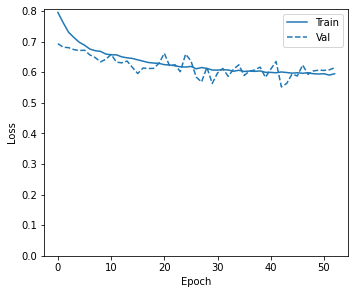

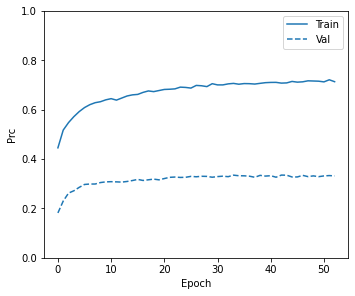

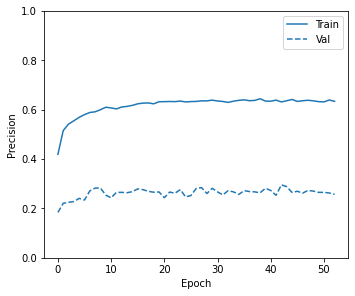

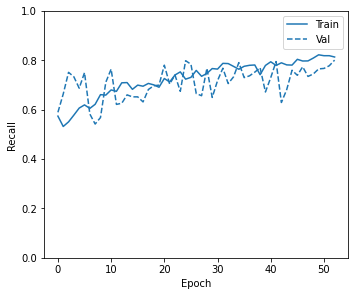

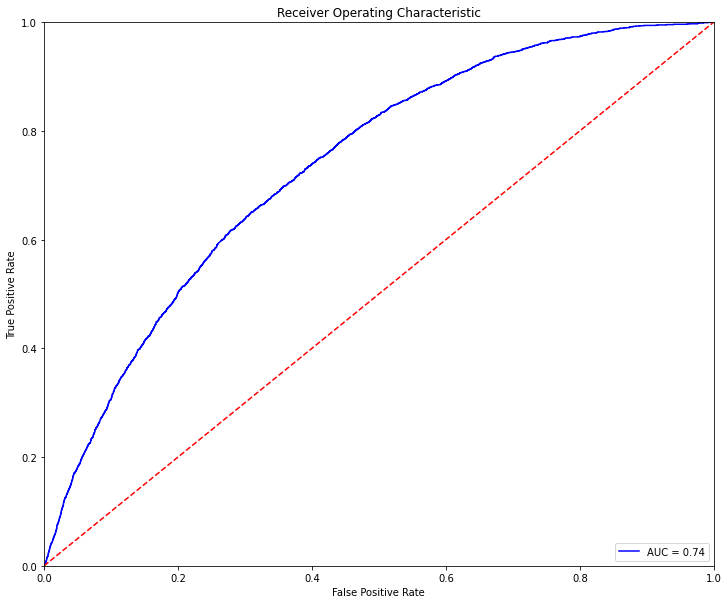

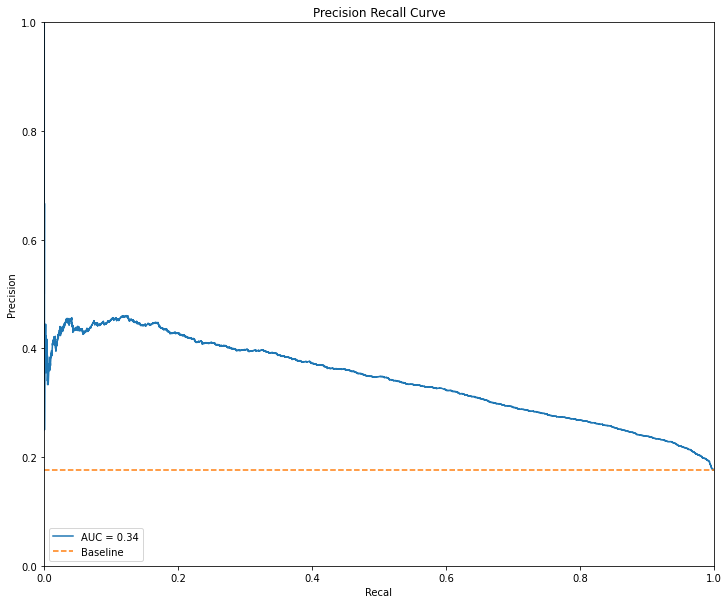

,threshold,tn,fp,fn,tp,f1,accuracy,precision,recall,auc
0,0.0,0,15979,0,3398,0.298397,0.175363,0.175363,1.000000,0.735545
1,0.1,1571,14408,20,3378,0.318920,0.255406,0.189925,0.994114,0.735545
2,0.2,3688,12291,108,3290,0.346699,0.360118,0.211155,0.968217,0.735545
3,0.3,6051,9928,317,3081,0.375571,0.471280,0.236836,0.906710,0.735545
4,0.4,8678,7301,701,2697,0.402658,0.587036,0.269754,0.793702,0.735545
5,0.5,11114,4865,1211,2187,0.418565,0.686432,0.310125,0.643614,0.735545
6,0.6,13447,2532,1951,1447,0.392300,0.768643,0.363659,0.425839,0.735545
7,0.7,15388,591,2923,475,0.212814,0.818651,0.445591,0.139788,0.735545
8,0.8,15959,20,3385,13,0.007578,0.824276,0.393939,0.003826,0.735545
9,0.9,15976,3,3396,2,0.001175,0.824586,0.400000,0.000589,0.735545


Model: "sequential_77"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_185 (Dense)            (None, 32)                16640     
_________________________________________________________________
activation_109 (Activation)  (None, 32)                0         
_________________________________________________________________
dropout_14 (Dropout)         (None, 32)                0         
_________________________________________________________________
batch_normalization_14 (Batc (None, 32)                128       
_________________________________________________________________
dense_186 (Dense)            (None, 32)                1056      
_________________________________________________________________
activation_110 (Activation)  (None, 32)                0         
_________________________________________________________________
dropout_15 (Dropout)         (None, 32)              

None

Epoch 1/100
101/101 [==============================] - 5s 22ms/step - loss: 0.7779 - tp: 16683.6373 - fp: 18687.6373 - tn: 20567.6569 - fn: 12277.2059 - accuracy: 0.5462 - precision: 0.4491 - recall: 0.5860 - auc: 0.5870 - prc: 0.4753 - val_loss: 0.6604 - val_tp: 1720.0000 - val_fp: 5202.0000 - val_tn: 7709.0000 - val_fn: 870.0000 - val_accuracy: 0.6083 - val_precision: 0.2485 - val_recall: 0.6641 - val_auc: 0.6781 - val_prc: 0.2878
Epoch 2/100
101/101 [==============================] - 1s 10ms/step - loss: 0.6843 - tp: 16687.0098 - fp: 11140.1667 - tn: 15179.0196 - fn: 9708.9412 - accuracy: 0.6002 - precision: 0.5959 - recall: 0.6287 - auc: 0.6397 - prc: 0.6159 - val_loss: 0.6157 - val_tp: 1558.0000 - val_fp: 4203.0000 - val_tn: 8708.0000 - val_fn: 1032.0000 - val_accuracy: 0.6623 - val_precision: 0.2704 - val_recall: 0.6015 - val_auc: 0.6981 - val_prc: 0.3111
Epoch 3/100
101/101 [==============================] - 1s 10ms/step - loss: 0.6519 - tp: 17329.2647 - fp: 10273.2157 - tn: 160

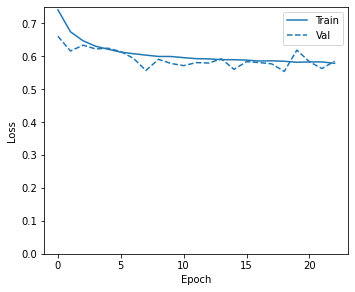

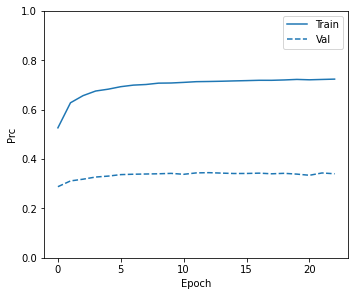

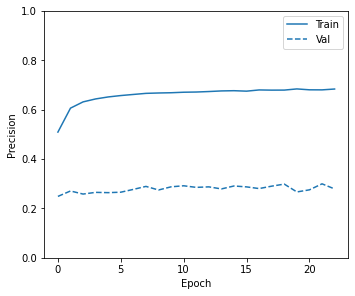

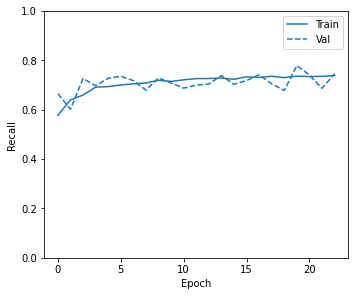

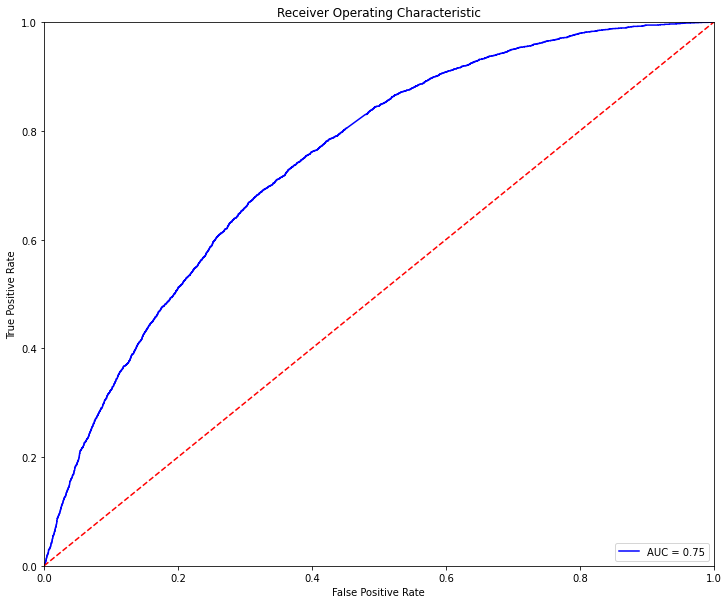

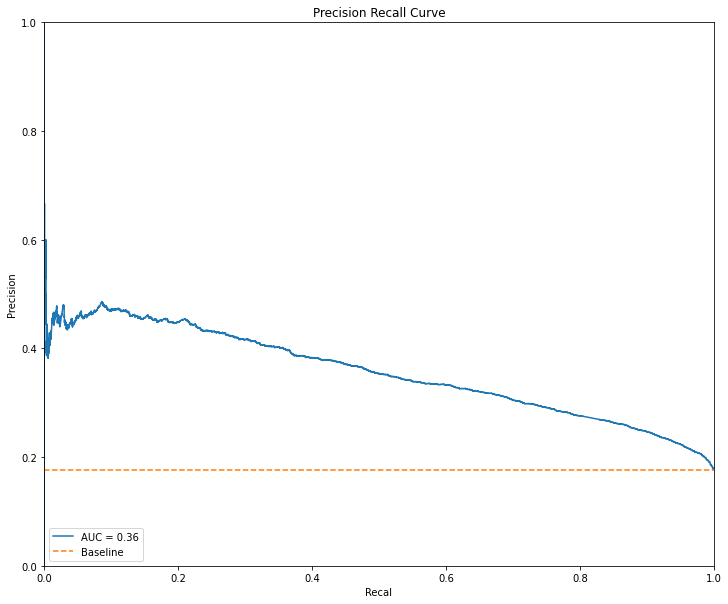

,threshold,tn,fp,fn,tp,f1,accuracy,precision,recall,auc
0,0.0,0,15979,0,3398,0.298397,0.175363,0.175363,1.000000,0.746467
1,0.1,1388,14591,18,3380,0.316346,0.246065,0.188081,0.994703,0.746467
2,0.2,3135,12844,66,3332,0.340452,0.333746,0.205984,0.980577,0.746467
3,0.3,5117,10862,200,3198,0.366365,0.429117,0.227454,0.941142,0.746467
4,0.4,7507,8472,444,2954,0.398543,0.539867,0.258533,0.869335,0.746467
5,0.5,10344,5635,974,2424,0.423147,0.658926,0.300782,0.713361,0.746467
6,0.6,12730,3249,1648,1750,0.416816,0.747278,0.350070,0.515009,0.746467
7,0.7,15597,382,3057,341,0.165494,0.822522,0.471646,0.100353,0.746467
8,0.8,15976,3,3395,3,0.001763,0.824637,0.500000,0.000883,0.746467
9,0.9,15979,0,3398,0,0.000000,0.824637,0.000000,0.000000,0.746467


Number of units: 128
Model: "sequential_78"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_188 (Dense)            (None, 128)               66560     
_________________________________________________________________
activation_111 (Activation)  (None, 128)               0         
_________________________________________________________________
dropout_16 (Dropout)         (None, 128)               0         
_________________________________________________________________
batch_normalization_16 (Batc (None, 128)               512       
_________________________________________________________________
dense_189 (Dense)            (None, 128)               16512     
_________________________________________________________________
activation_112 (Activation)  (None, 128)               0         
_________________________________________________________________
dropout_17 (Dropout)         (No

None

Model: "sequential_79"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_191 (Dense)            (None, 128)               66560     
_________________________________________________________________
activation_113 (Activation)  (None, 128)               0         
_________________________________________________________________
dropout_18 (Dropout)         (None, 128)               0         
_________________________________________________________________
batch_normalization_18 (Batc (None, 128)               512       
_________________________________________________________________
dense_192 (Dense)            (None, 128)               16512     
_________________________________________________________________
activation_114 (Activation)  (None, 128)               0         
_________________________________________________________________
dropout_19 (Dropout)         (None, 128)             

None

Epoch 1/100
61/61 [==============================] - 5s 31ms/step - loss: 0.8312 - tp: 4960.7097 - fp: 17353.6613 - tn: 22273.9839 - fn: 3137.2581 - accuracy: 0.5741 - precision: 0.2261 - recall: 0.6234 - auc: 0.6200 - prc: 0.2227 - val_loss: 0.6397 - val_tp: 1462.0000 - val_fp: 4062.0000 - val_tn: 8849.0000 - val_fn: 1128.0000 - val_accuracy: 0.6652 - val_precision: 0.2647 - val_recall: 0.5645 - val_auc: 0.6766 - val_prc: 0.2870
Epoch 2/100
61/61 [==============================] - 1s 12ms/step - loss: 0.7159 - tp: 3326.5161 - fp: 11070.6613 - tn: 15653.0484 - fn: 2174.3871 - accuracy: 0.5878 - precision: 0.2297 - recall: 0.5977 - auc: 0.6258 - prc: 0.2401 - val_loss: 0.6010 - val_tp: 1290.0000 - val_fp: 3040.0000 - val_tn: 9871.0000 - val_fn: 1300.0000 - val_accuracy: 0.7200 - val_precision: 0.2979 - val_recall: 0.4981 - val_auc: 0.6980 - val_prc: 0.3025
Epoch 3/100
61/61 [==============================] - 1s 13ms/step - loss: 0.6705 - tp: 3502.3226 - fp: 10669.7742 - tn: 16067.5161 -

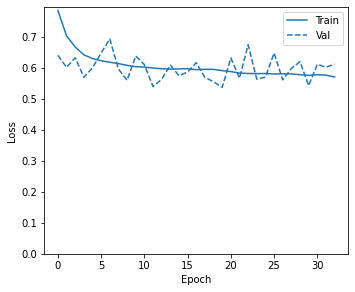

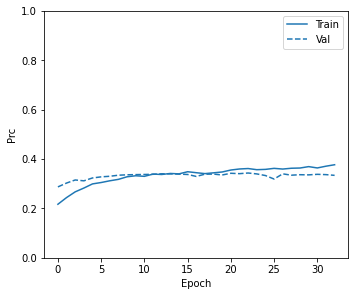

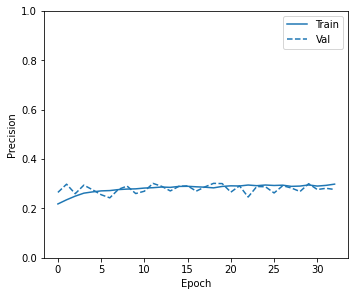

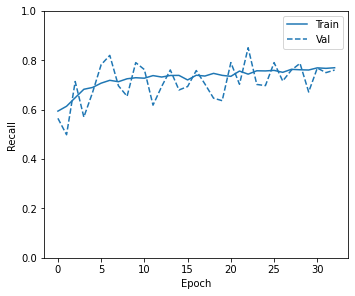

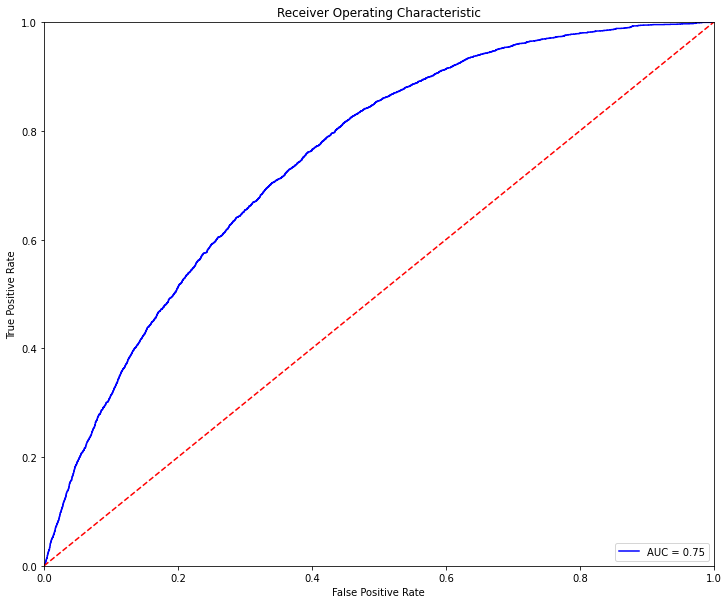

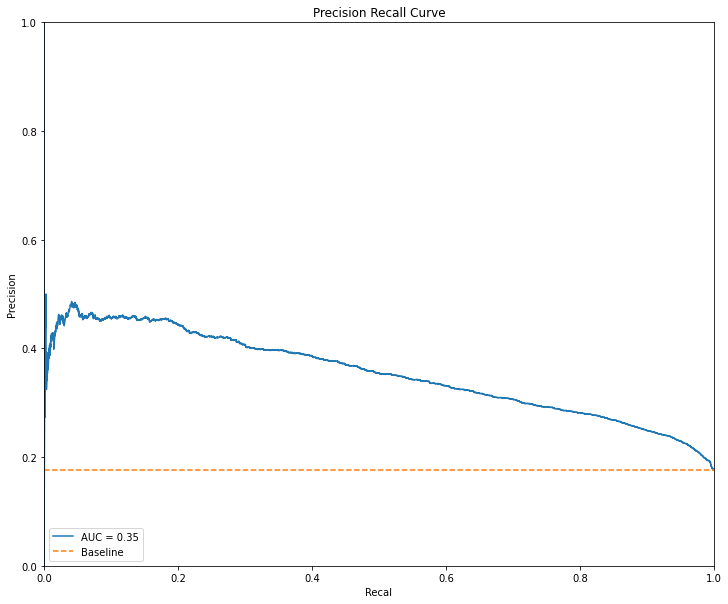

,threshold,tn,fp,fn,tp,f1,accuracy,precision,recall,auc
0,0.0,0,15979,0,3398,0.298397,0.175363,0.175363,1.000000,0.748691
1,0.1,1671,14308,18,3380,0.320592,0.260670,0.191090,0.994703,0.748691
2,0.2,3167,12812,67,3331,0.340924,0.335346,0.206343,0.980283,0.748691
3,0.3,4642,11337,134,3264,0.362687,0.408009,0.223546,0.960565,0.748691
4,0.4,6101,9878,260,3138,0.382357,0.476802,0.241088,0.923484,0.748691
5,0.5,7749,8230,463,2935,0.403076,0.551375,0.262875,0.863743,0.748691
6,0.6,9821,6158,856,2542,0.420235,0.638024,0.292184,0.748087,0.748691
7,0.7,13663,2316,1980,1418,0.397644,0.778294,0.379754,0.417304,0.748691
8,0.8,15878,101,3312,86,0.047978,0.823863,0.459893,0.025309,0.748691
9,0.9,15977,2,3397,1,0.000588,0.824586,0.333333,0.000294,0.748691


Model: "sequential_80"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_194 (Dense)            (None, 128)               66560     
_________________________________________________________________
activation_115 (Activation)  (None, 128)               0         
_________________________________________________________________
dropout_20 (Dropout)         (None, 128)               0         
_________________________________________________________________
batch_normalization_20 (Batc (None, 128)               512       
_________________________________________________________________
dense_195 (Dense)            (None, 128)               16512     
_________________________________________________________________
activation_116 (Activation)  (None, 128)               0         
_________________________________________________________________
dropout_21 (Dropout)         (None, 128)             

None

Epoch 1/100
21/21 [==============================] - 4s 73ms/step - loss: 0.8378 - tp: 5097.6364 - fp: 7785.1818 - tn: 10971.5455 - fn: 3342.4545 - accuracy: 0.5935 - precision: 0.3853 - recall: 0.6164 - auc: 0.6424 - prc: 0.4286 - val_loss: 0.7411 - val_tp: 2255.0000 - val_fp: 9327.0000 - val_tn: 3584.0000 - val_fn: 335.0000 - val_accuracy: 0.3767 - val_precision: 0.1947 - val_recall: 0.8707 - val_auc: 0.6551 - val_prc: 0.2722
Epoch 2/100
21/21 [==============================] - 0s 15ms/step - loss: 0.7626 - tp: 3348.0455 - fp: 2504.0909 - tn: 3346.7727 - fn: 2496.9091 - accuracy: 0.5695 - precision: 0.5715 - recall: 0.5701 - auc: 0.6030 - prc: 0.5885 - val_loss: 0.7162 - val_tp: 2117.0000 - val_fp: 7517.0000 - val_tn: 5394.0000 - val_fn: 473.0000 - val_accuracy: 0.4845 - val_precision: 0.2197 - val_recall: 0.8174 - val_auc: 0.6863 - val_prc: 0.2955
Epoch 3/100
21/21 [==============================] - 0s 15ms/step - loss: 0.7201 - tp: 3453.9545 - fp: 2361.1364 - tn: 3490.2273 - fn: 23

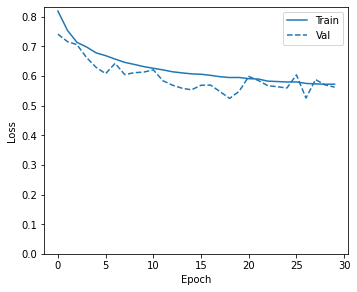

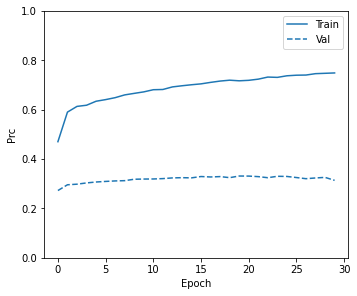

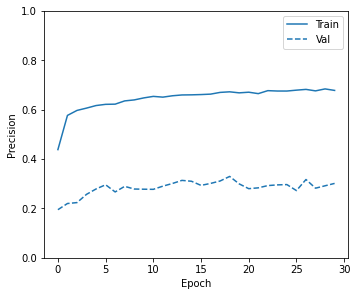

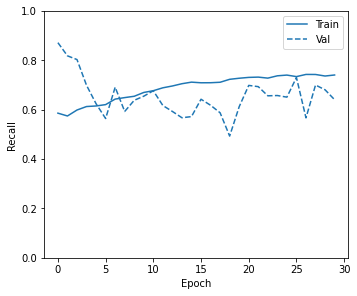

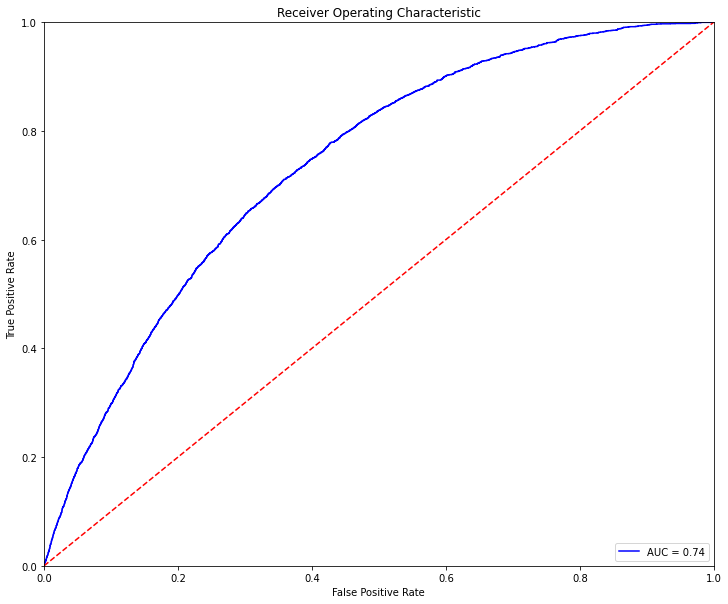

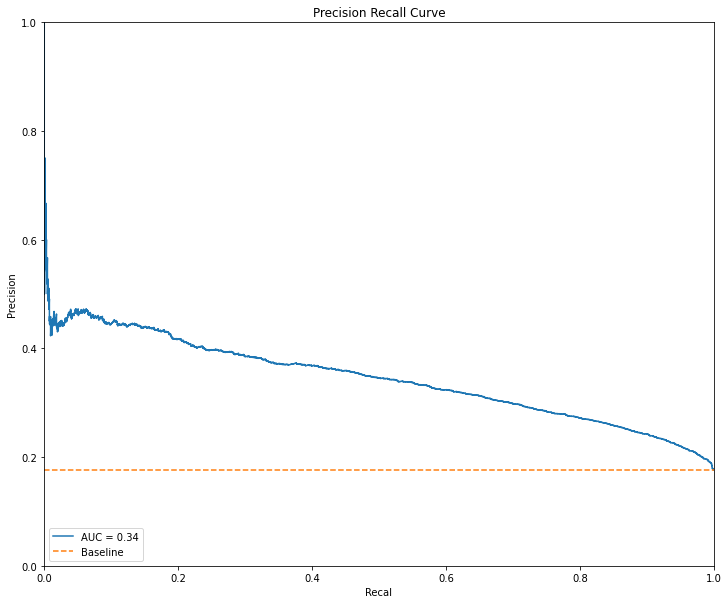

,threshold,tn,fp,fn,tp,f1,accuracy,precision,recall,auc
0,0.0,0,15979,0,3398,0.298397,0.175363,0.175363,1.000000,0.737509
1,0.1,1318,14661,11,3387,0.315863,0.242814,0.187666,0.996763,0.737509
2,0.2,3437,12542,94,3304,0.343380,0.347887,0.208507,0.972337,0.737509
3,0.3,6001,9978,298,3100,0.376305,0.469681,0.237039,0.912301,0.737509
4,0.4,8817,7162,697,2701,0.407360,0.594416,0.273852,0.794879,0.737509
5,0.5,11411,4568,1271,2127,0.421480,0.698663,0.317700,0.625956,0.737509
6,0.6,13695,2284,2063,1335,0.380504,0.775662,0.368886,0.392878,0.737509
7,0.7,15621,358,3102,296,0.146101,0.821438,0.452599,0.087110,0.737509
8,0.8,15969,10,3385,13,0.007600,0.824792,0.565217,0.003826,0.737509
9,0.9,15978,1,3396,2,0.001176,0.824689,0.666667,0.000589,0.737509


Model: "sequential_81"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_197 (Dense)            (None, 128)               66560     
_________________________________________________________________
activation_117 (Activation)  (None, 128)               0         
_________________________________________________________________
dropout_22 (Dropout)         (None, 128)               0         
_________________________________________________________________
batch_normalization_22 (Batc (None, 128)               512       
_________________________________________________________________
dense_198 (Dense)            (None, 128)               16512     
_________________________________________________________________
activation_118 (Activation)  (None, 128)               0         
_________________________________________________________________
dropout_23 (Dropout)         (None, 128)             

None

Epoch 1/100
101/101 [==============================] - 5s 26ms/step - loss: 0.7907 - tp: 16528.2451 - fp: 15036.9412 - tn: 24218.3529 - fn: 12432.5980 - accuracy: 0.6020 - precision: 0.5001 - recall: 0.5694 - auc: 0.6306 - prc: 0.5121 - val_loss: 0.6274 - val_tp: 1622.0000 - val_fp: 4309.0000 - val_tn: 8602.0000 - val_fn: 968.0000 - val_accuracy: 0.6596 - val_precision: 0.2735 - val_recall: 0.6263 - val_auc: 0.6987 - val_prc: 0.3020
Epoch 2/100
101/101 [==============================] - 1s 11ms/step - loss: 0.6651 - tp: 16827.7647 - fp: 9852.6373 - tn: 16466.5490 - fn: 9568.1863 - accuracy: 0.6285 - precision: 0.6287 - recall: 0.6319 - auc: 0.6713 - prc: 0.6406 - val_loss: 0.6176 - val_tp: 1701.0000 - val_fp: 4432.0000 - val_tn: 8479.0000 - val_fn: 889.0000 - val_accuracy: 0.6567 - val_precision: 0.2774 - val_recall: 0.6568 - val_auc: 0.7158 - val_prc: 0.3221
Epoch 3/100
101/101 [==============================] - 1s 12ms/step - loss: 0.6282 - tp: 17943.2451 - fp: 9766.4216 - tn: 16563.

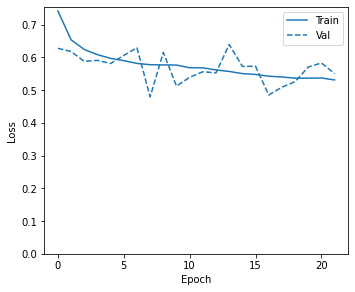

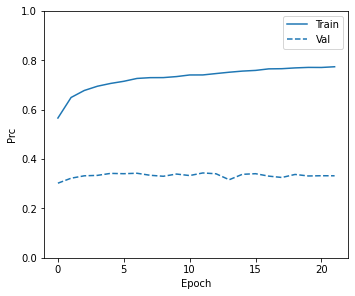

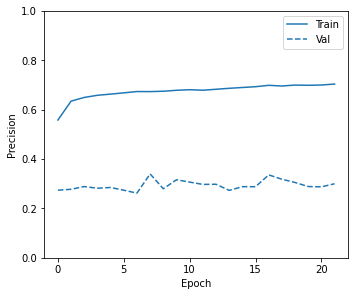

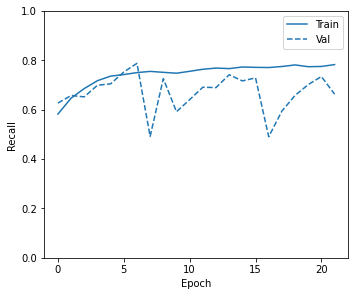

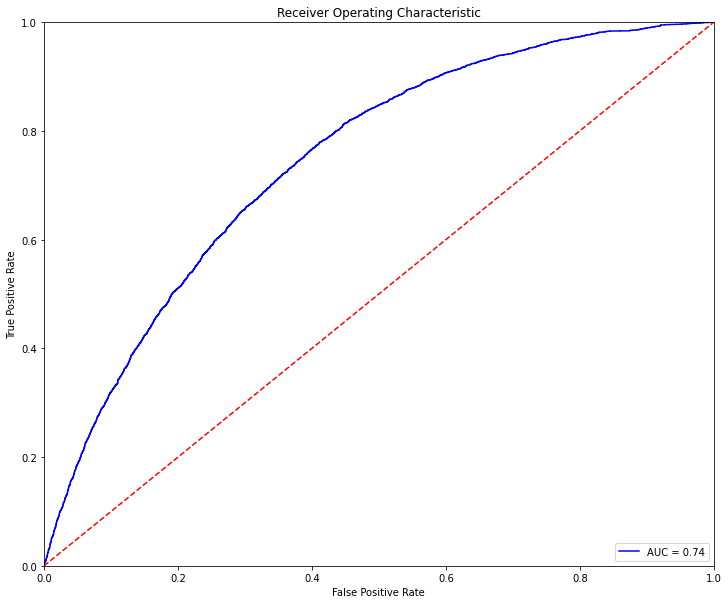

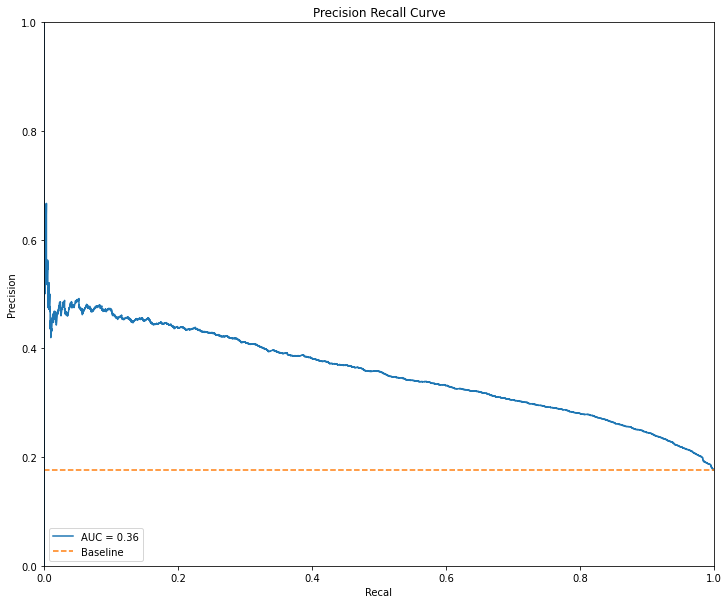

,threshold,tn,fp,fn,tp,f1,accuracy,precision,recall,auc
0,0.0,0,15979,0,3398,0.298397,0.175363,0.175363,1.000000,0.744974
1,0.1,3052,12927,81,3317,0.337746,0.328689,0.204198,0.976162,0.744974
2,0.2,5028,10951,205,3193,0.364041,0.424266,0.225749,0.939670,0.744974
3,0.3,7046,8933,398,3000,0.391364,0.518450,0.251404,0.882872,0.744974
4,0.4,9015,6964,682,2716,0.415354,0.605408,0.280579,0.799294,0.744974
5,0.5,10684,5295,1052,2346,0.425038,0.672447,0.307028,0.690406,0.744974
6,0.6,12306,3673,1506,1892,0.422180,0.732724,0.339982,0.556798,0.744974
7,0.7,14859,1120,2557,841,0.313865,0.810239,0.428863,0.247499,0.744974
8,0.8,15901,78,3332,66,0.037267,0.824018,0.458333,0.019423,0.744974
9,0.9,15977,2,3395,3,0.001763,0.824689,0.600000,0.000883,0.744974


Number of units: 256
Model: "sequential_82"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_200 (Dense)            (None, 256)               133120    
_________________________________________________________________
activation_119 (Activation)  (None, 256)               0         
_________________________________________________________________
dropout_24 (Dropout)         (None, 256)               0         
_________________________________________________________________
batch_normalization_24 (Batc (None, 256)               1024      
_________________________________________________________________
dense_201 (Dense)            (None, 256)               65792     
_________________________________________________________________
activation_120 (Activation)  (None, 256)               0         
_________________________________________________________________
dropout_25 (Dropout)         (No

None

Model: "sequential_83"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_203 (Dense)            (None, 256)               133120    
_________________________________________________________________
activation_121 (Activation)  (None, 256)               0         
_________________________________________________________________
dropout_26 (Dropout)         (None, 256)               0         
_________________________________________________________________
batch_normalization_26 (Batc (None, 256)               1024      
_________________________________________________________________
dense_204 (Dense)            (None, 256)               65792     
_________________________________________________________________
activation_122 (Activation)  (None, 256)               0         
_________________________________________________________________
dropout_27 (Dropout)         (None, 256)             

None

Epoch 1/100
61/61 [==============================] - 5s 32ms/step - loss: 0.7986 - tp: 4913.1613 - fp: 16053.8387 - tn: 23573.8065 - fn: 3184.8065 - accuracy: 0.6025 - precision: 0.2385 - recall: 0.6104 - auc: 0.6375 - prc: 0.2351 - val_loss: 0.5676 - val_tp: 919.0000 - val_fp: 1904.0000 - val_tn: 11007.0000 - val_fn: 1671.0000 - val_accuracy: 0.7694 - val_precision: 0.3255 - val_recall: 0.3548 - val_auc: 0.6931 - val_prc: 0.2960
Epoch 2/100
61/61 [==============================] - 1s 13ms/step - loss: 0.6923 - tp: 3530.0806 - fp: 11097.9355 - tn: 15625.7742 - fn: 1970.8226 - accuracy: 0.5942 - precision: 0.2415 - recall: 0.6396 - auc: 0.6483 - prc: 0.2528 - val_loss: 0.6728 - val_tp: 1976.0000 - val_fp: 5927.0000 - val_tn: 6984.0000 - val_fn: 614.0000 - val_accuracy: 0.5780 - val_precision: 0.2500 - val_recall: 0.7629 - val_auc: 0.7070 - val_prc: 0.3107
Epoch 3/100
61/61 [==============================] - 1s 13ms/step - loss: 0.6523 - tp: 3647.9839 - fp: 10732.6613 - tn: 16004.6290 - 

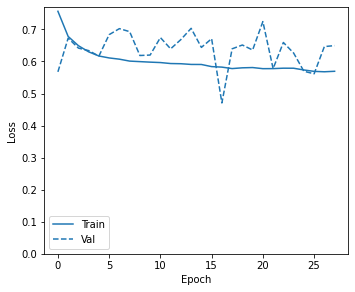

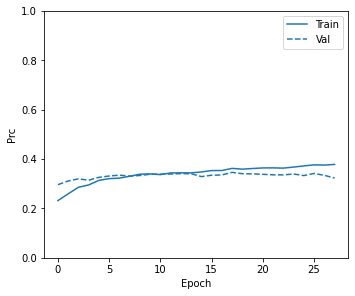

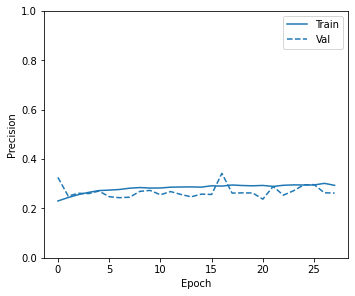

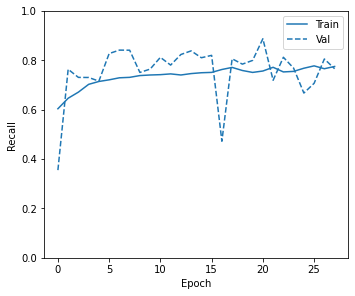

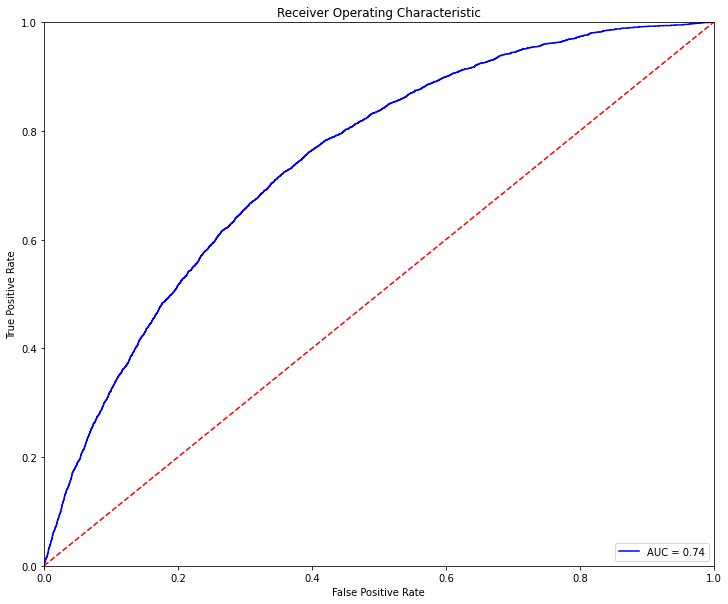

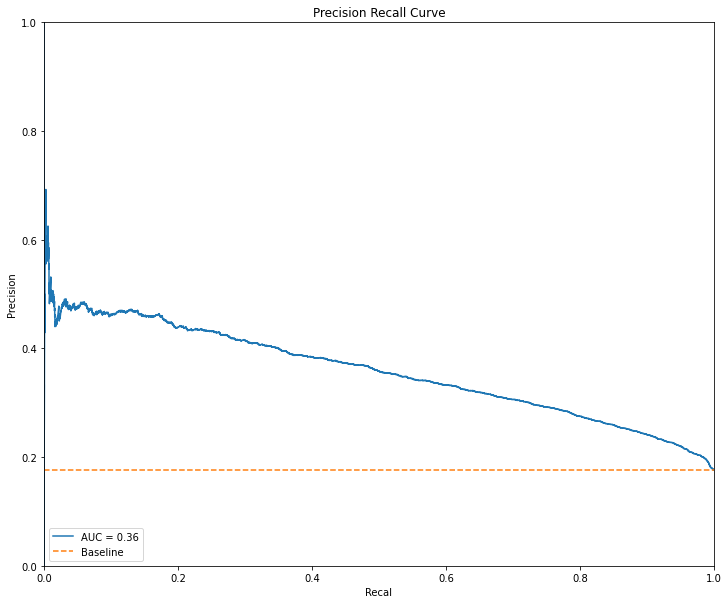

,threshold,tn,fp,fn,tp,f1,accuracy,precision,recall,auc
0,0.0,0,15979,0,3398,0.298397,0.175363,0.175363,1.000000,0.744147
1,0.1,1290,14689,22,3376,0.314588,0.240801,0.186881,0.993526,0.744147
2,0.2,2828,13151,65,3333,0.335278,0.317954,0.202196,0.980871,0.744147
3,0.3,4508,11471,166,3232,0.357107,0.399443,0.219819,0.951148,0.744147
4,0.4,6450,9529,346,3052,0.382001,0.490375,0.242588,0.898175,0.744147
5,0.5,8739,7240,668,2730,0.408438,0.591887,0.273821,0.803414,0.744147
6,0.6,11417,4562,1231,2167,0.427965,0.701037,0.322039,0.637728,0.744147
7,0.7,14247,1732,2232,1166,0.370394,0.795428,0.402346,0.343143,0.744147
8,0.8,15962,17,3374,24,0.013958,0.824999,0.585366,0.007063,0.744147
9,0.9,15978,1,3398,0,0.000000,0.824586,0.000000,0.000000,0.744147


Model: "sequential_84"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_206 (Dense)            (None, 256)               133120    
_________________________________________________________________
activation_123 (Activation)  (None, 256)               0         
_________________________________________________________________
dropout_28 (Dropout)         (None, 256)               0         
_________________________________________________________________
batch_normalization_28 (Batc (None, 256)               1024      
_________________________________________________________________
dense_207 (Dense)            (None, 256)               65792     
_________________________________________________________________
activation_124 (Activation)  (None, 256)               0         
_________________________________________________________________
dropout_29 (Dropout)         (None, 256)             

None

Epoch 1/100
21/21 [==============================] - 5s 100ms/step - loss: 0.8305 - tp: 5234.0909 - fp: 8231.8636 - tn: 10524.8636 - fn: 3206.0000 - accuracy: 0.5807 - precision: 0.3776 - recall: 0.6309 - auc: 0.6311 - prc: 0.4175 - val_loss: 0.8106 - val_tp: 2447.0000 - val_fp: 10712.0000 - val_tn: 2199.0000 - val_fn: 143.0000 - val_accuracy: 0.2997 - val_precision: 0.1860 - val_recall: 0.9448 - val_auc: 0.6781 - val_prc: 0.2819
Epoch 2/100
21/21 [==============================] - 0s 16ms/step - loss: 0.7404 - tp: 3469.5909 - fp: 2467.4545 - tn: 3383.4091 - fn: 2375.3636 - accuracy: 0.5818 - precision: 0.5826 - recall: 0.5898 - auc: 0.6143 - prc: 0.5992 - val_loss: 0.7719 - val_tp: 2365.0000 - val_fp: 9836.0000 - val_tn: 3075.0000 - val_fn: 225.0000 - val_accuracy: 0.3509 - val_precision: 0.1938 - val_recall: 0.9131 - val_auc: 0.6882 - val_prc: 0.2971
Epoch 3/100
21/21 [==============================] - 0s 17ms/step - loss: 0.7016 - tp: 3587.5909 - fp: 2349.7727 - tn: 3501.5909 - fn: 

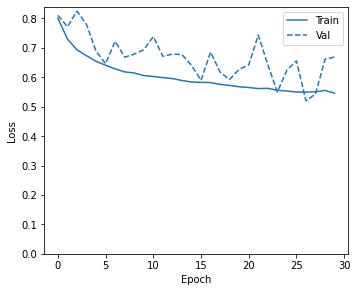

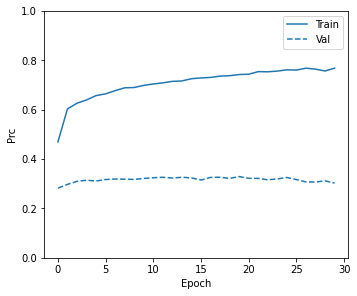

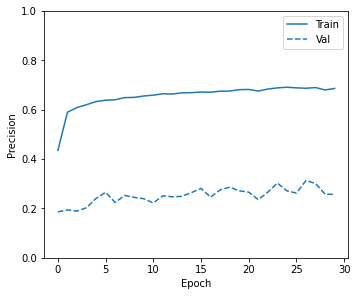

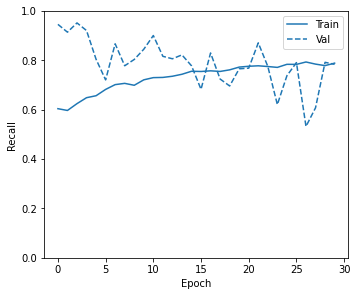

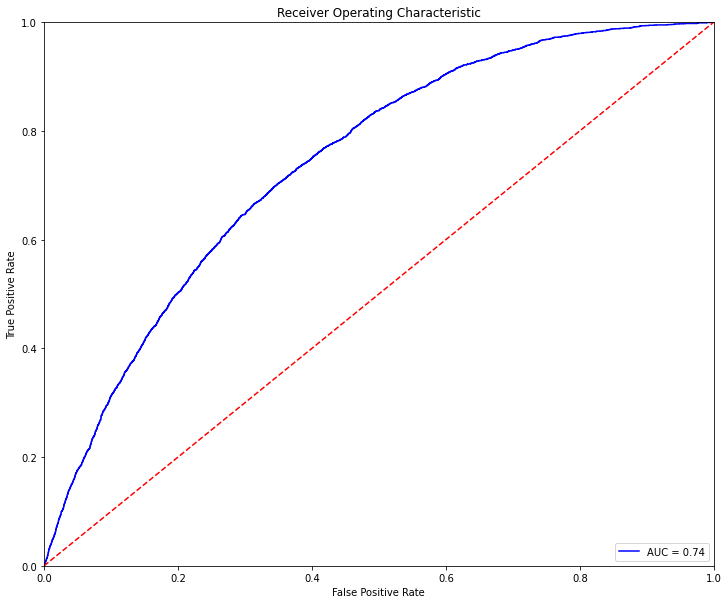

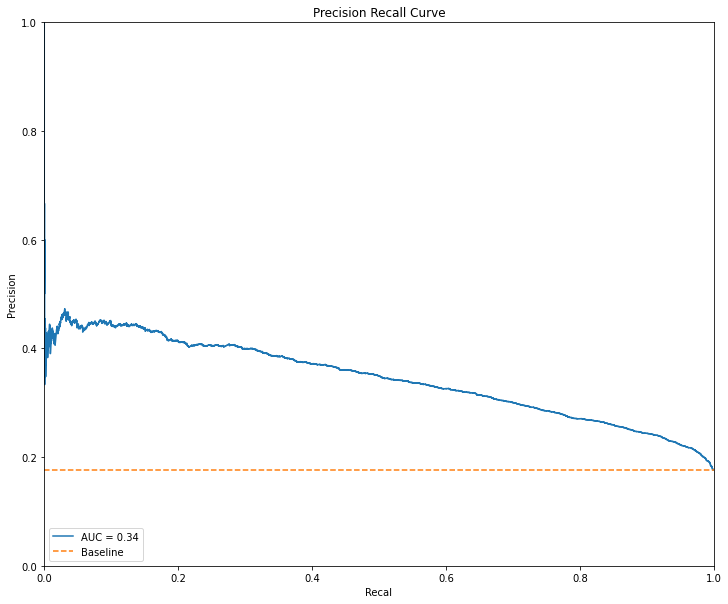

,threshold,tn,fp,fn,tp,f1,accuracy,precision,recall,auc
0,0.0,0,15979,0,3398,0.298397,0.175363,0.175363,1.000000,0.740119
1,0.1,724,15255,10,3388,0.307427,0.212210,0.181730,0.997057,0.740119
2,0.2,2289,13690,41,3357,0.328393,0.291376,0.196926,0.987934,0.740119
3,0.3,4263,11716,132,3266,0.355386,0.388553,0.217995,0.961154,0.740119
4,0.4,6605,9374,363,3035,0.384007,0.497497,0.244581,0.893172,0.740119
5,0.5,9400,6579,809,2589,0.412064,0.618723,0.282395,0.761919,0.740119
6,0.6,12093,3886,1457,1941,0.420813,0.724261,0.333105,0.571218,0.740119
7,0.7,14690,1289,2517,881,0.316451,0.803582,0.405991,0.259270,0.740119
8,0.8,15922,57,3355,43,0.024585,0.823915,0.430000,0.012655,0.740119
9,0.9,15973,6,3393,5,0.002933,0.824586,0.454545,0.001471,0.740119


Model: "sequential_85"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_209 (Dense)            (None, 256)               133120    
_________________________________________________________________
activation_125 (Activation)  (None, 256)               0         
_________________________________________________________________
dropout_30 (Dropout)         (None, 256)               0         
_________________________________________________________________
batch_normalization_30 (Batc (None, 256)               1024      
_________________________________________________________________
dense_210 (Dense)            (None, 256)               65792     
_________________________________________________________________
activation_126 (Activation)  (None, 256)               0         
_________________________________________________________________
dropout_31 (Dropout)         (None, 256)             

None

Epoch 1/100
101/101 [==============================] - 5s 25ms/step - loss: 0.7663 - tp: 17724.9314 - fp: 17103.2157 - tn: 22152.0784 - fn: 11235.9118 - accuracy: 0.5808 - precision: 0.4821 - recall: 0.6168 - auc: 0.6220 - prc: 0.5084 - val_loss: 0.6259 - val_tp: 1657.0000 - val_fp: 4320.0000 - val_tn: 8591.0000 - val_fn: 933.0000 - val_accuracy: 0.6611 - val_precision: 0.2772 - val_recall: 0.6398 - val_auc: 0.7100 - val_prc: 0.3127
Epoch 2/100
101/101 [==============================] - 1s 12ms/step - loss: 0.6399 - tp: 17906.3627 - fp: 10159.2157 - tn: 16159.9706 - fn: 8489.5882 - accuracy: 0.6426 - precision: 0.6353 - recall: 0.6737 - auc: 0.6937 - prc: 0.6626 - val_loss: 0.6241 - val_tp: 1770.0000 - val_fp: 4621.0000 - val_tn: 8290.0000 - val_fn: 820.0000 - val_accuracy: 0.6490 - val_precision: 0.2770 - val_recall: 0.6834 - val_auc: 0.7232 - val_prc: 0.3216
Epoch 3/100
101/101 [==============================] - 1s 13ms/step - loss: 0.6110 - tp: 18980.6765 - fp: 10094.0196 - tn: 1623

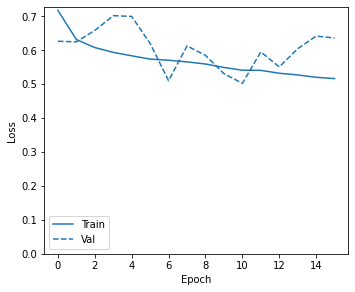

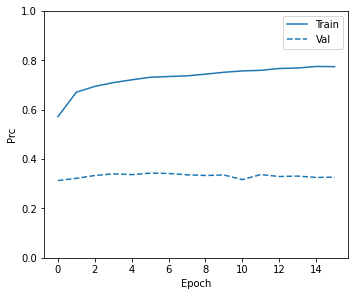

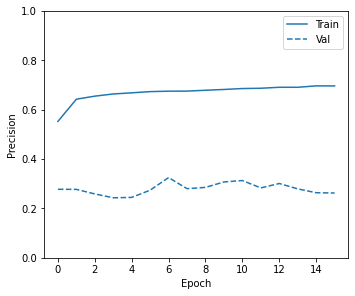

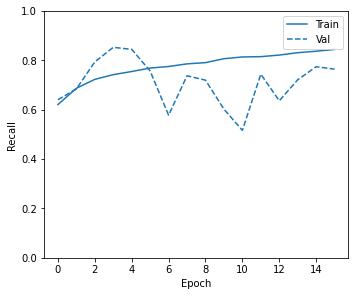

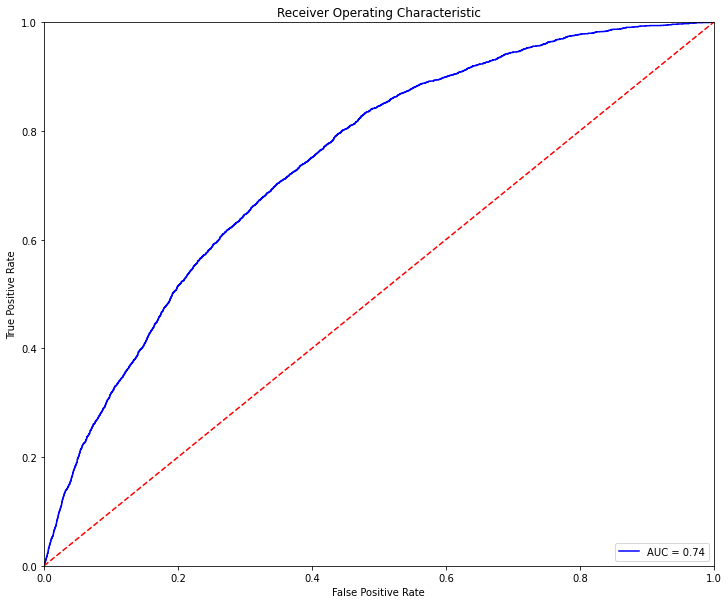

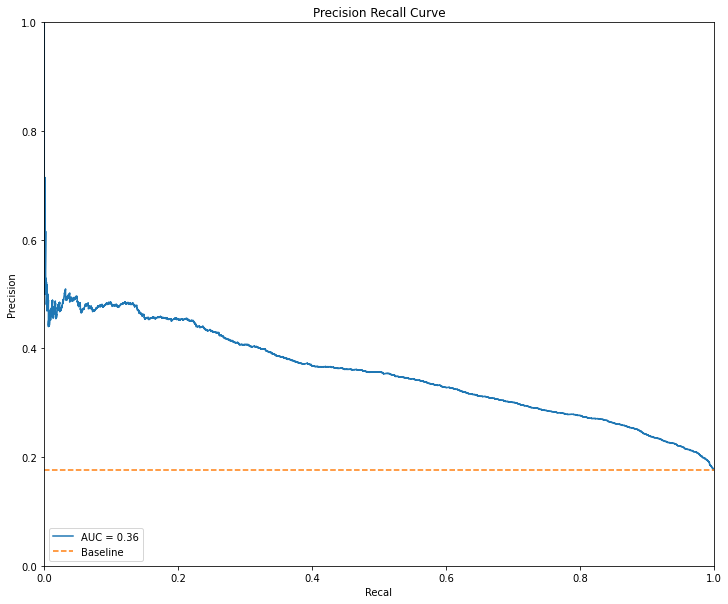

,threshold,tn,fp,fn,tp,f1,accuracy,precision,recall,auc
0,0.0,0,15979,0,3398,0.298397,0.175363,0.175363,1.000000,0.742334
1,0.1,1396,14583,21,3377,0.316228,0.246323,0.188029,0.993820,0.742334
2,0.2,3035,12944,72,3326,0.338214,0.328276,0.204425,0.978811,0.742334
3,0.3,4898,11081,195,3203,0.362289,0.418073,0.224237,0.942613,0.742334
4,0.4,7162,8817,409,2989,0.393186,0.523869,0.253176,0.879635,0.742334
5,0.5,9532,6447,836,2562,0.412993,0.624142,0.284382,0.753973,0.742334
6,0.6,11920,4059,1386,2012,0.424966,0.718997,0.331412,0.592113,0.742334
7,0.7,14338,1641,2303,1095,0.357026,0.796460,0.400219,0.322248,0.742334
8,0.8,15857,122,3280,118,0.064871,0.824431,0.491667,0.034726,0.742334
9,0.9,15978,1,3396,2,0.001176,0.824689,0.666667,0.000589,0.742334


Number of units: 512
Model: "sequential_86"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_212 (Dense)            (None, 512)               266240    
_________________________________________________________________
activation_127 (Activation)  (None, 512)               0         
_________________________________________________________________
dropout_32 (Dropout)         (None, 512)               0         
_________________________________________________________________
batch_normalization_32 (Batc (None, 512)               2048      
_________________________________________________________________
dense_213 (Dense)            (None, 512)               262656    
_________________________________________________________________
activation_128 (Activation)  (None, 512)               0         
_________________________________________________________________
dropout_33 (Dropout)         (No

None

Model: "sequential_87"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_215 (Dense)            (None, 512)               266240    
_________________________________________________________________
activation_129 (Activation)  (None, 512)               0         
_________________________________________________________________
dropout_34 (Dropout)         (None, 512)               0         
_________________________________________________________________
batch_normalization_34 (Batc (None, 512)               2048      
_________________________________________________________________
dense_216 (Dense)            (None, 512)               262656    
_________________________________________________________________
activation_130 (Activation)  (None, 512)               0         
_________________________________________________________________
dropout_35 (Dropout)         (None, 512)             

None

Epoch 1/100
61/61 [==============================] - 5s 43ms/step - loss: 0.7977 - tp: 5229.2419 - fp: 17184.1290 - tn: 22443.5161 - fn: 2868.7258 - accuracy: 0.5793 - precision: 0.2349 - recall: 0.6563 - auc: 0.6472 - prc: 0.2470 - val_loss: 0.6108 - val_tp: 1483.0000 - val_fp: 3717.0000 - val_tn: 9194.0000 - val_fn: 1107.0000 - val_accuracy: 0.6888 - val_precision: 0.2852 - val_recall: 0.5726 - val_auc: 0.6999 - val_prc: 0.3020
Epoch 2/100
61/61 [==============================] - 1s 15ms/step - loss: 0.6863 - tp: 3526.3871 - fp: 10857.0323 - tn: 15866.6774 - fn: 1974.5161 - accuracy: 0.6003 - precision: 0.2441 - recall: 0.6360 - auc: 0.6568 - prc: 0.2619 - val_loss: 0.5549 - val_tp: 1300.0000 - val_fp: 2854.0000 - val_tn: 10057.0000 - val_fn: 1290.0000 - val_accuracy: 0.7327 - val_precision: 0.3130 - val_recall: 0.5019 - val_auc: 0.7166 - val_prc: 0.3202
Epoch 3/100
61/61 [==============================] - 1s 14ms/step - loss: 0.6398 - tp: 3711.8871 - fp: 10508.0806 - tn: 16229.2097 

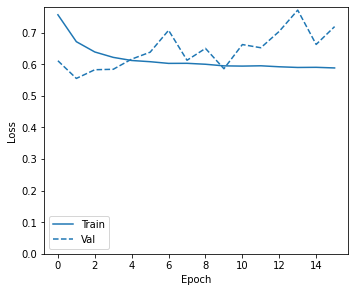

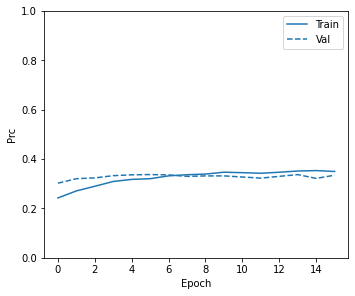

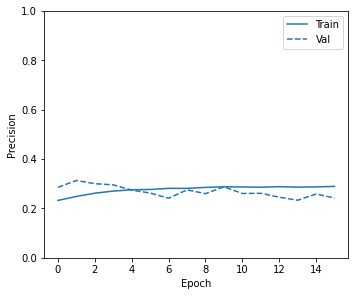

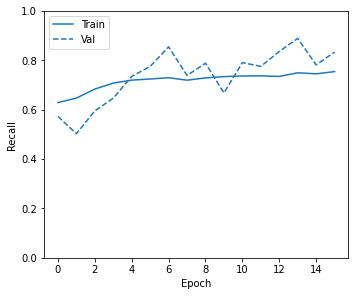

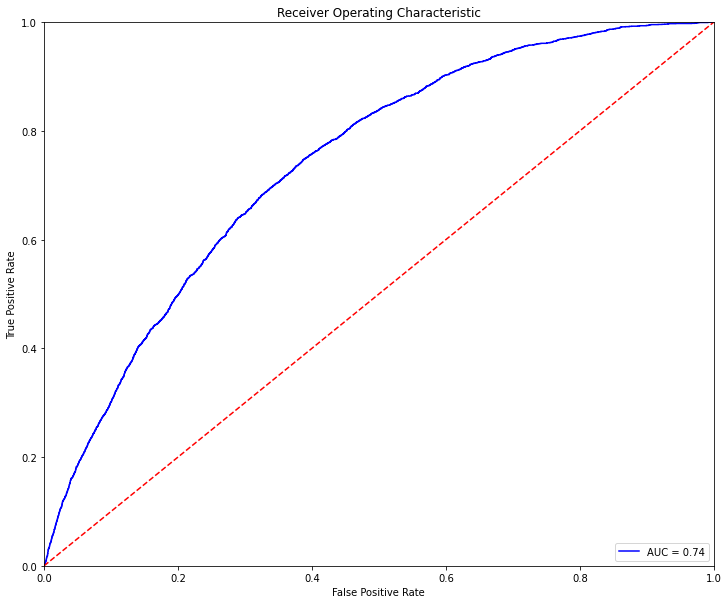

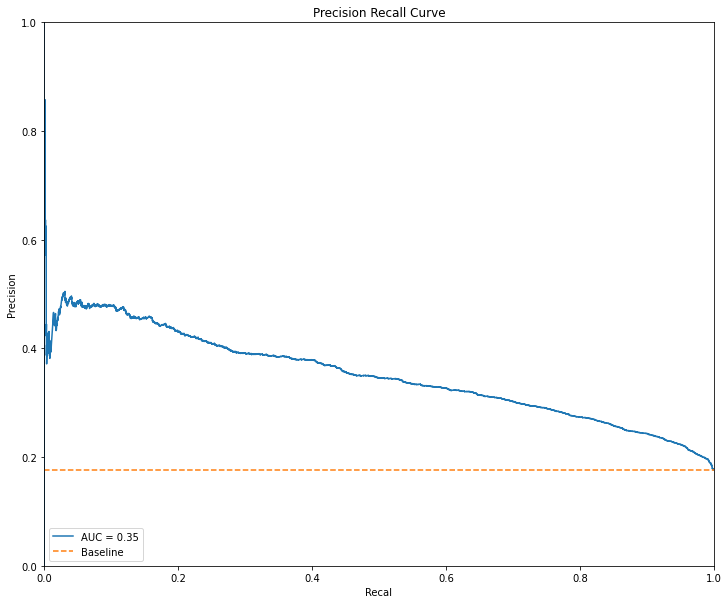

,threshold,tn,fp,fn,tp,f1,accuracy,precision,recall,auc
0,0.0,0,15979,0,3398,0.298397,0.175363,0.175363,1.000000,0.740671
1,0.1,548,15431,8,3390,0.305144,0.203231,0.180118,0.997646,0.740671
2,0.2,2042,13937,28,3370,0.325525,0.279300,0.194719,0.991760,0.740671
3,0.3,3852,12127,125,3273,0.348229,0.367704,0.212532,0.963214,0.740671
4,0.4,6152,9827,303,3095,0.379289,0.477215,0.239514,0.910830,0.740671
5,0.5,8985,6994,728,2670,0.408819,0.601486,0.276283,0.785756,0.740671
6,0.6,12053,3926,1454,1944,0.419508,0.722351,0.331175,0.572101,0.740671
7,0.7,14815,1164,2578,820,0.304719,0.806884,0.413306,0.241318,0.740671
8,0.8,15957,22,3385,13,0.007574,0.824173,0.371429,0.003826,0.740671
9,0.9,15979,0,3398,0,0.000000,0.824637,0.000000,0.000000,0.740671


Model: "sequential_88"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_218 (Dense)            (None, 512)               266240    
_________________________________________________________________
activation_131 (Activation)  (None, 512)               0         
_________________________________________________________________
dropout_36 (Dropout)         (None, 512)               0         
_________________________________________________________________
batch_normalization_36 (Batc (None, 512)               2048      
_________________________________________________________________
dense_219 (Dense)            (None, 512)               262656    
_________________________________________________________________
activation_132 (Activation)  (None, 512)               0         
_________________________________________________________________
dropout_37 (Dropout)         (None, 512)             

None

Epoch 1/100
21/21 [==============================] - 4s 79ms/step - loss: 0.8184 - tp: 5510.3636 - fp: 9323.8636 - tn: 9432.8636 - fn: 2929.7273 - accuracy: 0.5473 - precision: 0.3604 - recall: 0.6655 - auc: 0.6287 - prc: 0.4297 - val_loss: 0.7487 - val_tp: 2243.0000 - val_fp: 8827.0000 - val_tn: 4084.0000 - val_fn: 347.0000 - val_accuracy: 0.4082 - val_precision: 0.2026 - val_recall: 0.8660 - val_auc: 0.6806 - val_prc: 0.2876
Epoch 2/100
21/21 [==============================] - 0s 21ms/step - loss: 0.7232 - tp: 3557.4545 - fp: 2392.9091 - tn: 3457.9545 - fn: 2287.5000 - accuracy: 0.5989 - precision: 0.5996 - recall: 0.6058 - auc: 0.6375 - prc: 0.6192 - val_loss: 0.6420 - val_tp: 1586.0000 - val_fp: 4320.0000 - val_tn: 8591.0000 - val_fn: 1004.0000 - val_accuracy: 0.6565 - val_precision: 0.2685 - val_recall: 0.6124 - val_auc: 0.6917 - val_prc: 0.2909
Epoch 3/100
21/21 [==============================] - 0s 20ms/step - loss: 0.6949 - tp: 3651.0909 - fp: 2336.7727 - tn: 3514.5909 - fn: 21

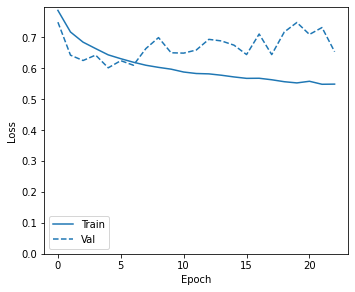

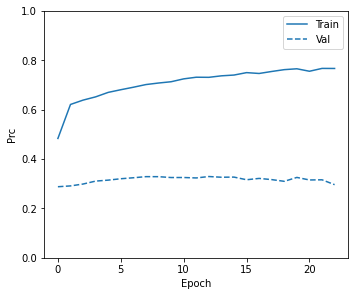

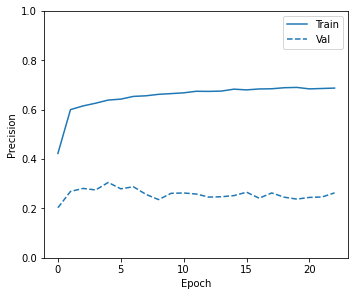

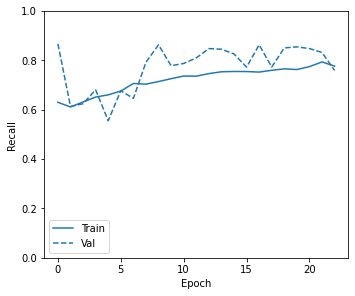

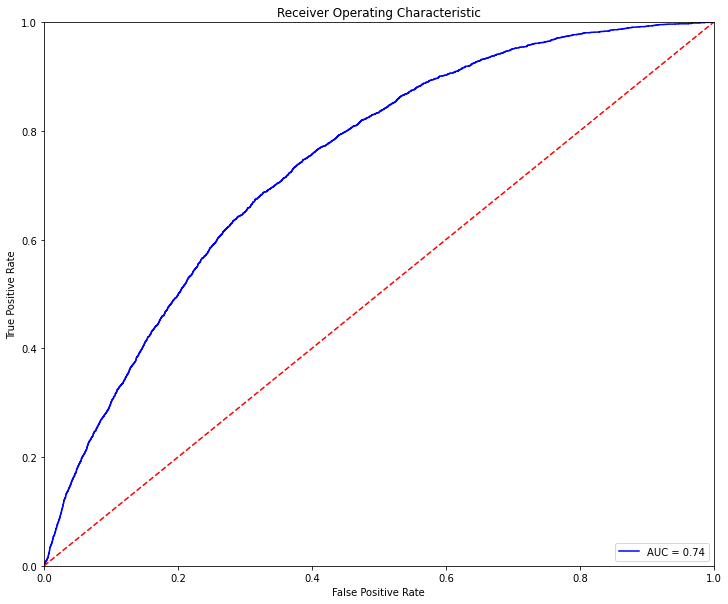

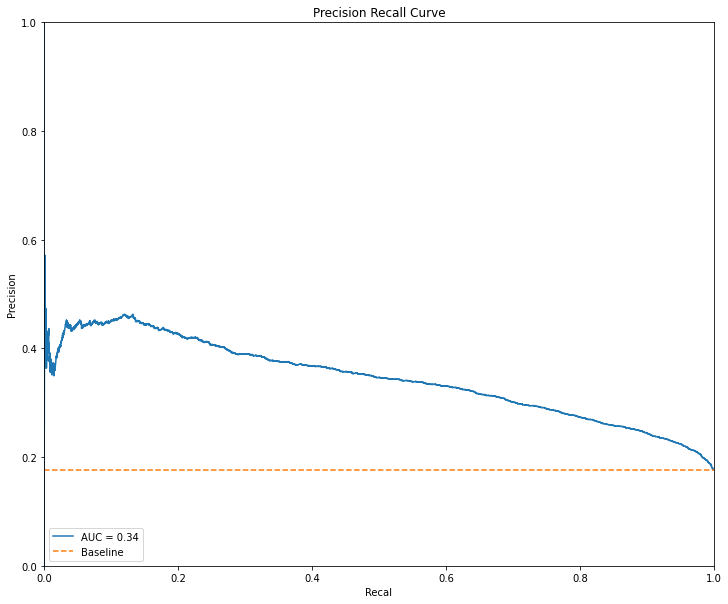

,threshold,tn,fp,fn,tp,f1,accuracy,precision,recall,auc
0,0.0,0,15979,0,3398,0.298397,0.175363,0.175363,1.000000,0.740861
1,0.1,61,15918,0,3398,0.299199,0.178511,0.175916,1.000000,0.740861
2,0.2,579,15400,8,3390,0.305571,0.204830,0.180415,0.997646,0.740861
3,0.3,2032,13947,35,3363,0.324802,0.278423,0.194281,0.989700,0.740861
4,0.4,4300,11679,136,3262,0.355745,0.390256,0.218325,0.959976,0.740861
5,0.5,7648,8331,504,2894,0.395815,0.544047,0.257817,0.851677,0.740861
6,0.6,11637,4342,1292,2106,0.427788,0.709243,0.326613,0.619776,0.740861
7,0.7,14792,1187,2567,831,0.306869,0.806265,0.411794,0.244556,0.740861
8,0.8,15924,55,3367,31,0.017796,0.823399,0.360465,0.009123,0.740861
9,0.9,15976,3,3397,1,0.000588,0.824534,0.250000,0.000294,0.740861


Model: "sequential_89"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_221 (Dense)            (None, 512)               266240    
_________________________________________________________________
activation_133 (Activation)  (None, 512)               0         
_________________________________________________________________
dropout_38 (Dropout)         (None, 512)               0         
_________________________________________________________________
batch_normalization_38 (Batc (None, 512)               2048      
_________________________________________________________________
dense_222 (Dense)            (None, 512)               262656    
_________________________________________________________________
activation_134 (Activation)  (None, 512)               0         
_________________________________________________________________
dropout_39 (Dropout)         (None, 512)             

None

Epoch 1/100
101/101 [==============================] - 6s 32ms/step - loss: 0.7559 - tp: 17943.7647 - fp: 16393.7451 - tn: 22861.5490 - fn: 11017.0784 - accuracy: 0.5953 - precision: 0.4955 - recall: 0.6224 - auc: 0.6408 - prc: 0.5249 - val_loss: 0.6685 - val_tp: 1981.0000 - val_fp: 5919.0000 - val_tn: 6992.0000 - val_fn: 609.0000 - val_accuracy: 0.5789 - val_precision: 0.2508 - val_recall: 0.7649 - val_auc: 0.7147 - val_prc: 0.3155
Epoch 2/100
101/101 [==============================] - 1s 14ms/step - loss: 0.6276 - tp: 18312.7059 - fp: 10041.9216 - tn: 16277.2647 - fn: 8083.2451 - accuracy: 0.6533 - precision: 0.6443 - recall: 0.6886 - auc: 0.7073 - prc: 0.6777 - val_loss: 0.6324 - val_tp: 1899.0000 - val_fp: 5131.0000 - val_tn: 7780.0000 - val_fn: 691.0000 - val_accuracy: 0.6244 - val_precision: 0.2701 - val_recall: 0.7332 - val_auc: 0.7314 - val_prc: 0.3327
Epoch 3/100
101/101 [==============================] - 1s 14ms/step - loss: 0.5990 - tp: 19169.1667 - fp: 9818.6765 - tn: 16511

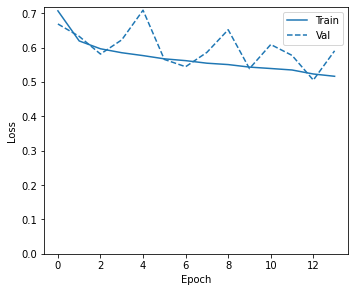

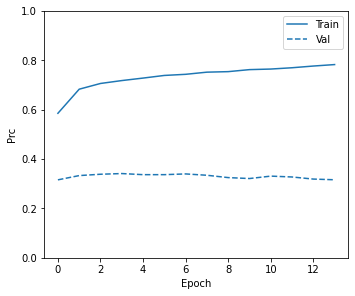

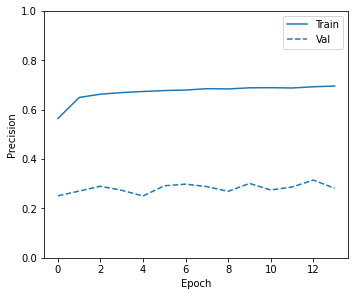

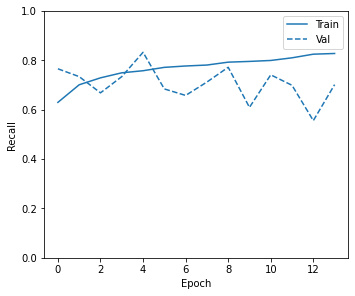

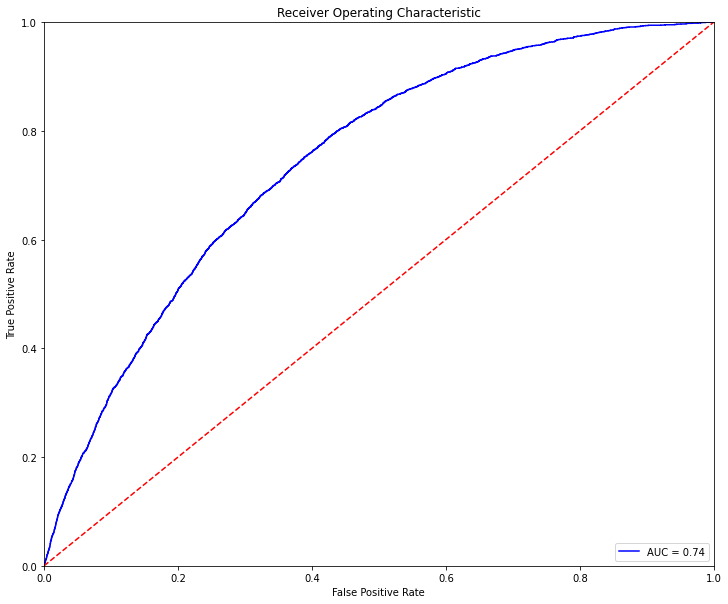

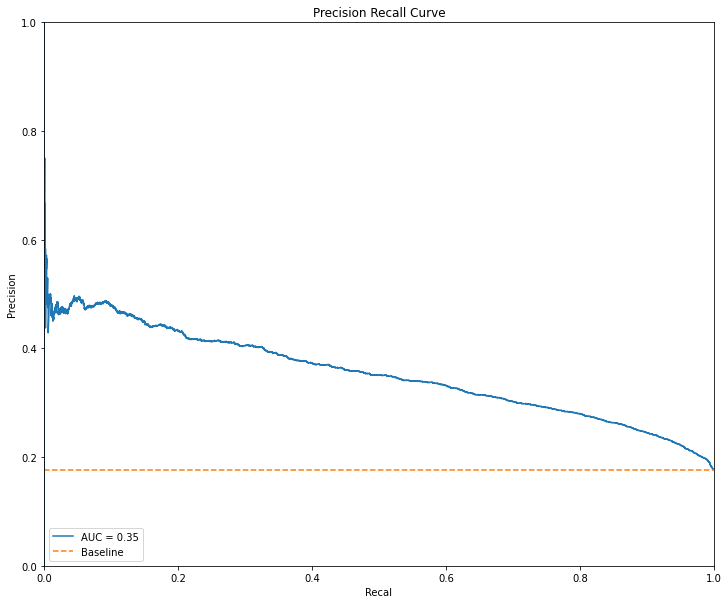

,threshold,tn,fp,fn,tp,f1,accuracy,precision,recall,auc
0,0.0,0,15979,0,3398,0.298397,0.175363,0.175363,1.000000,0.743583
1,0.1,405,15574,6,3392,0.303345,0.195954,0.178846,0.998234,0.743583
2,0.2,1765,14214,27,3371,0.321308,0.265057,0.191697,0.992054,0.743583
3,0.3,3906,12073,125,3273,0.349232,0.370491,0.213280,0.963214,0.743583
4,0.4,6736,9243,360,3038,0.387525,0.504412,0.247374,0.894055,0.743583
5,0.5,9809,6170,855,2543,0.419949,0.637457,0.291863,0.748381,0.743583
6,0.6,12561,3418,1599,1799,0.417644,0.741085,0.344834,0.529429,0.743583
7,0.7,14896,1083,2622,776,0.295225,0.808794,0.417429,0.228370,0.743583
8,0.8,15938,41,3363,35,0.020150,0.824328,0.460526,0.010300,0.743583
9,0.9,15979,0,3398,0,0.000000,0.824637,0.000000,0.000000,0.743583


Number of units: 1024
Model: "sequential_90"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_224 (Dense)            (None, 1024)              532480    
_________________________________________________________________
activation_135 (Activation)  (None, 1024)              0         
_________________________________________________________________
dropout_40 (Dropout)         (None, 1024)              0         
_________________________________________________________________
batch_normalization_40 (Batc (None, 1024)              4096      
_________________________________________________________________
dense_225 (Dense)            (None, 1024)              1049600   
_________________________________________________________________
activation_136 (Activation)  (None, 1024)              0         
_________________________________________________________________
dropout_41 (Dropout)         (N

None

Model: "sequential_91"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_227 (Dense)            (None, 1024)              532480    
_________________________________________________________________
activation_137 (Activation)  (None, 1024)              0         
_________________________________________________________________
dropout_42 (Dropout)         (None, 1024)              0         
_________________________________________________________________
batch_normalization_42 (Batc (None, 1024)              4096      
_________________________________________________________________
dense_228 (Dense)            (None, 1024)              1049600   
_________________________________________________________________
activation_138 (Activation)  (None, 1024)              0         
_________________________________________________________________
dropout_43 (Dropout)         (None, 1024)            

None

Epoch 1/100
61/61 [==============================] - 5s 39ms/step - loss: 0.8191 - tp: 5075.8065 - fp: 16207.9194 - tn: 23419.7258 - fn: 3022.1613 - accuracy: 0.5997 - precision: 0.2412 - recall: 0.6335 - auc: 0.6497 - prc: 0.2486 - val_loss: 0.6881 - val_tp: 2037.0000 - val_fp: 6369.0000 - val_tn: 6542.0000 - val_fn: 553.0000 - val_accuracy: 0.5534 - val_precision: 0.2423 - val_recall: 0.7865 - val_auc: 0.7092 - val_prc: 0.3188
Epoch 2/100
61/61 [==============================] - 1s 17ms/step - loss: 0.6855 - tp: 3579.3226 - fp: 10749.2258 - tn: 15974.4839 - fn: 1921.5806 - accuracy: 0.6044 - precision: 0.2491 - recall: 0.6498 - auc: 0.6633 - prc: 0.2659 - val_loss: 0.6106 - val_tp: 1716.0000 - val_fp: 4489.0000 - val_tn: 8422.0000 - val_fn: 874.0000 - val_accuracy: 0.6540 - val_precision: 0.2766 - val_recall: 0.6625 - val_auc: 0.7197 - val_prc: 0.3243
Epoch 3/100
61/61 [==============================] - 1s 18ms/step - loss: 0.6320 - tp: 3729.2742 - fp: 10322.3710 - tn: 16414.9194 - f

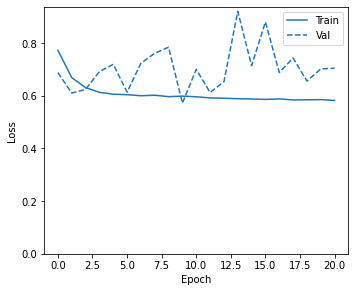

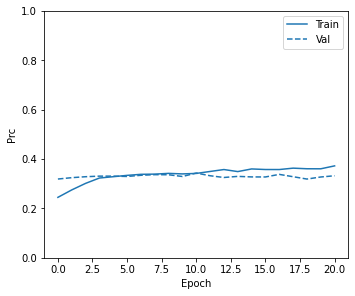

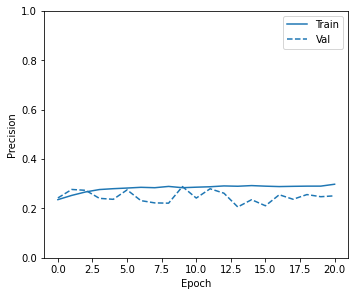

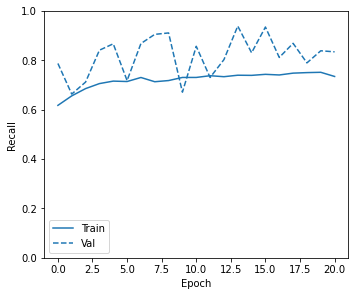

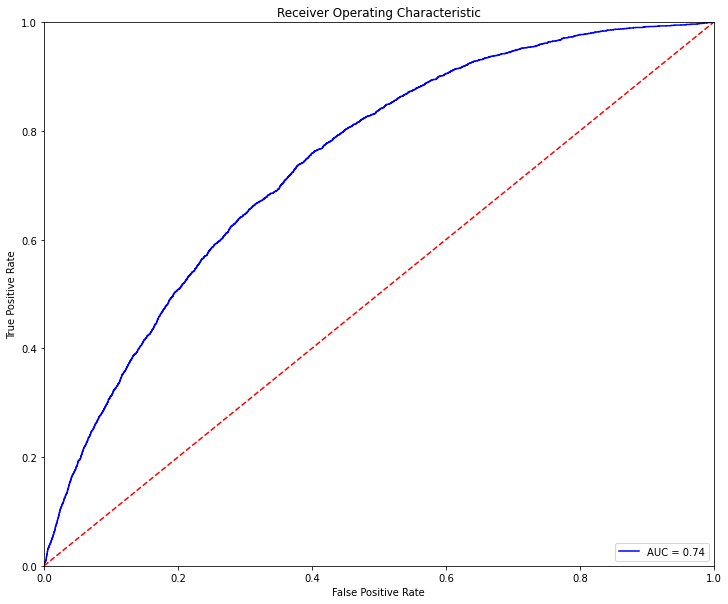

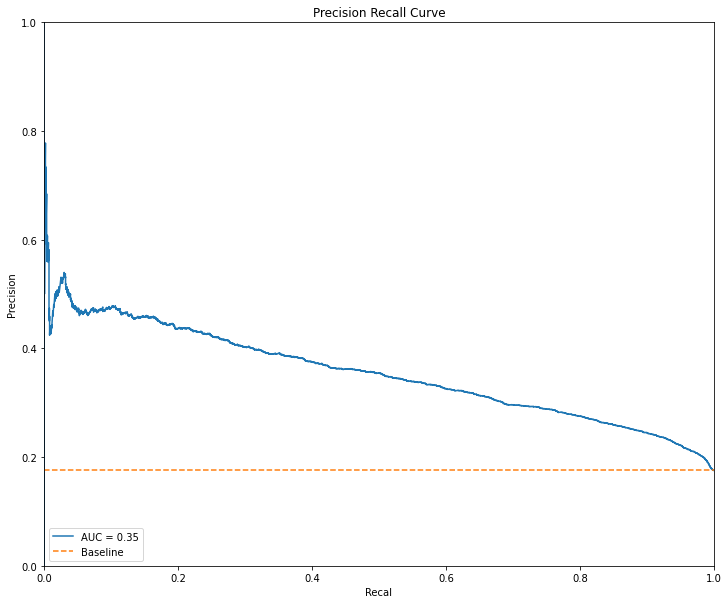

,threshold,tn,fp,fn,tp,f1,accuracy,precision,recall,auc
0,0.0,0,15979,0,3398,0.298397,0.175363,0.175363,1.000000,0.74168
1,0.1,748,15231,17,3381,0.307224,0.213088,0.181657,0.994997,0.74168
2,0.2,2012,13967,37,3361,0.324327,0.277288,0.193964,0.989111,0.74168
3,0.3,3462,12517,93,3305,0.343913,0.349228,0.208886,0.972631,0.74168
4,0.4,5137,10842,205,3193,0.366317,0.429891,0.227503,0.939670,0.74168
5,0.5,7406,8573,457,2941,0.394447,0.533984,0.255428,0.865509,0.74168
6,0.6,10348,5631,1025,2373,0.416243,0.656500,0.296477,0.698352,0.74168
7,0.7,13574,2405,1983,1415,0.392075,0.773546,0.370419,0.416421,0.74168
8,0.8,15792,187,3233,165,0.088000,0.823502,0.468750,0.048558,0.74168
9,0.9,15978,1,3398,0,0.000000,0.824586,0.000000,0.000000,0.74168


Model: "sequential_92"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_230 (Dense)            (None, 1024)              532480    
_________________________________________________________________
activation_139 (Activation)  (None, 1024)              0         
_________________________________________________________________
dropout_44 (Dropout)         (None, 1024)              0         
_________________________________________________________________
batch_normalization_44 (Batc (None, 1024)              4096      
_________________________________________________________________
dense_231 (Dense)            (None, 1024)              1049600   
_________________________________________________________________
activation_140 (Activation)  (None, 1024)              0         
_________________________________________________________________
dropout_45 (Dropout)         (None, 1024)            

None

Epoch 1/100
21/21 [==============================] - 5s 110ms/step - loss: 0.8336 - tp: 5569.6818 - fp: 8981.7727 - tn: 9774.9545 - fn: 2870.4091 - accuracy: 0.5629 - precision: 0.3717 - recall: 0.6734 - auc: 0.6468 - prc: 0.4372 - val_loss: 0.6034 - val_tp: 1045.0000 - val_fp: 2748.0000 - val_tn: 10163.0000 - val_fn: 1545.0000 - val_accuracy: 0.7231 - val_precision: 0.2755 - val_recall: 0.4035 - val_auc: 0.6700 - val_prc: 0.2612
Epoch 2/100
21/21 [==============================] - 0s 22ms/step - loss: 0.7307 - tp: 3598.8636 - fp: 2329.4545 - tn: 3521.4091 - fn: 2246.0909 - accuracy: 0.6074 - precision: 0.6082 - recall: 0.6132 - auc: 0.6462 - prc: 0.6200 - val_loss: 0.7342 - val_tp: 2254.0000 - val_fp: 8322.0000 - val_tn: 4589.0000 - val_fn: 336.0000 - val_accuracy: 0.4415 - val_precision: 0.2131 - val_recall: 0.8703 - val_auc: 0.6914 - val_prc: 0.2888
Epoch 3/100
21/21 [==============================] - 0s 23ms/step - loss: 0.6865 - tp: 3735.6364 - fp: 2298.0455 - tn: 3553.3182 - fn: 

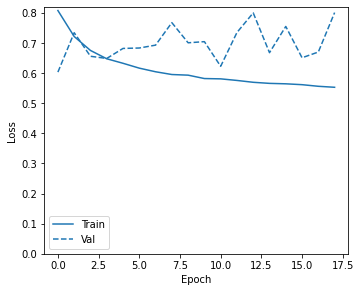

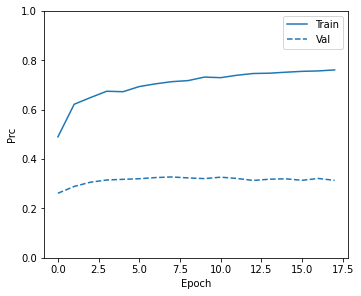

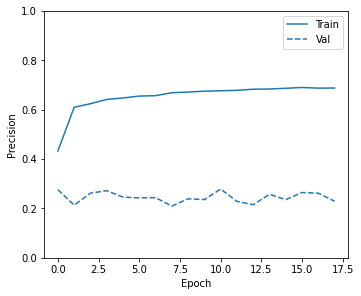

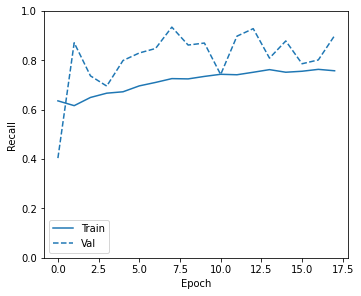

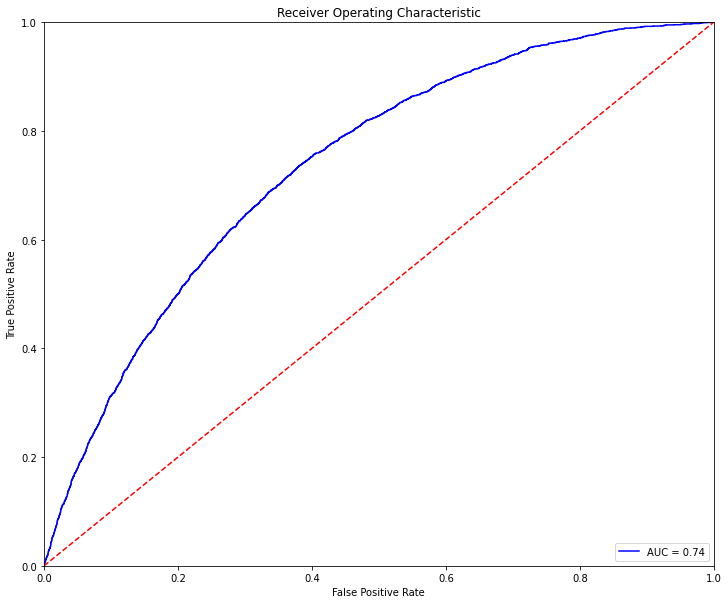

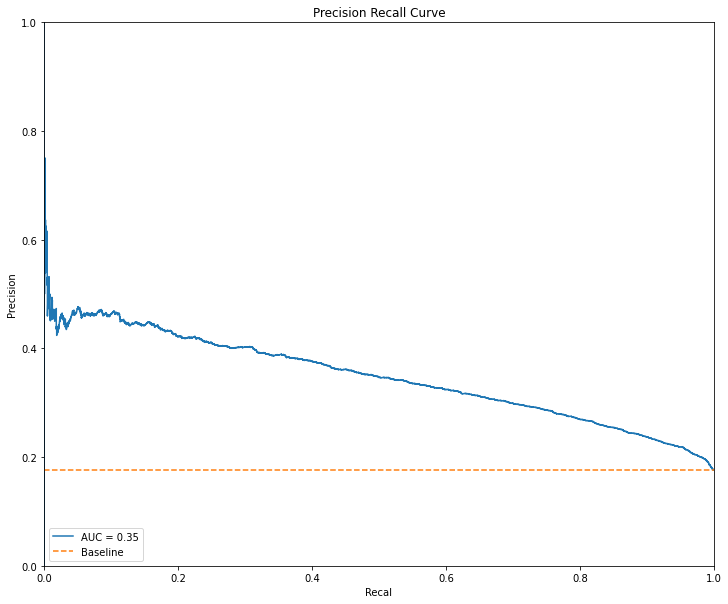

,threshold,tn,fp,fn,tp,f1,accuracy,precision,recall,auc
0,0.0,0,15979,0,3398,0.298397,0.175363,0.175363,1.000000,0.736601
1,0.1,0,15979,0,3398,0.298397,0.175363,0.175363,1.000000,0.736601
2,0.2,16,15963,0,3398,0.298607,0.176188,0.175507,1.000000,0.736601
3,0.3,286,15693,4,3394,0.301890,0.189916,0.177817,0.998823,0.736601
4,0.4,1591,14388,26,3372,0.318745,0.256128,0.189865,0.992348,0.736601
5,0.5,4819,11160,207,3191,0.359570,0.413377,0.222354,0.939082,0.736601
6,0.6,10437,5542,1032,2366,0.418539,0.660732,0.299191,0.696292,0.736601
7,0.7,14982,997,2681,717,0.280516,0.810187,0.418320,0.211006,0.736601
8,0.8,15977,2,3395,3,0.001763,0.824689,0.600000,0.000883,0.736601
9,0.9,15979,0,3398,0,0.000000,0.824637,0.000000,0.000000,0.736601


Model: "sequential_93"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_233 (Dense)            (None, 1024)              532480    
_________________________________________________________________
activation_141 (Activation)  (None, 1024)              0         
_________________________________________________________________
dropout_46 (Dropout)         (None, 1024)              0         
_________________________________________________________________
batch_normalization_46 (Batc (None, 1024)              4096      
_________________________________________________________________
dense_234 (Dense)            (None, 1024)              1049600   
_________________________________________________________________
activation_142 (Activation)  (None, 1024)              0         
_________________________________________________________________
dropout_47 (Dropout)         (None, 1024)            

None

Epoch 1/100
101/101 [==============================] - 6s 30ms/step - loss: 0.7663 - tp: 18548.3529 - fp: 18523.8137 - tn: 20731.4804 - fn: 10412.4902 - accuracy: 0.5631 - precision: 0.4712 - recall: 0.6511 - auc: 0.6209 - prc: 0.5158 - val_loss: 0.6839 - val_tp: 2077.0000 - val_fp: 6311.0000 - val_tn: 6600.0000 - val_fn: 513.0000 - val_accuracy: 0.5598 - val_precision: 0.2476 - val_recall: 0.8019 - val_auc: 0.7229 - val_prc: 0.3303
Epoch 2/100
101/101 [==============================] - 2s 17ms/step - loss: 0.6198 - tp: 18445.1667 - fp: 9771.8039 - tn: 16547.3824 - fn: 7950.7843 - accuracy: 0.6623 - precision: 0.6532 - recall: 0.6957 - auc: 0.7170 - prc: 0.6852 - val_loss: 0.7040 - val_tp: 2204.0000 - val_fp: 7057.0000 - val_tn: 5854.0000 - val_fn: 386.0000 - val_accuracy: 0.5198 - val_precision: 0.2380 - val_recall: 0.8510 - val_auc: 0.7334 - val_prc: 0.3385
Epoch 3/100
101/101 [==============================] - 2s 17ms/step - loss: 0.5949 - tp: 19035.3137 - fp: 9560.1373 - tn: 16770.

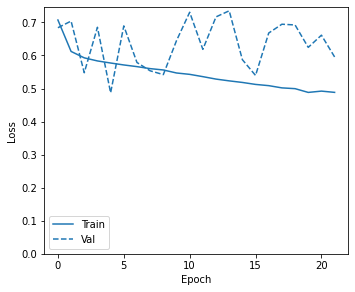

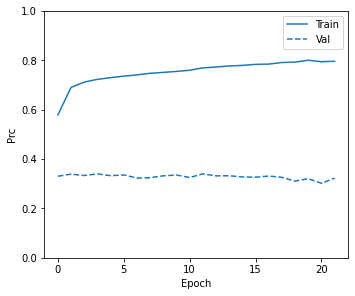

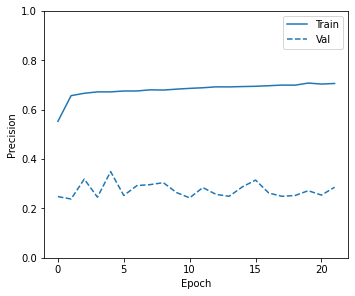

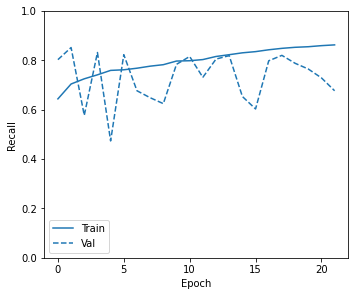

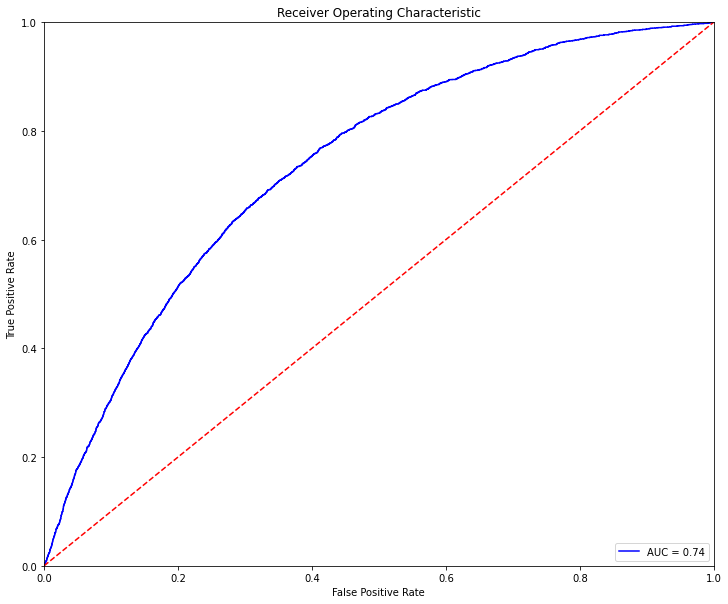

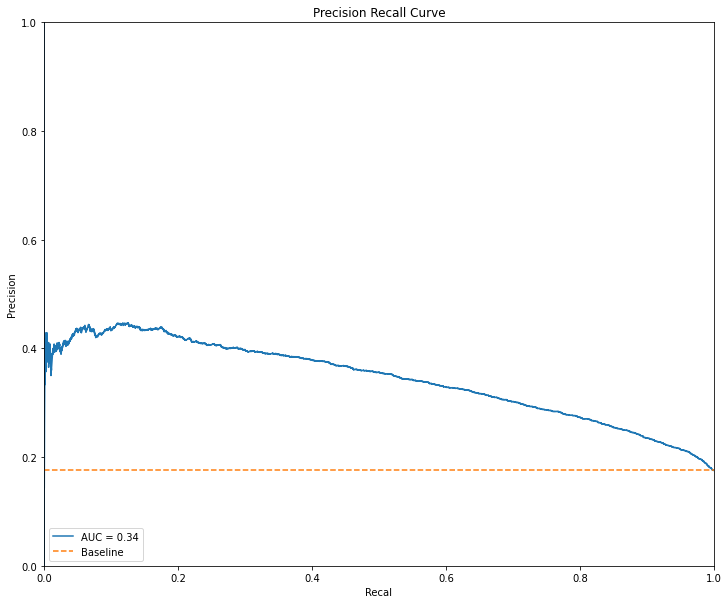

,threshold,tn,fp,fn,tp,f1,accuracy,precision,recall,auc
0,0.0,0,15979,0,3398,0.298397,0.175363,0.175363,1.000000,0.737248
1,0.1,4290,11689,178,3220,0.351778,0.387573,0.215977,0.947616,0.737248
2,0.2,5920,10059,325,3073,0.371809,0.464107,0.234009,0.904356,0.737248
3,0.3,7345,8634,483,2915,0.390045,0.529494,0.252403,0.857858,0.737248
4,0.4,8635,7344,666,2732,0.405522,0.586623,0.271139,0.804002,0.737248
5,0.5,9997,5982,919,2479,0.418079,0.643856,0.292991,0.729547,0.737248
6,0.6,11497,4482,1254,2144,0.427773,0.703979,0.323574,0.630959,0.737248
7,0.7,13132,2847,1795,1603,0.408512,0.760438,0.360225,0.471748,0.737248
8,0.8,14896,1083,2639,759,0.289695,0.807917,0.412052,0.223367,0.737248
9,0.9,15897,82,3344,54,0.030560,0.823192,0.397059,0.015892,0.737248


In [ ]:
units = [16, 32, 128, 256, 512, 1024]
for i in range(0, len(units)):
  print('Number of units: ' +str(units[i]))
  model = create_model_abstract_2l_batch_drop(units[i])
  initial_weights = os.path.join(tempfile.mkdtemp(), 'initial_weights')
  model.save_weights(initial_weights)

  for j in range(0, len(datasets_features)):
    if j == 0: 
      model = create_model_abstract_2l_batch_drop(units[i])
      model.load_weights(initial_weights)
      history = model.fit(
        train_features, train_labels,
        batch_size=BATCH_SIZE,
        epochs=EPOCHS,
        callbacks=[early_stopping],
        validation_data=(val_features, val_labels),
        class_weight=class_weights, 
        verbose=1)

      plot_metrics(history)
      predictions = model.predict(test_features, batch_size=BATCH_SIZE)
      eval_train = evaluate_model(actual=test_labels, predicted=predictions, threshold=np.linspace(0,1,11))
      display(eval_train)

    else:
      model = create_model_abstract_2l_batch_drop(units[i])
      model.load_weights(initial_weights)
      history = model.fit(
        datasets_features[j], datasets_labels[j],
        batch_size=BATCH_SIZE,
        epochs=EPOCHS,
        callbacks=[early_stopping],
        validation_data=(val_features, val_labels),
        verbose=1)

      plot_metrics(history)
      predictions = model.predict(test_features, batch_size=BATCH_SIZE)
      eval_train = evaluate_model(actual=test_labels, predicted=predictions, threshold=np.linspace(0,1,11))
      display(eval_train)  

In [ ]:
from sklearn.utils import class_weight
class_weights = class_weight.compute_class_weight('balanced',
                                                 np.unique(y_train),
                                                 y_train['target'])
class_weights

array([0.60271988, 2.93380335])

In [ ]:
def build_nn(activation = 'relu',
              dropout_rate = 0.2,
              optimizer = 'Adam'):
    model = Sequential()
    
    model.add(Conv2D(32, kernel_size=(3, 3),
              activation=activation,
              input_shape=input_shape))
    model.add(Conv2D(64, (3, 3), activation=activation))
    model.add(MaxPooling2D(pool_size=(2, 2)))
    model.add(Dropout(dropout_rate))
    model.add(Flatten())
    model.add(Dense(128, activation=activation))
    model.add(Dropout(dropout_rate))
    model.add(Dense(10, activation='softmax'))
    
    model.compile(
        loss='categorical_crossentropy', 
        optimizer=optimizer, 
        metrics=['accuracy']
    )
    
    return model

<div class="images">
<strong> Se desarrolla líneas de codigos para hiperparametrizar - scikitLearn!</strong> <br> 
</div>

In [ ]:
def search_pipeline_early(X_train_data, X_test_data, y_train_data, y_test_data, 
                       model, param_grid, eval_set, cv=10, scoring_fit='neg_mean_squared_error',
                       do_probabilities = False, search_mode = 'GridSearchCV', n_iterations = 0):
    fitted_model = None
    
    if(search_mode == 'GridSearchCV'):
        gs = GridSearchCV(
            estimator=model,
            param_grid=param_grid, 
            cv=cv, 
            n_jobs=1, 
            scoring=scoring_fit,
            verbose=2, 
            return_train_score = True
        )
        fitted_model = gs.fit(X_train_data, y_train_data, early_stopping_rounds=5, eval_set=eval_set)
        obj = gs

    elif (search_mode == 'RandomizedSearchCV'):
        rs = RandomizedSearchCV(
            estimator=model,
            param_distributions=param_grid, 
            cv=cv,
            n_iter=n_iterations,
            n_jobs=1, 
            scoring=scoring_fit,
            verbose=2, 
            return_train_score = True
        )
        fitted_model = rs.fit(X_train_data, y_train_data, callbacks=[early_stopping], validation_data=(val_features, val_labels))
        obj = rs
    
    
    if(fitted_model != None):
        if do_probabilities:
            pred = fitted_model.predict_proba(X_test_data)[:,1]
        else:
            pred = fitted_model.predict(X_test_data)
            
        return fitted_model, pred, obj

In [ ]:
def build_nn_grid(activation = 'relu', dropout_rate = 0.2, optimizer = 'Adam'):
  model = keras.Sequential()
  model.add(Dense(units=16, input_shape=(train_features.shape[-1],)))
  model.add(Activation(activation ))
  model.add(Dropout(dropout_rate))
  model.add(BatchNormalization())
  model.add(Dense(units=16))
  model.add(Activation(activation ))
  model.add(Dropout(dropout_rate))
  model.add(BatchNormalization())
  model.add(Dense(1, activation='sigmoid'))

  display(model.summary())

  model.compile(
        optimizer=optimizer,
        loss=keras.losses.BinaryCrossentropy(),
      metrics=METRICS)
  
  return model

In [ ]:
weights_list = []
weights_list_ = []
for i in range(0,7):
  weights_list.append([0.63, 2.9 + i])
  weights_list_.append({j : weights_list[i][j] for j in range(2)})

<div class="images">
<strong> Se aplica EarlyStopping y se juega con los pesos también!</strong> <br> 
</div>

In [ ]:
param_grid = {
              'epochs':               [100],
              'batch_size' :          [1024, 2048],
              'optimizer' :           ['Adam'],
              'dropout_rate' :        [ 0.5],
              'activation' :          ['relu'], 
              'class_weight':         weights_list_
             }

In [ ]:
from keras.wrappers.scikit_learn import KerasClassifier
model = KerasClassifier(build_fn = build_nn_grid, verbose=1)

In [ ]:
model, pred, obj = search_pipeline_early(X_train, X_test, np.ravel(y_train), y_test, model, 
                                 param_grid, eval_set, cv=5, scoring_fit='f1', do_probabilities = True, search_mode = 'RandomizedSearchCV', n_iterations = 20)

print(model.best_score_)
print(model.best_params_)

Fitting 5 folds for each of 14 candidates, totalling 70 fits
[CV] optimizer=Adam, epochs=100, dropout_rate=0.5, class_weight={0: 0.63, 1: 2.9}, batch_size=1024, activation=relu 
Model: "sequential_519"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_1410 (Dense)           (None, 16)                8320      
_________________________________________________________________
activation_892 (Activation)  (None, 16)                0         
_________________________________________________________________
dropout_797 (Dropout)        (None, 16)                0         
_________________________________________________________________
batch_normalization_797 (Bat (None, 16)                64        
_________________________________________________________________
dense_1411 (Dense)           (None, 16)                272       
_________________________________________________________________
activa

/usr/local/lib/python3.7/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 14 is smaller than n_iter=20. Running 14 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


None

Epoch 1/100
49/49 [==============================] - 5s 36ms/step - loss: 0.8006 - tp: 5462.8000 - fp: 21060.2200 - tn: 24318.1000 - fn: 3899.4400 - accuracy: 0.5425 - precision: 0.2074 - recall: 0.5949 - auc: 0.5841 - prc: 0.2067 - val_loss: 0.6625 - val_tp: 702.0000 - val_fp: 2152.0000 - val_tn: 10759.0000 - val_fn: 1888.0000 - val_accuracy: 0.7394 - val_precision: 0.2460 - val_recall: 0.2710 - val_auc: 0.6076 - val_prc: 0.2285
Epoch 2/100
49/49 [==============================] - 1s 11ms/step - loss: 0.7535 - tp: 1742.0400 - fp: 7022.6000 - tn: 14544.4600 - fn: 2759.4600 - accuracy: 0.6186 - precision: 0.1987 - recall: 0.3992 - auc: 0.5421 - prc: 0.1992 - val_loss: 0.6219 - val_tp: 207.0000 - val_fp: 388.0000 - val_tn: 12523.0000 - val_fn: 2383.0000 - val_accuracy: 0.8212 - val_precision: 0.3479 - val_recall: 0.0799 - val_auc: 0.6418 - val_prc: 0.2568
Epoch 3/100
49/49 [==============================] - 1s 11ms/step - loss: 0.7388 - tp: 1638.5600 - fp: 6265.2000 - tn: 15326.5200 - fn

/usr/local/lib/python3.7/dist-packages/keras/engine/sequential.py:450: UserWarning: `model.predict_classes()` is deprecated and will be removed after 2021-01-01. Please use instead:* `np.argmax(model.predict(x), axis=-1)`,   if your model does multi-class classification   (e.g. if it uses a `softmax` last-layer activation).* `(model.predict(x) > 0.5).astype("int32")`,   if your model does binary classification   (e.g. if it uses a `sigmoid` last-layer activation).
  warnings.warn('`model.predict_classes()` is deprecated and '


13/13 [==============================] - 0s 3ms/step


/usr/local/lib/python3.7/dist-packages/keras/engine/sequential.py:450: UserWarning: `model.predict_classes()` is deprecated and will be removed after 2021-01-01. Please use instead:* `np.argmax(model.predict(x), axis=-1)`,   if your model does multi-class classification   (e.g. if it uses a `softmax` last-layer activation).* `(model.predict(x) > 0.5).astype("int32")`,   if your model does binary classification   (e.g. if it uses a `sigmoid` last-layer activation).
  warnings.warn('`model.predict_classes()` is deprecated and '


49/49 [==============================] - 0s 3ms/step
[CV]  optimizer=Adam, epochs=100, dropout_rate=0.5, class_weight={0: 0.63, 1: 2.9}, batch_size=1024, activation=relu, total=  34.7s
[CV] optimizer=Adam, epochs=100, dropout_rate=0.5, class_weight={0: 0.63, 1: 2.9}, batch_size=1024, activation=relu 
Model: "sequential_520"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_1413 (Dense)           (None, 16)                8320      
_________________________________________________________________
activation_894 (Activation)  (None, 16)                0         
_________________________________________________________________
dropout_799 (Dropout)        (None, 16)                0         
_________________________________________________________________
batch_normalization_799 (Bat (None, 16)                64        
_________________________________________________________________
dense_1414 (De

[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:   35.3s remaining:    0.0s


None

Epoch 1/100
49/49 [==============================] - 4s 35ms/step - loss: 0.8476 - tp: 3723.2800 - fp: 13931.4800 - tn: 20587.9200 - fn: 3326.8800 - accuracy: 0.5977 - precision: 0.2207 - recall: 0.5327 - auc: 0.5745 - prc: 0.2008 - val_loss: 0.6659 - val_tp: 899.0000 - val_fp: 3318.0000 - val_tn: 9593.0000 - val_fn: 1691.0000 - val_accuracy: 0.6769 - val_precision: 0.2132 - val_recall: 0.3471 - val_auc: 0.5738 - val_prc: 0.2061
Epoch 2/100
49/49 [==============================] - 1s 11ms/step - loss: 0.7741 - tp: 2227.1800 - fp: 10135.3600 - tn: 11456.2800 - fn: 2249.7400 - accuracy: 0.5236 - precision: 0.1769 - recall: 0.4870 - auc: 0.5149 - prc: 0.1739 - val_loss: 0.6852 - val_tp: 1334.0000 - val_fp: 4592.0000 - val_tn: 8319.0000 - val_fn: 1256.0000 - val_accuracy: 0.6227 - val_precision: 0.2251 - val_recall: 0.5151 - val_auc: 0.6155 - val_prc: 0.2226
Epoch 3/100
49/49 [==============================] - 1s 11ms/step - loss: 0.7328 - tp: 2425.8400 - fp: 9935.4600 - tn: 11669.5800 - f

/usr/local/lib/python3.7/dist-packages/keras/engine/sequential.py:450: UserWarning: `model.predict_classes()` is deprecated and will be removed after 2021-01-01. Please use instead:* `np.argmax(model.predict(x), axis=-1)`,   if your model does multi-class classification   (e.g. if it uses a `softmax` last-layer activation).* `(model.predict(x) > 0.5).astype("int32")`,   if your model does binary classification   (e.g. if it uses a `sigmoid` last-layer activation).
  warnings.warn('`model.predict_classes()` is deprecated and '


13/13 [==============================] - 0s 3ms/step


/usr/local/lib/python3.7/dist-packages/keras/engine/sequential.py:450: UserWarning: `model.predict_classes()` is deprecated and will be removed after 2021-01-01. Please use instead:* `np.argmax(model.predict(x), axis=-1)`,   if your model does multi-class classification   (e.g. if it uses a `softmax` last-layer activation).* `(model.predict(x) > 0.5).astype("int32")`,   if your model does binary classification   (e.g. if it uses a `sigmoid` last-layer activation).
  warnings.warn('`model.predict_classes()` is deprecated and '


49/49 [==============================] - 0s 3ms/step
[CV]  optimizer=Adam, epochs=100, dropout_rate=0.5, class_weight={0: 0.63, 1: 2.9}, batch_size=1024, activation=relu, total=  31.4s
[CV] optimizer=Adam, epochs=100, dropout_rate=0.5, class_weight={0: 0.63, 1: 2.9}, batch_size=1024, activation=relu 
Model: "sequential_521"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_1416 (Dense)           (None, 16)                8320      
_________________________________________________________________
activation_896 (Activation)  (None, 16)                0         
_________________________________________________________________
dropout_801 (Dropout)        (None, 16)                0         
_________________________________________________________________
batch_normalization_801 (Bat (None, 16)                64        
_________________________________________________________________
dense_1417 (De

None

Epoch 1/100
49/49 [==============================] - 4s 36ms/step - loss: 0.7922 - tp: 3478.2800 - fp: 12541.3000 - tn: 22026.1800 - fn: 3523.8000 - accuracy: 0.6244 - precision: 0.2264 - recall: 0.5015 - auc: 0.6183 - prc: 0.2195 - val_loss: 0.6686 - val_tp: 1212.0000 - val_fp: 3670.0000 - val_tn: 9241.0000 - val_fn: 1378.0000 - val_accuracy: 0.6743 - val_precision: 0.2483 - val_recall: 0.4680 - val_auc: 0.6398 - val_prc: 0.2511
Epoch 2/100
49/49 [==============================] - 1s 11ms/step - loss: 0.7492 - tp: 2085.5000 - fp: 8913.6000 - tn: 12710.5800 - fn: 2358.8800 - accuracy: 0.5625 - precision: 0.1865 - recall: 0.4681 - auc: 0.5377 - prc: 0.1907 - val_loss: 0.6302 - val_tp: 924.0000 - val_fp: 2033.0000 - val_tn: 10878.0000 - val_fn: 1666.0000 - val_accuracy: 0.7614 - val_precision: 0.3125 - val_recall: 0.3568 - val_auc: 0.6727 - val_prc: 0.2821
Epoch 3/100
49/49 [==============================] - 1s 11ms/step - loss: 0.7203 - tp: 2081.8000 - fp: 7861.0600 - tn: 13794.7400 - f

/usr/local/lib/python3.7/dist-packages/keras/engine/sequential.py:450: UserWarning: `model.predict_classes()` is deprecated and will be removed after 2021-01-01. Please use instead:* `np.argmax(model.predict(x), axis=-1)`,   if your model does multi-class classification   (e.g. if it uses a `softmax` last-layer activation).* `(model.predict(x) > 0.5).astype("int32")`,   if your model does binary classification   (e.g. if it uses a `sigmoid` last-layer activation).
  warnings.warn('`model.predict_classes()` is deprecated and '


13/13 [==============================] - 0s 3ms/step


/usr/local/lib/python3.7/dist-packages/keras/engine/sequential.py:450: UserWarning: `model.predict_classes()` is deprecated and will be removed after 2021-01-01. Please use instead:* `np.argmax(model.predict(x), axis=-1)`,   if your model does multi-class classification   (e.g. if it uses a `softmax` last-layer activation).* `(model.predict(x) > 0.5).astype("int32")`,   if your model does binary classification   (e.g. if it uses a `sigmoid` last-layer activation).
  warnings.warn('`model.predict_classes()` is deprecated and '


49/49 [==============================] - 0s 3ms/step
[CV]  optimizer=Adam, epochs=100, dropout_rate=0.5, class_weight={0: 0.63, 1: 2.9}, batch_size=1024, activation=relu, total=  34.2s
[CV] optimizer=Adam, epochs=100, dropout_rate=0.5, class_weight={0: 0.63, 1: 2.9}, batch_size=1024, activation=relu 
Model: "sequential_522"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_1419 (Dense)           (None, 16)                8320      
_________________________________________________________________
activation_898 (Activation)  (None, 16)                0         
_________________________________________________________________
dropout_803 (Dropout)        (None, 16)                0         
_________________________________________________________________
batch_normalization_803 (Bat (None, 16)                64        
_________________________________________________________________
dense_1420 (De

None

Epoch 1/100
49/49 [==============================] - 5s 36ms/step - loss: 0.8609 - tp: 4181.8200 - fp: 15285.0000 - tn: 19256.8200 - fn: 2845.9600 - accuracy: 0.5770 - precision: 0.2227 - recall: 0.5954 - auc: 0.6008 - prc: 0.2058 - val_loss: 0.5983 - val_tp: 394.0000 - val_fp: 1089.0000 - val_tn: 11822.0000 - val_fn: 2196.0000 - val_accuracy: 0.7881 - val_precision: 0.2657 - val_recall: 0.1521 - val_auc: 0.6463 - val_prc: 0.2411
Epoch 2/100
49/49 [==============================] - 1s 11ms/step - loss: 0.7514 - tp: 2691.5200 - fp: 11154.2000 - tn: 10507.0800 - fn: 1715.8000 - accuracy: 0.5089 - precision: 0.1951 - recall: 0.6081 - auc: 0.5667 - prc: 0.1938 - val_loss: 0.6643 - val_tp: 1702.0000 - val_fp: 5358.0000 - val_tn: 7553.0000 - val_fn: 888.0000 - val_accuracy: 0.5971 - val_precision: 0.2411 - val_recall: 0.6571 - val_auc: 0.6515 - val_prc: 0.2433
Epoch 3/100
49/49 [==============================] - 1s 11ms/step - loss: 0.7271 - tp: 3156.9400 - fp: 12481.9800 - tn: 9138.5000 - f

/usr/local/lib/python3.7/dist-packages/keras/engine/sequential.py:450: UserWarning: `model.predict_classes()` is deprecated and will be removed after 2021-01-01. Please use instead:* `np.argmax(model.predict(x), axis=-1)`,   if your model does multi-class classification   (e.g. if it uses a `softmax` last-layer activation).* `(model.predict(x) > 0.5).astype("int32")`,   if your model does binary classification   (e.g. if it uses a `sigmoid` last-layer activation).
  warnings.warn('`model.predict_classes()` is deprecated and '


 1/49 [..............................] - ETA: 0s

/usr/local/lib/python3.7/dist-packages/keras/engine/sequential.py:450: UserWarning: `model.predict_classes()` is deprecated and will be removed after 2021-01-01. Please use instead:* `np.argmax(model.predict(x), axis=-1)`,   if your model does multi-class classification   (e.g. if it uses a `softmax` last-layer activation).* `(model.predict(x) > 0.5).astype("int32")`,   if your model does binary classification   (e.g. if it uses a `sigmoid` last-layer activation).
  warnings.warn('`model.predict_classes()` is deprecated and '


49/49 [==============================] - 0s 3ms/step
[CV]  optimizer=Adam, epochs=100, dropout_rate=0.5, class_weight={0: 0.63, 1: 2.9}, batch_size=1024, activation=relu, total=  35.9s
[CV] optimizer=Adam, epochs=100, dropout_rate=0.5, class_weight={0: 0.63, 1: 2.9}, batch_size=1024, activation=relu 
Model: "sequential_523"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_1422 (Dense)           (None, 16)                8320      
_________________________________________________________________
activation_900 (Activation)  (None, 16)                0         
_________________________________________________________________
dropout_805 (Dropout)        (None, 16)                0         
_________________________________________________________________
batch_normalization_805 (Bat (None, 16)                64        
_________________________________________________________________
dense_1423 (De

None

Epoch 1/100
49/49 [==============================] - 4s 36ms/step - loss: 0.8370 - tp: 3700.2400 - fp: 12943.7400 - tn: 21578.2400 - fn: 3347.3800 - accuracy: 0.6184 - precision: 0.2310 - recall: 0.5322 - auc: 0.5919 - prc: 0.2091 - val_loss: 0.6407 - val_tp: 1129.0000 - val_fp: 3522.0000 - val_tn: 9389.0000 - val_fn: 1461.0000 - val_accuracy: 0.6785 - val_precision: 0.2427 - val_recall: 0.4359 - val_auc: 0.6323 - val_prc: 0.2312
Epoch 2/100
49/49 [==============================] - 1s 11ms/step - loss: 0.7509 - tp: 2195.8600 - fp: 8667.8200 - tn: 12977.0400 - fn: 2227.8800 - accuracy: 0.5819 - precision: 0.2046 - recall: 0.5043 - auc: 0.5678 - prc: 0.2044 - val_loss: 0.6262 - val_tp: 1016.0000 - val_fp: 2511.0000 - val_tn: 10400.0000 - val_fn: 1574.0000 - val_accuracy: 0.7365 - val_precision: 0.2881 - val_recall: 0.3923 - val_auc: 0.6669 - val_prc: 0.2668
Epoch 3/100
49/49 [==============================] - 1s 11ms/step - loss: 0.7229 - tp: 2364.1600 - fp: 8370.1400 - tn: 13212.7600 - 

/usr/local/lib/python3.7/dist-packages/keras/engine/sequential.py:450: UserWarning: `model.predict_classes()` is deprecated and will be removed after 2021-01-01. Please use instead:* `np.argmax(model.predict(x), axis=-1)`,   if your model does multi-class classification   (e.g. if it uses a `softmax` last-layer activation).* `(model.predict(x) > 0.5).astype("int32")`,   if your model does binary classification   (e.g. if it uses a `sigmoid` last-layer activation).
  warnings.warn('`model.predict_classes()` is deprecated and '


13/13 [==============================] - 0s 3ms/step


/usr/local/lib/python3.7/dist-packages/keras/engine/sequential.py:450: UserWarning: `model.predict_classes()` is deprecated and will be removed after 2021-01-01. Please use instead:* `np.argmax(model.predict(x), axis=-1)`,   if your model does multi-class classification   (e.g. if it uses a `softmax` last-layer activation).* `(model.predict(x) > 0.5).astype("int32")`,   if your model does binary classification   (e.g. if it uses a `sigmoid` last-layer activation).
  warnings.warn('`model.predict_classes()` is deprecated and '


49/49 [==============================] - 0s 3ms/step
[CV]  optimizer=Adam, epochs=100, dropout_rate=0.5, class_weight={0: 0.63, 1: 2.9}, batch_size=1024, activation=relu, total=  30.6s
[CV] optimizer=Adam, epochs=100, dropout_rate=0.5, class_weight={0: 0.63, 1: 3.9}, batch_size=1024, activation=relu 
Model: "sequential_524"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_1425 (Dense)           (None, 16)                8320      
_________________________________________________________________
activation_902 (Activation)  (None, 16)                0         
_________________________________________________________________
dropout_807 (Dropout)        (None, 16)                0         
_________________________________________________________________
batch_normalization_807 (Bat (None, 16)                64        
_________________________________________________________________
dense_1426 (De

None

Epoch 1/100
49/49 [==============================] - 5s 46ms/step - loss: 0.9671 - tp: 3759.7600 - fp: 13552.9000 - tn: 20962.4200 - fn: 3294.4800 - accuracy: 0.6094 - precision: 0.2277 - recall: 0.5333 - auc: 0.6072 - prc: 0.2132 - val_loss: 0.7756 - val_tp: 2588.0000 - val_fp: 12880.0000 - val_tn: 31.0000 - val_fn: 2.0000 - val_accuracy: 0.1690 - val_precision: 0.1673 - val_recall: 0.9992 - val_auc: 0.5952 - val_prc: 0.2242
Epoch 2/100
49/49 [==============================] - 1s 11ms/step - loss: 0.8805 - tp: 2854.0600 - fp: 12731.1600 - tn: 8835.9000 - fn: 1647.4400 - accuracy: 0.4506 - precision: 0.1809 - recall: 0.6198 - auc: 0.5333 - prc: 0.1910 - val_loss: 0.7391 - val_tp: 2552.0000 - val_fp: 12388.0000 - val_tn: 523.0000 - val_fn: 38.0000 - val_accuracy: 0.1984 - val_precision: 0.1708 - val_recall: 0.9853 - val_auc: 0.6150 - val_prc: 0.2515
Epoch 3/100
49/49 [==============================] - 1s 11ms/step - loss: 0.8489 - tp: 3120.0800 - fp: 13170.2400 - tn: 8421.4800 - fn: 135

/usr/local/lib/python3.7/dist-packages/keras/engine/sequential.py:450: UserWarning: `model.predict_classes()` is deprecated and will be removed after 2021-01-01. Please use instead:* `np.argmax(model.predict(x), axis=-1)`,   if your model does multi-class classification   (e.g. if it uses a `softmax` last-layer activation).* `(model.predict(x) > 0.5).astype("int32")`,   if your model does binary classification   (e.g. if it uses a `sigmoid` last-layer activation).
  warnings.warn('`model.predict_classes()` is deprecated and '


 1/49 [..............................] - ETA: 0s

/usr/local/lib/python3.7/dist-packages/keras/engine/sequential.py:450: UserWarning: `model.predict_classes()` is deprecated and will be removed after 2021-01-01. Please use instead:* `np.argmax(model.predict(x), axis=-1)`,   if your model does multi-class classification   (e.g. if it uses a `softmax` last-layer activation).* `(model.predict(x) > 0.5).astype("int32")`,   if your model does binary classification   (e.g. if it uses a `sigmoid` last-layer activation).
  warnings.warn('`model.predict_classes()` is deprecated and '


49/49 [==============================] - 0s 3ms/step
[CV]  optimizer=Adam, epochs=100, dropout_rate=0.5, class_weight={0: 0.63, 1: 3.9}, batch_size=1024, activation=relu, total=  33.0s
[CV] optimizer=Adam, epochs=100, dropout_rate=0.5, class_weight={0: 0.63, 1: 3.9}, batch_size=1024, activation=relu 
Model: "sequential_525"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_1428 (Dense)           (None, 16)                8320      
_________________________________________________________________
activation_904 (Activation)  (None, 16)                0         
_________________________________________________________________
dropout_809 (Dropout)        (None, 16)                0         
_________________________________________________________________
batch_normalization_809 (Bat (None, 16)                64        
_________________________________________________________________
dense_1429 (De

None

Epoch 1/100
49/49 [==============================] - 4s 36ms/step - loss: 0.9624 - tp: 4808.2200 - fp: 19128.0800 - tn: 15391.3200 - fn: 2241.9400 - accuracy: 0.4931 - precision: 0.2055 - recall: 0.6938 - auc: 0.5966 - prc: 0.2103 - val_loss: 0.7671 - val_tp: 2545.0000 - val_fp: 12262.0000 - val_tn: 649.0000 - val_fn: 45.0000 - val_accuracy: 0.2061 - val_precision: 0.1719 - val_recall: 0.9826 - val_auc: 0.6058 - val_prc: 0.2206
Epoch 2/100
49/49 [==============================] - 1s 12ms/step - loss: 0.8911 - tp: 3550.0200 - fp: 15721.5800 - tn: 5870.0600 - fn: 926.9000 - accuracy: 0.3682 - precision: 0.1827 - recall: 0.7737 - auc: 0.5316 - prc: 0.1783 - val_loss: 0.7760 - val_tp: 2542.0000 - val_fp: 11963.0000 - val_tn: 948.0000 - val_fn: 48.0000 - val_accuracy: 0.2251 - val_precision: 0.1752 - val_recall: 0.9815 - val_auc: 0.5870 - val_prc: 0.1881
Epoch 3/100
49/49 [==============================] - 1s 11ms/step - loss: 0.8336 - tp: 3998.7400 - fp: 16593.1800 - tn: 5011.8600 - fn: 46

/usr/local/lib/python3.7/dist-packages/keras/engine/sequential.py:450: UserWarning: `model.predict_classes()` is deprecated and will be removed after 2021-01-01. Please use instead:* `np.argmax(model.predict(x), axis=-1)`,   if your model does multi-class classification   (e.g. if it uses a `softmax` last-layer activation).* `(model.predict(x) > 0.5).astype("int32")`,   if your model does binary classification   (e.g. if it uses a `sigmoid` last-layer activation).
  warnings.warn('`model.predict_classes()` is deprecated and '


 1/49 [..............................] - ETA: 0s

/usr/local/lib/python3.7/dist-packages/keras/engine/sequential.py:450: UserWarning: `model.predict_classes()` is deprecated and will be removed after 2021-01-01. Please use instead:* `np.argmax(model.predict(x), axis=-1)`,   if your model does multi-class classification   (e.g. if it uses a `softmax` last-layer activation).* `(model.predict(x) > 0.5).astype("int32")`,   if your model does binary classification   (e.g. if it uses a `sigmoid` last-layer activation).
  warnings.warn('`model.predict_classes()` is deprecated and '


49/49 [==============================] - 0s 3ms/step
[CV]  optimizer=Adam, epochs=100, dropout_rate=0.5, class_weight={0: 0.63, 1: 3.9}, batch_size=1024, activation=relu, total=  22.8s
[CV] optimizer=Adam, epochs=100, dropout_rate=0.5, class_weight={0: 0.63, 1: 3.9}, batch_size=1024, activation=relu 
Model: "sequential_526"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_1431 (Dense)           (None, 16)                8320      
_________________________________________________________________
activation_906 (Activation)  (None, 16)                0         
_________________________________________________________________
dropout_811 (Dropout)        (None, 16)                0         
_________________________________________________________________
batch_normalization_811 (Bat (None, 16)                64        
_________________________________________________________________
dense_1432 (De

None

Epoch 1/100
49/49 [==============================] - 4s 36ms/step - loss: 0.9647 - tp: 5077.8200 - fp: 22294.8800 - tn: 12272.6000 - fn: 1924.2600 - accuracy: 0.4112 - precision: 0.1864 - recall: 0.7437 - auc: 0.5800 - prc: 0.1998 - val_loss: 0.7172 - val_tp: 2305.0000 - val_fp: 9986.0000 - val_tn: 2925.0000 - val_fn: 285.0000 - val_accuracy: 0.3374 - val_precision: 0.1875 - val_recall: 0.8900 - val_auc: 0.6045 - val_prc: 0.2066
Epoch 2/100
49/49 [==============================] - 1s 11ms/step - loss: 0.8707 - tp: 3323.1800 - fp: 15343.6200 - tn: 6280.5600 - fn: 1121.2000 - accuracy: 0.3754 - precision: 0.1766 - recall: 0.7311 - auc: 0.5215 - prc: 0.1746 - val_loss: 0.7793 - val_tp: 2561.0000 - val_fp: 12472.0000 - val_tn: 439.0000 - val_fn: 29.0000 - val_accuracy: 0.1935 - val_precision: 0.1704 - val_recall: 0.9888 - val_auc: 0.5917 - val_prc: 0.1954
Epoch 3/100
49/49 [==============================] - 1s 11ms/step - loss: 0.8399 - tp: 3885.4400 - fp: 16802.3000 - tn: 4853.5000 - fn: 

/usr/local/lib/python3.7/dist-packages/keras/engine/sequential.py:450: UserWarning: `model.predict_classes()` is deprecated and will be removed after 2021-01-01. Please use instead:* `np.argmax(model.predict(x), axis=-1)`,   if your model does multi-class classification   (e.g. if it uses a `softmax` last-layer activation).* `(model.predict(x) > 0.5).astype("int32")`,   if your model does binary classification   (e.g. if it uses a `sigmoid` last-layer activation).
  warnings.warn('`model.predict_classes()` is deprecated and '


 1/49 [..............................] - ETA: 0s

/usr/local/lib/python3.7/dist-packages/keras/engine/sequential.py:450: UserWarning: `model.predict_classes()` is deprecated and will be removed after 2021-01-01. Please use instead:* `np.argmax(model.predict(x), axis=-1)`,   if your model does multi-class classification   (e.g. if it uses a `softmax` last-layer activation).* `(model.predict(x) > 0.5).astype("int32")`,   if your model does binary classification   (e.g. if it uses a `sigmoid` last-layer activation).
  warnings.warn('`model.predict_classes()` is deprecated and '


49/49 [==============================] - 0s 3ms/step
[CV]  optimizer=Adam, epochs=100, dropout_rate=0.5, class_weight={0: 0.63, 1: 3.9}, batch_size=1024, activation=relu, total=  44.4s
[CV] optimizer=Adam, epochs=100, dropout_rate=0.5, class_weight={0: 0.63, 1: 3.9}, batch_size=1024, activation=relu 
Model: "sequential_527"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_1434 (Dense)           (None, 16)                8320      
_________________________________________________________________
activation_908 (Activation)  (None, 16)                0         
_________________________________________________________________
dropout_813 (Dropout)        (None, 16)                0         
_________________________________________________________________
batch_normalization_813 (Bat (None, 16)                64        
_________________________________________________________________
dense_1435 (De

None

Epoch 1/100
49/49 [==============================] - 5s 50ms/step - loss: 1.0204 - tp: 4764.5200 - fp: 20792.8200 - tn: 13749.0000 - fn: 2263.2600 - accuracy: 0.4308 - precision: 0.1862 - recall: 0.7047 - auc: 0.5767 - prc: 0.2037 - val_loss: 0.7728 - val_tp: 2488.0000 - val_fp: 11516.0000 - val_tn: 1395.0000 - val_fn: 102.0000 - val_accuracy: 0.2505 - val_precision: 0.1777 - val_recall: 0.9606 - val_auc: 0.6431 - val_prc: 0.2415
Epoch 2/100
49/49 [==============================] - 1s 11ms/step - loss: 0.8807 - tp: 2848.7600 - fp: 12022.8800 - tn: 9638.4000 - fn: 1558.5600 - accuracy: 0.4828 - precision: 0.1915 - recall: 0.6381 - auc: 0.5692 - prc: 0.2116 - val_loss: 0.7552 - val_tp: 2422.0000 - val_fp: 10840.0000 - val_tn: 2071.0000 - val_fn: 168.0000 - val_accuracy: 0.2899 - val_precision: 0.1826 - val_recall: 0.9351 - val_auc: 0.6628 - val_prc: 0.2552
Epoch 3/100
49/49 [==============================] - 1s 11ms/step - loss: 0.8619 - tp: 3168.5400 - fp: 13263.9000 - tn: 8356.5800 - f

/usr/local/lib/python3.7/dist-packages/keras/engine/sequential.py:450: UserWarning: `model.predict_classes()` is deprecated and will be removed after 2021-01-01. Please use instead:* `np.argmax(model.predict(x), axis=-1)`,   if your model does multi-class classification   (e.g. if it uses a `softmax` last-layer activation).* `(model.predict(x) > 0.5).astype("int32")`,   if your model does binary classification   (e.g. if it uses a `sigmoid` last-layer activation).
  warnings.warn('`model.predict_classes()` is deprecated and '


13/13 [==============================] - 0s 3ms/step


/usr/local/lib/python3.7/dist-packages/keras/engine/sequential.py:450: UserWarning: `model.predict_classes()` is deprecated and will be removed after 2021-01-01. Please use instead:* `np.argmax(model.predict(x), axis=-1)`,   if your model does multi-class classification   (e.g. if it uses a `softmax` last-layer activation).* `(model.predict(x) > 0.5).astype("int32")`,   if your model does binary classification   (e.g. if it uses a `sigmoid` last-layer activation).
  warnings.warn('`model.predict_classes()` is deprecated and '


49/49 [==============================] - 0s 3ms/step
[CV]  optimizer=Adam, epochs=100, dropout_rate=0.5, class_weight={0: 0.63, 1: 3.9}, batch_size=1024, activation=relu, total=  43.4s
[CV] optimizer=Adam, epochs=100, dropout_rate=0.5, class_weight={0: 0.63, 1: 3.9}, batch_size=1024, activation=relu 
Model: "sequential_528"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_1437 (Dense)           (None, 16)                8320      
_________________________________________________________________
activation_910 (Activation)  (None, 16)                0         
_________________________________________________________________
dropout_815 (Dropout)        (None, 16)                0         
_________________________________________________________________
batch_normalization_815 (Bat (None, 16)                64        
_________________________________________________________________
dense_1438 (De

None

Epoch 1/100
49/49 [==============================] - 4s 36ms/step - loss: 0.9239 - tp: 4887.7400 - fp: 18932.3600 - tn: 15589.6200 - fn: 2159.8800 - accuracy: 0.5049 - precision: 0.2113 - recall: 0.6994 - auc: 0.6092 - prc: 0.2200 - val_loss: 0.7350 - val_tp: 2439.0000 - val_fp: 11017.0000 - val_tn: 1894.0000 - val_fn: 151.0000 - val_accuracy: 0.2795 - val_precision: 0.1813 - val_recall: 0.9417 - val_auc: 0.5806 - val_prc: 0.1983
Epoch 2/100
49/49 [==============================] - 1s 11ms/step - loss: 0.8458 - tp: 3707.8600 - fp: 16506.3000 - tn: 5138.5600 - fn: 715.8800 - accuracy: 0.3439 - precision: 0.1844 - recall: 0.8340 - auc: 0.5447 - prc: 0.1849 - val_loss: 0.7621 - val_tp: 2501.0000 - val_fp: 11315.0000 - val_tn: 1596.0000 - val_fn: 89.0000 - val_accuracy: 0.2643 - val_precision: 0.1810 - val_recall: 0.9656 - val_auc: 0.6056 - val_prc: 0.2061
Epoch 3/100
49/49 [==============================] - 1s 12ms/step - loss: 0.8295 - tp: 3941.0200 - fp: 17204.4400 - tn: 4378.4600 - fn:

/usr/local/lib/python3.7/dist-packages/keras/engine/sequential.py:450: UserWarning: `model.predict_classes()` is deprecated and will be removed after 2021-01-01. Please use instead:* `np.argmax(model.predict(x), axis=-1)`,   if your model does multi-class classification   (e.g. if it uses a `softmax` last-layer activation).* `(model.predict(x) > 0.5).astype("int32")`,   if your model does binary classification   (e.g. if it uses a `sigmoid` last-layer activation).
  warnings.warn('`model.predict_classes()` is deprecated and '


13/13 [==============================] - 0s 3ms/step


/usr/local/lib/python3.7/dist-packages/keras/engine/sequential.py:450: UserWarning: `model.predict_classes()` is deprecated and will be removed after 2021-01-01. Please use instead:* `np.argmax(model.predict(x), axis=-1)`,   if your model does multi-class classification   (e.g. if it uses a `softmax` last-layer activation).* `(model.predict(x) > 0.5).astype("int32")`,   if your model does binary classification   (e.g. if it uses a `sigmoid` last-layer activation).
  warnings.warn('`model.predict_classes()` is deprecated and '


49/49 [==============================] - 0s 3ms/step
[CV]  optimizer=Adam, epochs=100, dropout_rate=0.5, class_weight={0: 0.63, 1: 3.9}, batch_size=1024, activation=relu, total=  23.7s
[CV] optimizer=Adam, epochs=100, dropout_rate=0.5, class_weight={0: 0.63, 1: 4.9}, batch_size=1024, activation=relu 
Model: "sequential_529"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_1440 (Dense)           (None, 16)                8320      
_________________________________________________________________
activation_912 (Activation)  (None, 16)                0         
_________________________________________________________________
dropout_817 (Dropout)        (None, 16)                0         
_________________________________________________________________
batch_normalization_817 (Bat (None, 16)                64        
_________________________________________________________________
dense_1441 (De

None

Epoch 1/100
49/49 [==============================] - 4s 36ms/step - loss: 1.1769 - tp: 4861.8000 - fp: 19942.2200 - tn: 14573.1000 - fn: 2192.4400 - accuracy: 0.4675 - precision: 0.1985 - recall: 0.7070 - auc: 0.5791 - prc: 0.2016 - val_loss: 0.7609 - val_tp: 2501.0000 - val_fp: 11799.0000 - val_tn: 1112.0000 - val_fn: 89.0000 - val_accuracy: 0.2331 - val_precision: 0.1749 - val_recall: 0.9656 - val_auc: 0.6250 - val_prc: 0.2238
Epoch 2/100
49/49 [==============================] - 1s 11ms/step - loss: 1.0157 - tp: 3247.3400 - fp: 14117.4000 - tn: 7449.6600 - fn: 1254.1600 - accuracy: 0.4158 - precision: 0.1865 - recall: 0.7100 - auc: 0.5466 - prc: 0.1939 - val_loss: 0.8133 - val_tp: 2553.0000 - val_fp: 12334.0000 - val_tn: 577.0000 - val_fn: 37.0000 - val_accuracy: 0.2019 - val_precision: 0.1715 - val_recall: 0.9857 - val_auc: 0.6353 - val_prc: 0.2332
Epoch 3/100
49/49 [==============================] - 1s 12ms/step - loss: 0.9622 - tp: 3676.0200 - fp: 15597.9200 - tn: 5993.8000 - fn: 

/usr/local/lib/python3.7/dist-packages/keras/engine/sequential.py:450: UserWarning: `model.predict_classes()` is deprecated and will be removed after 2021-01-01. Please use instead:* `np.argmax(model.predict(x), axis=-1)`,   if your model does multi-class classification   (e.g. if it uses a `softmax` last-layer activation).* `(model.predict(x) > 0.5).astype("int32")`,   if your model does binary classification   (e.g. if it uses a `sigmoid` last-layer activation).
  warnings.warn('`model.predict_classes()` is deprecated and '


13/13 [==============================] - 0s 3ms/step


/usr/local/lib/python3.7/dist-packages/keras/engine/sequential.py:450: UserWarning: `model.predict_classes()` is deprecated and will be removed after 2021-01-01. Please use instead:* `np.argmax(model.predict(x), axis=-1)`,   if your model does multi-class classification   (e.g. if it uses a `softmax` last-layer activation).* `(model.predict(x) > 0.5).astype("int32")`,   if your model does binary classification   (e.g. if it uses a `sigmoid` last-layer activation).
  warnings.warn('`model.predict_classes()` is deprecated and '


49/49 [==============================] - 0s 3ms/step
[CV]  optimizer=Adam, epochs=100, dropout_rate=0.5, class_weight={0: 0.63, 1: 4.9}, batch_size=1024, activation=relu, total=  44.3s
[CV] optimizer=Adam, epochs=100, dropout_rate=0.5, class_weight={0: 0.63, 1: 4.9}, batch_size=1024, activation=relu 
Model: "sequential_530"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_1443 (Dense)           (None, 16)                8320      
_________________________________________________________________
activation_914 (Activation)  (None, 16)                0         
_________________________________________________________________
dropout_819 (Dropout)        (None, 16)                0         
_________________________________________________________________
batch_normalization_819 (Bat (None, 16)                64        
_________________________________________________________________
dense_1444 (De

None

Epoch 1/100
49/49 [==============================] - 5s 36ms/step - loss: 1.1262 - tp: 5108.5600 - fp: 21814.4600 - tn: 12704.9400 - fn: 1941.6000 - accuracy: 0.4273 - precision: 0.1915 - recall: 0.7398 - auc: 0.5984 - prc: 0.2225 - val_loss: 0.7957 - val_tp: 2585.0000 - val_fp: 12880.0000 - val_tn: 31.0000 - val_fn: 5.0000 - val_accuracy: 0.1688 - val_precision: 0.1672 - val_recall: 0.9981 - val_auc: 0.5645 - val_prc: 0.1946
Epoch 2/100
49/49 [==============================] - 1s 12ms/step - loss: 0.9897 - tp: 3981.5000 - fp: 18065.6600 - tn: 3525.9800 - fn: 495.4200 - accuracy: 0.2984 - precision: 0.1806 - recall: 0.8744 - auc: 0.5263 - prc: 0.1762 - val_loss: 0.8056 - val_tp: 2552.0000 - val_fp: 12294.0000 - val_tn: 617.0000 - val_fn: 38.0000 - val_accuracy: 0.2044 - val_precision: 0.1719 - val_recall: 0.9853 - val_auc: 0.6190 - val_prc: 0.2158
Epoch 3/100
49/49 [==============================] - 1s 12ms/step - loss: 0.9545 - tp: 4111.6600 - fp: 18277.6400 - tn: 3327.4000 - fn: 351.

/usr/local/lib/python3.7/dist-packages/keras/engine/sequential.py:450: UserWarning: `model.predict_classes()` is deprecated and will be removed after 2021-01-01. Please use instead:* `np.argmax(model.predict(x), axis=-1)`,   if your model does multi-class classification   (e.g. if it uses a `softmax` last-layer activation).* `(model.predict(x) > 0.5).astype("int32")`,   if your model does binary classification   (e.g. if it uses a `sigmoid` last-layer activation).
  warnings.warn('`model.predict_classes()` is deprecated and '


13/13 [==============================] - 0s 3ms/step


/usr/local/lib/python3.7/dist-packages/keras/engine/sequential.py:450: UserWarning: `model.predict_classes()` is deprecated and will be removed after 2021-01-01. Please use instead:* `np.argmax(model.predict(x), axis=-1)`,   if your model does multi-class classification   (e.g. if it uses a `softmax` last-layer activation).* `(model.predict(x) > 0.5).astype("int32")`,   if your model does binary classification   (e.g. if it uses a `sigmoid` last-layer activation).
  warnings.warn('`model.predict_classes()` is deprecated and '


49/49 [==============================] - 0s 3ms/step
[CV]  optimizer=Adam, epochs=100, dropout_rate=0.5, class_weight={0: 0.63, 1: 4.9}, batch_size=1024, activation=relu, total=  45.0s
[CV] optimizer=Adam, epochs=100, dropout_rate=0.5, class_weight={0: 0.63, 1: 4.9}, batch_size=1024, activation=relu 
Model: "sequential_531"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_1446 (Dense)           (None, 16)                8320      
_________________________________________________________________
activation_916 (Activation)  (None, 16)                0         
_________________________________________________________________
dropout_821 (Dropout)        (None, 16)                0         
_________________________________________________________________
batch_normalization_821 (Bat (None, 16)                64        
_________________________________________________________________
dense_1447 (De

None

Epoch 1/100
49/49 [==============================] - 4s 37ms/step - loss: 1.1383 - tp: 4729.7400 - fp: 20848.7600 - tn: 13718.7200 - fn: 2272.3400 - accuracy: 0.4348 - precision: 0.1859 - recall: 0.7003 - auc: 0.5782 - prc: 0.2070 - val_loss: 0.8299 - val_tp: 2590.0000 - val_fp: 12909.0000 - val_tn: 2.0000 - val_fn: 0.0000e+00 - val_accuracy: 0.1672 - val_precision: 0.1671 - val_recall: 1.0000 - val_auc: 0.5797 - val_prc: 0.2066
Epoch 2/100
49/49 [==============================] - 1s 12ms/step - loss: 1.0148 - tp: 2996.2400 - fp: 13359.2400 - tn: 8264.9400 - fn: 1448.1400 - accuracy: 0.4375 - precision: 0.1820 - recall: 0.6620 - auc: 0.5492 - prc: 0.1984 - val_loss: 0.7597 - val_tp: 2590.0000 - val_fp: 12911.0000 - val_tn: 0.0000e+00 - val_fn: 0.0000e+00 - val_accuracy: 0.1671 - val_precision: 0.1671 - val_recall: 1.0000 - val_auc: 0.6508 - val_prc: 0.2601
Epoch 3/100
49/49 [==============================] - 1s 12ms/step - loss: 0.9614 - tp: 3448.0400 - fp: 15127.8000 - tn: 6528.0000 -

/usr/local/lib/python3.7/dist-packages/keras/engine/sequential.py:450: UserWarning: `model.predict_classes()` is deprecated and will be removed after 2021-01-01. Please use instead:* `np.argmax(model.predict(x), axis=-1)`,   if your model does multi-class classification   (e.g. if it uses a `softmax` last-layer activation).* `(model.predict(x) > 0.5).astype("int32")`,   if your model does binary classification   (e.g. if it uses a `sigmoid` last-layer activation).
  warnings.warn('`model.predict_classes()` is deprecated and '


13/13 [==============================] - 0s 3ms/step


/usr/local/lib/python3.7/dist-packages/keras/engine/sequential.py:450: UserWarning: `model.predict_classes()` is deprecated and will be removed after 2021-01-01. Please use instead:* `np.argmax(model.predict(x), axis=-1)`,   if your model does multi-class classification   (e.g. if it uses a `softmax` last-layer activation).* `(model.predict(x) > 0.5).astype("int32")`,   if your model does binary classification   (e.g. if it uses a `sigmoid` last-layer activation).
  warnings.warn('`model.predict_classes()` is deprecated and '


49/49 [==============================] - 0s 4ms/step
[CV]  optimizer=Adam, epochs=100, dropout_rate=0.5, class_weight={0: 0.63, 1: 4.9}, batch_size=1024, activation=relu, total=  34.2s
[CV] optimizer=Adam, epochs=100, dropout_rate=0.5, class_weight={0: 0.63, 1: 4.9}, batch_size=1024, activation=relu 
Model: "sequential_532"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_1449 (Dense)           (None, 16)                8320      
_________________________________________________________________
activation_918 (Activation)  (None, 16)                0         
_________________________________________________________________
dropout_823 (Dropout)        (None, 16)                0         
_________________________________________________________________
batch_normalization_823 (Bat (None, 16)                64        
_________________________________________________________________
dense_1450 (De

None

Epoch 1/100
49/49 [==============================] - 4s 36ms/step - loss: 1.0926 - tp: 4742.8600 - fp: 18467.1600 - tn: 16074.6600 - fn: 2284.9200 - accuracy: 0.5117 - precision: 0.2101 - recall: 0.6825 - auc: 0.5855 - prc: 0.2077 - val_loss: 0.7512 - val_tp: 2434.0000 - val_fp: 11560.0000 - val_tn: 1351.0000 - val_fn: 156.0000 - val_accuracy: 0.2442 - val_precision: 0.1739 - val_recall: 0.9398 - val_auc: 0.6183 - val_prc: 0.2329
Epoch 2/100
49/49 [==============================] - 1s 11ms/step - loss: 0.9774 - tp: 3537.1800 - fp: 15914.3000 - tn: 5746.9800 - fn: 870.1400 - accuracy: 0.3631 - precision: 0.1805 - recall: 0.7809 - auc: 0.5344 - prc: 0.1794 - val_loss: 0.8299 - val_tp: 2573.0000 - val_fp: 12619.0000 - val_tn: 292.0000 - val_fn: 17.0000 - val_accuracy: 0.1848 - val_precision: 0.1694 - val_recall: 0.9934 - val_auc: 0.6221 - val_prc: 0.2204
Epoch 3/100
49/49 [==============================] - 1s 12ms/step - loss: 0.9317 - tp: 4074.0600 - fp: 17862.8800 - tn: 3757.6000 - fn: 

/usr/local/lib/python3.7/dist-packages/keras/engine/sequential.py:450: UserWarning: `model.predict_classes()` is deprecated and will be removed after 2021-01-01. Please use instead:* `np.argmax(model.predict(x), axis=-1)`,   if your model does multi-class classification   (e.g. if it uses a `softmax` last-layer activation).* `(model.predict(x) > 0.5).astype("int32")`,   if your model does binary classification   (e.g. if it uses a `sigmoid` last-layer activation).
  warnings.warn('`model.predict_classes()` is deprecated and '


13/13 [==============================] - 0s 3ms/step


/usr/local/lib/python3.7/dist-packages/keras/engine/sequential.py:450: UserWarning: `model.predict_classes()` is deprecated and will be removed after 2021-01-01. Please use instead:* `np.argmax(model.predict(x), axis=-1)`,   if your model does multi-class classification   (e.g. if it uses a `softmax` last-layer activation).* `(model.predict(x) > 0.5).astype("int32")`,   if your model does binary classification   (e.g. if it uses a `sigmoid` last-layer activation).
  warnings.warn('`model.predict_classes()` is deprecated and '


49/49 [==============================] - 0s 3ms/step
[CV]  optimizer=Adam, epochs=100, dropout_rate=0.5, class_weight={0: 0.63, 1: 4.9}, batch_size=1024, activation=relu, total=  44.4s
[CV] optimizer=Adam, epochs=100, dropout_rate=0.5, class_weight={0: 0.63, 1: 4.9}, batch_size=1024, activation=relu 
Model: "sequential_533"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_1452 (Dense)           (None, 16)                8320      
_________________________________________________________________
activation_920 (Activation)  (None, 16)                0         
_________________________________________________________________
dropout_825 (Dropout)        (None, 16)                0         
_________________________________________________________________
batch_normalization_825 (Bat (None, 16)                64        
_________________________________________________________________
dense_1453 (De

None

Epoch 1/100
49/49 [==============================] - 5s 36ms/step - loss: 1.1580 - tp: 5042.4200 - fp: 21527.5400 - tn: 12994.4400 - fn: 2005.2000 - accuracy: 0.4318 - precision: 0.1915 - recall: 0.7329 - auc: 0.5854 - prc: 0.2066 - val_loss: 0.7945 - val_tp: 2574.0000 - val_fp: 12668.0000 - val_tn: 243.0000 - val_fn: 16.0000 - val_accuracy: 0.1817 - val_precision: 0.1689 - val_recall: 0.9938 - val_auc: 0.5737 - val_prc: 0.1948
Epoch 2/100
49/49 [==============================] - 1s 12ms/step - loss: 0.9858 - tp: 3570.3000 - fp: 15617.0200 - tn: 6027.8400 - fn: 853.4400 - accuracy: 0.3749 - precision: 0.1869 - recall: 0.7975 - auc: 0.5504 - prc: 0.1873 - val_loss: 0.8228 - val_tp: 2572.0000 - val_fp: 12547.0000 - val_tn: 364.0000 - val_fn: 18.0000 - val_accuracy: 0.1894 - val_precision: 0.1701 - val_recall: 0.9931 - val_auc: 0.6449 - val_prc: 0.2408
Epoch 3/100
49/49 [==============================] - 1s 12ms/step - loss: 0.9388 - tp: 4008.6400 - fp: 16754.2200 - tn: 4828.6800 - fn: 47

/usr/local/lib/python3.7/dist-packages/keras/engine/sequential.py:450: UserWarning: `model.predict_classes()` is deprecated and will be removed after 2021-01-01. Please use instead:* `np.argmax(model.predict(x), axis=-1)`,   if your model does multi-class classification   (e.g. if it uses a `softmax` last-layer activation).* `(model.predict(x) > 0.5).astype("int32")`,   if your model does binary classification   (e.g. if it uses a `sigmoid` last-layer activation).
  warnings.warn('`model.predict_classes()` is deprecated and '


13/13 [==============================] - 0s 3ms/step


/usr/local/lib/python3.7/dist-packages/keras/engine/sequential.py:450: UserWarning: `model.predict_classes()` is deprecated and will be removed after 2021-01-01. Please use instead:* `np.argmax(model.predict(x), axis=-1)`,   if your model does multi-class classification   (e.g. if it uses a `softmax` last-layer activation).* `(model.predict(x) > 0.5).astype("int32")`,   if your model does binary classification   (e.g. if it uses a `sigmoid` last-layer activation).
  warnings.warn('`model.predict_classes()` is deprecated and '


49/49 [==============================] - 0s 4ms/step
[CV]  optimizer=Adam, epochs=100, dropout_rate=0.5, class_weight={0: 0.63, 1: 4.9}, batch_size=1024, activation=relu, total=  24.5s
[CV] optimizer=Adam, epochs=100, dropout_rate=0.5, class_weight={0: 0.63, 1: 5.9}, batch_size=1024, activation=relu 
Model: "sequential_534"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_1455 (Dense)           (None, 16)                8320      
_________________________________________________________________
activation_922 (Activation)  (None, 16)                0         
_________________________________________________________________
dropout_827 (Dropout)        (None, 16)                0         
_________________________________________________________________
batch_normalization_827 (Bat (None, 16)                64        
_________________________________________________________________
dense_1456 (De

None

Epoch 1/100
49/49 [==============================] - 5s 37ms/step - loss: 1.3133 - tp: 4708.0400 - fp: 19751.7000 - tn: 14763.6200 - fn: 2346.2000 - accuracy: 0.4653 - precision: 0.1947 - recall: 0.6897 - auc: 0.5810 - prc: 0.2032 - val_loss: 0.7746 - val_tp: 2571.0000 - val_fp: 12732.0000 - val_tn: 179.0000 - val_fn: 19.0000 - val_accuracy: 0.1774 - val_precision: 0.1680 - val_recall: 0.9927 - val_auc: 0.6020 - val_prc: 0.2207
Epoch 2/100
49/49 [==============================] - 1s 12ms/step - loss: 1.1560 - tp: 3240.4600 - fp: 14313.8600 - tn: 7253.2000 - fn: 1261.0400 - accuracy: 0.4095 - precision: 0.1833 - recall: 0.7018 - auc: 0.5361 - prc: 0.1909 - val_loss: 0.8142 - val_tp: 2588.0000 - val_fp: 12840.0000 - val_tn: 71.0000 - val_fn: 2.0000 - val_accuracy: 0.1715 - val_precision: 0.1677 - val_recall: 0.9992 - val_auc: 0.6561 - val_prc: 0.2581
Epoch 3/100
49/49 [==============================] - 1s 12ms/step - loss: 1.0494 - tp: 3852.9800 - fp: 16473.8200 - tn: 5117.9000 - fn: 623

/usr/local/lib/python3.7/dist-packages/keras/engine/sequential.py:450: UserWarning: `model.predict_classes()` is deprecated and will be removed after 2021-01-01. Please use instead:* `np.argmax(model.predict(x), axis=-1)`,   if your model does multi-class classification   (e.g. if it uses a `softmax` last-layer activation).* `(model.predict(x) > 0.5).astype("int32")`,   if your model does binary classification   (e.g. if it uses a `sigmoid` last-layer activation).
  warnings.warn('`model.predict_classes()` is deprecated and '


13/13 [==============================] - 0s 3ms/step


/usr/local/lib/python3.7/dist-packages/keras/engine/sequential.py:450: UserWarning: `model.predict_classes()` is deprecated and will be removed after 2021-01-01. Please use instead:* `np.argmax(model.predict(x), axis=-1)`,   if your model does multi-class classification   (e.g. if it uses a `softmax` last-layer activation).* `(model.predict(x) > 0.5).astype("int32")`,   if your model does binary classification   (e.g. if it uses a `sigmoid` last-layer activation).
  warnings.warn('`model.predict_classes()` is deprecated and '


49/49 [==============================] - 0s 3ms/step
[CV]  optimizer=Adam, epochs=100, dropout_rate=0.5, class_weight={0: 0.63, 1: 5.9}, batch_size=1024, activation=relu, total=  37.3s
[CV] optimizer=Adam, epochs=100, dropout_rate=0.5, class_weight={0: 0.63, 1: 5.9}, batch_size=1024, activation=relu 
Model: "sequential_535"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_1458 (Dense)           (None, 16)                8320      
_________________________________________________________________
activation_924 (Activation)  (None, 16)                0         
_________________________________________________________________
dropout_829 (Dropout)        (None, 16)                0         
_________________________________________________________________
batch_normalization_829 (Bat (None, 16)                64        
_________________________________________________________________
dense_1459 (De

None

Epoch 1/100
49/49 [==============================] - 4s 37ms/step - loss: 1.1995 - tp: 4805.5200 - fp: 20171.6000 - tn: 14347.8000 - fn: 2244.6400 - accuracy: 0.4535 - precision: 0.1935 - recall: 0.7043 - auc: 0.6003 - prc: 0.2259 - val_loss: 0.7639 - val_tp: 2463.0000 - val_fp: 11442.0000 - val_tn: 1469.0000 - val_fn: 127.0000 - val_accuracy: 0.2537 - val_precision: 0.1771 - val_recall: 0.9510 - val_auc: 0.6559 - val_prc: 0.2559
Epoch 2/100
49/49 [==============================] - 1s 12ms/step - loss: 1.0616 - tp: 3050.0400 - fp: 12922.1600 - tn: 8669.4800 - fn: 1426.8800 - accuracy: 0.4574 - precision: 0.1911 - recall: 0.6699 - auc: 0.5688 - prc: 0.2121 - val_loss: 0.7574 - val_tp: 2412.0000 - val_fp: 10623.0000 - val_tn: 2288.0000 - val_fn: 178.0000 - val_accuracy: 0.3032 - val_precision: 0.1850 - val_recall: 0.9313 - val_auc: 0.6689 - val_prc: 0.2750
Epoch 3/100
49/49 [==============================] - 1s 12ms/step - loss: 1.0099 - tp: 3597.0400 - fp: 15042.8400 - tn: 6562.2000 - f

/usr/local/lib/python3.7/dist-packages/keras/engine/sequential.py:450: UserWarning: `model.predict_classes()` is deprecated and will be removed after 2021-01-01. Please use instead:* `np.argmax(model.predict(x), axis=-1)`,   if your model does multi-class classification   (e.g. if it uses a `softmax` last-layer activation).* `(model.predict(x) > 0.5).astype("int32")`,   if your model does binary classification   (e.g. if it uses a `sigmoid` last-layer activation).
  warnings.warn('`model.predict_classes()` is deprecated and '


13/13 [==============================] - 0s 3ms/step


/usr/local/lib/python3.7/dist-packages/keras/engine/sequential.py:450: UserWarning: `model.predict_classes()` is deprecated and will be removed after 2021-01-01. Please use instead:* `np.argmax(model.predict(x), axis=-1)`,   if your model does multi-class classification   (e.g. if it uses a `softmax` last-layer activation).* `(model.predict(x) > 0.5).astype("int32")`,   if your model does binary classification   (e.g. if it uses a `sigmoid` last-layer activation).
  warnings.warn('`model.predict_classes()` is deprecated and '


49/49 [==============================] - 0s 3ms/step
[CV]  optimizer=Adam, epochs=100, dropout_rate=0.5, class_weight={0: 0.63, 1: 5.9}, batch_size=1024, activation=relu, total=  44.3s
[CV] optimizer=Adam, epochs=100, dropout_rate=0.5, class_weight={0: 0.63, 1: 5.9}, batch_size=1024, activation=relu 
Model: "sequential_536"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_1461 (Dense)           (None, 16)                8320      
_________________________________________________________________
activation_926 (Activation)  (None, 16)                0         
_________________________________________________________________
dropout_831 (Dropout)        (None, 16)                0         
_________________________________________________________________
batch_normalization_831 (Bat (None, 16)                64        
_________________________________________________________________
dense_1462 (De

None

Epoch 1/100
49/49 [==============================] - 5s 37ms/step - loss: 1.1882 - tp: 4387.1600 - fp: 16637.7400 - tn: 17929.7400 - fn: 2614.9200 - accuracy: 0.5338 - precision: 0.2109 - recall: 0.6484 - auc: 0.6105 - prc: 0.2331 - val_loss: 0.7671 - val_tp: 2589.0000 - val_fp: 12893.0000 - val_tn: 18.0000 - val_fn: 1.0000 - val_accuracy: 0.1682 - val_precision: 0.1672 - val_recall: 0.9996 - val_auc: 0.6286 - val_prc: 0.2419
Epoch 2/100
49/49 [==============================] - 1s 12ms/step - loss: 1.0656 - tp: 3038.8200 - fp: 13106.9800 - tn: 8517.2000 - fn: 1405.5600 - accuracy: 0.4544 - precision: 0.1873 - recall: 0.6627 - auc: 0.5644 - prc: 0.2109 - val_loss: 0.7723 - val_tp: 2586.0000 - val_fp: 12798.0000 - val_tn: 113.0000 - val_fn: 4.0000 - val_accuracy: 0.1741 - val_precision: 0.1681 - val_recall: 0.9985 - val_auc: 0.6648 - val_prc: 0.2699
Epoch 3/100
49/49 [==============================] - 1s 12ms/step - loss: 1.0199 - tp: 3693.1400 - fp: 16454.9600 - tn: 5200.8400 - fn: 719.

/usr/local/lib/python3.7/dist-packages/keras/engine/sequential.py:450: UserWarning: `model.predict_classes()` is deprecated and will be removed after 2021-01-01. Please use instead:* `np.argmax(model.predict(x), axis=-1)`,   if your model does multi-class classification   (e.g. if it uses a `softmax` last-layer activation).* `(model.predict(x) > 0.5).astype("int32")`,   if your model does binary classification   (e.g. if it uses a `sigmoid` last-layer activation).
  warnings.warn('`model.predict_classes()` is deprecated and '


13/13 [==============================] - 0s 3ms/step


/usr/local/lib/python3.7/dist-packages/keras/engine/sequential.py:450: UserWarning: `model.predict_classes()` is deprecated and will be removed after 2021-01-01. Please use instead:* `np.argmax(model.predict(x), axis=-1)`,   if your model does multi-class classification   (e.g. if it uses a `softmax` last-layer activation).* `(model.predict(x) > 0.5).astype("int32")`,   if your model does binary classification   (e.g. if it uses a `sigmoid` last-layer activation).
  warnings.warn('`model.predict_classes()` is deprecated and '


49/49 [==============================] - 0s 3ms/step
[CV]  optimizer=Adam, epochs=100, dropout_rate=0.5, class_weight={0: 0.63, 1: 5.9}, batch_size=1024, activation=relu, total=  45.0s
[CV] optimizer=Adam, epochs=100, dropout_rate=0.5, class_weight={0: 0.63, 1: 5.9}, batch_size=1024, activation=relu 
Model: "sequential_537"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_1464 (Dense)           (None, 16)                8320      
_________________________________________________________________
activation_928 (Activation)  (None, 16)                0         
_________________________________________________________________
dropout_833 (Dropout)        (None, 16)                0         
_________________________________________________________________
batch_normalization_833 (Bat (None, 16)                64        
_________________________________________________________________
dense_1465 (De

None

Epoch 1/100
49/49 [==============================] - 5s 37ms/step - loss: 1.2180 - tp: 5190.3600 - fp: 22475.1600 - tn: 12066.6600 - fn: 1837.4200 - accuracy: 0.4133 - precision: 0.1892 - recall: 0.7554 - auc: 0.5964 - prc: 0.2206 - val_loss: 0.7137 - val_tp: 2018.0000 - val_fp: 8795.0000 - val_tn: 4116.0000 - val_fn: 572.0000 - val_accuracy: 0.3957 - val_precision: 0.1866 - val_recall: 0.7792 - val_auc: 0.5723 - val_prc: 0.1940
Epoch 2/100
49/49 [==============================] - 1s 14ms/step - loss: 1.0621 - tp: 3512.7400 - fp: 15313.8000 - tn: 6347.4800 - fn: 894.5800 - accuracy: 0.3818 - precision: 0.1859 - recall: 0.7853 - auc: 0.5514 - prc: 0.1877 - val_loss: 0.8804 - val_tp: 2576.0000 - val_fp: 12614.0000 - val_tn: 297.0000 - val_fn: 14.0000 - val_accuracy: 0.1853 - val_precision: 0.1696 - val_recall: 0.9946 - val_auc: 0.6183 - val_prc: 0.2059
Epoch 3/100
49/49 [==============================] - 1s 13ms/step - loss: 1.0025 - tp: 3952.8800 - fp: 16410.7400 - tn: 5209.7400 - fn: 4

/usr/local/lib/python3.7/dist-packages/keras/engine/sequential.py:450: UserWarning: `model.predict_classes()` is deprecated and will be removed after 2021-01-01. Please use instead:* `np.argmax(model.predict(x), axis=-1)`,   if your model does multi-class classification   (e.g. if it uses a `softmax` last-layer activation).* `(model.predict(x) > 0.5).astype("int32")`,   if your model does binary classification   (e.g. if it uses a `sigmoid` last-layer activation).
  warnings.warn('`model.predict_classes()` is deprecated and '


13/13 [==============================] - 0s 3ms/step


/usr/local/lib/python3.7/dist-packages/keras/engine/sequential.py:450: UserWarning: `model.predict_classes()` is deprecated and will be removed after 2021-01-01. Please use instead:* `np.argmax(model.predict(x), axis=-1)`,   if your model does multi-class classification   (e.g. if it uses a `softmax` last-layer activation).* `(model.predict(x) > 0.5).astype("int32")`,   if your model does binary classification   (e.g. if it uses a `sigmoid` last-layer activation).
  warnings.warn('`model.predict_classes()` is deprecated and '


49/49 [==============================] - 0s 3ms/step
[CV]  optimizer=Adam, epochs=100, dropout_rate=0.5, class_weight={0: 0.63, 1: 5.9}, batch_size=1024, activation=relu, total=  44.4s
[CV] optimizer=Adam, epochs=100, dropout_rate=0.5, class_weight={0: 0.63, 1: 5.9}, batch_size=1024, activation=relu 
Model: "sequential_538"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_1467 (Dense)           (None, 16)                8320      
_________________________________________________________________
activation_930 (Activation)  (None, 16)                0         
_________________________________________________________________
dropout_835 (Dropout)        (None, 16)                0         
_________________________________________________________________
batch_normalization_835 (Bat (None, 16)                64        
_________________________________________________________________
dense_1468 (De

None

Epoch 1/100
49/49 [==============================] - 5s 47ms/step - loss: 1.1636 - tp: 5276.7400 - fp: 21961.9200 - tn: 12560.0600 - fn: 1770.8800 - accuracy: 0.4307 - precision: 0.1958 - recall: 0.7614 - auc: 0.6088 - prc: 0.2292 - val_loss: 0.7625 - val_tp: 2577.0000 - val_fp: 12808.0000 - val_tn: 103.0000 - val_fn: 13.0000 - val_accuracy: 0.1729 - val_precision: 0.1675 - val_recall: 0.9950 - val_auc: 0.5990 - val_prc: 0.2062
Epoch 2/100
49/49 [==============================] - 1s 12ms/step - loss: 1.0317 - tp: 3910.4800 - fp: 17067.5800 - tn: 4577.2800 - fn: 513.2600 - accuracy: 0.3279 - precision: 0.1876 - recall: 0.8851 - auc: 0.5696 - prc: 0.1976 - val_loss: 0.8074 - val_tp: 2576.0000 - val_fp: 12694.0000 - val_tn: 217.0000 - val_fn: 14.0000 - val_accuracy: 0.1802 - val_precision: 0.1687 - val_recall: 0.9946 - val_auc: 0.6518 - val_prc: 0.2488
Epoch 3/100
49/49 [==============================] - 1s 12ms/step - loss: 0.9887 - tp: 4169.3400 - fp: 17789.7600 - tn: 3793.1400 - fn: 31

/usr/local/lib/python3.7/dist-packages/keras/engine/sequential.py:450: UserWarning: `model.predict_classes()` is deprecated and will be removed after 2021-01-01. Please use instead:* `np.argmax(model.predict(x), axis=-1)`,   if your model does multi-class classification   (e.g. if it uses a `softmax` last-layer activation).* `(model.predict(x) > 0.5).astype("int32")`,   if your model does binary classification   (e.g. if it uses a `sigmoid` last-layer activation).
  warnings.warn('`model.predict_classes()` is deprecated and '


13/13 [==============================] - 0s 4ms/step


/usr/local/lib/python3.7/dist-packages/keras/engine/sequential.py:450: UserWarning: `model.predict_classes()` is deprecated and will be removed after 2021-01-01. Please use instead:* `np.argmax(model.predict(x), axis=-1)`,   if your model does multi-class classification   (e.g. if it uses a `softmax` last-layer activation).* `(model.predict(x) > 0.5).astype("int32")`,   if your model does binary classification   (e.g. if it uses a `sigmoid` last-layer activation).
  warnings.warn('`model.predict_classes()` is deprecated and '


49/49 [==============================] - 0s 3ms/step
[CV]  optimizer=Adam, epochs=100, dropout_rate=0.5, class_weight={0: 0.63, 1: 5.9}, batch_size=1024, activation=relu, total=  44.4s
[CV] optimizer=Adam, epochs=100, dropout_rate=0.5, class_weight={0: 0.63, 1: 6.9}, batch_size=1024, activation=relu 
Model: "sequential_539"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_1470 (Dense)           (None, 16)                8320      
_________________________________________________________________
activation_932 (Activation)  (None, 16)                0         
_________________________________________________________________
dropout_837 (Dropout)        (None, 16)                0         
_________________________________________________________________
batch_normalization_837 (Bat (None, 16)                64        
_________________________________________________________________
dense_1471 (De

None

Epoch 1/100
49/49 [==============================] - 5s 39ms/step - loss: 1.3890 - tp: 4897.9800 - fp: 21121.4400 - tn: 13393.8800 - fn: 2156.2600 - accuracy: 0.4373 - precision: 0.1903 - recall: 0.7151 - auc: 0.5804 - prc: 0.2067 - val_loss: 0.7756 - val_tp: 2581.0000 - val_fp: 12842.0000 - val_tn: 69.0000 - val_fn: 9.0000 - val_accuracy: 0.1710 - val_precision: 0.1673 - val_recall: 0.9965 - val_auc: 0.5534 - val_prc: 0.1980
Epoch 2/100
49/49 [==============================] - 1s 12ms/step - loss: 1.2147 - tp: 3360.9000 - fp: 15210.0800 - tn: 6356.9800 - fn: 1140.6000 - accuracy: 0.3789 - precision: 0.1802 - recall: 0.7328 - auc: 0.5275 - prc: 0.1861 - val_loss: 0.8299 - val_tp: 2540.0000 - val_fp: 12154.0000 - val_tn: 757.0000 - val_fn: 50.0000 - val_accuracy: 0.2127 - val_precision: 0.1729 - val_recall: 0.9807 - val_auc: 0.6523 - val_prc: 0.2645
Epoch 3/100
49/49 [==============================] - 1s 12ms/step - loss: 1.1321 - tp: 3989.5600 - fp: 17854.7600 - tn: 3736.9600 - fn: 487

/usr/local/lib/python3.7/dist-packages/keras/engine/sequential.py:450: UserWarning: `model.predict_classes()` is deprecated and will be removed after 2021-01-01. Please use instead:* `np.argmax(model.predict(x), axis=-1)`,   if your model does multi-class classification   (e.g. if it uses a `softmax` last-layer activation).* `(model.predict(x) > 0.5).astype("int32")`,   if your model does binary classification   (e.g. if it uses a `sigmoid` last-layer activation).
  warnings.warn('`model.predict_classes()` is deprecated and '


 1/49 [..............................] - ETA: 0s

/usr/local/lib/python3.7/dist-packages/keras/engine/sequential.py:450: UserWarning: `model.predict_classes()` is deprecated and will be removed after 2021-01-01. Please use instead:* `np.argmax(model.predict(x), axis=-1)`,   if your model does multi-class classification   (e.g. if it uses a `softmax` last-layer activation).* `(model.predict(x) > 0.5).astype("int32")`,   if your model does binary classification   (e.g. if it uses a `sigmoid` last-layer activation).
  warnings.warn('`model.predict_classes()` is deprecated and '


49/49 [==============================] - 0s 4ms/step
[CV]  optimizer=Adam, epochs=100, dropout_rate=0.5, class_weight={0: 0.63, 1: 6.9}, batch_size=1024, activation=relu, total=  54.7s
[CV] optimizer=Adam, epochs=100, dropout_rate=0.5, class_weight={0: 0.63, 1: 6.9}, batch_size=1024, activation=relu 
Model: "sequential_540"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_1473 (Dense)           (None, 16)                8320      
_________________________________________________________________
activation_934 (Activation)  (None, 16)                0         
_________________________________________________________________
dropout_839 (Dropout)        (None, 16)                0         
_________________________________________________________________
batch_normalization_839 (Bat (None, 16)                64        
_________________________________________________________________
dense_1474 (De

None

Epoch 1/100
49/49 [==============================] - 5s 38ms/step - loss: 1.4394 - tp: 5057.5200 - fp: 21705.3400 - tn: 12814.0600 - fn: 1992.6400 - accuracy: 0.4245 - precision: 0.1902 - recall: 0.7371 - auc: 0.5952 - prc: 0.2227 - val_loss: 0.8985 - val_tp: 2585.0000 - val_fp: 12876.0000 - val_tn: 35.0000 - val_fn: 5.0000 - val_accuracy: 0.1690 - val_precision: 0.1672 - val_recall: 0.9981 - val_auc: 0.6137 - val_prc: 0.2318
Epoch 2/100
49/49 [==============================] - 1s 13ms/step - loss: 1.1884 - tp: 3393.2600 - fp: 14588.2200 - tn: 7003.4200 - fn: 1083.6600 - accuracy: 0.4030 - precision: 0.1879 - recall: 0.7481 - auc: 0.5596 - prc: 0.1995 - val_loss: 0.9328 - val_tp: 2587.0000 - val_fp: 12895.0000 - val_tn: 16.0000 - val_fn: 3.0000 - val_accuracy: 0.1679 - val_precision: 0.1671 - val_recall: 0.9988 - val_auc: 0.6613 - val_prc: 0.2545
Epoch 3/100
49/49 [==============================] - 1s 14ms/step - loss: 1.1143 - tp: 3892.1200 - fp: 16523.3400 - tn: 5081.7000 - fn: 571.4

/usr/local/lib/python3.7/dist-packages/keras/engine/sequential.py:450: UserWarning: `model.predict_classes()` is deprecated and will be removed after 2021-01-01. Please use instead:* `np.argmax(model.predict(x), axis=-1)`,   if your model does multi-class classification   (e.g. if it uses a `softmax` last-layer activation).* `(model.predict(x) > 0.5).astype("int32")`,   if your model does binary classification   (e.g. if it uses a `sigmoid` last-layer activation).
  warnings.warn('`model.predict_classes()` is deprecated and '


13/13 [==============================] - 0s 4ms/step


/usr/local/lib/python3.7/dist-packages/keras/engine/sequential.py:450: UserWarning: `model.predict_classes()` is deprecated and will be removed after 2021-01-01. Please use instead:* `np.argmax(model.predict(x), axis=-1)`,   if your model does multi-class classification   (e.g. if it uses a `softmax` last-layer activation).* `(model.predict(x) > 0.5).astype("int32")`,   if your model does binary classification   (e.g. if it uses a `sigmoid` last-layer activation).
  warnings.warn('`model.predict_classes()` is deprecated and '


49/49 [==============================] - 0s 3ms/step
[CV]  optimizer=Adam, epochs=100, dropout_rate=0.5, class_weight={0: 0.63, 1: 6.9}, batch_size=1024, activation=relu, total=  44.5s
[CV] optimizer=Adam, epochs=100, dropout_rate=0.5, class_weight={0: 0.63, 1: 6.9}, batch_size=1024, activation=relu 
Model: "sequential_541"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_1476 (Dense)           (None, 16)                8320      
_________________________________________________________________
activation_936 (Activation)  (None, 16)                0         
_________________________________________________________________
dropout_841 (Dropout)        (None, 16)                0         
_________________________________________________________________
batch_normalization_841 (Bat (None, 16)                64        
_________________________________________________________________
dense_1477 (De

None

Epoch 1/100
49/49 [==============================] - 5s 52ms/step - loss: 1.5330 - tp: 4821.9600 - fp: 21492.4200 - tn: 13075.0600 - fn: 2180.1200 - accuracy: 0.4205 - precision: 0.1840 - recall: 0.7130 - auc: 0.5859 - prc: 0.2164 - val_loss: 0.8053 - val_tp: 2590.0000 - val_fp: 12906.0000 - val_tn: 5.0000 - val_fn: 0.0000e+00 - val_accuracy: 0.1674 - val_precision: 0.1671 - val_recall: 1.0000 - val_auc: 0.5488 - val_prc: 0.1817
Epoch 2/100
49/49 [==============================] - 1s 12ms/step - loss: 1.2172 - tp: 3666.7600 - fp: 17669.1200 - tn: 3955.0600 - fn: 777.6200 - accuracy: 0.3119 - precision: 0.1717 - recall: 0.7979 - auc: 0.5144 - prc: 0.1822 - val_loss: 0.9106 - val_tp: 2590.0000 - val_fp: 12911.0000 - val_tn: 0.0000e+00 - val_fn: 0.0000e+00 - val_accuracy: 0.1671 - val_precision: 0.1671 - val_recall: 1.0000 - val_auc: 0.5540 - val_prc: 0.1950
Epoch 3/100
49/49 [==============================] - 1s 13ms/step - loss: 1.1624 - tp: 4306.9000 - fp: 21107.7400 - tn: 548.0600 - f

/usr/local/lib/python3.7/dist-packages/keras/engine/sequential.py:450: UserWarning: `model.predict_classes()` is deprecated and will be removed after 2021-01-01. Please use instead:* `np.argmax(model.predict(x), axis=-1)`,   if your model does multi-class classification   (e.g. if it uses a `softmax` last-layer activation).* `(model.predict(x) > 0.5).astype("int32")`,   if your model does binary classification   (e.g. if it uses a `sigmoid` last-layer activation).
  warnings.warn('`model.predict_classes()` is deprecated and '


13/13 [==============================] - 0s 4ms/step


/usr/local/lib/python3.7/dist-packages/keras/engine/sequential.py:450: UserWarning: `model.predict_classes()` is deprecated and will be removed after 2021-01-01. Please use instead:* `np.argmax(model.predict(x), axis=-1)`,   if your model does multi-class classification   (e.g. if it uses a `softmax` last-layer activation).* `(model.predict(x) > 0.5).astype("int32")`,   if your model does binary classification   (e.g. if it uses a `sigmoid` last-layer activation).
  warnings.warn('`model.predict_classes()` is deprecated and '


49/49 [==============================] - 0s 3ms/step
[CV]  optimizer=Adam, epochs=100, dropout_rate=0.5, class_weight={0: 0.63, 1: 6.9}, batch_size=1024, activation=relu, total=  44.4s
[CV] optimizer=Adam, epochs=100, dropout_rate=0.5, class_weight={0: 0.63, 1: 6.9}, batch_size=1024, activation=relu 
Model: "sequential_542"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_1479 (Dense)           (None, 16)                8320      
_________________________________________________________________
activation_938 (Activation)  (None, 16)                0         
_________________________________________________________________
dropout_843 (Dropout)        (None, 16)                0         
_________________________________________________________________
batch_normalization_843 (Bat (None, 16)                64        
_________________________________________________________________
dense_1480 (De

None

Epoch 1/100
49/49 [==============================] - 5s 39ms/step - loss: 1.3401 - tp: 4965.3400 - fp: 23724.5200 - tn: 10817.3000 - fn: 2062.4400 - accuracy: 0.3604 - precision: 0.1722 - recall: 0.7316 - auc: 0.5371 - prc: 0.1927 - val_loss: 0.7656 - val_tp: 2510.0000 - val_fp: 11976.0000 - val_tn: 935.0000 - val_fn: 80.0000 - val_accuracy: 0.2222 - val_precision: 0.1733 - val_recall: 0.9691 - val_auc: 0.6281 - val_prc: 0.2319
Epoch 2/100
49/49 [==============================] - 1s 13ms/step - loss: 1.1334 - tp: 3455.9200 - fp: 14978.4000 - tn: 6682.8800 - fn: 951.4000 - accuracy: 0.4006 - precision: 0.1885 - recall: 0.7684 - auc: 0.5757 - prc: 0.2080 - val_loss: 0.7906 - val_tp: 2473.0000 - val_fp: 11217.0000 - val_tn: 1694.0000 - val_fn: 117.0000 - val_accuracy: 0.2688 - val_precision: 0.1806 - val_recall: 0.9548 - val_auc: 0.6654 - val_prc: 0.2575
Epoch 3/100
49/49 [==============================] - 1s 13ms/step - loss: 1.0818 - tp: 4018.6800 - fp: 17344.6200 - tn: 4275.8600 - fn: 

/usr/local/lib/python3.7/dist-packages/keras/engine/sequential.py:450: UserWarning: `model.predict_classes()` is deprecated and will be removed after 2021-01-01. Please use instead:* `np.argmax(model.predict(x), axis=-1)`,   if your model does multi-class classification   (e.g. if it uses a `softmax` last-layer activation).* `(model.predict(x) > 0.5).astype("int32")`,   if your model does binary classification   (e.g. if it uses a `sigmoid` last-layer activation).
  warnings.warn('`model.predict_classes()` is deprecated and '


13/13 [==============================] - 0s 4ms/step


/usr/local/lib/python3.7/dist-packages/keras/engine/sequential.py:450: UserWarning: `model.predict_classes()` is deprecated and will be removed after 2021-01-01. Please use instead:* `np.argmax(model.predict(x), axis=-1)`,   if your model does multi-class classification   (e.g. if it uses a `softmax` last-layer activation).* `(model.predict(x) > 0.5).astype("int32")`,   if your model does binary classification   (e.g. if it uses a `sigmoid` last-layer activation).
  warnings.warn('`model.predict_classes()` is deprecated and '


49/49 [==============================] - 0s 3ms/step
[CV]  optimizer=Adam, epochs=100, dropout_rate=0.5, class_weight={0: 0.63, 1: 6.9}, batch_size=1024, activation=relu, total=  44.5s
[CV] optimizer=Adam, epochs=100, dropout_rate=0.5, class_weight={0: 0.63, 1: 6.9}, batch_size=1024, activation=relu 
Model: "sequential_543"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_1482 (Dense)           (None, 16)                8320      
_________________________________________________________________
activation_940 (Activation)  (None, 16)                0         
_________________________________________________________________
dropout_845 (Dropout)        (None, 16)                0         
_________________________________________________________________
batch_normalization_845 (Bat (None, 16)                64        
_________________________________________________________________
dense_1483 (De

None

Epoch 1/100
49/49 [==============================] - 5s 38ms/step - loss: 1.3115 - tp: 4581.1600 - fp: 20234.1000 - tn: 14287.8800 - fn: 2466.4600 - accuracy: 0.4409 - precision: 0.1850 - recall: 0.6778 - auc: 0.5900 - prc: 0.2286 - val_loss: 0.7515 - val_tp: 2429.0000 - val_fp: 11291.0000 - val_tn: 1620.0000 - val_fn: 161.0000 - val_accuracy: 0.2612 - val_precision: 0.1770 - val_recall: 0.9378 - val_auc: 0.6176 - val_prc: 0.2345
Epoch 2/100
49/49 [==============================] - 1s 13ms/step - loss: 1.1778 - tp: 2703.2400 - fp: 11678.3200 - tn: 9966.5400 - fn: 1720.5000 - accuracy: 0.4918 - precision: 0.1885 - recall: 0.6007 - auc: 0.5495 - prc: 0.1995 - val_loss: 0.7092 - val_tp: 2048.0000 - val_fp: 7391.0000 - val_tn: 5520.0000 - val_fn: 542.0000 - val_accuracy: 0.4882 - val_precision: 0.2170 - val_recall: 0.7907 - val_auc: 0.6667 - val_prc: 0.2747
Epoch 3/100
49/49 [==============================] - 1s 13ms/step - loss: 1.1009 - tp: 3539.9200 - fp: 14524.3800 - tn: 7058.5200 - fn

/usr/local/lib/python3.7/dist-packages/keras/engine/sequential.py:450: UserWarning: `model.predict_classes()` is deprecated and will be removed after 2021-01-01. Please use instead:* `np.argmax(model.predict(x), axis=-1)`,   if your model does multi-class classification   (e.g. if it uses a `softmax` last-layer activation).* `(model.predict(x) > 0.5).astype("int32")`,   if your model does binary classification   (e.g. if it uses a `sigmoid` last-layer activation).
  warnings.warn('`model.predict_classes()` is deprecated and '


13/13 [==============================] - 0s 4ms/step


/usr/local/lib/python3.7/dist-packages/keras/engine/sequential.py:450: UserWarning: `model.predict_classes()` is deprecated and will be removed after 2021-01-01. Please use instead:* `np.argmax(model.predict(x), axis=-1)`,   if your model does multi-class classification   (e.g. if it uses a `softmax` last-layer activation).* `(model.predict(x) > 0.5).astype("int32")`,   if your model does binary classification   (e.g. if it uses a `sigmoid` last-layer activation).
  warnings.warn('`model.predict_classes()` is deprecated and '


49/49 [==============================] - 0s 4ms/step
[CV]  optimizer=Adam, epochs=100, dropout_rate=0.5, class_weight={0: 0.63, 1: 6.9}, batch_size=1024, activation=relu, total=  44.5s
[CV] optimizer=Adam, epochs=100, dropout_rate=0.5, class_weight={0: 0.63, 1: 7.9}, batch_size=1024, activation=relu 
Model: "sequential_544"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_1485 (Dense)           (None, 16)                8320      
_________________________________________________________________
activation_942 (Activation)  (None, 16)                0         
_________________________________________________________________
dropout_847 (Dropout)        (None, 16)                0         
_________________________________________________________________
batch_normalization_847 (Bat (None, 16)                64        
_________________________________________________________________
dense_1486 (De

None

Epoch 1/100
49/49 [==============================] - 5s 40ms/step - loss: 1.4280 - tp: 4904.4600 - fp: 20970.8600 - tn: 13544.4600 - fn: 2149.7800 - accuracy: 0.4355 - precision: 0.1901 - recall: 0.7162 - auc: 0.6003 - prc: 0.2333 - val_loss: 0.7679 - val_tp: 2550.0000 - val_fp: 12382.0000 - val_tn: 529.0000 - val_fn: 40.0000 - val_accuracy: 0.1986 - val_precision: 0.1708 - val_recall: 0.9846 - val_auc: 0.6296 - val_prc: 0.2303
Epoch 2/100
49/49 [==============================] - 1s 13ms/step - loss: 1.2252 - tp: 3448.4400 - fp: 14056.6200 - tn: 7510.4400 - fn: 1053.0600 - accuracy: 0.4280 - precision: 0.1966 - recall: 0.7507 - auc: 0.5879 - prc: 0.2196 - val_loss: 0.7727 - val_tp: 2467.0000 - val_fp: 10894.0000 - val_tn: 2017.0000 - val_fn: 123.0000 - val_accuracy: 0.2893 - val_precision: 0.1846 - val_recall: 0.9525 - val_auc: 0.6798 - val_prc: 0.2793
Epoch 3/100
49/49 [==============================] - 1s 14ms/step - loss: 1.1640 - tp: 3963.2600 - fp: 16602.4000 - tn: 4989.3200 - fn:

/usr/local/lib/python3.7/dist-packages/keras/engine/sequential.py:450: UserWarning: `model.predict_classes()` is deprecated and will be removed after 2021-01-01. Please use instead:* `np.argmax(model.predict(x), axis=-1)`,   if your model does multi-class classification   (e.g. if it uses a `softmax` last-layer activation).* `(model.predict(x) > 0.5).astype("int32")`,   if your model does binary classification   (e.g. if it uses a `sigmoid` last-layer activation).
  warnings.warn('`model.predict_classes()` is deprecated and '


13/13 [==============================] - 0s 4ms/step


/usr/local/lib/python3.7/dist-packages/keras/engine/sequential.py:450: UserWarning: `model.predict_classes()` is deprecated and will be removed after 2021-01-01. Please use instead:* `np.argmax(model.predict(x), axis=-1)`,   if your model does multi-class classification   (e.g. if it uses a `softmax` last-layer activation).* `(model.predict(x) > 0.5).astype("int32")`,   if your model does binary classification   (e.g. if it uses a `sigmoid` last-layer activation).
  warnings.warn('`model.predict_classes()` is deprecated and '


49/49 [==============================] - 0s 4ms/step
[CV]  optimizer=Adam, epochs=100, dropout_rate=0.5, class_weight={0: 0.63, 1: 7.9}, batch_size=1024, activation=relu, total=  45.2s
[CV] optimizer=Adam, epochs=100, dropout_rate=0.5, class_weight={0: 0.63, 1: 7.9}, batch_size=1024, activation=relu 
Model: "sequential_545"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_1488 (Dense)           (None, 16)                8320      
_________________________________________________________________
activation_944 (Activation)  (None, 16)                0         
_________________________________________________________________
dropout_849 (Dropout)        (None, 16)                0         
_________________________________________________________________
batch_normalization_849 (Bat (None, 16)                64        
_________________________________________________________________
dense_1489 (De

None

Epoch 1/100
49/49 [==============================] - 5s 37ms/step - loss: 1.5245 - tp: 5124.7200 - fp: 21990.4200 - tn: 12528.9800 - fn: 1925.4400 - accuracy: 0.4183 - precision: 0.1898 - recall: 0.7454 - auc: 0.6010 - prc: 0.2277 - val_loss: 0.7191 - val_tp: 2143.0000 - val_fp: 8708.0000 - val_tn: 4203.0000 - val_fn: 447.0000 - val_accuracy: 0.4094 - val_precision: 0.1975 - val_recall: 0.8274 - val_auc: 0.6282 - val_prc: 0.2414
Epoch 2/100
49/49 [==============================] - 1s 13ms/step - loss: 1.2825 - tp: 3474.0600 - fp: 15104.5200 - tn: 6487.1200 - fn: 1002.8600 - accuracy: 0.3906 - precision: 0.1852 - recall: 0.7527 - auc: 0.5518 - prc: 0.1956 - val_loss: 0.8857 - val_tp: 2577.0000 - val_fp: 12519.0000 - val_tn: 392.0000 - val_fn: 13.0000 - val_accuracy: 0.1915 - val_precision: 0.1707 - val_recall: 0.9950 - val_auc: 0.6750 - val_prc: 0.2829
Epoch 3/100
49/49 [==============================] - 1s 13ms/step - loss: 1.1745 - tp: 4039.9000 - fp: 17331.0200 - tn: 4274.0200 - fn: 

/usr/local/lib/python3.7/dist-packages/keras/engine/sequential.py:450: UserWarning: `model.predict_classes()` is deprecated and will be removed after 2021-01-01. Please use instead:* `np.argmax(model.predict(x), axis=-1)`,   if your model does multi-class classification   (e.g. if it uses a `softmax` last-layer activation).* `(model.predict(x) > 0.5).astype("int32")`,   if your model does binary classification   (e.g. if it uses a `sigmoid` last-layer activation).
  warnings.warn('`model.predict_classes()` is deprecated and '


13/13 [==============================] - 0s 5ms/step


/usr/local/lib/python3.7/dist-packages/keras/engine/sequential.py:450: UserWarning: `model.predict_classes()` is deprecated and will be removed after 2021-01-01. Please use instead:* `np.argmax(model.predict(x), axis=-1)`,   if your model does multi-class classification   (e.g. if it uses a `softmax` last-layer activation).* `(model.predict(x) > 0.5).astype("int32")`,   if your model does binary classification   (e.g. if it uses a `sigmoid` last-layer activation).
  warnings.warn('`model.predict_classes()` is deprecated and '


49/49 [==============================] - 0s 4ms/step
[CV]  optimizer=Adam, epochs=100, dropout_rate=0.5, class_weight={0: 0.63, 1: 7.9}, batch_size=1024, activation=relu, total=  44.5s
[CV] optimizer=Adam, epochs=100, dropout_rate=0.5, class_weight={0: 0.63, 1: 7.9}, batch_size=1024, activation=relu 
Model: "sequential_546"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_1491 (Dense)           (None, 16)                8320      
_________________________________________________________________
activation_946 (Activation)  (None, 16)                0         
_________________________________________________________________
dropout_851 (Dropout)        (None, 16)                0         
_________________________________________________________________
batch_normalization_851 (Bat (None, 16)                64        
_________________________________________________________________
dense_1492 (De

None

Epoch 1/100
49/49 [==============================] - 4s 36ms/step - loss: 1.5584 - tp: 4666.5800 - fp: 20813.9800 - tn: 13753.5000 - fn: 2335.5000 - accuracy: 0.4283 - precision: 0.1831 - recall: 0.6928 - auc: 0.5866 - prc: 0.2200 - val_loss: 0.8299 - val_tp: 2590.0000 - val_fp: 12907.0000 - val_tn: 4.0000 - val_fn: 0.0000e+00 - val_accuracy: 0.1673 - val_precision: 0.1671 - val_recall: 1.0000 - val_auc: 0.6391 - val_prc: 0.2474
Epoch 2/100
49/49 [==============================] - 1s 12ms/step - loss: 1.2850 - tp: 3009.1600 - fp: 12300.5200 - tn: 9323.6600 - fn: 1435.2200 - accuracy: 0.4816 - precision: 0.1957 - recall: 0.6599 - auc: 0.5797 - prc: 0.2158 - val_loss: 0.8072 - val_tp: 2580.0000 - val_fp: 12711.0000 - val_tn: 200.0000 - val_fn: 10.0000 - val_accuracy: 0.1793 - val_precision: 0.1687 - val_recall: 0.9961 - val_auc: 0.6773 - val_prc: 0.2733
Epoch 3/100
49/49 [==============================] - 1s 13ms/step - loss: 1.1711 - tp: 3650.8200 - fp: 15276.7400 - tn: 6379.0600 - fn: 

/usr/local/lib/python3.7/dist-packages/keras/engine/sequential.py:450: UserWarning: `model.predict_classes()` is deprecated and will be removed after 2021-01-01. Please use instead:* `np.argmax(model.predict(x), axis=-1)`,   if your model does multi-class classification   (e.g. if it uses a `softmax` last-layer activation).* `(model.predict(x) > 0.5).astype("int32")`,   if your model does binary classification   (e.g. if it uses a `sigmoid` last-layer activation).
  warnings.warn('`model.predict_classes()` is deprecated and '


13/13 [==============================] - 0s 4ms/step


/usr/local/lib/python3.7/dist-packages/keras/engine/sequential.py:450: UserWarning: `model.predict_classes()` is deprecated and will be removed after 2021-01-01. Please use instead:* `np.argmax(model.predict(x), axis=-1)`,   if your model does multi-class classification   (e.g. if it uses a `softmax` last-layer activation).* `(model.predict(x) > 0.5).astype("int32")`,   if your model does binary classification   (e.g. if it uses a `sigmoid` last-layer activation).
  warnings.warn('`model.predict_classes()` is deprecated and '


49/49 [==============================] - 0s 4ms/step
[CV]  optimizer=Adam, epochs=100, dropout_rate=0.5, class_weight={0: 0.63, 1: 7.9}, batch_size=1024, activation=relu, total=  44.3s
[CV] optimizer=Adam, epochs=100, dropout_rate=0.5, class_weight={0: 0.63, 1: 7.9}, batch_size=1024, activation=relu 
Model: "sequential_547"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_1494 (Dense)           (None, 16)                8320      
_________________________________________________________________
activation_948 (Activation)  (None, 16)                0         
_________________________________________________________________
dropout_853 (Dropout)        (None, 16)                0         
_________________________________________________________________
batch_normalization_853 (Bat (None, 16)                64        
_________________________________________________________________
dense_1495 (De

None

Epoch 1/100
49/49 [==============================] - 5s 38ms/step - loss: 1.4865 - tp: 5066.6000 - fp: 21179.0400 - tn: 13362.7800 - fn: 1961.1800 - accuracy: 0.4456 - precision: 0.1955 - recall: 0.7349 - auc: 0.6008 - prc: 0.2294 - val_loss: 0.7439 - val_tp: 2439.0000 - val_fp: 11039.0000 - val_tn: 1872.0000 - val_fn: 151.0000 - val_accuracy: 0.2781 - val_precision: 0.1810 - val_recall: 0.9417 - val_auc: 0.6341 - val_prc: 0.2402
Epoch 2/100
49/49 [==============================] - 1s 13ms/step - loss: 1.2714 - tp: 3725.4400 - fp: 17190.2800 - tn: 4471.0000 - fn: 681.8800 - accuracy: 0.3274 - precision: 0.1784 - recall: 0.8243 - auc: 0.5253 - prc: 0.1758 - val_loss: 0.8189 - val_tp: 2512.0000 - val_fp: 11722.0000 - val_tn: 1189.0000 - val_fn: 78.0000 - val_accuracy: 0.2388 - val_precision: 0.1765 - val_recall: 0.9699 - val_auc: 0.6287 - val_prc: 0.2228
Epoch 3/100
49/49 [==============================] - 1s 13ms/step - loss: 1.1994 - tp: 4008.9800 - fp: 17813.3600 - tn: 3807.1200 - fn:

/usr/local/lib/python3.7/dist-packages/keras/engine/sequential.py:450: UserWarning: `model.predict_classes()` is deprecated and will be removed after 2021-01-01. Please use instead:* `np.argmax(model.predict(x), axis=-1)`,   if your model does multi-class classification   (e.g. if it uses a `softmax` last-layer activation).* `(model.predict(x) > 0.5).astype("int32")`,   if your model does binary classification   (e.g. if it uses a `sigmoid` last-layer activation).
  warnings.warn('`model.predict_classes()` is deprecated and '


13/13 [==============================] - 0s 3ms/step


/usr/local/lib/python3.7/dist-packages/keras/engine/sequential.py:450: UserWarning: `model.predict_classes()` is deprecated and will be removed after 2021-01-01. Please use instead:* `np.argmax(model.predict(x), axis=-1)`,   if your model does multi-class classification   (e.g. if it uses a `softmax` last-layer activation).* `(model.predict(x) > 0.5).astype("int32")`,   if your model does binary classification   (e.g. if it uses a `sigmoid` last-layer activation).
  warnings.warn('`model.predict_classes()` is deprecated and '


49/49 [==============================] - 0s 3ms/step
[CV]  optimizer=Adam, epochs=100, dropout_rate=0.5, class_weight={0: 0.63, 1: 7.9}, batch_size=1024, activation=relu, total=  44.5s
[CV] optimizer=Adam, epochs=100, dropout_rate=0.5, class_weight={0: 0.63, 1: 7.9}, batch_size=1024, activation=relu 
Model: "sequential_548"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_1497 (Dense)           (None, 16)                8320      
_________________________________________________________________
activation_950 (Activation)  (None, 16)                0         
_________________________________________________________________
dropout_855 (Dropout)        (None, 16)                0         
_________________________________________________________________
batch_normalization_855 (Bat (None, 16)                64        
_________________________________________________________________
dense_1498 (De

None

Epoch 1/100
49/49 [==============================] - 4s 37ms/step - loss: 1.5566 - tp: 5200.8400 - fp: 22543.8000 - tn: 11978.1800 - fn: 1846.7800 - accuracy: 0.4073 - precision: 0.1880 - recall: 0.7547 - auc: 0.5967 - prc: 0.2200 - val_loss: 0.8049 - val_tp: 2585.0000 - val_fp: 12826.0000 - val_tn: 85.0000 - val_fn: 5.0000 - val_accuracy: 0.1722 - val_precision: 0.1677 - val_recall: 0.9981 - val_auc: 0.6240 - val_prc: 0.2272
Epoch 2/100
49/49 [==============================] - 1s 12ms/step - loss: 1.2633 - tp: 3614.3000 - fp: 15717.2000 - tn: 5927.6600 - fn: 809.4400 - accuracy: 0.3672 - precision: 0.1862 - recall: 0.8065 - auc: 0.5703 - prc: 0.2088 - val_loss: 0.8430 - val_tp: 2557.0000 - val_fp: 12371.0000 - val_tn: 540.0000 - val_fn: 33.0000 - val_accuracy: 0.1998 - val_precision: 0.1713 - val_recall: 0.9873 - val_auc: 0.6605 - val_prc: 0.2668
Epoch 3/100
49/49 [==============================] - 1s 12ms/step - loss: 1.1742 - tp: 4093.8000 - fp: 17280.4000 - tn: 4302.5000 - fn: 391.

/usr/local/lib/python3.7/dist-packages/keras/engine/sequential.py:450: UserWarning: `model.predict_classes()` is deprecated and will be removed after 2021-01-01. Please use instead:* `np.argmax(model.predict(x), axis=-1)`,   if your model does multi-class classification   (e.g. if it uses a `softmax` last-layer activation).* `(model.predict(x) > 0.5).astype("int32")`,   if your model does binary classification   (e.g. if it uses a `sigmoid` last-layer activation).
  warnings.warn('`model.predict_classes()` is deprecated and '


13/13 [==============================] - 0s 4ms/step


/usr/local/lib/python3.7/dist-packages/keras/engine/sequential.py:450: UserWarning: `model.predict_classes()` is deprecated and will be removed after 2021-01-01. Please use instead:* `np.argmax(model.predict(x), axis=-1)`,   if your model does multi-class classification   (e.g. if it uses a `softmax` last-layer activation).* `(model.predict(x) > 0.5).astype("int32")`,   if your model does binary classification   (e.g. if it uses a `sigmoid` last-layer activation).
  warnings.warn('`model.predict_classes()` is deprecated and '


49/49 [==============================] - 0s 4ms/step
[CV]  optimizer=Adam, epochs=100, dropout_rate=0.5, class_weight={0: 0.63, 1: 7.9}, batch_size=1024, activation=relu, total=  44.4s
[CV] optimizer=Adam, epochs=100, dropout_rate=0.5, class_weight={0: 0.63, 1: 8.9}, batch_size=1024, activation=relu 
Model: "sequential_549"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_1500 (Dense)           (None, 16)                8320      
_________________________________________________________________
activation_952 (Activation)  (None, 16)                0         
_________________________________________________________________
dropout_857 (Dropout)        (None, 16)                0         
_________________________________________________________________
batch_normalization_857 (Bat (None, 16)                64        
_________________________________________________________________
dense_1501 (De

None

Epoch 1/100
49/49 [==============================] - 5s 51ms/step - loss: 1.5755 - tp: 5049.9400 - fp: 22025.3400 - tn: 12489.9800 - fn: 2004.3000 - accuracy: 0.4153 - precision: 0.1875 - recall: 0.7365 - auc: 0.5972 - prc: 0.2356 - val_loss: 0.8149 - val_tp: 2583.0000 - val_fp: 12852.0000 - val_tn: 59.0000 - val_fn: 7.0000 - val_accuracy: 0.1704 - val_precision: 0.1673 - val_recall: 0.9973 - val_auc: 0.6299 - val_prc: 0.2373
Epoch 2/100
49/49 [==============================] - 1s 13ms/step - loss: 1.3587 - tp: 3629.8200 - fp: 16190.6400 - tn: 5376.4200 - fn: 871.6800 - accuracy: 0.3649 - precision: 0.1833 - recall: 0.7759 - auc: 0.5671 - prc: 0.2162 - val_loss: 0.8136 - val_tp: 2579.0000 - val_fp: 12712.0000 - val_tn: 199.0000 - val_fn: 11.0000 - val_accuracy: 0.1792 - val_precision: 0.1687 - val_recall: 0.9958 - val_auc: 0.6642 - val_prc: 0.2694
Epoch 3/100
49/49 [==============================] - 1s 13ms/step - loss: 1.2669 - tp: 4014.5800 - fp: 17552.7800 - tn: 4038.9400 - fn: 462.

/usr/local/lib/python3.7/dist-packages/keras/engine/sequential.py:450: UserWarning: `model.predict_classes()` is deprecated and will be removed after 2021-01-01. Please use instead:* `np.argmax(model.predict(x), axis=-1)`,   if your model does multi-class classification   (e.g. if it uses a `softmax` last-layer activation).* `(model.predict(x) > 0.5).astype("int32")`,   if your model does binary classification   (e.g. if it uses a `sigmoid` last-layer activation).
  warnings.warn('`model.predict_classes()` is deprecated and '


13/13 [==============================] - 0s 4ms/step


/usr/local/lib/python3.7/dist-packages/keras/engine/sequential.py:450: UserWarning: `model.predict_classes()` is deprecated and will be removed after 2021-01-01. Please use instead:* `np.argmax(model.predict(x), axis=-1)`,   if your model does multi-class classification   (e.g. if it uses a `softmax` last-layer activation).* `(model.predict(x) > 0.5).astype("int32")`,   if your model does binary classification   (e.g. if it uses a `sigmoid` last-layer activation).
  warnings.warn('`model.predict_classes()` is deprecated and '


49/49 [==============================] - 0s 3ms/step
[CV]  optimizer=Adam, epochs=100, dropout_rate=0.5, class_weight={0: 0.63, 1: 8.9}, batch_size=1024, activation=relu, total=  28.0s
[CV] optimizer=Adam, epochs=100, dropout_rate=0.5, class_weight={0: 0.63, 1: 8.9}, batch_size=1024, activation=relu 
Model: "sequential_550"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_1503 (Dense)           (None, 16)                8320      
_________________________________________________________________
activation_954 (Activation)  (None, 16)                0         
_________________________________________________________________
dropout_859 (Dropout)        (None, 16)                0         
_________________________________________________________________
batch_normalization_859 (Bat (None, 16)                64        
_________________________________________________________________
dense_1504 (De

None

Epoch 1/100
49/49 [==============================] - 5s 38ms/step - loss: 1.7620 - tp: 4580.6400 - fp: 20041.2800 - tn: 14478.1200 - fn: 2469.5200 - accuracy: 0.4468 - precision: 0.1867 - recall: 0.6769 - auc: 0.5747 - prc: 0.2100 - val_loss: 0.7228 - val_tp: 2175.0000 - val_fp: 9337.0000 - val_tn: 3574.0000 - val_fn: 415.0000 - val_accuracy: 0.3709 - val_precision: 0.1889 - val_recall: 0.8398 - val_auc: 0.6086 - val_prc: 0.2223
Epoch 2/100
49/49 [==============================] - 1s 13ms/step - loss: 1.4124 - tp: 3175.0400 - fp: 13690.2000 - tn: 7901.4400 - fn: 1301.8800 - accuracy: 0.4345 - precision: 0.1871 - recall: 0.6880 - auc: 0.5503 - prc: 0.1928 - val_loss: 0.7983 - val_tp: 2491.0000 - val_fp: 11413.0000 - val_tn: 1498.0000 - val_fn: 99.0000 - val_accuracy: 0.2573 - val_precision: 0.1792 - val_recall: 0.9618 - val_auc: 0.6519 - val_prc: 0.2436
Epoch 3/100
49/49 [==============================] - 1s 13ms/step - loss: 1.3060 - tp: 3906.6200 - fp: 17108.2000 - tn: 4496.8400 - fn:

/usr/local/lib/python3.7/dist-packages/keras/engine/sequential.py:450: UserWarning: `model.predict_classes()` is deprecated and will be removed after 2021-01-01. Please use instead:* `np.argmax(model.predict(x), axis=-1)`,   if your model does multi-class classification   (e.g. if it uses a `softmax` last-layer activation).* `(model.predict(x) > 0.5).astype("int32")`,   if your model does binary classification   (e.g. if it uses a `sigmoid` last-layer activation).
  warnings.warn('`model.predict_classes()` is deprecated and '


13/13 [==============================] - 0s 4ms/step


/usr/local/lib/python3.7/dist-packages/keras/engine/sequential.py:450: UserWarning: `model.predict_classes()` is deprecated and will be removed after 2021-01-01. Please use instead:* `np.argmax(model.predict(x), axis=-1)`,   if your model does multi-class classification   (e.g. if it uses a `softmax` last-layer activation).* `(model.predict(x) > 0.5).astype("int32")`,   if your model does binary classification   (e.g. if it uses a `sigmoid` last-layer activation).
  warnings.warn('`model.predict_classes()` is deprecated and '


49/49 [==============================] - 0s 3ms/step
[CV]  optimizer=Adam, epochs=100, dropout_rate=0.5, class_weight={0: 0.63, 1: 8.9}, batch_size=1024, activation=relu, total= 1.4min
[CV] optimizer=Adam, epochs=100, dropout_rate=0.5, class_weight={0: 0.63, 1: 8.9}, batch_size=1024, activation=relu 
Model: "sequential_551"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_1506 (Dense)           (None, 16)                8320      
_________________________________________________________________
activation_956 (Activation)  (None, 16)                0         
_________________________________________________________________
dropout_861 (Dropout)        (None, 16)                0         
_________________________________________________________________
batch_normalization_861 (Bat (None, 16)                64        
_________________________________________________________________
dense_1507 (De

None

Epoch 1/100
49/49 [==============================] - 5s 37ms/step - loss: 1.5956 - tp: 4858.4600 - fp: 21184.3200 - tn: 13383.1600 - fn: 2143.6200 - accuracy: 0.4288 - precision: 0.1873 - recall: 0.7191 - auc: 0.6004 - prc: 0.2353 - val_loss: 0.7320 - val_tp: 2302.0000 - val_fp: 9510.0000 - val_tn: 3401.0000 - val_fn: 288.0000 - val_accuracy: 0.3679 - val_precision: 0.1949 - val_recall: 0.8888 - val_auc: 0.6571 - val_prc: 0.2622
Epoch 2/100
49/49 [==============================] - 1s 13ms/step - loss: 1.3391 - tp: 3100.2200 - fp: 13173.8200 - tn: 8450.3600 - fn: 1344.1600 - accuracy: 0.4530 - precision: 0.1912 - recall: 0.6870 - auc: 0.5767 - prc: 0.2110 - val_loss: 0.7789 - val_tp: 2432.0000 - val_fp: 10450.0000 - val_tn: 2461.0000 - val_fn: 158.0000 - val_accuracy: 0.3157 - val_precision: 0.1888 - val_recall: 0.9390 - val_auc: 0.6779 - val_prc: 0.2838
Epoch 3/100
49/49 [==============================] - 1s 13ms/step - loss: 1.2570 - tp: 3755.4000 - fp: 16067.1600 - tn: 5588.6400 - fn

/usr/local/lib/python3.7/dist-packages/keras/engine/sequential.py:450: UserWarning: `model.predict_classes()` is deprecated and will be removed after 2021-01-01. Please use instead:* `np.argmax(model.predict(x), axis=-1)`,   if your model does multi-class classification   (e.g. if it uses a `softmax` last-layer activation).* `(model.predict(x) > 0.5).astype("int32")`,   if your model does binary classification   (e.g. if it uses a `sigmoid` last-layer activation).
  warnings.warn('`model.predict_classes()` is deprecated and '


13/13 [==============================] - 0s 3ms/step


/usr/local/lib/python3.7/dist-packages/keras/engine/sequential.py:450: UserWarning: `model.predict_classes()` is deprecated and will be removed after 2021-01-01. Please use instead:* `np.argmax(model.predict(x), axis=-1)`,   if your model does multi-class classification   (e.g. if it uses a `softmax` last-layer activation).* `(model.predict(x) > 0.5).astype("int32")`,   if your model does binary classification   (e.g. if it uses a `sigmoid` last-layer activation).
  warnings.warn('`model.predict_classes()` is deprecated and '


49/49 [==============================] - 0s 3ms/step
[CV]  optimizer=Adam, epochs=100, dropout_rate=0.5, class_weight={0: 0.63, 1: 8.9}, batch_size=1024, activation=relu, total=  35.8s
[CV] optimizer=Adam, epochs=100, dropout_rate=0.5, class_weight={0: 0.63, 1: 8.9}, batch_size=1024, activation=relu 
Model: "sequential_552"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_1509 (Dense)           (None, 16)                8320      
_________________________________________________________________
activation_958 (Activation)  (None, 16)                0         
_________________________________________________________________
dropout_863 (Dropout)        (None, 16)                0         
_________________________________________________________________
batch_normalization_863 (Bat (None, 16)                64        
_________________________________________________________________
dense_1510 (De

None

Epoch 1/100
49/49 [==============================] - 5s 38ms/step - loss: 1.6567 - tp: 4926.4600 - fp: 22352.2400 - tn: 12189.5800 - fn: 2101.3200 - accuracy: 0.4018 - precision: 0.1810 - recall: 0.7235 - auc: 0.5796 - prc: 0.2191 - val_loss: 0.7381 - val_tp: 2474.0000 - val_fp: 11716.0000 - val_tn: 1195.0000 - val_fn: 116.0000 - val_accuracy: 0.2367 - val_precision: 0.1743 - val_recall: 0.9552 - val_auc: 0.5993 - val_prc: 0.2087
Epoch 2/100
49/49 [==============================] - 1s 13ms/step - loss: 1.4057 - tp: 3255.4000 - fp: 14805.1400 - tn: 6856.1400 - fn: 1151.9200 - accuracy: 0.3921 - precision: 0.1792 - recall: 0.7238 - auc: 0.5390 - prc: 0.1884 - val_loss: 0.8871 - val_tp: 2590.0000 - val_fp: 12911.0000 - val_tn: 0.0000e+00 - val_fn: 0.0000e+00 - val_accuracy: 0.1671 - val_precision: 0.1671 - val_recall: 1.0000 - val_auc: 0.6414 - val_prc: 0.2365
Epoch 3/100
49/49 [==============================] - 1s 13ms/step - loss: 1.2773 - tp: 3827.8200 - fp: 16591.8200 - tn: 5028.6600 

/usr/local/lib/python3.7/dist-packages/keras/engine/sequential.py:450: UserWarning: `model.predict_classes()` is deprecated and will be removed after 2021-01-01. Please use instead:* `np.argmax(model.predict(x), axis=-1)`,   if your model does multi-class classification   (e.g. if it uses a `softmax` last-layer activation).* `(model.predict(x) > 0.5).astype("int32")`,   if your model does binary classification   (e.g. if it uses a `sigmoid` last-layer activation).
  warnings.warn('`model.predict_classes()` is deprecated and '


13/13 [==============================] - 0s 4ms/step


/usr/local/lib/python3.7/dist-packages/keras/engine/sequential.py:450: UserWarning: `model.predict_classes()` is deprecated and will be removed after 2021-01-01. Please use instead:* `np.argmax(model.predict(x), axis=-1)`,   if your model does multi-class classification   (e.g. if it uses a `softmax` last-layer activation).* `(model.predict(x) > 0.5).astype("int32")`,   if your model does binary classification   (e.g. if it uses a `sigmoid` last-layer activation).
  warnings.warn('`model.predict_classes()` is deprecated and '


49/49 [==============================] - 0s 4ms/step
[CV]  optimizer=Adam, epochs=100, dropout_rate=0.5, class_weight={0: 0.63, 1: 8.9}, batch_size=1024, activation=relu, total= 1.4min
[CV] optimizer=Adam, epochs=100, dropout_rate=0.5, class_weight={0: 0.63, 1: 8.9}, batch_size=1024, activation=relu 
Model: "sequential_553"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_1512 (Dense)           (None, 16)                8320      
_________________________________________________________________
activation_960 (Activation)  (None, 16)                0         
_________________________________________________________________
dropout_865 (Dropout)        (None, 16)                0         
_________________________________________________________________
batch_normalization_865 (Bat (None, 16)                64        
_________________________________________________________________
dense_1513 (De

None

Epoch 1/100
49/49 [==============================] - 4s 37ms/step - loss: 1.5551 - tp: 5026.5000 - fp: 22608.8200 - tn: 11913.1600 - fn: 2021.1200 - accuracy: 0.3939 - precision: 0.1815 - recall: 0.7351 - auc: 0.5902 - prc: 0.2349 - val_loss: 0.7428 - val_tp: 2477.0000 - val_fp: 11511.0000 - val_tn: 1400.0000 - val_fn: 113.0000 - val_accuracy: 0.2501 - val_precision: 0.1771 - val_recall: 0.9564 - val_auc: 0.6545 - val_prc: 0.2736
Epoch 2/100
49/49 [==============================] - 1s 14ms/step - loss: 1.3146 - tp: 3357.6200 - fp: 14416.1600 - tn: 7228.7000 - fn: 1066.1200 - accuracy: 0.4139 - precision: 0.1896 - recall: 0.7458 - auc: 0.5861 - prc: 0.2228 - val_loss: 0.8411 - val_tp: 2586.0000 - val_fp: 12766.0000 - val_tn: 145.0000 - val_fn: 4.0000 - val_accuracy: 0.1762 - val_precision: 0.1684 - val_recall: 0.9985 - val_auc: 0.6684 - val_prc: 0.2844
Epoch 3/100
49/49 [==============================] - 1s 13ms/step - loss: 1.2418 - tp: 4059.0200 - fp: 17265.6200 - tn: 4317.2800 - fn: 

/usr/local/lib/python3.7/dist-packages/keras/engine/sequential.py:450: UserWarning: `model.predict_classes()` is deprecated and will be removed after 2021-01-01. Please use instead:* `np.argmax(model.predict(x), axis=-1)`,   if your model does multi-class classification   (e.g. if it uses a `softmax` last-layer activation).* `(model.predict(x) > 0.5).astype("int32")`,   if your model does binary classification   (e.g. if it uses a `sigmoid` last-layer activation).
  warnings.warn('`model.predict_classes()` is deprecated and '


13/13 [==============================] - 0s 4ms/step


/usr/local/lib/python3.7/dist-packages/keras/engine/sequential.py:450: UserWarning: `model.predict_classes()` is deprecated and will be removed after 2021-01-01. Please use instead:* `np.argmax(model.predict(x), axis=-1)`,   if your model does multi-class classification   (e.g. if it uses a `softmax` last-layer activation).* `(model.predict(x) > 0.5).astype("int32")`,   if your model does binary classification   (e.g. if it uses a `sigmoid` last-layer activation).
  warnings.warn('`model.predict_classes()` is deprecated and '


49/49 [==============================] - 0s 4ms/step
[CV]  optimizer=Adam, epochs=100, dropout_rate=0.5, class_weight={0: 0.63, 1: 8.9}, batch_size=1024, activation=relu, total=  44.4s
[CV] optimizer=Adam, epochs=100, dropout_rate=0.5, class_weight={0: 0.63, 1: 2.9}, batch_size=2048, activation=relu 
Model: "sequential_554"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_1515 (Dense)           (None, 16)                8320      
_________________________________________________________________
activation_962 (Activation)  (None, 16)                0         
_________________________________________________________________
dropout_867 (Dropout)        (None, 16)                0         
_________________________________________________________________
batch_normalization_867 (Bat (None, 16)                64        
_________________________________________________________________
dense_1516 (De

None

Epoch 1/100
25/25 [==============================] - 4s 69ms/step - loss: 0.8472 - tp: 5180.5000 - fp: 23607.7692 - tn: 12050.0000 - fn: 2109.0385 - accuracy: 0.3898 - precision: 0.1804 - recall: 0.7352 - auc: 0.5772 - prc: 0.2281 - val_loss: 0.6596 - val_tp: 11.0000 - val_fp: 35.0000 - val_tn: 12876.0000 - val_fn: 2579.0000 - val_accuracy: 0.8314 - val_precision: 0.2391 - val_recall: 0.0042 - val_auc: 0.5482 - val_prc: 0.1866
Epoch 2/100
25/25 [==============================] - 0s 16ms/step - loss: 0.7604 - tp: 3130.3077 - fp: 13707.6923 - tn: 9004.0385 - fn: 1604.2692 - accuracy: 0.4483 - precision: 0.1857 - recall: 0.6510 - auc: 0.5311 - prc: 0.1786 - val_loss: 0.6645 - val_tp: 4.0000 - val_fp: 19.0000 - val_tn: 12892.0000 - val_fn: 2586.0000 - val_accuracy: 0.8319 - val_precision: 0.1739 - val_recall: 0.0015 - val_auc: 0.5485 - val_prc: 0.1831
Epoch 3/100
25/25 [==============================] - 0s 16ms/step - loss: 0.7394 - tp: 924.1538 - fp: 4436.6154 - tn: 18297.8846 - fn: 3787.

/usr/local/lib/python3.7/dist-packages/keras/engine/sequential.py:450: UserWarning: `model.predict_classes()` is deprecated and will be removed after 2021-01-01. Please use instead:* `np.argmax(model.predict(x), axis=-1)`,   if your model does multi-class classification   (e.g. if it uses a `softmax` last-layer activation).* `(model.predict(x) > 0.5).astype("int32")`,   if your model does binary classification   (e.g. if it uses a `sigmoid` last-layer activation).
  warnings.warn('`model.predict_classes()` is deprecated and '


 1/25 [>.............................] - ETA: 0s

/usr/local/lib/python3.7/dist-packages/keras/engine/sequential.py:450: UserWarning: `model.predict_classes()` is deprecated and will be removed after 2021-01-01. Please use instead:* `np.argmax(model.predict(x), axis=-1)`,   if your model does multi-class classification   (e.g. if it uses a `softmax` last-layer activation).* `(model.predict(x) > 0.5).astype("int32")`,   if your model does binary classification   (e.g. if it uses a `sigmoid` last-layer activation).
  warnings.warn('`model.predict_classes()` is deprecated and '


25/25 [==============================] - 0s 6ms/step
[CV]  optimizer=Adam, epochs=100, dropout_rate=0.5, class_weight={0: 0.63, 1: 2.9}, batch_size=2048, activation=relu, total=  23.9s
[CV] optimizer=Adam, epochs=100, dropout_rate=0.5, class_weight={0: 0.63, 1: 2.9}, batch_size=2048, activation=relu 
Model: "sequential_555"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_1518 (Dense)           (None, 16)                8320      
_________________________________________________________________
activation_964 (Activation)  (None, 16)                0         
_________________________________________________________________
dropout_869 (Dropout)        (None, 16)                0         
_________________________________________________________________
batch_normalization_869 (Bat (None, 16)                64        
_________________________________________________________________
dense_1519 (De

None

Epoch 1/100
25/25 [==============================] - 5s 68ms/step - loss: 0.8874 - tp: 4587.8462 - fp: 18535.4615 - tn: 17128.1154 - fn: 2695.8846 - accuracy: 0.5028 - precision: 0.2010 - recall: 0.6530 - auc: 0.5558 - prc: 0.1887 - val_loss: 0.5526 - val_tp: 24.0000 - val_fp: 68.0000 - val_tn: 12843.0000 - val_fn: 2566.0000 - val_accuracy: 0.8301 - val_precision: 0.2609 - val_recall: 0.0093 - val_auc: 0.5574 - val_prc: 0.2008
Epoch 2/100
25/25 [==============================] - 0s 16ms/step - loss: 0.8022 - tp: 2299.7692 - fp: 10099.1538 - tn: 12636.8077 - fn: 2410.5769 - accuracy: 0.5436 - precision: 0.1845 - recall: 0.4866 - auc: 0.5272 - prc: 0.1836 - val_loss: 0.6445 - val_tp: 1273.0000 - val_fp: 3797.0000 - val_tn: 9114.0000 - val_fn: 1317.0000 - val_accuracy: 0.6701 - val_precision: 0.2511 - val_recall: 0.4915 - val_auc: 0.6374 - val_prc: 0.2522
Epoch 3/100
25/25 [==============================] - 0s 17ms/step - loss: 0.7526 - tp: 2311.5385 - fp: 9559.9615 - tn: 13189.2308 - fn:

/usr/local/lib/python3.7/dist-packages/keras/engine/sequential.py:450: UserWarning: `model.predict_classes()` is deprecated and will be removed after 2021-01-01. Please use instead:* `np.argmax(model.predict(x), axis=-1)`,   if your model does multi-class classification   (e.g. if it uses a `softmax` last-layer activation).* `(model.predict(x) > 0.5).astype("int32")`,   if your model does binary classification   (e.g. if it uses a `sigmoid` last-layer activation).
  warnings.warn('`model.predict_classes()` is deprecated and '


7/7 [==============================] - 0s 5ms/step


/usr/local/lib/python3.7/dist-packages/keras/engine/sequential.py:450: UserWarning: `model.predict_classes()` is deprecated and will be removed after 2021-01-01. Please use instead:* `np.argmax(model.predict(x), axis=-1)`,   if your model does multi-class classification   (e.g. if it uses a `softmax` last-layer activation).* `(model.predict(x) > 0.5).astype("int32")`,   if your model does binary classification   (e.g. if it uses a `sigmoid` last-layer activation).
  warnings.warn('`model.predict_classes()` is deprecated and '


25/25 [==============================] - 0s 5ms/step
[CV]  optimizer=Adam, epochs=100, dropout_rate=0.5, class_weight={0: 0.63, 1: 2.9}, batch_size=2048, activation=relu, total=  45.1s
[CV] optimizer=Adam, epochs=100, dropout_rate=0.5, class_weight={0: 0.63, 1: 2.9}, batch_size=2048, activation=relu 
Model: "sequential_556"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_1521 (Dense)           (None, 16)                8320      
_________________________________________________________________
activation_966 (Activation)  (None, 16)                0         
_________________________________________________________________
dropout_871 (Dropout)        (None, 16)                0         
_________________________________________________________________
batch_normalization_871 (Bat (None, 16)                64        
_________________________________________________________________
dense_1522 (De

None

Epoch 1/100
25/25 [==============================] - 4s 67ms/step - loss: 0.8818 - tp: 4034.5385 - fp: 15525.4615 - tn: 20186.6154 - fn: 3200.6923 - accuracy: 0.5682 - precision: 0.2117 - recall: 0.5758 - auc: 0.5780 - prc: 0.2011 - val_loss: 0.7753 - val_tp: 2505.0000 - val_fp: 12342.0000 - val_tn: 569.0000 - val_fn: 85.0000 - val_accuracy: 0.1983 - val_precision: 0.1687 - val_recall: 0.9672 - val_auc: 0.5595 - val_prc: 0.2030
Epoch 2/100
25/25 [==============================] - 0s 16ms/step - loss: 0.8058 - tp: 2159.0000 - fp: 9340.5385 - tn: 13428.7692 - fn: 2518.0000 - accuracy: 0.5641 - precision: 0.1856 - recall: 0.4616 - auc: 0.5268 - prc: 0.1893 - val_loss: 0.6523 - val_tp: 590.0000 - val_fp: 1519.0000 - val_tn: 11392.0000 - val_fn: 2000.0000 - val_accuracy: 0.7730 - val_precision: 0.2798 - val_recall: 0.2278 - val_auc: 0.5702 - val_prc: 0.2258
Epoch 3/100
25/25 [==============================] - 0s 17ms/step - loss: 0.7722 - tp: 2117.5385 - fp: 8362.2692 - tn: 14437.7692 - fn:

/usr/local/lib/python3.7/dist-packages/keras/engine/sequential.py:450: UserWarning: `model.predict_classes()` is deprecated and will be removed after 2021-01-01. Please use instead:* `np.argmax(model.predict(x), axis=-1)`,   if your model does multi-class classification   (e.g. if it uses a `softmax` last-layer activation).* `(model.predict(x) > 0.5).astype("int32")`,   if your model does binary classification   (e.g. if it uses a `sigmoid` last-layer activation).
  warnings.warn('`model.predict_classes()` is deprecated and '


7/7 [==============================] - 0s 6ms/step


/usr/local/lib/python3.7/dist-packages/keras/engine/sequential.py:450: UserWarning: `model.predict_classes()` is deprecated and will be removed after 2021-01-01. Please use instead:* `np.argmax(model.predict(x), axis=-1)`,   if your model does multi-class classification   (e.g. if it uses a `softmax` last-layer activation).* `(model.predict(x) > 0.5).astype("int32")`,   if your model does binary classification   (e.g. if it uses a `sigmoid` last-layer activation).
  warnings.warn('`model.predict_classes()` is deprecated and '


25/25 [==============================] - 0s 6ms/step
[CV]  optimizer=Adam, epochs=100, dropout_rate=0.5, class_weight={0: 0.63, 1: 2.9}, batch_size=2048, activation=relu, total=  44.4s
[CV] optimizer=Adam, epochs=100, dropout_rate=0.5, class_weight={0: 0.63, 1: 2.9}, batch_size=2048, activation=relu 
Model: "sequential_557"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_1524 (Dense)           (None, 16)                8320      
_________________________________________________________________
activation_968 (Activation)  (None, 16)                0         
_________________________________________________________________
dropout_873 (Dropout)        (None, 16)                0         
_________________________________________________________________
batch_normalization_873 (Bat (None, 16)                64        
_________________________________________________________________
dense_1525 (De

None

Epoch 1/100
25/25 [==============================] - 4s 67ms/step - loss: 0.8293 - tp: 3230.4231 - fp: 12402.8077 - tn: 23281.1538 - fn: 4033.0000 - accuracy: 0.6312 - precision: 0.2177 - recall: 0.4434 - auc: 0.5819 - prc: 0.1990 - val_loss: 0.9087 - val_tp: 2577.0000 - val_fp: 12815.0000 - val_tn: 96.0000 - val_fn: 13.0000 - val_accuracy: 0.1724 - val_precision: 0.1674 - val_recall: 0.9950 - val_auc: 0.5713 - val_prc: 0.2063
Epoch 2/100
25/25 [==============================] - 0s 16ms/step - loss: 0.7841 - tp: 2053.6923 - fp: 9512.7308 - tn: 13290.2692 - fn: 2589.6923 - accuracy: 0.5565 - precision: 0.1770 - recall: 0.4437 - auc: 0.5110 - prc: 0.1755 - val_loss: 0.6879 - val_tp: 1706.0000 - val_fp: 5904.0000 - val_tn: 7007.0000 - val_fn: 884.0000 - val_accuracy: 0.5621 - val_precision: 0.2242 - val_recall: 0.6587 - val_auc: 0.6352 - val_prc: 0.2511
Epoch 3/100
25/25 [==============================] - 0s 18ms/step - loss: 0.7601 - tp: 2037.0769 - fp: 8557.6923 - tn: 14206.1923 - fn: 2

/usr/local/lib/python3.7/dist-packages/keras/engine/sequential.py:450: UserWarning: `model.predict_classes()` is deprecated and will be removed after 2021-01-01. Please use instead:* `np.argmax(model.predict(x), axis=-1)`,   if your model does multi-class classification   (e.g. if it uses a `softmax` last-layer activation).* `(model.predict(x) > 0.5).astype("int32")`,   if your model does binary classification   (e.g. if it uses a `sigmoid` last-layer activation).
  warnings.warn('`model.predict_classes()` is deprecated and '


7/7 [==============================] - 0s 6ms/step


/usr/local/lib/python3.7/dist-packages/keras/engine/sequential.py:450: UserWarning: `model.predict_classes()` is deprecated and will be removed after 2021-01-01. Please use instead:* `np.argmax(model.predict(x), axis=-1)`,   if your model does multi-class classification   (e.g. if it uses a `softmax` last-layer activation).* `(model.predict(x) > 0.5).astype("int32")`,   if your model does binary classification   (e.g. if it uses a `sigmoid` last-layer activation).
  warnings.warn('`model.predict_classes()` is deprecated and '


25/25 [==============================] - 0s 6ms/step
[CV]  optimizer=Adam, epochs=100, dropout_rate=0.5, class_weight={0: 0.63, 1: 2.9}, batch_size=2048, activation=relu, total=  34.2s
[CV] optimizer=Adam, epochs=100, dropout_rate=0.5, class_weight={0: 0.63, 1: 2.9}, batch_size=2048, activation=relu 
Model: "sequential_558"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_1527 (Dense)           (None, 16)                8320      
_________________________________________________________________
activation_970 (Activation)  (None, 16)                0         
_________________________________________________________________
dropout_875 (Dropout)        (None, 16)                0         
_________________________________________________________________
batch_normalization_875 (Bat (None, 16)                64        
_________________________________________________________________
dense_1528 (De

None

Epoch 1/100
25/25 [==============================] - 4s 68ms/step - loss: 0.8430 - tp: 4165.1923 - fp: 15307.3077 - tn: 20355.9615 - fn: 3118.9231 - accuracy: 0.5814 - precision: 0.2216 - recall: 0.5800 - auc: 0.5893 - prc: 0.2060 - val_loss: 0.6817 - val_tp: 1034.0000 - val_fp: 3895.0000 - val_tn: 9016.0000 - val_fn: 1556.0000 - val_accuracy: 0.6483 - val_precision: 0.2098 - val_recall: 0.3992 - val_auc: 0.5795 - val_prc: 0.2040
Epoch 2/100
25/25 [==============================] - 0s 17ms/step - loss: 0.7582 - tp: 2312.6923 - fp: 10253.4231 - tn: 12531.8846 - fn: 2348.3846 - accuracy: 0.5377 - precision: 0.1835 - recall: 0.4975 - auc: 0.5375 - prc: 0.1875 - val_loss: 0.6331 - val_tp: 57.0000 - val_fp: 145.0000 - val_tn: 12766.0000 - val_fn: 2533.0000 - val_accuracy: 0.8272 - val_precision: 0.2822 - val_recall: 0.0220 - val_auc: 0.6138 - val_prc: 0.2252
Epoch 3/100
25/25 [==============================] - 0s 17ms/step - loss: 0.7378 - tp: 2340.5000 - fp: 9847.7692 - tn: 12878.3846 - fn

/usr/local/lib/python3.7/dist-packages/keras/engine/sequential.py:450: UserWarning: `model.predict_classes()` is deprecated and will be removed after 2021-01-01. Please use instead:* `np.argmax(model.predict(x), axis=-1)`,   if your model does multi-class classification   (e.g. if it uses a `softmax` last-layer activation).* `(model.predict(x) > 0.5).astype("int32")`,   if your model does binary classification   (e.g. if it uses a `sigmoid` last-layer activation).
  warnings.warn('`model.predict_classes()` is deprecated and '


7/7 [==============================] - 0s 5ms/step


/usr/local/lib/python3.7/dist-packages/keras/engine/sequential.py:450: UserWarning: `model.predict_classes()` is deprecated and will be removed after 2021-01-01. Please use instead:* `np.argmax(model.predict(x), axis=-1)`,   if your model does multi-class classification   (e.g. if it uses a `softmax` last-layer activation).* `(model.predict(x) > 0.5).astype("int32")`,   if your model does binary classification   (e.g. if it uses a `sigmoid` last-layer activation).
  warnings.warn('`model.predict_classes()` is deprecated and '


25/25 [==============================] - 0s 5ms/step
[CV]  optimizer=Adam, epochs=100, dropout_rate=0.5, class_weight={0: 0.63, 1: 2.9}, batch_size=2048, activation=relu, total=  44.5s
[CV] optimizer=Adam, epochs=100, dropout_rate=0.5, class_weight={0: 0.63, 1: 3.9}, batch_size=2048, activation=relu 
Model: "sequential_559"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_1530 (Dense)           (None, 16)                8320      
_________________________________________________________________
activation_972 (Activation)  (None, 16)                0         
_________________________________________________________________
dropout_877 (Dropout)        (None, 16)                0         
_________________________________________________________________
batch_normalization_877 (Bat (None, 16)                64        
_________________________________________________________________
dense_1531 (De

None

Epoch 1/100
25/25 [==============================] - 4s 68ms/step - loss: 0.9834 - tp: 4272.7692 - fp: 16134.5769 - tn: 19523.1923 - fn: 3016.7692 - accuracy: 0.5690 - precision: 0.2180 - recall: 0.5859 - auc: 0.5946 - prc: 0.2036 - val_loss: 0.7273 - val_tp: 2260.0000 - val_fp: 10016.0000 - val_tn: 2895.0000 - val_fn: 330.0000 - val_accuracy: 0.3326 - val_precision: 0.1841 - val_recall: 0.8726 - val_auc: 0.6120 - val_prc: 0.2298
Epoch 2/100
25/25 [==============================] - 0s 16ms/step - loss: 0.8996 - tp: 3253.9231 - fp: 13999.8846 - tn: 8711.8462 - fn: 1480.6538 - accuracy: 0.4386 - precision: 0.1881 - recall: 0.6818 - auc: 0.5445 - prc: 0.1880 - val_loss: 0.7929 - val_tp: 2561.0000 - val_fp: 12341.0000 - val_tn: 570.0000 - val_fn: 29.0000 - val_accuracy: 0.2020 - val_precision: 0.1719 - val_recall: 0.9888 - val_auc: 0.6426 - val_prc: 0.2373
Epoch 3/100
25/25 [==============================] - 0s 17ms/step - loss: 0.8577 - tp: 3629.6538 - fp: 15113.7692 - tn: 7620.7308 - fn:

/usr/local/lib/python3.7/dist-packages/keras/engine/sequential.py:450: UserWarning: `model.predict_classes()` is deprecated and will be removed after 2021-01-01. Please use instead:* `np.argmax(model.predict(x), axis=-1)`,   if your model does multi-class classification   (e.g. if it uses a `softmax` last-layer activation).* `(model.predict(x) > 0.5).astype("int32")`,   if your model does binary classification   (e.g. if it uses a `sigmoid` last-layer activation).
  warnings.warn('`model.predict_classes()` is deprecated and '


7/7 [==============================] - 0s 7ms/step


/usr/local/lib/python3.7/dist-packages/keras/engine/sequential.py:450: UserWarning: `model.predict_classes()` is deprecated and will be removed after 2021-01-01. Please use instead:* `np.argmax(model.predict(x), axis=-1)`,   if your model does multi-class classification   (e.g. if it uses a `softmax` last-layer activation).* `(model.predict(x) > 0.5).astype("int32")`,   if your model does binary classification   (e.g. if it uses a `sigmoid` last-layer activation).
  warnings.warn('`model.predict_classes()` is deprecated and '


25/25 [==============================] - 0s 5ms/step
[CV]  optimizer=Adam, epochs=100, dropout_rate=0.5, class_weight={0: 0.63, 1: 3.9}, batch_size=2048, activation=relu, total=  35.5s
[CV] optimizer=Adam, epochs=100, dropout_rate=0.5, class_weight={0: 0.63, 1: 3.9}, batch_size=2048, activation=relu 
Model: "sequential_560"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_1533 (Dense)           (None, 16)                8320      
_________________________________________________________________
activation_974 (Activation)  (None, 16)                0         
_________________________________________________________________
dropout_879 (Dropout)        (None, 16)                0         
_________________________________________________________________
batch_normalization_879 (Bat (None, 16)                64        
_________________________________________________________________
dense_1534 (De

None

Epoch 1/100
25/25 [==============================] - 5s 96ms/step - loss: 0.9860 - tp: 5067.8846 - fp: 20141.0000 - tn: 15522.5769 - fn: 2215.8462 - accuracy: 0.4846 - precision: 0.2050 - recall: 0.7089 - auc: 0.5986 - prc: 0.2103 - val_loss: 0.8742 - val_tp: 2588.0000 - val_fp: 12852.0000 - val_tn: 59.0000 - val_fn: 2.0000 - val_accuracy: 0.1708 - val_precision: 0.1676 - val_recall: 0.9992 - val_auc: 0.5928 - val_prc: 0.2087
Epoch 2/100
25/25 [==============================] - 0s 17ms/step - loss: 0.9092 - tp: 3382.9615 - fp: 14728.4231 - tn: 8007.5385 - fn: 1327.3846 - accuracy: 0.4186 - precision: 0.1863 - recall: 0.7107 - auc: 0.5433 - prc: 0.1855 - val_loss: 0.7586 - val_tp: 2432.0000 - val_fp: 10631.0000 - val_tn: 2280.0000 - val_fn: 158.0000 - val_accuracy: 0.3040 - val_precision: 0.1862 - val_recall: 0.9390 - val_auc: 0.6527 - val_prc: 0.2422
Epoch 3/100
25/25 [==============================] - 0s 15ms/step - loss: 0.8508 - tp: 3893.3077 - fp: 16268.9231 - tn: 6480.2692 - fn: 8

/usr/local/lib/python3.7/dist-packages/keras/engine/sequential.py:450: UserWarning: `model.predict_classes()` is deprecated and will be removed after 2021-01-01. Please use instead:* `np.argmax(model.predict(x), axis=-1)`,   if your model does multi-class classification   (e.g. if it uses a `softmax` last-layer activation).* `(model.predict(x) > 0.5).astype("int32")`,   if your model does binary classification   (e.g. if it uses a `sigmoid` last-layer activation).
  warnings.warn('`model.predict_classes()` is deprecated and '


 1/25 [>.............................] - ETA: 0s

/usr/local/lib/python3.7/dist-packages/keras/engine/sequential.py:450: UserWarning: `model.predict_classes()` is deprecated and will be removed after 2021-01-01. Please use instead:* `np.argmax(model.predict(x), axis=-1)`,   if your model does multi-class classification   (e.g. if it uses a `softmax` last-layer activation).* `(model.predict(x) > 0.5).astype("int32")`,   if your model does binary classification   (e.g. if it uses a `sigmoid` last-layer activation).
  warnings.warn('`model.predict_classes()` is deprecated and '


25/25 [==============================] - 0s 6ms/step
[CV]  optimizer=Adam, epochs=100, dropout_rate=0.5, class_weight={0: 0.63, 1: 3.9}, batch_size=2048, activation=relu, total=  37.2s
[CV] optimizer=Adam, epochs=100, dropout_rate=0.5, class_weight={0: 0.63, 1: 3.9}, batch_size=2048, activation=relu 
Model: "sequential_561"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_1536 (Dense)           (None, 16)                8320      
_________________________________________________________________
activation_976 (Activation)  (None, 16)                0         
_________________________________________________________________
dropout_881 (Dropout)        (None, 16)                0         
_________________________________________________________________
batch_normalization_881 (Bat (None, 16)                64        
_________________________________________________________________
dense_1537 (De

None

Epoch 1/100
25/25 [==============================] - 4s 68ms/step - loss: 0.9658 - tp: 4956.9231 - fp: 20249.6923 - tn: 15462.3846 - fn: 2278.3077 - accuracy: 0.4805 - precision: 0.2009 - recall: 0.7008 - auc: 0.5993 - prc: 0.2167 - val_loss: 0.7349 - val_tp: 2522.0000 - val_fp: 12481.0000 - val_tn: 430.0000 - val_fn: 68.0000 - val_accuracy: 0.1904 - val_precision: 0.1681 - val_recall: 0.9737 - val_auc: 0.5480 - val_prc: 0.1862
Epoch 2/100
25/25 [==============================] - 0s 16ms/step - loss: 0.8869 - tp: 3875.8077 - fp: 18207.2308 - tn: 4562.0769 - fn: 801.1923 - accuracy: 0.3252 - precision: 0.1750 - recall: 0.7999 - auc: 0.5101 - prc: 0.1724 - val_loss: 0.7983 - val_tp: 2589.0000 - val_fp: 12906.0000 - val_tn: 5.0000 - val_fn: 1.0000 - val_accuracy: 0.1673 - val_precision: 0.1671 - val_recall: 0.9996 - val_auc: 0.5503 - val_prc: 0.1840
Epoch 3/100
25/25 [==============================] - 0s 18ms/step - loss: 0.8625 - tp: 4276.8462 - fp: 19923.2692 - tn: 2876.7692 - fn: 369.4

/usr/local/lib/python3.7/dist-packages/keras/engine/sequential.py:450: UserWarning: `model.predict_classes()` is deprecated and will be removed after 2021-01-01. Please use instead:* `np.argmax(model.predict(x), axis=-1)`,   if your model does multi-class classification   (e.g. if it uses a `softmax` last-layer activation).* `(model.predict(x) > 0.5).astype("int32")`,   if your model does binary classification   (e.g. if it uses a `sigmoid` last-layer activation).
  warnings.warn('`model.predict_classes()` is deprecated and '


7/7 [==============================] - 0s 5ms/step


/usr/local/lib/python3.7/dist-packages/keras/engine/sequential.py:450: UserWarning: `model.predict_classes()` is deprecated and will be removed after 2021-01-01. Please use instead:* `np.argmax(model.predict(x), axis=-1)`,   if your model does multi-class classification   (e.g. if it uses a `softmax` last-layer activation).* `(model.predict(x) > 0.5).astype("int32")`,   if your model does binary classification   (e.g. if it uses a `sigmoid` last-layer activation).
  warnings.warn('`model.predict_classes()` is deprecated and '


25/25 [==============================] - 0s 5ms/step
[CV]  optimizer=Adam, epochs=100, dropout_rate=0.5, class_weight={0: 0.63, 1: 3.9}, batch_size=2048, activation=relu, total=  23.9s
[CV] optimizer=Adam, epochs=100, dropout_rate=0.5, class_weight={0: 0.63, 1: 3.9}, batch_size=2048, activation=relu 
Model: "sequential_562"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_1539 (Dense)           (None, 16)                8320      
_________________________________________________________________
activation_978 (Activation)  (None, 16)                0         
_________________________________________________________________
dropout_883 (Dropout)        (None, 16)                0         
_________________________________________________________________
batch_normalization_883 (Bat (None, 16)                64        
_________________________________________________________________
dense_1540 (De

None

Epoch 1/100
25/25 [==============================] - 4s 68ms/step - loss: 1.0733 - tp: 5129.2692 - fp: 21500.8462 - tn: 14183.1154 - fn: 2134.1538 - accuracy: 0.4469 - precision: 0.1941 - recall: 0.7240 - auc: 0.5678 - prc: 0.1946 - val_loss: 0.7954 - val_tp: 2384.0000 - val_fp: 11248.0000 - val_tn: 1663.0000 - val_fn: 206.0000 - val_accuracy: 0.2611 - val_precision: 0.1749 - val_recall: 0.9205 - val_auc: 0.5673 - val_prc: 0.1955
Epoch 2/100
25/25 [==============================] - 0s 17ms/step - loss: 0.9271 - tp: 3215.6538 - fp: 14116.3462 - tn: 8686.6538 - fn: 1427.7308 - accuracy: 0.4350 - precision: 0.1861 - recall: 0.6927 - auc: 0.5531 - prc: 0.1919 - val_loss: 0.7640 - val_tp: 2380.0000 - val_fp: 10623.0000 - val_tn: 2288.0000 - val_fn: 210.0000 - val_accuracy: 0.3011 - val_precision: 0.1830 - val_recall: 0.9189 - val_auc: 0.6131 - val_prc: 0.2294
Epoch 3/100
25/25 [==============================] - 0s 17ms/step - loss: 0.8952 - tp: 3457.3462 - fp: 14810.9231 - tn: 7952.9615 - f

/usr/local/lib/python3.7/dist-packages/keras/engine/sequential.py:450: UserWarning: `model.predict_classes()` is deprecated and will be removed after 2021-01-01. Please use instead:* `np.argmax(model.predict(x), axis=-1)`,   if your model does multi-class classification   (e.g. if it uses a `softmax` last-layer activation).* `(model.predict(x) > 0.5).astype("int32")`,   if your model does binary classification   (e.g. if it uses a `sigmoid` last-layer activation).
  warnings.warn('`model.predict_classes()` is deprecated and '


7/7 [==============================] - 0s 6ms/step


/usr/local/lib/python3.7/dist-packages/keras/engine/sequential.py:450: UserWarning: `model.predict_classes()` is deprecated and will be removed after 2021-01-01. Please use instead:* `np.argmax(model.predict(x), axis=-1)`,   if your model does multi-class classification   (e.g. if it uses a `softmax` last-layer activation).* `(model.predict(x) > 0.5).astype("int32")`,   if your model does binary classification   (e.g. if it uses a `sigmoid` last-layer activation).
  warnings.warn('`model.predict_classes()` is deprecated and '


25/25 [==============================] - 0s 6ms/step
[CV]  optimizer=Adam, epochs=100, dropout_rate=0.5, class_weight={0: 0.63, 1: 3.9}, batch_size=2048, activation=relu, total=  25.7s
[CV] optimizer=Adam, epochs=100, dropout_rate=0.5, class_weight={0: 0.63, 1: 3.9}, batch_size=2048, activation=relu 
Model: "sequential_563"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_1542 (Dense)           (None, 16)                8320      
_________________________________________________________________
activation_980 (Activation)  (None, 16)                0         
_________________________________________________________________
dropout_885 (Dropout)        (None, 16)                0         
_________________________________________________________________
batch_normalization_885 (Bat (None, 16)                64        
_________________________________________________________________
dense_1543 (De

None

Epoch 1/100
25/25 [==============================] - 5s 68ms/step - loss: 1.0046 - tp: 4477.2692 - fp: 17178.1923 - tn: 18485.0769 - fn: 2806.8462 - accuracy: 0.5406 - precision: 0.2117 - recall: 0.6289 - auc: 0.5935 - prc: 0.2067 - val_loss: 0.6758 - val_tp: 938.0000 - val_fp: 3918.0000 - val_tn: 8993.0000 - val_fn: 1652.0000 - val_accuracy: 0.6407 - val_precision: 0.1932 - val_recall: 0.3622 - val_auc: 0.5573 - val_prc: 0.1959
Epoch 2/100
25/25 [==============================] - 0s 18ms/step - loss: 0.9002 - tp: 2997.3846 - fp: 13354.8462 - tn: 9430.4615 - fn: 1663.6923 - accuracy: 0.4576 - precision: 0.1824 - recall: 0.6285 - auc: 0.5389 - prc: 0.1890 - val_loss: 0.7601 - val_tp: 2509.0000 - val_fp: 11971.0000 - val_tn: 940.0000 - val_fn: 81.0000 - val_accuracy: 0.2225 - val_precision: 0.1733 - val_recall: 0.9687 - val_auc: 0.6339 - val_prc: 0.2364
Epoch 3/100
25/25 [==============================] - 0s 17ms/step - loss: 0.8607 - tp: 3588.6154 - fp: 14854.8077 - tn: 7871.3462 - fn: 

/usr/local/lib/python3.7/dist-packages/keras/engine/sequential.py:450: UserWarning: `model.predict_classes()` is deprecated and will be removed after 2021-01-01. Please use instead:* `np.argmax(model.predict(x), axis=-1)`,   if your model does multi-class classification   (e.g. if it uses a `softmax` last-layer activation).* `(model.predict(x) > 0.5).astype("int32")`,   if your model does binary classification   (e.g. if it uses a `sigmoid` last-layer activation).
  warnings.warn('`model.predict_classes()` is deprecated and '


7/7 [==============================] - 0s 6ms/step


/usr/local/lib/python3.7/dist-packages/keras/engine/sequential.py:450: UserWarning: `model.predict_classes()` is deprecated and will be removed after 2021-01-01. Please use instead:* `np.argmax(model.predict(x), axis=-1)`,   if your model does multi-class classification   (e.g. if it uses a `softmax` last-layer activation).* `(model.predict(x) > 0.5).astype("int32")`,   if your model does binary classification   (e.g. if it uses a `sigmoid` last-layer activation).
  warnings.warn('`model.predict_classes()` is deprecated and '


25/25 [==============================] - 0s 6ms/step
[CV]  optimizer=Adam, epochs=100, dropout_rate=0.5, class_weight={0: 0.63, 1: 3.9}, batch_size=2048, activation=relu, total=  45.0s
[CV] optimizer=Adam, epochs=100, dropout_rate=0.5, class_weight={0: 0.63, 1: 4.9}, batch_size=2048, activation=relu 
Model: "sequential_564"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_1545 (Dense)           (None, 16)                8320      
_________________________________________________________________
activation_982 (Activation)  (None, 16)                0         
_________________________________________________________________
dropout_887 (Dropout)        (None, 16)                0         
_________________________________________________________________
batch_normalization_887 (Bat (None, 16)                64        
_________________________________________________________________
dense_1546 (De

None

Epoch 1/100
25/25 [==============================] - 4s 69ms/step - loss: 1.1415 - tp: 4650.2308 - fp: 19161.1538 - tn: 16496.6154 - fn: 2639.3077 - accuracy: 0.4933 - precision: 0.1986 - recall: 0.6575 - auc: 0.5817 - prc: 0.2043 - val_loss: 0.7807 - val_tp: 2540.0000 - val_fp: 12327.0000 - val_tn: 584.0000 - val_fn: 50.0000 - val_accuracy: 0.2015 - val_precision: 0.1708 - val_recall: 0.9807 - val_auc: 0.5639 - val_prc: 0.1928
Epoch 2/100
25/25 [==============================] - 0s 17ms/step - loss: 1.0215 - tp: 2852.7692 - fp: 12751.6154 - tn: 9960.1154 - fn: 1881.8077 - accuracy: 0.4695 - precision: 0.1831 - recall: 0.6013 - auc: 0.5288 - prc: 0.1810 - val_loss: 0.7471 - val_tp: 2493.0000 - val_fp: 11372.0000 - val_tn: 1539.0000 - val_fn: 97.0000 - val_accuracy: 0.2601 - val_precision: 0.1798 - val_recall: 0.9625 - val_auc: 0.6198 - val_prc: 0.2133
Epoch 3/100
25/25 [==============================] - 0s 17ms/step - loss: 0.9803 - tp: 3273.2692 - fp: 14219.3462 - tn: 8515.1538 - fn: 

/usr/local/lib/python3.7/dist-packages/keras/engine/sequential.py:450: UserWarning: `model.predict_classes()` is deprecated and will be removed after 2021-01-01. Please use instead:* `np.argmax(model.predict(x), axis=-1)`,   if your model does multi-class classification   (e.g. if it uses a `softmax` last-layer activation).* `(model.predict(x) > 0.5).astype("int32")`,   if your model does binary classification   (e.g. if it uses a `sigmoid` last-layer activation).
  warnings.warn('`model.predict_classes()` is deprecated and '


7/7 [==============================] - 0s 6ms/step


/usr/local/lib/python3.7/dist-packages/keras/engine/sequential.py:450: UserWarning: `model.predict_classes()` is deprecated and will be removed after 2021-01-01. Please use instead:* `np.argmax(model.predict(x), axis=-1)`,   if your model does multi-class classification   (e.g. if it uses a `softmax` last-layer activation).* `(model.predict(x) > 0.5).astype("int32")`,   if your model does binary classification   (e.g. if it uses a `sigmoid` last-layer activation).
  warnings.warn('`model.predict_classes()` is deprecated and '


25/25 [==============================] - 0s 5ms/step
[CV]  optimizer=Adam, epochs=100, dropout_rate=0.5, class_weight={0: 0.63, 1: 4.9}, batch_size=2048, activation=relu, total=  44.5s
[CV] optimizer=Adam, epochs=100, dropout_rate=0.5, class_weight={0: 0.63, 1: 4.9}, batch_size=2048, activation=relu 
Model: "sequential_565"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_1548 (Dense)           (None, 16)                8320      
_________________________________________________________________
activation_984 (Activation)  (None, 16)                0         
_________________________________________________________________
dropout_889 (Dropout)        (None, 16)                0         
_________________________________________________________________
batch_normalization_889 (Bat (None, 16)                64        
_________________________________________________________________
dense_1549 (De

None

Epoch 1/100
25/25 [==============================] - 4s 70ms/step - loss: 1.1267 - tp: 5117.7692 - fp: 21178.7692 - tn: 14484.8077 - fn: 2165.9615 - accuracy: 0.4585 - precision: 0.1978 - recall: 0.7197 - auc: 0.5926 - prc: 0.2109 - val_loss: 0.6741 - val_tp: 1122.0000 - val_fp: 4533.0000 - val_tn: 8378.0000 - val_fn: 1468.0000 - val_accuracy: 0.6129 - val_precision: 0.1984 - val_recall: 0.4332 - val_auc: 0.5729 - val_prc: 0.2000
Epoch 2/100
25/25 [==============================] - 0s 18ms/step - loss: 1.0353 - tp: 3439.0385 - fp: 15511.8462 - tn: 7224.1154 - fn: 1271.3077 - accuracy: 0.3933 - precision: 0.1809 - recall: 0.7203 - auc: 0.5302 - prc: 0.1813 - val_loss: 0.7857 - val_tp: 2568.0000 - val_fp: 12700.0000 - val_tn: 211.0000 - val_fn: 22.0000 - val_accuracy: 0.1793 - val_precision: 0.1682 - val_recall: 0.9915 - val_auc: 0.6011 - val_prc: 0.2208
Epoch 3/100
25/25 [==============================] - 0s 18ms/step - loss: 0.9809 - tp: 3706.3462 - fp: 16785.6154 - tn: 5963.5769 - fn:

/usr/local/lib/python3.7/dist-packages/keras/engine/sequential.py:450: UserWarning: `model.predict_classes()` is deprecated and will be removed after 2021-01-01. Please use instead:* `np.argmax(model.predict(x), axis=-1)`,   if your model does multi-class classification   (e.g. if it uses a `softmax` last-layer activation).* `(model.predict(x) > 0.5).astype("int32")`,   if your model does binary classification   (e.g. if it uses a `sigmoid` last-layer activation).
  warnings.warn('`model.predict_classes()` is deprecated and '


7/7 [==============================] - 0s 5ms/step


/usr/local/lib/python3.7/dist-packages/keras/engine/sequential.py:450: UserWarning: `model.predict_classes()` is deprecated and will be removed after 2021-01-01. Please use instead:* `np.argmax(model.predict(x), axis=-1)`,   if your model does multi-class classification   (e.g. if it uses a `softmax` last-layer activation).* `(model.predict(x) > 0.5).astype("int32")`,   if your model does binary classification   (e.g. if it uses a `sigmoid` last-layer activation).
  warnings.warn('`model.predict_classes()` is deprecated and '


25/25 [==============================] - 0s 6ms/step
[CV]  optimizer=Adam, epochs=100, dropout_rate=0.5, class_weight={0: 0.63, 1: 4.9}, batch_size=2048, activation=relu, total=  23.9s
[CV] optimizer=Adam, epochs=100, dropout_rate=0.5, class_weight={0: 0.63, 1: 4.9}, batch_size=2048, activation=relu 
Model: "sequential_566"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_1551 (Dense)           (None, 16)                8320      
_________________________________________________________________
activation_986 (Activation)  (None, 16)                0         
_________________________________________________________________
dropout_891 (Dropout)        (None, 16)                0         
_________________________________________________________________
batch_normalization_891 (Bat (None, 16)                64        
_________________________________________________________________
dense_1552 (De

None

Epoch 1/100
25/25 [==============================] - 5s 68ms/step - loss: 1.1255 - tp: 5098.5000 - fp: 22719.1154 - tn: 12992.9615 - fn: 2136.7308 - accuracy: 0.4150 - precision: 0.1845 - recall: 0.7257 - auc: 0.5686 - prc: 0.1972 - val_loss: 0.8115 - val_tp: 2569.0000 - val_fp: 12761.0000 - val_tn: 150.0000 - val_fn: 21.0000 - val_accuracy: 0.1754 - val_precision: 0.1676 - val_recall: 0.9919 - val_auc: 0.5291 - val_prc: 0.1768
Epoch 2/100
25/25 [==============================] - 0s 17ms/step - loss: 1.0061 - tp: 3317.7692 - fp: 15425.9615 - tn: 7343.3462 - fn: 1359.2308 - accuracy: 0.3966 - precision: 0.1751 - recall: 0.6879 - auc: 0.5174 - prc: 0.1756 - val_loss: 0.7517 - val_tp: 2560.0000 - val_fp: 12501.0000 - val_tn: 410.0000 - val_fn: 30.0000 - val_accuracy: 0.1916 - val_precision: 0.1700 - val_recall: 0.9884 - val_auc: 0.5926 - val_prc: 0.2036
Epoch 3/100
25/25 [==============================] - 0s 17ms/step - loss: 0.9586 - tp: 3969.3077 - fp: 17945.1538 - tn: 4854.8846 - fn: 6

/usr/local/lib/python3.7/dist-packages/keras/engine/sequential.py:450: UserWarning: `model.predict_classes()` is deprecated and will be removed after 2021-01-01. Please use instead:* `np.argmax(model.predict(x), axis=-1)`,   if your model does multi-class classification   (e.g. if it uses a `softmax` last-layer activation).* `(model.predict(x) > 0.5).astype("int32")`,   if your model does binary classification   (e.g. if it uses a `sigmoid` last-layer activation).
  warnings.warn('`model.predict_classes()` is deprecated and '


 1/25 [>.............................] - ETA: 0s

/usr/local/lib/python3.7/dist-packages/keras/engine/sequential.py:450: UserWarning: `model.predict_classes()` is deprecated and will be removed after 2021-01-01. Please use instead:* `np.argmax(model.predict(x), axis=-1)`,   if your model does multi-class classification   (e.g. if it uses a `softmax` last-layer activation).* `(model.predict(x) > 0.5).astype("int32")`,   if your model does binary classification   (e.g. if it uses a `sigmoid` last-layer activation).
  warnings.warn('`model.predict_classes()` is deprecated and '


25/25 [==============================] - 0s 6ms/step
[CV]  optimizer=Adam, epochs=100, dropout_rate=0.5, class_weight={0: 0.63, 1: 4.9}, batch_size=2048, activation=relu, total=  45.2s
[CV] optimizer=Adam, epochs=100, dropout_rate=0.5, class_weight={0: 0.63, 1: 4.9}, batch_size=2048, activation=relu 
Model: "sequential_567"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_1554 (Dense)           (None, 16)                8320      
_________________________________________________________________
activation_988 (Activation)  (None, 16)                0         
_________________________________________________________________
dropout_893 (Dropout)        (None, 16)                0         
_________________________________________________________________
batch_normalization_893 (Bat (None, 16)                64        
_________________________________________________________________
dense_1555 (De

None

Epoch 1/100
25/25 [==============================] - 4s 67ms/step - loss: 1.1959 - tp: 4977.8077 - fp: 21590.6923 - tn: 14093.2692 - fn: 2285.6154 - accuracy: 0.4393 - precision: 0.1890 - recall: 0.7080 - auc: 0.5803 - prc: 0.2078 - val_loss: 0.7178 - val_tp: 2296.0000 - val_fp: 10803.0000 - val_tn: 2108.0000 - val_fn: 294.0000 - val_accuracy: 0.2841 - val_precision: 0.1753 - val_recall: 0.8865 - val_auc: 0.5605 - val_prc: 0.1949
Epoch 2/100
25/25 [==============================] - 0s 17ms/step - loss: 1.0230 - tp: 3773.9615 - fp: 17459.1923 - tn: 5343.8077 - fn: 869.4231 - accuracy: 0.3504 - precision: 0.1782 - recall: 0.7853 - auc: 0.5206 - prc: 0.1723 - val_loss: 0.8185 - val_tp: 2589.0000 - val_fp: 12907.0000 - val_tn: 4.0000 - val_fn: 1.0000 - val_accuracy: 0.1673 - val_precision: 0.1671 - val_recall: 0.9996 - val_auc: 0.5475 - val_prc: 0.1838
Epoch 3/100
25/25 [==============================] - 0s 17ms/step - loss: 0.9606 - tp: 4594.7692 - fp: 22001.7308 - tn: 762.1538 - fn: 87.7

/usr/local/lib/python3.7/dist-packages/keras/engine/sequential.py:450: UserWarning: `model.predict_classes()` is deprecated and will be removed after 2021-01-01. Please use instead:* `np.argmax(model.predict(x), axis=-1)`,   if your model does multi-class classification   (e.g. if it uses a `softmax` last-layer activation).* `(model.predict(x) > 0.5).astype("int32")`,   if your model does binary classification   (e.g. if it uses a `sigmoid` last-layer activation).
  warnings.warn('`model.predict_classes()` is deprecated and '


7/7 [==============================] - 0s 5ms/step


/usr/local/lib/python3.7/dist-packages/keras/engine/sequential.py:450: UserWarning: `model.predict_classes()` is deprecated and will be removed after 2021-01-01. Please use instead:* `np.argmax(model.predict(x), axis=-1)`,   if your model does multi-class classification   (e.g. if it uses a `softmax` last-layer activation).* `(model.predict(x) > 0.5).astype("int32")`,   if your model does binary classification   (e.g. if it uses a `sigmoid` last-layer activation).
  warnings.warn('`model.predict_classes()` is deprecated and '


25/25 [==============================] - 0s 5ms/step
[CV]  optimizer=Adam, epochs=100, dropout_rate=0.5, class_weight={0: 0.63, 1: 4.9}, batch_size=2048, activation=relu, total=  13.7s
[CV] optimizer=Adam, epochs=100, dropout_rate=0.5, class_weight={0: 0.63, 1: 4.9}, batch_size=2048, activation=relu 
Model: "sequential_568"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_1557 (Dense)           (None, 16)                8320      
_________________________________________________________________
activation_990 (Activation)  (None, 16)                0         
_________________________________________________________________
dropout_895 (Dropout)        (None, 16)                0         
_________________________________________________________________
batch_normalization_895 (Bat (None, 16)                64        
_________________________________________________________________
dense_1558 (De

None

Epoch 1/100
25/25 [==============================] - 5s 92ms/step - loss: 1.0995 - tp: 4785.0769 - fp: 23023.5000 - tn: 12639.7692 - fn: 2499.0385 - accuracy: 0.3849 - precision: 0.1716 - recall: 0.6865 - auc: 0.5061 - prc: 0.1720 - val_loss: 0.9895 - val_tp: 2584.0000 - val_fp: 12861.0000 - val_tn: 50.0000 - val_fn: 6.0000 - val_accuracy: 0.1699 - val_precision: 0.1673 - val_recall: 0.9977 - val_auc: 0.5921 - val_prc: 0.2136
Epoch 2/100
25/25 [==============================] - 0s 19ms/step - loss: 0.9877 - tp: 2698.8846 - fp: 11829.3077 - tn: 10956.0000 - fn: 1962.1923 - accuracy: 0.4996 - precision: 0.1857 - recall: 0.5734 - auc: 0.5463 - prc: 0.1983 - val_loss: 0.7785 - val_tp: 2462.0000 - val_fp: 11598.0000 - val_tn: 1313.0000 - val_fn: 128.0000 - val_accuracy: 0.2435 - val_precision: 0.1751 - val_recall: 0.9506 - val_auc: 0.6591 - val_prc: 0.2662
Epoch 3/100
25/25 [==============================] - 0s 19ms/step - loss: 0.9509 - tp: 3193.6923 - fp: 12990.0769 - tn: 9736.0769 - fn: 

/usr/local/lib/python3.7/dist-packages/keras/engine/sequential.py:450: UserWarning: `model.predict_classes()` is deprecated and will be removed after 2021-01-01. Please use instead:* `np.argmax(model.predict(x), axis=-1)`,   if your model does multi-class classification   (e.g. if it uses a `softmax` last-layer activation).* `(model.predict(x) > 0.5).astype("int32")`,   if your model does binary classification   (e.g. if it uses a `sigmoid` last-layer activation).
  warnings.warn('`model.predict_classes()` is deprecated and '


7/7 [==============================] - 0s 6ms/step


/usr/local/lib/python3.7/dist-packages/keras/engine/sequential.py:450: UserWarning: `model.predict_classes()` is deprecated and will be removed after 2021-01-01. Please use instead:* `np.argmax(model.predict(x), axis=-1)`,   if your model does multi-class classification   (e.g. if it uses a `softmax` last-layer activation).* `(model.predict(x) > 0.5).astype("int32")`,   if your model does binary classification   (e.g. if it uses a `sigmoid` last-layer activation).
  warnings.warn('`model.predict_classes()` is deprecated and '


25/25 [==============================] - 0s 6ms/step
[CV]  optimizer=Adam, epochs=100, dropout_rate=0.5, class_weight={0: 0.63, 1: 4.9}, batch_size=2048, activation=relu, total=  31.1s
[CV] optimizer=Adam, epochs=100, dropout_rate=0.5, class_weight={0: 0.63, 1: 5.9}, batch_size=2048, activation=relu 
Model: "sequential_569"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_1560 (Dense)           (None, 16)                8320      
_________________________________________________________________
activation_992 (Activation)  (None, 16)                0         
_________________________________________________________________
dropout_897 (Dropout)        (None, 16)                0         
_________________________________________________________________
batch_normalization_897 (Bat (None, 16)                64        
_________________________________________________________________
dense_1561 (De

None

Epoch 1/100
25/25 [==============================] - 4s 69ms/step - loss: 1.2582 - tp: 5267.9615 - fp: 20839.7308 - tn: 14818.0385 - fn: 2021.5769 - accuracy: 0.4720 - precision: 0.2046 - recall: 0.7325 - auc: 0.6021 - prc: 0.2185 - val_loss: 0.6778 - val_tp: 1732.0000 - val_fp: 5964.0000 - val_tn: 6947.0000 - val_fn: 858.0000 - val_accuracy: 0.5599 - val_precision: 0.2251 - val_recall: 0.6687 - val_auc: 0.6368 - val_prc: 0.2441
Epoch 2/100
25/25 [==============================] - 0s 16ms/step - loss: 1.1172 - tp: 3826.2692 - fp: 15988.8846 - tn: 6722.8462 - fn: 908.3077 - accuracy: 0.3903 - precision: 0.1929 - recall: 0.7978 - auc: 0.5607 - prc: 0.1928 - val_loss: 0.8007 - val_tp: 2530.0000 - val_fp: 11953.0000 - val_tn: 958.0000 - val_fn: 60.0000 - val_accuracy: 0.2250 - val_precision: 0.1747 - val_recall: 0.9768 - val_auc: 0.6449 - val_prc: 0.2436
Epoch 3/100
25/25 [==============================] - 0s 17ms/step - loss: 1.0493 - tp: 4228.3846 - fp: 17638.9231 - tn: 5095.5769 - fn: 4

/usr/local/lib/python3.7/dist-packages/keras/engine/sequential.py:450: UserWarning: `model.predict_classes()` is deprecated and will be removed after 2021-01-01. Please use instead:* `np.argmax(model.predict(x), axis=-1)`,   if your model does multi-class classification   (e.g. if it uses a `softmax` last-layer activation).* `(model.predict(x) > 0.5).astype("int32")`,   if your model does binary classification   (e.g. if it uses a `sigmoid` last-layer activation).
  warnings.warn('`model.predict_classes()` is deprecated and '


 1/25 [>.............................] - ETA: 0s

/usr/local/lib/python3.7/dist-packages/keras/engine/sequential.py:450: UserWarning: `model.predict_classes()` is deprecated and will be removed after 2021-01-01. Please use instead:* `np.argmax(model.predict(x), axis=-1)`,   if your model does multi-class classification   (e.g. if it uses a `softmax` last-layer activation).* `(model.predict(x) > 0.5).astype("int32")`,   if your model does binary classification   (e.g. if it uses a `sigmoid` last-layer activation).
  warnings.warn('`model.predict_classes()` is deprecated and '


25/25 [==============================] - 0s 7ms/step
[CV]  optimizer=Adam, epochs=100, dropout_rate=0.5, class_weight={0: 0.63, 1: 5.9}, batch_size=2048, activation=relu, total= 1.4min
[CV] optimizer=Adam, epochs=100, dropout_rate=0.5, class_weight={0: 0.63, 1: 5.9}, batch_size=2048, activation=relu 
Model: "sequential_570"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_1563 (Dense)           (None, 16)                8320      
_________________________________________________________________
activation_994 (Activation)  (None, 16)                0         
_________________________________________________________________
dropout_899 (Dropout)        (None, 16)                0         
_________________________________________________________________
batch_normalization_899 (Bat (None, 16)                64        
_________________________________________________________________
dense_1564 (De

None

Epoch 1/100
25/25 [==============================] - 4s 70ms/step - loss: 1.2145 - tp: 4873.8077 - fp: 20833.3846 - tn: 14830.1923 - fn: 2409.9231 - accuracy: 0.4484 - precision: 0.1903 - recall: 0.6945 - auc: 0.5893 - prc: 0.2212 - val_loss: 0.7272 - val_tp: 2055.0000 - val_fp: 10548.0000 - val_tn: 2363.0000 - val_fn: 535.0000 - val_accuracy: 0.2850 - val_precision: 0.1631 - val_recall: 0.7934 - val_auc: 0.4943 - val_prc: 0.1688
Epoch 2/100
25/25 [==============================] - 1s 22ms/step - loss: 1.1091 - tp: 2804.2308 - fp: 11914.5000 - tn: 10821.4615 - fn: 1906.1154 - accuracy: 0.5008 - precision: 0.1907 - recall: 0.5899 - auc: 0.5499 - prc: 0.2000 - val_loss: 0.7771 - val_tp: 2445.0000 - val_fp: 10942.0000 - val_tn: 1969.0000 - val_fn: 145.0000 - val_accuracy: 0.2848 - val_precision: 0.1826 - val_recall: 0.9440 - val_auc: 0.6465 - val_prc: 0.2478
Epoch 3/100
25/25 [==============================] - 0s 17ms/step - loss: 1.0580 - tp: 3171.5000 - fp: 13313.4615 - tn: 9435.7308 - 

/usr/local/lib/python3.7/dist-packages/keras/engine/sequential.py:450: UserWarning: `model.predict_classes()` is deprecated and will be removed after 2021-01-01. Please use instead:* `np.argmax(model.predict(x), axis=-1)`,   if your model does multi-class classification   (e.g. if it uses a `softmax` last-layer activation).* `(model.predict(x) > 0.5).astype("int32")`,   if your model does binary classification   (e.g. if it uses a `sigmoid` last-layer activation).
  warnings.warn('`model.predict_classes()` is deprecated and '


 1/25 [>.............................] - ETA: 0s

/usr/local/lib/python3.7/dist-packages/keras/engine/sequential.py:450: UserWarning: `model.predict_classes()` is deprecated and will be removed after 2021-01-01. Please use instead:* `np.argmax(model.predict(x), axis=-1)`,   if your model does multi-class classification   (e.g. if it uses a `softmax` last-layer activation).* `(model.predict(x) > 0.5).astype("int32")`,   if your model does binary classification   (e.g. if it uses a `sigmoid` last-layer activation).
  warnings.warn('`model.predict_classes()` is deprecated and '


25/25 [==============================] - 0s 6ms/step
[CV]  optimizer=Adam, epochs=100, dropout_rate=0.5, class_weight={0: 0.63, 1: 5.9}, batch_size=2048, activation=relu, total=  37.7s
[CV] optimizer=Adam, epochs=100, dropout_rate=0.5, class_weight={0: 0.63, 1: 5.9}, batch_size=2048, activation=relu 
Model: "sequential_571"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_1566 (Dense)           (None, 16)                8320      
_________________________________________________________________
activation_996 (Activation)  (None, 16)                0         
_________________________________________________________________
dropout_901 (Dropout)        (None, 16)                0         
_________________________________________________________________
batch_normalization_901 (Bat (None, 16)                64        
_________________________________________________________________
dense_1567 (De

None

Epoch 1/100
25/25 [==============================] - 5s 102ms/step - loss: 1.2408 - tp: 5158.3462 - fp: 21817.0769 - tn: 13895.0000 - fn: 2076.8846 - accuracy: 0.4441 - precision: 0.1938 - recall: 0.7303 - auc: 0.5972 - prc: 0.2229 - val_loss: 0.7064 - val_tp: 2010.0000 - val_fp: 8880.0000 - val_tn: 4031.0000 - val_fn: 580.0000 - val_accuracy: 0.3897 - val_precision: 0.1846 - val_recall: 0.7761 - val_auc: 0.5586 - val_prc: 0.1884
Epoch 2/100
25/25 [==============================] - 0s 19ms/step - loss: 1.1084 - tp: 3503.6154 - fp: 15585.5000 - tn: 7183.8077 - fn: 1173.3846 - accuracy: 0.3959 - precision: 0.1827 - recall: 0.7361 - auc: 0.5323 - prc: 0.1798 - val_loss: 0.7412 - val_tp: 2453.0000 - val_fp: 11006.0000 - val_tn: 1905.0000 - val_fn: 137.0000 - val_accuracy: 0.2811 - val_precision: 0.1823 - val_recall: 0.9471 - val_auc: 0.6266 - val_prc: 0.2211
Epoch 3/100
25/25 [==============================] - 0s 19ms/step - loss: 1.0583 - tp: 3963.1538 - fp: 17243.6154 - tn: 5556.4231 - f

/usr/local/lib/python3.7/dist-packages/keras/engine/sequential.py:450: UserWarning: `model.predict_classes()` is deprecated and will be removed after 2021-01-01. Please use instead:* `np.argmax(model.predict(x), axis=-1)`,   if your model does multi-class classification   (e.g. if it uses a `softmax` last-layer activation).* `(model.predict(x) > 0.5).astype("int32")`,   if your model does binary classification   (e.g. if it uses a `sigmoid` last-layer activation).
  warnings.warn('`model.predict_classes()` is deprecated and '


7/7 [==============================] - 0s 6ms/step


/usr/local/lib/python3.7/dist-packages/keras/engine/sequential.py:450: UserWarning: `model.predict_classes()` is deprecated and will be removed after 2021-01-01. Please use instead:* `np.argmax(model.predict(x), axis=-1)`,   if your model does multi-class classification   (e.g. if it uses a `softmax` last-layer activation).* `(model.predict(x) > 0.5).astype("int32")`,   if your model does binary classification   (e.g. if it uses a `sigmoid` last-layer activation).
  warnings.warn('`model.predict_classes()` is deprecated and '


25/25 [==============================] - 0s 7ms/step
[CV]  optimizer=Adam, epochs=100, dropout_rate=0.5, class_weight={0: 0.63, 1: 5.9}, batch_size=2048, activation=relu, total=  44.5s
[CV] optimizer=Adam, epochs=100, dropout_rate=0.5, class_weight={0: 0.63, 1: 5.9}, batch_size=2048, activation=relu 
Model: "sequential_572"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_1569 (Dense)           (None, 16)                8320      
_________________________________________________________________
activation_998 (Activation)  (None, 16)                0         
_________________________________________________________________
dropout_903 (Dropout)        (None, 16)                0         
_________________________________________________________________
batch_normalization_903 (Bat (None, 16)                64        
_________________________________________________________________
dense_1570 (De

None

Epoch 1/100
25/25 [==============================] - 4s 71ms/step - loss: 1.2169 - tp: 4972.0769 - fp: 22150.6923 - tn: 13533.2692 - fn: 2291.3462 - accuracy: 0.4209 - precision: 0.1839 - recall: 0.7088 - auc: 0.5768 - prc: 0.2097 - val_loss: 0.7552 - val_tp: 2560.0000 - val_fp: 12440.0000 - val_tn: 471.0000 - val_fn: 30.0000 - val_accuracy: 0.1955 - val_precision: 0.1707 - val_recall: 0.9884 - val_auc: 0.6055 - val_prc: 0.2225
Epoch 2/100
25/25 [==============================] - 0s 18ms/step - loss: 1.0994 - tp: 3126.8077 - fp: 14525.5769 - tn: 8277.4231 - fn: 1516.5769 - accuracy: 0.4214 - precision: 0.1767 - recall: 0.6606 - auc: 0.5324 - prc: 0.1842 - val_loss: 0.7811 - val_tp: 2576.0000 - val_fp: 12727.0000 - val_tn: 184.0000 - val_fn: 14.0000 - val_accuracy: 0.1781 - val_precision: 0.1683 - val_recall: 0.9946 - val_auc: 0.6267 - val_prc: 0.2434
Epoch 3/100
25/25 [==============================] - 0s 18ms/step - loss: 1.0829 - tp: 3721.4615 - fp: 17036.5385 - tn: 5727.3462 - fn: 9

/usr/local/lib/python3.7/dist-packages/keras/engine/sequential.py:450: UserWarning: `model.predict_classes()` is deprecated and will be removed after 2021-01-01. Please use instead:* `np.argmax(model.predict(x), axis=-1)`,   if your model does multi-class classification   (e.g. if it uses a `softmax` last-layer activation).* `(model.predict(x) > 0.5).astype("int32")`,   if your model does binary classification   (e.g. if it uses a `sigmoid` last-layer activation).
  warnings.warn('`model.predict_classes()` is deprecated and '


7/7 [==============================] - 0s 6ms/step


/usr/local/lib/python3.7/dist-packages/keras/engine/sequential.py:450: UserWarning: `model.predict_classes()` is deprecated and will be removed after 2021-01-01. Please use instead:* `np.argmax(model.predict(x), axis=-1)`,   if your model does multi-class classification   (e.g. if it uses a `softmax` last-layer activation).* `(model.predict(x) > 0.5).astype("int32")`,   if your model does binary classification   (e.g. if it uses a `sigmoid` last-layer activation).
  warnings.warn('`model.predict_classes()` is deprecated and '


25/25 [==============================] - 0s 6ms/step
[CV]  optimizer=Adam, epochs=100, dropout_rate=0.5, class_weight={0: 0.63, 1: 5.9}, batch_size=2048, activation=relu, total=  44.5s
[CV] optimizer=Adam, epochs=100, dropout_rate=0.5, class_weight={0: 0.63, 1: 5.9}, batch_size=2048, activation=relu 
Model: "sequential_573"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_1572 (Dense)           (None, 16)                8320      
_________________________________________________________________
activation_1000 (Activation) (None, 16)                0         
_________________________________________________________________
dropout_905 (Dropout)        (None, 16)                0         
_________________________________________________________________
batch_normalization_905 (Bat (None, 16)                64        
_________________________________________________________________
dense_1573 (De

None

Epoch 1/100
25/25 [==============================] - 4s 66ms/step - loss: 1.1986 - tp: 4862.6923 - fp: 21707.6154 - tn: 13955.6538 - fn: 2421.4231 - accuracy: 0.4258 - precision: 0.1835 - recall: 0.6947 - auc: 0.5817 - prc: 0.2222 - val_loss: 0.7665 - val_tp: 2553.0000 - val_fp: 12637.0000 - val_tn: 274.0000 - val_fn: 37.0000 - val_accuracy: 0.1824 - val_precision: 0.1681 - val_recall: 0.9857 - val_auc: 0.5840 - val_prc: 0.2126
Epoch 2/100
25/25 [==============================] - 0s 18ms/step - loss: 1.0931 - tp: 3219.9231 - fp: 14956.3462 - tn: 7828.9615 - fn: 1441.1538 - accuracy: 0.4143 - precision: 0.1777 - recall: 0.6728 - auc: 0.5288 - prc: 0.1830 - val_loss: 0.7843 - val_tp: 2585.0000 - val_fp: 12804.0000 - val_tn: 107.0000 - val_fn: 5.0000 - val_accuracy: 0.1737 - val_precision: 0.1680 - val_recall: 0.9981 - val_auc: 0.6171 - val_prc: 0.2355
Epoch 3/100
25/25 [==============================] - 0s 17ms/step - loss: 1.0614 - tp: 4023.2308 - fp: 18047.5000 - tn: 4678.6538 - fn: 69

/usr/local/lib/python3.7/dist-packages/keras/engine/sequential.py:450: UserWarning: `model.predict_classes()` is deprecated and will be removed after 2021-01-01. Please use instead:* `np.argmax(model.predict(x), axis=-1)`,   if your model does multi-class classification   (e.g. if it uses a `softmax` last-layer activation).* `(model.predict(x) > 0.5).astype("int32")`,   if your model does binary classification   (e.g. if it uses a `sigmoid` last-layer activation).
  warnings.warn('`model.predict_classes()` is deprecated and '


7/7 [==============================] - 0s 7ms/step


/usr/local/lib/python3.7/dist-packages/keras/engine/sequential.py:450: UserWarning: `model.predict_classes()` is deprecated and will be removed after 2021-01-01. Please use instead:* `np.argmax(model.predict(x), axis=-1)`,   if your model does multi-class classification   (e.g. if it uses a `softmax` last-layer activation).* `(model.predict(x) > 0.5).astype("int32")`,   if your model does binary classification   (e.g. if it uses a `sigmoid` last-layer activation).
  warnings.warn('`model.predict_classes()` is deprecated and '


25/25 [==============================] - 0s 7ms/step
[CV]  optimizer=Adam, epochs=100, dropout_rate=0.5, class_weight={0: 0.63, 1: 5.9}, batch_size=2048, activation=relu, total=  30.9s
[CV] optimizer=Adam, epochs=100, dropout_rate=0.5, class_weight={0: 0.63, 1: 6.9}, batch_size=2048, activation=relu 
Model: "sequential_574"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_1575 (Dense)           (None, 16)                8320      
_________________________________________________________________
activation_1002 (Activation) (None, 16)                0         
_________________________________________________________________
dropout_907 (Dropout)        (None, 16)                0         
_________________________________________________________________
batch_normalization_907 (Bat (None, 16)                64        
_________________________________________________________________
dense_1576 (De

None

Epoch 1/100
25/25 [==============================] - 5s 67ms/step - loss: 1.4184 - tp: 5168.1923 - fp: 22823.7308 - tn: 12834.0385 - fn: 2121.3462 - accuracy: 0.4090 - precision: 0.1848 - recall: 0.7300 - auc: 0.5821 - prc: 0.2153 - val_loss: 0.6887 - val_tp: 1907.0000 - val_fp: 7288.0000 - val_tn: 5623.0000 - val_fn: 683.0000 - val_accuracy: 0.4858 - val_precision: 0.2074 - val_recall: 0.7363 - val_auc: 0.6248 - val_prc: 0.2396
Epoch 2/100
25/25 [==============================] - 0s 17ms/step - loss: 1.2223 - tp: 3370.1538 - fp: 14165.3846 - tn: 8546.3462 - fn: 1364.4231 - accuracy: 0.4376 - precision: 0.1918 - recall: 0.7049 - auc: 0.5613 - prc: 0.1977 - val_loss: 0.6762 - val_tp: 1989.0000 - val_fp: 6799.0000 - val_tn: 6112.0000 - val_fn: 601.0000 - val_accuracy: 0.5226 - val_precision: 0.2263 - val_recall: 0.7680 - val_auc: 0.6545 - val_prc: 0.2411
Epoch 3/100
25/25 [==============================] - 0s 18ms/step - loss: 1.1651 - tp: 3751.5769 - fp: 15623.0769 - tn: 7111.4231 - fn:

/usr/local/lib/python3.7/dist-packages/keras/engine/sequential.py:450: UserWarning: `model.predict_classes()` is deprecated and will be removed after 2021-01-01. Please use instead:* `np.argmax(model.predict(x), axis=-1)`,   if your model does multi-class classification   (e.g. if it uses a `softmax` last-layer activation).* `(model.predict(x) > 0.5).astype("int32")`,   if your model does binary classification   (e.g. if it uses a `sigmoid` last-layer activation).
  warnings.warn('`model.predict_classes()` is deprecated and '


7/7 [==============================] - 0s 6ms/step


/usr/local/lib/python3.7/dist-packages/keras/engine/sequential.py:450: UserWarning: `model.predict_classes()` is deprecated and will be removed after 2021-01-01. Please use instead:* `np.argmax(model.predict(x), axis=-1)`,   if your model does multi-class classification   (e.g. if it uses a `softmax` last-layer activation).* `(model.predict(x) > 0.5).astype("int32")`,   if your model does binary classification   (e.g. if it uses a `sigmoid` last-layer activation).
  warnings.warn('`model.predict_classes()` is deprecated and '


25/25 [==============================] - 0s 6ms/step
[CV]  optimizer=Adam, epochs=100, dropout_rate=0.5, class_weight={0: 0.63, 1: 6.9}, batch_size=2048, activation=relu, total=  45.0s
[CV] optimizer=Adam, epochs=100, dropout_rate=0.5, class_weight={0: 0.63, 1: 6.9}, batch_size=2048, activation=relu 
Model: "sequential_575"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_1578 (Dense)           (None, 16)                8320      
_________________________________________________________________
activation_1004 (Activation) (None, 16)                0         
_________________________________________________________________
dropout_909 (Dropout)        (None, 16)                0         
_________________________________________________________________
batch_normalization_909 (Bat (None, 16)                64        
_________________________________________________________________
dense_1579 (De

None

Epoch 1/100
25/25 [==============================] - 4s 68ms/step - loss: 1.3130 - tp: 5179.6154 - fp: 22448.2692 - tn: 13215.3077 - fn: 2104.1154 - accuracy: 0.4246 - precision: 0.1892 - recall: 0.7312 - auc: 0.5945 - prc: 0.2256 - val_loss: 0.7308 - val_tp: 2286.0000 - val_fp: 11586.0000 - val_tn: 1325.0000 - val_fn: 304.0000 - val_accuracy: 0.2330 - val_precision: 0.1648 - val_recall: 0.8826 - val_auc: 0.4790 - val_prc: 0.1603
Epoch 2/100
25/25 [==============================] - 0s 18ms/step - loss: 1.2151 - tp: 3197.7692 - fp: 14381.0769 - tn: 8354.8846 - fn: 1512.5769 - accuracy: 0.4259 - precision: 0.1815 - recall: 0.6704 - auc: 0.5305 - prc: 0.1836 - val_loss: 0.7748 - val_tp: 2569.0000 - val_fp: 12492.0000 - val_tn: 419.0000 - val_fn: 21.0000 - val_accuracy: 0.1928 - val_precision: 0.1706 - val_recall: 0.9919 - val_auc: 0.6294 - val_prc: 0.2399
Epoch 3/100
25/25 [==============================] - 0s 18ms/step - loss: 1.1495 - tp: 3751.1923 - fp: 16209.6538 - tn: 6539.5385 - fn:

/usr/local/lib/python3.7/dist-packages/keras/engine/sequential.py:450: UserWarning: `model.predict_classes()` is deprecated and will be removed after 2021-01-01. Please use instead:* `np.argmax(model.predict(x), axis=-1)`,   if your model does multi-class classification   (e.g. if it uses a `softmax` last-layer activation).* `(model.predict(x) > 0.5).astype("int32")`,   if your model does binary classification   (e.g. if it uses a `sigmoid` last-layer activation).
  warnings.warn('`model.predict_classes()` is deprecated and '


7/7 [==============================] - 0s 8ms/step


/usr/local/lib/python3.7/dist-packages/keras/engine/sequential.py:450: UserWarning: `model.predict_classes()` is deprecated and will be removed after 2021-01-01. Please use instead:* `np.argmax(model.predict(x), axis=-1)`,   if your model does multi-class classification   (e.g. if it uses a `softmax` last-layer activation).* `(model.predict(x) > 0.5).astype("int32")`,   if your model does binary classification   (e.g. if it uses a `sigmoid` last-layer activation).
  warnings.warn('`model.predict_classes()` is deprecated and '


25/25 [==============================] - 0s 6ms/step
[CV]  optimizer=Adam, epochs=100, dropout_rate=0.5, class_weight={0: 0.63, 1: 6.9}, batch_size=2048, activation=relu, total= 1.4min
[CV] optimizer=Adam, epochs=100, dropout_rate=0.5, class_weight={0: 0.63, 1: 6.9}, batch_size=2048, activation=relu 
Model: "sequential_576"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_1581 (Dense)           (None, 16)                8320      
_________________________________________________________________
activation_1006 (Activation) (None, 16)                0         
_________________________________________________________________
dropout_911 (Dropout)        (None, 16)                0         
_________________________________________________________________
batch_normalization_911 (Bat (None, 16)                64        
_________________________________________________________________
dense_1582 (De

None

Epoch 1/100
25/25 [==============================] - 4s 67ms/step - loss: 1.3439 - tp: 5056.4615 - fp: 21605.2308 - tn: 14106.8462 - fn: 2178.7692 - accuracy: 0.4427 - precision: 0.1911 - recall: 0.7166 - auc: 0.6001 - prc: 0.2300 - val_loss: 0.6822 - val_tp: 1680.0000 - val_fp: 5839.0000 - val_tn: 7072.0000 - val_fn: 910.0000 - val_accuracy: 0.5646 - val_precision: 0.2234 - val_recall: 0.6486 - val_auc: 0.6290 - val_prc: 0.2414
Epoch 2/100
25/25 [==============================] - 0s 19ms/step - loss: 1.1966 - tp: 3282.5000 - fp: 14130.1923 - tn: 8639.1154 - fn: 1394.5000 - accuracy: 0.4383 - precision: 0.1877 - recall: 0.6931 - auc: 0.5512 - prc: 0.1922 - val_loss: 0.7598 - val_tp: 2457.0000 - val_fp: 10685.0000 - val_tn: 2226.0000 - val_fn: 133.0000 - val_accuracy: 0.3021 - val_precision: 0.1870 - val_recall: 0.9486 - val_auc: 0.6664 - val_prc: 0.2690
Epoch 3/100
25/25 [==============================] - 0s 20ms/step - loss: 1.1245 - tp: 3832.5769 - fp: 16121.4615 - tn: 6678.5769 - fn

/usr/local/lib/python3.7/dist-packages/keras/engine/sequential.py:450: UserWarning: `model.predict_classes()` is deprecated and will be removed after 2021-01-01. Please use instead:* `np.argmax(model.predict(x), axis=-1)`,   if your model does multi-class classification   (e.g. if it uses a `softmax` last-layer activation).* `(model.predict(x) > 0.5).astype("int32")`,   if your model does binary classification   (e.g. if it uses a `sigmoid` last-layer activation).
  warnings.warn('`model.predict_classes()` is deprecated and '


7/7 [==============================] - 0s 9ms/step


/usr/local/lib/python3.7/dist-packages/keras/engine/sequential.py:450: UserWarning: `model.predict_classes()` is deprecated and will be removed after 2021-01-01. Please use instead:* `np.argmax(model.predict(x), axis=-1)`,   if your model does multi-class classification   (e.g. if it uses a `softmax` last-layer activation).* `(model.predict(x) > 0.5).astype("int32")`,   if your model does binary classification   (e.g. if it uses a `sigmoid` last-layer activation).
  warnings.warn('`model.predict_classes()` is deprecated and '


25/25 [==============================] - 0s 6ms/step
[CV]  optimizer=Adam, epochs=100, dropout_rate=0.5, class_weight={0: 0.63, 1: 6.9}, batch_size=2048, activation=relu, total=  45.9s
[CV] optimizer=Adam, epochs=100, dropout_rate=0.5, class_weight={0: 0.63, 1: 6.9}, batch_size=2048, activation=relu 
Model: "sequential_577"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_1584 (Dense)           (None, 16)                8320      
_________________________________________________________________
activation_1008 (Activation) (None, 16)                0         
_________________________________________________________________
dropout_913 (Dropout)        (None, 16)                0         
_________________________________________________________________
batch_normalization_913 (Bat (None, 16)                64        
_________________________________________________________________
dense_1585 (De

None

Epoch 1/100
25/25 [==============================] - 5s 70ms/step - loss: 1.4438 - tp: 4468.8077 - fp: 18764.5385 - tn: 16919.4231 - fn: 2794.6154 - accuracy: 0.4912 - precision: 0.1940 - recall: 0.6420 - auc: 0.5932 - prc: 0.2192 - val_loss: 0.8721 - val_tp: 2576.0000 - val_fp: 12795.0000 - val_tn: 116.0000 - val_fn: 14.0000 - val_accuracy: 0.1737 - val_precision: 0.1676 - val_recall: 0.9946 - val_auc: 0.5794 - val_prc: 0.2152
Epoch 2/100
25/25 [==============================] - 0s 19ms/step - loss: 1.2911 - tp: 2502.8462 - fp: 10959.6923 - tn: 11843.3077 - fn: 2140.5385 - accuracy: 0.5236 - precision: 0.1848 - recall: 0.5319 - auc: 0.5368 - prc: 0.1934 - val_loss: 0.7961 - val_tp: 2543.0000 - val_fp: 12564.0000 - val_tn: 347.0000 - val_fn: 47.0000 - val_accuracy: 0.1864 - val_precision: 0.1683 - val_recall: 0.9819 - val_auc: 0.6282 - val_prc: 0.2463
Epoch 3/100
25/25 [==============================] - 0s 19ms/step - loss: 1.1999 - tp: 2889.6923 - fp: 11853.3462 - tn: 10910.5385 - fn:

/usr/local/lib/python3.7/dist-packages/keras/engine/sequential.py:450: UserWarning: `model.predict_classes()` is deprecated and will be removed after 2021-01-01. Please use instead:* `np.argmax(model.predict(x), axis=-1)`,   if your model does multi-class classification   (e.g. if it uses a `softmax` last-layer activation).* `(model.predict(x) > 0.5).astype("int32")`,   if your model does binary classification   (e.g. if it uses a `sigmoid` last-layer activation).
  warnings.warn('`model.predict_classes()` is deprecated and '


7/7 [==============================] - 0s 7ms/step


/usr/local/lib/python3.7/dist-packages/keras/engine/sequential.py:450: UserWarning: `model.predict_classes()` is deprecated and will be removed after 2021-01-01. Please use instead:* `np.argmax(model.predict(x), axis=-1)`,   if your model does multi-class classification   (e.g. if it uses a `softmax` last-layer activation).* `(model.predict(x) > 0.5).astype("int32")`,   if your model does binary classification   (e.g. if it uses a `sigmoid` last-layer activation).
  warnings.warn('`model.predict_classes()` is deprecated and '


25/25 [==============================] - 0s 6ms/step
[CV]  optimizer=Adam, epochs=100, dropout_rate=0.5, class_weight={0: 0.63, 1: 6.9}, batch_size=2048, activation=relu, total=  45.0s
[CV] optimizer=Adam, epochs=100, dropout_rate=0.5, class_weight={0: 0.63, 1: 6.9}, batch_size=2048, activation=relu 
Model: "sequential_578"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_1587 (Dense)           (None, 16)                8320      
_________________________________________________________________
activation_1010 (Activation) (None, 16)                0         
_________________________________________________________________
dropout_915 (Dropout)        (None, 16)                0         
_________________________________________________________________
batch_normalization_915 (Bat (None, 16)                64        
_________________________________________________________________
dense_1588 (De

None

Epoch 1/100
25/25 [==============================] - 4s 67ms/step - loss: 1.4312 - tp: 4824.0769 - fp: 20544.5385 - tn: 15118.7308 - fn: 2460.0385 - accuracy: 0.4556 - precision: 0.1909 - recall: 0.6859 - auc: 0.5881 - prc: 0.2140 - val_loss: 0.9520 - val_tp: 2589.0000 - val_fp: 12905.0000 - val_tn: 6.0000 - val_fn: 1.0000 - val_accuracy: 0.1674 - val_precision: 0.1671 - val_recall: 0.9996 - val_auc: 0.5686 - val_prc: 0.2031
Epoch 2/100
25/25 [==============================] - 0s 18ms/step - loss: 1.2280 - tp: 2896.8846 - fp: 12161.1923 - tn: 10624.1154 - fn: 1764.1923 - accuracy: 0.4988 - precision: 0.1935 - recall: 0.6137 - auc: 0.5632 - prc: 0.1983 - val_loss: 0.7681 - val_tp: 2478.0000 - val_fp: 11272.0000 - val_tn: 1639.0000 - val_fn: 112.0000 - val_accuracy: 0.2656 - val_precision: 0.1802 - val_recall: 0.9568 - val_auc: 0.6479 - val_prc: 0.2421
Epoch 3/100
25/25 [==============================] - 0s 18ms/step - loss: 1.1481 - tp: 3413.2308 - fp: 13746.7692 - tn: 8979.3846 - fn: 1

/usr/local/lib/python3.7/dist-packages/keras/engine/sequential.py:450: UserWarning: `model.predict_classes()` is deprecated and will be removed after 2021-01-01. Please use instead:* `np.argmax(model.predict(x), axis=-1)`,   if your model does multi-class classification   (e.g. if it uses a `softmax` last-layer activation).* `(model.predict(x) > 0.5).astype("int32")`,   if your model does binary classification   (e.g. if it uses a `sigmoid` last-layer activation).
  warnings.warn('`model.predict_classes()` is deprecated and '


7/7 [==============================] - 0s 8ms/step


/usr/local/lib/python3.7/dist-packages/keras/engine/sequential.py:450: UserWarning: `model.predict_classes()` is deprecated and will be removed after 2021-01-01. Please use instead:* `np.argmax(model.predict(x), axis=-1)`,   if your model does multi-class classification   (e.g. if it uses a `softmax` last-layer activation).* `(model.predict(x) > 0.5).astype("int32")`,   if your model does binary classification   (e.g. if it uses a `sigmoid` last-layer activation).
  warnings.warn('`model.predict_classes()` is deprecated and '


25/25 [==============================] - 0s 6ms/step
[CV]  optimizer=Adam, epochs=100, dropout_rate=0.5, class_weight={0: 0.63, 1: 6.9}, batch_size=2048, activation=relu, total=  32.4s
[CV] optimizer=Adam, epochs=100, dropout_rate=0.5, class_weight={0: 0.63, 1: 7.9}, batch_size=2048, activation=relu 
Model: "sequential_579"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_1590 (Dense)           (None, 16)                8320      
_________________________________________________________________
activation_1012 (Activation) (None, 16)                0         
_________________________________________________________________
dropout_917 (Dropout)        (None, 16)                0         
_________________________________________________________________
batch_normalization_917 (Bat (None, 16)                64        
_________________________________________________________________
dense_1591 (De

None

Epoch 1/100
25/25 [==============================] - 5s 97ms/step - loss: 1.5122 - tp: 4759.0385 - fp: 20402.0385 - tn: 15255.7308 - fn: 2530.5000 - accuracy: 0.4562 - precision: 0.1898 - recall: 0.6775 - auc: 0.5891 - prc: 0.2192 - val_loss: 0.7277 - val_tp: 2405.0000 - val_fp: 10852.0000 - val_tn: 2059.0000 - val_fn: 185.0000 - val_accuracy: 0.2880 - val_precision: 0.1814 - val_recall: 0.9286 - val_auc: 0.6295 - val_prc: 0.2380
Epoch 2/100
25/25 [==============================] - 1s 20ms/step - loss: 1.3369 - tp: 2992.2692 - fp: 12536.1154 - tn: 10175.6154 - fn: 1742.3077 - accuracy: 0.4826 - precision: 0.1916 - recall: 0.6231 - auc: 0.5639 - prc: 0.2107 - val_loss: 0.7605 - val_tp: 2516.0000 - val_fp: 11737.0000 - val_tn: 1174.0000 - val_fn: 74.0000 - val_accuracy: 0.2380 - val_precision: 0.1765 - val_recall: 0.9714 - val_auc: 0.6642 - val_prc: 0.2727
Epoch 3/100
25/25 [==============================] - 1s 21ms/step - loss: 1.2527 - tp: 3636.0769 - fp: 15105.4231 - tn: 7629.0769 - f

/usr/local/lib/python3.7/dist-packages/keras/engine/sequential.py:450: UserWarning: `model.predict_classes()` is deprecated and will be removed after 2021-01-01. Please use instead:* `np.argmax(model.predict(x), axis=-1)`,   if your model does multi-class classification   (e.g. if it uses a `softmax` last-layer activation).* `(model.predict(x) > 0.5).astype("int32")`,   if your model does binary classification   (e.g. if it uses a `sigmoid` last-layer activation).
  warnings.warn('`model.predict_classes()` is deprecated and '


7/7 [==============================] - 0s 8ms/step


/usr/local/lib/python3.7/dist-packages/keras/engine/sequential.py:450: UserWarning: `model.predict_classes()` is deprecated and will be removed after 2021-01-01. Please use instead:* `np.argmax(model.predict(x), axis=-1)`,   if your model does multi-class classification   (e.g. if it uses a `softmax` last-layer activation).* `(model.predict(x) > 0.5).astype("int32")`,   if your model does binary classification   (e.g. if it uses a `sigmoid` last-layer activation).
  warnings.warn('`model.predict_classes()` is deprecated and '


25/25 [==============================] - 0s 6ms/step
[CV]  optimizer=Adam, epochs=100, dropout_rate=0.5, class_weight={0: 0.63, 1: 7.9}, batch_size=2048, activation=relu, total= 1.4min
[CV] optimizer=Adam, epochs=100, dropout_rate=0.5, class_weight={0: 0.63, 1: 7.9}, batch_size=2048, activation=relu 
Model: "sequential_580"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_1593 (Dense)           (None, 16)                8320      
_________________________________________________________________
activation_1014 (Activation) (None, 16)                0         
_________________________________________________________________
dropout_919 (Dropout)        (None, 16)                0         
_________________________________________________________________
batch_normalization_919 (Bat (None, 16)                64        
_________________________________________________________________
dense_1594 (De

None

Epoch 1/100
25/25 [==============================] - 5s 72ms/step - loss: 1.4370 - tp: 5021.5385 - fp: 20709.5769 - tn: 14954.0000 - fn: 2262.1923 - accuracy: 0.4623 - precision: 0.1971 - recall: 0.7091 - auc: 0.6071 - prc: 0.2393 - val_loss: 0.6665 - val_tp: 601.0000 - val_fp: 2200.0000 - val_tn: 10711.0000 - val_fn: 1989.0000 - val_accuracy: 0.7298 - val_precision: 0.2146 - val_recall: 0.2320 - val_auc: 0.5858 - val_prc: 0.2038
Epoch 2/100
25/25 [==============================] - 1s 21ms/step - loss: 1.2991 - tp: 3164.5769 - fp: 13764.0385 - tn: 8971.9231 - fn: 1545.7692 - accuracy: 0.4461 - precision: 0.1855 - recall: 0.6591 - auc: 0.5503 - prc: 0.1982 - val_loss: 0.7892 - val_tp: 2582.0000 - val_fp: 12693.0000 - val_tn: 218.0000 - val_fn: 8.0000 - val_accuracy: 0.1806 - val_precision: 0.1690 - val_recall: 0.9969 - val_auc: 0.6543 - val_prc: 0.2560
Epoch 3/100
25/25 [==============================] - 0s 20ms/step - loss: 1.2153 - tp: 3731.5000 - fp: 15501.4231 - tn: 7247.7692 - fn: 

/usr/local/lib/python3.7/dist-packages/keras/engine/sequential.py:450: UserWarning: `model.predict_classes()` is deprecated and will be removed after 2021-01-01. Please use instead:* `np.argmax(model.predict(x), axis=-1)`,   if your model does multi-class classification   (e.g. if it uses a `softmax` last-layer activation).* `(model.predict(x) > 0.5).astype("int32")`,   if your model does binary classification   (e.g. if it uses a `sigmoid` last-layer activation).
  warnings.warn('`model.predict_classes()` is deprecated and '


7/7 [==============================] - 0s 7ms/step


/usr/local/lib/python3.7/dist-packages/keras/engine/sequential.py:450: UserWarning: `model.predict_classes()` is deprecated and will be removed after 2021-01-01. Please use instead:* `np.argmax(model.predict(x), axis=-1)`,   if your model does multi-class classification   (e.g. if it uses a `softmax` last-layer activation).* `(model.predict(x) > 0.5).astype("int32")`,   if your model does binary classification   (e.g. if it uses a `sigmoid` last-layer activation).
  warnings.warn('`model.predict_classes()` is deprecated and '


25/25 [==============================] - 0s 5ms/step
[CV]  optimizer=Adam, epochs=100, dropout_rate=0.5, class_weight={0: 0.63, 1: 7.9}, batch_size=2048, activation=relu, total=  45.3s
[CV] optimizer=Adam, epochs=100, dropout_rate=0.5, class_weight={0: 0.63, 1: 7.9}, batch_size=2048, activation=relu 
Model: "sequential_581"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_1596 (Dense)           (None, 16)                8320      
_________________________________________________________________
activation_1016 (Activation) (None, 16)                0         
_________________________________________________________________
dropout_921 (Dropout)        (None, 16)                0         
_________________________________________________________________
batch_normalization_921 (Bat (None, 16)                64        
_________________________________________________________________
dense_1597 (De

None

Epoch 1/100
25/25 [==============================] - 4s 73ms/step - loss: 1.5244 - tp: 5159.6154 - fp: 21593.1923 - tn: 14118.8846 - fn: 2075.6154 - accuracy: 0.4450 - precision: 0.1941 - recall: 0.7306 - auc: 0.6074 - prc: 0.2298 - val_loss: 0.7183 - val_tp: 2376.0000 - val_fp: 11106.0000 - val_tn: 1805.0000 - val_fn: 214.0000 - val_accuracy: 0.2697 - val_precision: 0.1762 - val_recall: 0.9174 - val_auc: 0.5873 - val_prc: 0.2043
Epoch 2/100
25/25 [==============================] - 0s 19ms/step - loss: 1.3333 - tp: 3349.8077 - fp: 14477.3077 - tn: 8292.0000 - fn: 1327.1923 - accuracy: 0.4307 - precision: 0.1882 - recall: 0.7094 - auc: 0.5555 - prc: 0.1908 - val_loss: 0.7575 - val_tp: 2553.0000 - val_fp: 12355.0000 - val_tn: 556.0000 - val_fn: 37.0000 - val_accuracy: 0.2006 - val_precision: 0.1713 - val_recall: 0.9857 - val_auc: 0.6108 - val_prc: 0.2141
Epoch 3/100
25/25 [==============================] - 0s 19ms/step - loss: 1.2307 - tp: 4095.7692 - fp: 17846.7692 - tn: 4953.2692 - fn:

/usr/local/lib/python3.7/dist-packages/keras/engine/sequential.py:450: UserWarning: `model.predict_classes()` is deprecated and will be removed after 2021-01-01. Please use instead:* `np.argmax(model.predict(x), axis=-1)`,   if your model does multi-class classification   (e.g. if it uses a `softmax` last-layer activation).* `(model.predict(x) > 0.5).astype("int32")`,   if your model does binary classification   (e.g. if it uses a `sigmoid` last-layer activation).
  warnings.warn('`model.predict_classes()` is deprecated and '


7/7 [==============================] - 0s 5ms/step


/usr/local/lib/python3.7/dist-packages/keras/engine/sequential.py:450: UserWarning: `model.predict_classes()` is deprecated and will be removed after 2021-01-01. Please use instead:* `np.argmax(model.predict(x), axis=-1)`,   if your model does multi-class classification   (e.g. if it uses a `softmax` last-layer activation).* `(model.predict(x) > 0.5).astype("int32")`,   if your model does binary classification   (e.g. if it uses a `sigmoid` last-layer activation).
  warnings.warn('`model.predict_classes()` is deprecated and '


25/25 [==============================] - 0s 6ms/step
[CV]  optimizer=Adam, epochs=100, dropout_rate=0.5, class_weight={0: 0.63, 1: 7.9}, batch_size=2048, activation=relu, total= 1.4min
[CV] optimizer=Adam, epochs=100, dropout_rate=0.5, class_weight={0: 0.63, 1: 7.9}, batch_size=2048, activation=relu 
Model: "sequential_582"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_1599 (Dense)           (None, 16)                8320      
_________________________________________________________________
activation_1018 (Activation) (None, 16)                0         
_________________________________________________________________
dropout_923 (Dropout)        (None, 16)                0         
_________________________________________________________________
batch_normalization_923 (Bat (None, 16)                64        
_________________________________________________________________
dense_1600 (De

None

Epoch 1/100
25/25 [==============================] - 5s 99ms/step - loss: 1.5258 - tp: 4873.7308 - fp: 23126.2308 - tn: 12557.7308 - fn: 2389.6923 - accuracy: 0.3883 - precision: 0.1739 - recall: 0.7000 - auc: 0.5593 - prc: 0.2012 - val_loss: 1.0076 - val_tp: 2590.0000 - val_fp: 12893.0000 - val_tn: 18.0000 - val_fn: 0.0000e+00 - val_accuracy: 0.1682 - val_precision: 0.1673 - val_recall: 1.0000 - val_auc: 0.5538 - val_prc: 0.2019
Epoch 2/100
25/25 [==============================] - 0s 19ms/step - loss: 1.3615 - tp: 2785.3846 - fp: 12956.8462 - tn: 9846.1538 - fn: 1858.0000 - accuracy: 0.4656 - precision: 0.1762 - recall: 0.5870 - auc: 0.5246 - prc: 0.1836 - val_loss: 0.7706 - val_tp: 2570.0000 - val_fp: 12796.0000 - val_tn: 115.0000 - val_fn: 20.0000 - val_accuracy: 0.1732 - val_precision: 0.1673 - val_recall: 0.9923 - val_auc: 0.6207 - val_prc: 0.2362
Epoch 3/100
25/25 [==============================] - 1s 21ms/step - loss: 1.2621 - tp: 3770.5769 - fp: 17870.8462 - tn: 4893.0385 - fn:

/usr/local/lib/python3.7/dist-packages/keras/engine/sequential.py:450: UserWarning: `model.predict_classes()` is deprecated and will be removed after 2021-01-01. Please use instead:* `np.argmax(model.predict(x), axis=-1)`,   if your model does multi-class classification   (e.g. if it uses a `softmax` last-layer activation).* `(model.predict(x) > 0.5).astype("int32")`,   if your model does binary classification   (e.g. if it uses a `sigmoid` last-layer activation).
  warnings.warn('`model.predict_classes()` is deprecated and '


7/7 [==============================] - 3s 409ms/step


/usr/local/lib/python3.7/dist-packages/keras/engine/sequential.py:450: UserWarning: `model.predict_classes()` is deprecated and will be removed after 2021-01-01. Please use instead:* `np.argmax(model.predict(x), axis=-1)`,   if your model does multi-class classification   (e.g. if it uses a `softmax` last-layer activation).* `(model.predict(x) > 0.5).astype("int32")`,   if your model does binary classification   (e.g. if it uses a `sigmoid` last-layer activation).
  warnings.warn('`model.predict_classes()` is deprecated and '


25/25 [==============================] - 0s 7ms/step
[CV]  optimizer=Adam, epochs=100, dropout_rate=0.5, class_weight={0: 0.63, 1: 7.9}, batch_size=2048, activation=relu, total=  44.0s
[CV] optimizer=Adam, epochs=100, dropout_rate=0.5, class_weight={0: 0.63, 1: 7.9}, batch_size=2048, activation=relu 
Model: "sequential_583"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_1602 (Dense)           (None, 16)                8320      
_________________________________________________________________
activation_1020 (Activation) (None, 16)                0         
_________________________________________________________________
dropout_925 (Dropout)        (None, 16)                0         
_________________________________________________________________
batch_normalization_925 (Bat (None, 16)                64        
_________________________________________________________________
dense_1603 (De

None

Epoch 1/100
25/25 [==============================] - 4s 67ms/step - loss: 1.6389 - tp: 4797.9231 - fp: 21503.5385 - tn: 14159.7308 - fn: 2486.1923 - accuracy: 0.4259 - precision: 0.1824 - recall: 0.6865 - auc: 0.5784 - prc: 0.2175 - val_loss: 1.0303 - val_tp: 2582.0000 - val_fp: 12799.0000 - val_tn: 112.0000 - val_fn: 8.0000 - val_accuracy: 0.1738 - val_precision: 0.1679 - val_recall: 0.9969 - val_auc: 0.6313 - val_prc: 0.2473
Epoch 2/100
25/25 [==============================] - 0s 20ms/step - loss: 1.4195 - tp: 2590.5385 - fp: 10820.3462 - tn: 11964.9615 - fn: 2070.5385 - accuracy: 0.5319 - precision: 0.1936 - recall: 0.5532 - auc: 0.5565 - prc: 0.2042 - val_loss: 0.7769 - val_tp: 2286.0000 - val_fp: 9492.0000 - val_tn: 3419.0000 - val_fn: 304.0000 - val_accuracy: 0.3680 - val_precision: 0.1941 - val_recall: 0.8826 - val_auc: 0.6617 - val_prc: 0.2775
Epoch 3/100
25/25 [==============================] - 0s 18ms/step - loss: 1.3219 - tp: 2933.1538 - fp: 11909.0769 - tn: 10817.0769 - fn:

/usr/local/lib/python3.7/dist-packages/keras/engine/sequential.py:450: UserWarning: `model.predict_classes()` is deprecated and will be removed after 2021-01-01. Please use instead:* `np.argmax(model.predict(x), axis=-1)`,   if your model does multi-class classification   (e.g. if it uses a `softmax` last-layer activation).* `(model.predict(x) > 0.5).astype("int32")`,   if your model does binary classification   (e.g. if it uses a `sigmoid` last-layer activation).
  warnings.warn('`model.predict_classes()` is deprecated and '


7/7 [==============================] - 0s 7ms/step


/usr/local/lib/python3.7/dist-packages/keras/engine/sequential.py:450: UserWarning: `model.predict_classes()` is deprecated and will be removed after 2021-01-01. Please use instead:* `np.argmax(model.predict(x), axis=-1)`,   if your model does multi-class classification   (e.g. if it uses a `softmax` last-layer activation).* `(model.predict(x) > 0.5).astype("int32")`,   if your model does binary classification   (e.g. if it uses a `sigmoid` last-layer activation).
  warnings.warn('`model.predict_classes()` is deprecated and '


25/25 [==============================] - 0s 6ms/step
[CV]  optimizer=Adam, epochs=100, dropout_rate=0.5, class_weight={0: 0.63, 1: 7.9}, batch_size=2048, activation=relu, total=  44.3s
[CV] optimizer=Adam, epochs=100, dropout_rate=0.5, class_weight={0: 0.63, 1: 8.9}, batch_size=2048, activation=relu 
Model: "sequential_584"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_1605 (Dense)           (None, 16)                8320      
_________________________________________________________________
activation_1022 (Activation) (None, 16)                0         
_________________________________________________________________
dropout_927 (Dropout)        (None, 16)                0         
_________________________________________________________________
batch_normalization_927 (Bat (None, 16)                64        
_________________________________________________________________
dense_1606 (De

None

Epoch 1/100
25/25 [==============================] - 5s 70ms/step - loss: 1.6881 - tp: 4844.5000 - fp: 22179.1154 - tn: 13478.6538 - fn: 2445.0385 - accuracy: 0.4119 - precision: 0.1795 - recall: 0.6928 - auc: 0.5738 - prc: 0.2129 - val_loss: 0.8922 - val_tp: 2590.0000 - val_fp: 12905.0000 - val_tn: 6.0000 - val_fn: 0.0000e+00 - val_accuracy: 0.1675 - val_precision: 0.1672 - val_recall: 1.0000 - val_auc: 0.5534 - val_prc: 0.1951
Epoch 2/100
25/25 [==============================] - 0s 20ms/step - loss: 1.5320 - tp: 2588.8077 - fp: 11324.3462 - tn: 11387.3846 - fn: 2145.7692 - accuracy: 0.5111 - precision: 0.1859 - recall: 0.5443 - auc: 0.5339 - prc: 0.1968 - val_loss: 0.7390 - val_tp: 2487.0000 - val_fp: 12009.0000 - val_tn: 902.0000 - val_fn: 103.0000 - val_accuracy: 0.2186 - val_precision: 0.1716 - val_recall: 0.9602 - val_auc: 0.6330 - val_prc: 0.2435
Epoch 3/100
25/25 [==============================] - 0s 19ms/step - loss: 1.4352 - tp: 2921.4615 - fp: 12200.6538 - tn: 10533.8462 - f

/usr/local/lib/python3.7/dist-packages/keras/engine/sequential.py:450: UserWarning: `model.predict_classes()` is deprecated and will be removed after 2021-01-01. Please use instead:* `np.argmax(model.predict(x), axis=-1)`,   if your model does multi-class classification   (e.g. if it uses a `softmax` last-layer activation).* `(model.predict(x) > 0.5).astype("int32")`,   if your model does binary classification   (e.g. if it uses a `sigmoid` last-layer activation).
  warnings.warn('`model.predict_classes()` is deprecated and '


7/7 [==============================] - 0s 6ms/step


/usr/local/lib/python3.7/dist-packages/keras/engine/sequential.py:450: UserWarning: `model.predict_classes()` is deprecated and will be removed after 2021-01-01. Please use instead:* `np.argmax(model.predict(x), axis=-1)`,   if your model does multi-class classification   (e.g. if it uses a `softmax` last-layer activation).* `(model.predict(x) > 0.5).astype("int32")`,   if your model does binary classification   (e.g. if it uses a `sigmoid` last-layer activation).
  warnings.warn('`model.predict_classes()` is deprecated and '


25/25 [==============================] - 0s 6ms/step
[CV]  optimizer=Adam, epochs=100, dropout_rate=0.5, class_weight={0: 0.63, 1: 8.9}, batch_size=2048, activation=relu, total=  45.8s
[CV] optimizer=Adam, epochs=100, dropout_rate=0.5, class_weight={0: 0.63, 1: 8.9}, batch_size=2048, activation=relu 
Model: "sequential_585"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_1608 (Dense)           (None, 16)                8320      
_________________________________________________________________
activation_1024 (Activation) (None, 16)                0         
_________________________________________________________________
dropout_929 (Dropout)        (None, 16)                0         
_________________________________________________________________
batch_normalization_929 (Bat (None, 16)                64        
_________________________________________________________________
dense_1609 (De

None

Epoch 1/100
25/25 [==============================] - 5s 67ms/step - loss: 1.7249 - tp: 5261.9231 - fp: 21637.6154 - tn: 14025.9615 - fn: 2021.8077 - accuracy: 0.4530 - precision: 0.1987 - recall: 0.7348 - auc: 0.5939 - prc: 0.2221 - val_loss: 0.6853 - val_tp: 1335.0000 - val_fp: 5609.0000 - val_tn: 7302.0000 - val_fn: 1255.0000 - val_accuracy: 0.5572 - val_precision: 0.1923 - val_recall: 0.5154 - val_auc: 0.5597 - val_prc: 0.1893
Epoch 2/100
25/25 [==============================] - 0s 18ms/step - loss: 1.4520 - tp: 3697.4615 - fp: 16004.0769 - tn: 6731.8846 - fn: 1012.8846 - accuracy: 0.3838 - precision: 0.1861 - recall: 0.7703 - auc: 0.5428 - prc: 0.1820 - val_loss: 0.8083 - val_tp: 2574.0000 - val_fp: 12605.0000 - val_tn: 306.0000 - val_fn: 16.0000 - val_accuracy: 0.1858 - val_precision: 0.1696 - val_recall: 0.9938 - val_auc: 0.5955 - val_prc: 0.2040
Epoch 3/100
25/25 [==============================] - 0s 19ms/step - loss: 1.3371 - tp: 4117.4231 - fp: 17676.9615 - tn: 5072.2308 - fn:

/usr/local/lib/python3.7/dist-packages/keras/engine/sequential.py:450: UserWarning: `model.predict_classes()` is deprecated and will be removed after 2021-01-01. Please use instead:* `np.argmax(model.predict(x), axis=-1)`,   if your model does multi-class classification   (e.g. if it uses a `softmax` last-layer activation).* `(model.predict(x) > 0.5).astype("int32")`,   if your model does binary classification   (e.g. if it uses a `sigmoid` last-layer activation).
  warnings.warn('`model.predict_classes()` is deprecated and '


7/7 [==============================] - 0s 6ms/step


/usr/local/lib/python3.7/dist-packages/keras/engine/sequential.py:450: UserWarning: `model.predict_classes()` is deprecated and will be removed after 2021-01-01. Please use instead:* `np.argmax(model.predict(x), axis=-1)`,   if your model does multi-class classification   (e.g. if it uses a `softmax` last-layer activation).* `(model.predict(x) > 0.5).astype("int32")`,   if your model does binary classification   (e.g. if it uses a `sigmoid` last-layer activation).
  warnings.warn('`model.predict_classes()` is deprecated and '


25/25 [==============================] - 0s 6ms/step
[CV]  optimizer=Adam, epochs=100, dropout_rate=0.5, class_weight={0: 0.63, 1: 8.9}, batch_size=2048, activation=relu, total=  14.3s
[CV] optimizer=Adam, epochs=100, dropout_rate=0.5, class_weight={0: 0.63, 1: 8.9}, batch_size=2048, activation=relu 
Model: "sequential_586"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_1611 (Dense)           (None, 16)                8320      
_________________________________________________________________
activation_1026 (Activation) (None, 16)                0         
_________________________________________________________________
dropout_931 (Dropout)        (None, 16)                0         
_________________________________________________________________
batch_normalization_931 (Bat (None, 16)                64        
_________________________________________________________________
dense_1612 (De

None

Epoch 1/100
25/25 [==============================] - 4s 70ms/step - loss: 1.7574 - tp: 5355.3077 - fp: 25141.6154 - tn: 10570.4615 - fn: 1879.9231 - accuracy: 0.3577 - precision: 0.1753 - recall: 0.7598 - auc: 0.5584 - prc: 0.1923 - val_loss: 0.6214 - val_tp: 657.0000 - val_fp: 2271.0000 - val_tn: 10640.0000 - val_fn: 1933.0000 - val_accuracy: 0.7288 - val_precision: 0.2244 - val_recall: 0.2537 - val_auc: 0.6127 - val_prc: 0.2162
Epoch 2/100
25/25 [==============================] - 0s 19ms/step - loss: 1.5034 - tp: 3542.9615 - fp: 15789.1154 - tn: 6980.1923 - fn: 1134.0385 - accuracy: 0.3863 - precision: 0.1810 - recall: 0.7417 - auc: 0.5315 - prc: 0.1782 - val_loss: 0.8165 - val_tp: 2553.0000 - val_fp: 12285.0000 - val_tn: 626.0000 - val_fn: 37.0000 - val_accuracy: 0.2051 - val_precision: 0.1721 - val_recall: 0.9857 - val_auc: 0.6154 - val_prc: 0.2177
Epoch 3/100
25/25 [==============================] - 1s 20ms/step - loss: 1.3537 - tp: 4039.0769 - fp: 17236.4231 - tn: 5563.6154 - fn:

/usr/local/lib/python3.7/dist-packages/keras/engine/sequential.py:450: UserWarning: `model.predict_classes()` is deprecated and will be removed after 2021-01-01. Please use instead:* `np.argmax(model.predict(x), axis=-1)`,   if your model does multi-class classification   (e.g. if it uses a `softmax` last-layer activation).* `(model.predict(x) > 0.5).astype("int32")`,   if your model does binary classification   (e.g. if it uses a `sigmoid` last-layer activation).
  warnings.warn('`model.predict_classes()` is deprecated and '


7/7 [==============================] - 0s 7ms/step


/usr/local/lib/python3.7/dist-packages/keras/engine/sequential.py:450: UserWarning: `model.predict_classes()` is deprecated and will be removed after 2021-01-01. Please use instead:* `np.argmax(model.predict(x), axis=-1)`,   if your model does multi-class classification   (e.g. if it uses a `softmax` last-layer activation).* `(model.predict(x) > 0.5).astype("int32")`,   if your model does binary classification   (e.g. if it uses a `sigmoid` last-layer activation).
  warnings.warn('`model.predict_classes()` is deprecated and '


25/25 [==============================] - 0s 6ms/step
[CV]  optimizer=Adam, epochs=100, dropout_rate=0.5, class_weight={0: 0.63, 1: 8.9}, batch_size=2048, activation=relu, total=  44.4s
[CV] optimizer=Adam, epochs=100, dropout_rate=0.5, class_weight={0: 0.63, 1: 8.9}, batch_size=2048, activation=relu 
Model: "sequential_587"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_1614 (Dense)           (None, 16)                8320      
_________________________________________________________________
activation_1028 (Activation) (None, 16)                0         
_________________________________________________________________
dropout_933 (Dropout)        (None, 16)                0         
_________________________________________________________________
batch_normalization_933 (Bat (None, 16)                64        
_________________________________________________________________
dense_1615 (De

None

Epoch 1/100
25/25 [==============================] - 4s 71ms/step - loss: 1.7207 - tp: 5407.2308 - fp: 24542.7692 - tn: 11141.1923 - fn: 1856.1923 - accuracy: 0.3761 - precision: 0.1807 - recall: 0.7632 - auc: 0.5805 - prc: 0.2120 - val_loss: 0.6803 - val_tp: 1527.0000 - val_fp: 5539.0000 - val_tn: 7372.0000 - val_fn: 1063.0000 - val_accuracy: 0.5741 - val_precision: 0.2161 - val_recall: 0.5896 - val_auc: 0.6035 - val_prc: 0.2123
Epoch 2/100
25/25 [==============================] - 0s 20ms/step - loss: 1.4288 - tp: 3858.1923 - fp: 17095.6154 - tn: 5707.3846 - fn: 785.1923 - accuracy: 0.3582 - precision: 0.1847 - recall: 0.8175 - auc: 0.5541 - prc: 0.1891 - val_loss: 0.7734 - val_tp: 2493.0000 - val_fp: 11653.0000 - val_tn: 1258.0000 - val_fn: 97.0000 - val_accuracy: 0.2420 - val_precision: 0.1762 - val_recall: 0.9625 - val_auc: 0.6378 - val_prc: 0.2316
Epoch 3/100
25/25 [==============================] - 1s 20ms/step - loss: 1.3369 - tp: 4318.5385 - fp: 19139.9615 - tn: 3623.9231 - fn:

/usr/local/lib/python3.7/dist-packages/keras/engine/sequential.py:450: UserWarning: `model.predict_classes()` is deprecated and will be removed after 2021-01-01. Please use instead:* `np.argmax(model.predict(x), axis=-1)`,   if your model does multi-class classification   (e.g. if it uses a `softmax` last-layer activation).* `(model.predict(x) > 0.5).astype("int32")`,   if your model does binary classification   (e.g. if it uses a `sigmoid` last-layer activation).
  warnings.warn('`model.predict_classes()` is deprecated and '


7/7 [==============================] - 0s 6ms/step


/usr/local/lib/python3.7/dist-packages/keras/engine/sequential.py:450: UserWarning: `model.predict_classes()` is deprecated and will be removed after 2021-01-01. Please use instead:* `np.argmax(model.predict(x), axis=-1)`,   if your model does multi-class classification   (e.g. if it uses a `softmax` last-layer activation).* `(model.predict(x) > 0.5).astype("int32")`,   if your model does binary classification   (e.g. if it uses a `sigmoid` last-layer activation).
  warnings.warn('`model.predict_classes()` is deprecated and '


25/25 [==============================] - 0s 6ms/step
[CV]  optimizer=Adam, epochs=100, dropout_rate=0.5, class_weight={0: 0.63, 1: 8.9}, batch_size=2048, activation=relu, total=  30.5s
[CV] optimizer=Adam, epochs=100, dropout_rate=0.5, class_weight={0: 0.63, 1: 8.9}, batch_size=2048, activation=relu 
Model: "sequential_588"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_1617 (Dense)           (None, 16)                8320      
_________________________________________________________________
activation_1030 (Activation) (None, 16)                0         
_________________________________________________________________
dropout_935 (Dropout)        (None, 16)                0         
_________________________________________________________________
batch_normalization_935 (Bat (None, 16)                64        
_________________________________________________________________
dense_1618 (De

None

Epoch 1/100
25/25 [==============================] - 5s 72ms/step - loss: 1.8279 - tp: 4875.0769 - fp: 23240.0769 - tn: 12423.1923 - fn: 2409.0385 - accuracy: 0.3834 - precision: 0.1729 - recall: 0.6969 - auc: 0.5591 - prc: 0.2019 - val_loss: 0.7989 - val_tp: 2586.0000 - val_fp: 12871.0000 - val_tn: 40.0000 - val_fn: 4.0000 - val_accuracy: 0.1694 - val_precision: 0.1673 - val_recall: 0.9985 - val_auc: 0.5710 - val_prc: 0.2030
Epoch 2/100
25/25 [==============================] - 0s 19ms/step - loss: 1.5225 - tp: 2763.3846 - fp: 12090.3462 - tn: 10694.9615 - fn: 1897.6923 - accuracy: 0.4951 - precision: 0.1864 - recall: 0.5843 - auc: 0.5455 - prc: 0.1953 - val_loss: 0.7895 - val_tp: 2589.0000 - val_fp: 12897.0000 - val_tn: 14.0000 - val_fn: 1.0000 - val_accuracy: 0.1679 - val_precision: 0.1672 - val_recall: 0.9996 - val_auc: 0.6120 - val_prc: 0.2260
Epoch 3/100
25/25 [==============================] - 1s 21ms/step - loss: 1.3865 - tp: 3400.9231 - fp: 14818.6154 - tn: 7907.5385 - fn: 1319

/usr/local/lib/python3.7/dist-packages/keras/engine/sequential.py:450: UserWarning: `model.predict_classes()` is deprecated and will be removed after 2021-01-01. Please use instead:* `np.argmax(model.predict(x), axis=-1)`,   if your model does multi-class classification   (e.g. if it uses a `softmax` last-layer activation).* `(model.predict(x) > 0.5).astype("int32")`,   if your model does binary classification   (e.g. if it uses a `sigmoid` last-layer activation).
  warnings.warn('`model.predict_classes()` is deprecated and '


7/7 [==============================] - 0s 7ms/step


/usr/local/lib/python3.7/dist-packages/keras/engine/sequential.py:450: UserWarning: `model.predict_classes()` is deprecated and will be removed after 2021-01-01. Please use instead:* `np.argmax(model.predict(x), axis=-1)`,   if your model does multi-class classification   (e.g. if it uses a `softmax` last-layer activation).* `(model.predict(x) > 0.5).astype("int32")`,   if your model does binary classification   (e.g. if it uses a `sigmoid` last-layer activation).
  warnings.warn('`model.predict_classes()` is deprecated and '


25/25 [==============================] - 0s 6ms/step
[CV]  optimizer=Adam, epochs=100, dropout_rate=0.5, class_weight={0: 0.63, 1: 8.9}, batch_size=2048, activation=relu, total=  45.0s
Model: "sequential_589"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_1620 (Dense)           (None, 16)                8320      
_________________________________________________________________
activation_1032 (Activation) (None, 16)                0         
_________________________________________________________________
dropout_937 (Dropout)        (None, 16)                0         
_________________________________________________________________
batch_normalization_937 (Bat (None, 16)                64        
_________________________________________________________________
dense_1621 (Dense)           (None, 16)                272       
_________________________________________________________________

[Parallel(n_jobs=1)]: Done  70 out of  70 | elapsed: 50.2min finished


None

Epoch 1/100
61/61 [==============================] - 5s 35ms/step - loss: 0.8582 - tp: 5153.2419 - fp: 22521.2097 - tn: 17106.4355 - fn: 2944.7258 - accuracy: 0.4536 - precision: 0.1873 - recall: 0.6680 - auc: 0.5803 - prc: 0.2179 - val_loss: 0.6356 - val_tp: 246.0000 - val_fp: 557.0000 - val_tn: 12354.0000 - val_fn: 2344.0000 - val_accuracy: 0.8129 - val_precision: 0.3064 - val_recall: 0.0950 - val_auc: 0.6013 - val_prc: 0.2367
Epoch 2/100
61/61 [==============================] - 1s 16ms/step - loss: 0.7647 - tp: 2636.7581 - fp: 11996.9032 - tn: 14726.8065 - fn: 2864.1452 - accuracy: 0.5479 - precision: 0.1814 - recall: 0.4665 - auc: 0.5274 - prc: 0.1819 - val_loss: 0.6847 - val_tp: 141.0000 - val_fp: 608.0000 - val_tn: 12303.0000 - val_fn: 2449.0000 - val_accuracy: 0.8028 - val_precision: 0.1883 - val_recall: 0.0544 - val_auc: 0.5409 - val_prc: 0.1810
Epoch 3/100
61/61 [==============================] - 1s 15ms/step - loss: 0.7239 - tp: 3367.1774 - fp: 13864.2742 - tn: 12873.0161 - f

In [ ]:
### Hyperoptimization of a NN

### KerasTunner - Hyperparametrization


In [ ]:
!pip install -U keras-tuner

     |████████████████████████████████| 102kB 10.2MB/s 
  Created wheel for kt-legacy: filename=kt_legacy-1.0.3-cp37-none-any.whl size=9569 sha256=fb498271b074899ed1c1357a15d20502b255f80384fd81d89be0b10bbcc29315
  Stored in directory: /root/.cache/pip/wheels/95/99/a8/6b116b0f69be60cc475d1cd36680f3a09f284d86655bb99d93
Successfully built kt-legacy


In [ ]:
from tensorflow import keras
from tensorflow.keras import layers
from kerastuner.tuners import RandomSearch, BayesianOptimization
import kerastuner as kt
from keras.layers import BatchNormalization

In [ ]:
def make_model_c(metrics=METRICS, output_bias=None):
  if output_bias is not None:
    output_bias = tf.keras.initializers.Constant(output_bias)
  model = keras.Sequential([
      keras.layers.Dense(1024, activation='relu',input_shape=(train_features.shape[-1],)),
      keras.layers.Dense(units=1024,activation='relu'),
      keras.layers.Dropout(0.5),
      keras.layers.Dense(units=1024,activation='relu'),
      keras.layers.Dropout(0.5),
      keras.layers.Dense(units=1024,activation='relu'),
      keras.layers.Dropout(0.5),
      keras.layers.Dense(units=512,activation='relu'),
      keras.layers.Dropout(0.5),
      keras.layers.Dense(units=512,activation='relu'),
      keras.layers.Dense(1, activation='sigmoid', bias_initializer=output_bias),
  ])

  model.compile(
      optimizer=keras.optimizers.Adam(learning_rate=1e-3),
      loss=keras.losses.BinaryCrossentropy(),
      metrics=metrics)

  return model

In [ ]:
def build_model(hp):
    model = keras.Sequential()
    model.add(layers.Dense(units=hp.Int('units',
                                        min_value=32,
                                        max_value=512,
                                        step=32),
                           activation='relu', 
                           input_shape=(train_features.shape[-1],)))
    model.add(layers.Dense(1, activation='sigmoid'))
    model.compile(
        optimizer=keras.optimizers.Adam(
            hp.Choice('learning_rate',
                      values=[1e-2, 1e-3, 1e-4])),
        loss=keras.losses.BinaryCrossentropy(),
        metrics=METRICS)
    return model

In [ ]:
tuner = RandomSearch(
    build_model,
    objective=kt.Objective("val_precision", direction="max"),
    max_trials=5,
    executions_per_trial=3,
    directory='/content/gdrive/My Drive/DeepLearning/Session1/Challenge/',
    project_name='helloworld',
    overwrite=True)

tuner.search_space_summary()

tuner.search(train_features, train_labels,
             epochs=5,
             batch_size = 2048,
             validation_data=(val_features, val_labels))

models = tuner.get_best_models(num_models=2)
tuner.results_summary()

Trial 5 Complete [00h 00m 18s]
val_precision: 0.13333333532015482

Best val_precision So Far: 0.5581811865170797
Total elapsed time: 00h 01m 29s
INFO:tensorflow:Oracle triggered exit
Results summary
Results in /content/gdrive/My Drive/DeepLearning/Session1/Challenge/helloworld
Showing 10 best trials
Objective(name='val_precision', direction='max')
Trial summary
Hyperparameters:
units: 160
learning_rate: 0.001
Score: 0.5581811865170797
Trial summary
Hyperparameters:
units: 256
learning_rate: 0.001
Score: 0.5260798732439677
Trial summary
Hyperparameters:
units: 352
learning_rate: 0.0001
Score: 0.45578232407569885
Trial summary
Hyperparameters:
units: 320
learning_rate: 0.01
Score: 0.13333333532015482
Trial summary
Hyperparameters:
units: 352
learning_rate: 0.01
Score: 0.0


In [ ]:
def build_model(hp):
    model = keras.Sequential()
    for i in range(hp.Int('num_layers', 2, 20)):
      model.add(layers.Dense(units=hp.Int('units',
                                          min_value=32,
                                          max_value=512,
                                          step=32),
                            activation='relu', 
                            input_shape=(train_features.shape[-1],)))
      model.add(keras.layers.Dropout(0.5))
    model.add(layers.Dense(1, activation='sigmoid'))
    model.compile(
        optimizer=keras.optimizers.Adam(
            hp.Choice('learning_rate',
                      values=[1e-2, 1e-3, 1e-4])),
        loss=keras.losses.BinaryCrossentropy(),
        metrics=METRICS)
    return model

In [ ]:
def build_model_adv(hp):
    model = keras.Sequential()
    for i in range(hp.Int('num_layers', 2, 20)):
      model.add(layers.Dense(units=hp.Int('units',
                                          min_value=32,
                                          max_value=512,
                                          step=32),
                            
                            activation='relu', 
                            input_shape=(train_features.shape[-1],)))
      model.add(BatchNormalization())
      if hp.Boolean('dropout'):
        model.add(keras.layers.Dropout(0.5))      
    model.add(layers.Dense(1, activation='sigmoid'))
    model.compile(
        optimizer=keras.optimizers.Adam(
            hp.Choice('learning_rate',
                      values=[1e-2, 1e-3, 1e-4])),
        loss=keras.losses.BinaryCrossentropy(),
        metrics=METRICS)
    return model

In [ ]:
def build_model_classic_prev(hp):
    model = keras.Sequential()
    model.add(layers.Dense(units=hp.Int('units', min_value=32, max_value=512, step=32), input_shape=(train_features.shape[-1],)))
    model.add(BatchNormalization())
    model.add(Activation('relu'))
    for i in range(hp.Int('num_layers', 2, 20)):
      if hp.Boolean('layer_one'):
        model.add(layers.Dense(units=hp.Int('units_internal_one', min_value=32, max_value=1024, step=32)))
        model.add(BatchNormalization())
        model.add(Activation('relu'))
        if hp.Boolean('dropout_one'):
          model.add(keras.layers.Dropout(0.5))      
      if hp.Boolean('layer_two'):
        model.add(layers.Dense(units=hp.Int('units_internal_two', min_value=32, max_value=1024, step=32)))
        model.add(BatchNormalization())
        model.add(Activation('relu'))
        if hp.Boolean('dropout_two'):
          model.add(keras.layers.Dropout(0.5))         
    model.add(layers.Dense(1, activation='sigmoid'))
    model.compile(
        optimizer=keras.optimizers.Adam(
            hp.Choice('learning_rate',
                      values=[1e-2, 1e-3, 1e-4])),
        loss=keras.losses.BinaryCrossentropy(),
        metrics=METRICS)
    return model

In [ ]:
def build_model_classic_v1(hp):
    model = keras.Sequential()
    model.add(layers.Dense(units=hp.Int('units', min_value=32, max_value=512, step=32), input_shape=(train_features.shape[-1],)))
    model.add(Activation('relu'))
    
    if hp.Boolean('layer_one'):
      model.add(layers.Dense(units=hp.Int('units_internal_one', min_value=32, max_value=1024, step=32)))
      model.add(Activation('relu'))
      if hp.Boolean('dropout_one'):
        model.add(keras.layers.Dropout(0.5))  

    if hp.Boolean('layer_two'):
      model.add(layers.Dense(units=hp.Int('units_internal_two', min_value=32, max_value=1024, step=32)))
      model.add(Activation('relu'))
      if hp.Boolean('dropout_two'):
        model.add(keras.layers.Dropout(0.5))  

    if hp.Boolean('layer_three'):
      model.add(layers.Dense(units=hp.Int('units_internal_three', min_value=32, max_value=1024, step=32)))
      model.add(Activation('relu'))
      if hp.Boolean('dropout_three'):
        model.add(keras.layers.Dropout(0.5)) 

    if hp.Boolean('layer_four'):
      model.add(layers.Dense(units=hp.Int('units_internal_four', min_value=32, max_value=1024, step=32)))
      model.add(Activation('relu'))
      if hp.Boolean('dropout_four'):
        model.add(keras.layers.Dropout(0.5))   

    if hp.Boolean('layer_five'):
      model.add(layers.Dense(units=hp.Int('units_internal_five', min_value=32, max_value=1024, step=32)))
      model.add(Activation('relu'))
      if hp.Boolean('dropout_five'):
        model.add(keras.layers.Dropout(0.5))  

    if hp.Boolean('layer_six'):
      model.add(layers.Dense(units=hp.Int('units_internal_six', min_value=32, max_value=1024, step=32)))
      model.add(Activation('relu'))
      if hp.Boolean('dropout_six'):
        model.add(keras.layers.Dropout(0.5))  

    if hp.Boolean('layer_seven'):
      model.add(layers.Dense(units=hp.Int('units_internal_seven', min_value=32, max_value=1024, step=32)))
      model.add(Activation('relu'))
      if hp.Boolean('dropout_seven'):
        model.add(keras.layers.Dropout(0.5))  

    if hp.Boolean('layer_eight'):
      model.add(layers.Dense(units=hp.Int('units_internal_eight', min_value=32, max_value=1024, step=32)))
      model.add(Activation('relu'))
      if hp.Boolean('dropout_eight'):
        model.add(keras.layers.Dropout(0.5))

    if hp.Boolean('layer_eight'):
      model.add(layers.Dense(units=hp.Int('units_internal_eight', min_value=32, max_value=1024, step=32)))
      model.add(Activation('relu'))
      if hp.Boolean('dropout_eight'):
        model.add(keras.layers.Dropout(0.5))

    if hp.Boolean('layer_nine'):
      model.add(layers.Dense(units=hp.Int('units_internal_nine', min_value=32, max_value=1024, step=32)))
      model.add(Activation('relu'))
      if hp.Boolean('dropout_nine'):
        model.add(keras.layers.Dropout(0.5))

    if hp.Boolean('layer_ten'):
      model.add(layers.Dense(units=hp.Int('units_internal_ten', min_value=32, max_value=1024, step=32)))
      model.add(Activation('relu'))
      if hp.Boolean('dropout_ten'):
        model.add(keras.layers.Dropout(0.5))


    if hp.Boolean('layer_eleven'):
      model.add(layers.Dense(units=hp.Int('units_internal_eleven', min_value=32, max_value=1024, step=32)))
      model.add(Activation('relu'))
      if hp.Boolean('dropout_eleven'):
        model.add(keras.layers.Dropout(0.5))

    if hp.Boolean('layer_twelve'):
      model.add(layers.Dense(units=hp.Int('units_internal_twelve', min_value=32, max_value=1024, step=32)))
      model.add(Activation('relu'))
      if hp.Boolean('dropout_twelve'):
        model.add(keras.layers.Dropout(0.5))

    if hp.Boolean('layer_thirteen'):
      model.add(layers.Dense(units=hp.Int('units_internal_thirteen', min_value=32, max_value=1024, step=32)))
      model.add(Activation('relu'))
      if hp.Boolean('dropout_thirteen'):
        model.add(keras.layers.Dropout(0.5))

    if hp.Boolean('layer_fourteen'):
      model.add(layers.Dense(units=hp.Int('units_internal_fourteen', min_value=32, max_value=1024, step=32)))
      model.add(Activation('relu'))
      if hp.Boolean('dropout_fourteen'):
        model.add(keras.layers.Dropout(0.5))


    if hp.Boolean('layer_fifteen'):
      model.add(layers.Dense(units=hp.Int('units_internal_fifteen', min_value=32, max_value=1024, step=32)))
      model.add(Activation('relu'))
      if hp.Boolean('dropout_fifteen'):
        model.add(keras.layers.Dropout(0.5))

    if hp.Boolean('layer_sixteen'):
      model.add(layers.Dense(units=hp.Int('units_internal_sixteen', min_value=32, max_value=1024, step=32)))
      model.add(Activation('relu'))
      if hp.Boolean('dropout_nine'):
        model.add(keras.layers.Dropout(0.5))

    if hp.Boolean('layer_seventeen'):
      model.add(layers.Dense(units=hp.Int('units_internal_seventeen', min_value=32, max_value=1024, step=32)))
      model.add(Activation('relu'))
      if hp.Boolean('dropout_nine'):
        model.add(keras.layers.Dropout(0.5))

    model.add(layers.Dense(1, activation='sigmoid'))
    model.compile(
        optimizer=keras.optimizers.Adam(
            hp.Choice('learning_rate',
                      values=[1e-2, 1e-3, 1e-4])),
        loss=keras.losses.BinaryCrossentropy(),
        metrics=METRICS)
    return model

In [ ]:
from keras.layers import Dense, Dropout, Activation, Flatten, Conv1D, Conv2D, MaxPooling1D, MaxPooling2D, Lambda, MaxPool2D, BatchNormalization
tuner = RandomSearch(
    build_model_classic_v1,
    objective=kt.Objective("val_precision", direction="max"),
    max_trials=30,
    seed=1,
    executions_per_trial=3,
    directory='/content/gdrive/My Drive/DeepLearning/Session1/Challenge/',
    project_name='hellomundo',
    overwrite=True)

In [ ]:
tuner.search_space_summary()

Search space summary
Default search space size: 19
units (Int)
{'default': None, 'conditions': [], 'min_value': 32, 'max_value': 512, 'step': 32, 'sampling': None}
layer_one (Boolean)
{'default': False, 'conditions': []}
layer_two (Boolean)
{'default': False, 'conditions': []}
layer_three (Boolean)
{'default': False, 'conditions': []}
layer_four (Boolean)
{'default': False, 'conditions': []}
layer_five (Boolean)
{'default': False, 'conditions': []}
layer_six (Boolean)
{'default': False, 'conditions': []}
layer_seven (Boolean)
{'default': False, 'conditions': []}
layer_eight (Boolean)
{'default': False, 'conditions': []}
layer_nine (Boolean)
{'default': False, 'conditions': []}
layer_ten (Boolean)
{'default': False, 'conditions': []}
layer_eleven (Boolean)
{'default': False, 'conditions': []}
layer_twelve (Boolean)
{'default': False, 'conditions': []}
layer_thirteen (Boolean)
{'default': False, 'conditions': []}
layer_fourteen (Boolean)
{'default': False, 'conditions': []}
layer_fifteen

In [ ]:
weight_for_0 = (1 / neg) * (total / 2.0)
weight_for_1 = (1 / pos) * (total / 2.0)

class_weights = {0: weight_for_0, 1: weight_for_1}

print('Weight for class 0: {:.2f}'.format(weight_for_0))
print('Weight for class 1: {:.2f}'.format(weight_for_1))

Weight for class 0: 0.60
Weight for class 1: 2.93


In [ ]:
tuner.search(train_features, train_labels,
             epochs=100,
             batch_size = 2048,
             validation_data=(val_features, val_labels), 
             callbacks=[early_stopping], 
             class_weight = class_weights)

Trial 30 Complete [00h 01m 04s]
val_precision: 0.3322582145531972

Best val_precision So Far: 0.4801075955231984
Total elapsed time: 00h 30m 51s
INFO:tensorflow:Oracle triggered exit


In [ ]:
hps = tuner.oracle.get_best_trials(num_trials=1)[0].hyperparameters
model = build_model_classic_v1(hps)

In [ ]:
model.summary()

Model: "sequential_1"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_14 (Dense)             (None, 224)               116480    
_________________________________________________________________
module_wrapper_13 (ModuleWra (None, 224)               0         
_________________________________________________________________
dense_15 (Dense)             (None, 64)                14400     
_________________________________________________________________
module_wrapper_14 (ModuleWra (None, 64)                0         
_________________________________________________________________
dropout_4 (Dropout)          (None, 64)                0         
_________________________________________________________________
dense_16 (Dense)             (None, 224)               14560     
_________________________________________________________________
module_wrapper_15 (ModuleWra (None, 224)              

Epoch 1/100
11/11 [==============================] - 4s 164ms/step - loss: 1.1263 - tp: 11290.0000 - fp: 12580.0000 - tn: 10898.0000 - fn: 1867.0000 - accuracy: 0.6057 - precision: 0.4730 - recall: 0.8581 - auc: 0.6786 - prc: 0.4747 - val_loss: 1.0286 - val_tp: 2590.0000 - val_fp: 12911.0000 - val_tn: 0.0000e+00 - val_fn: 0.0000e+00 - val_accuracy: 0.1671 - val_precision: 0.1671 - val_recall: 1.0000 - val_auc: 0.5477 - val_prc: 0.2001
Epoch 2/100
11/11 [==============================] - 0s 28ms/step - loss: 0.8734 - tp: 10567.0000 - fp: 10567.0000 - tn: 0.0000e+00 - fn: 0.0000e+00 - accuracy: 0.5000 - precision: 0.5000 - recall: 1.0000 - auc: 0.5115 - prc: 0.5071 - val_loss: 1.1653 - val_tp: 2590.0000 - val_fp: 12911.0000 - val_tn: 0.0000e+00 - val_fn: 0.0000e+00 - val_accuracy: 0.1671 - val_precision: 0.1671 - val_recall: 1.0000 - val_auc: 0.6198 - val_prc: 0.2553
Epoch 3/100
11/11 [==============================] - 0s 27ms/step - loss: 0.8213 - tp: 10567.0000 - fp: 10567.0000 - tn: 0

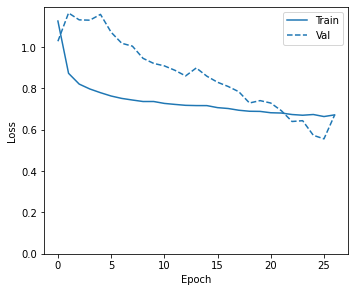

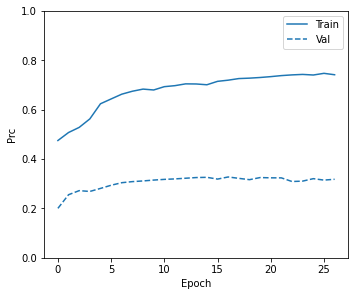

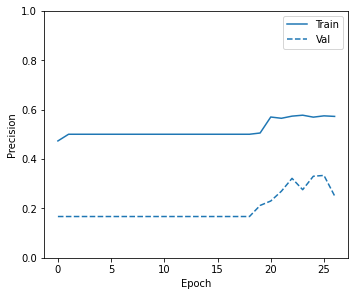

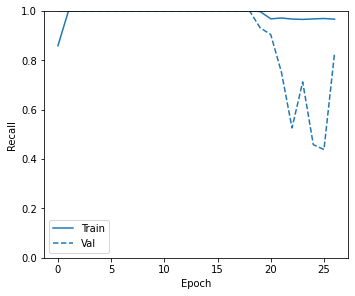

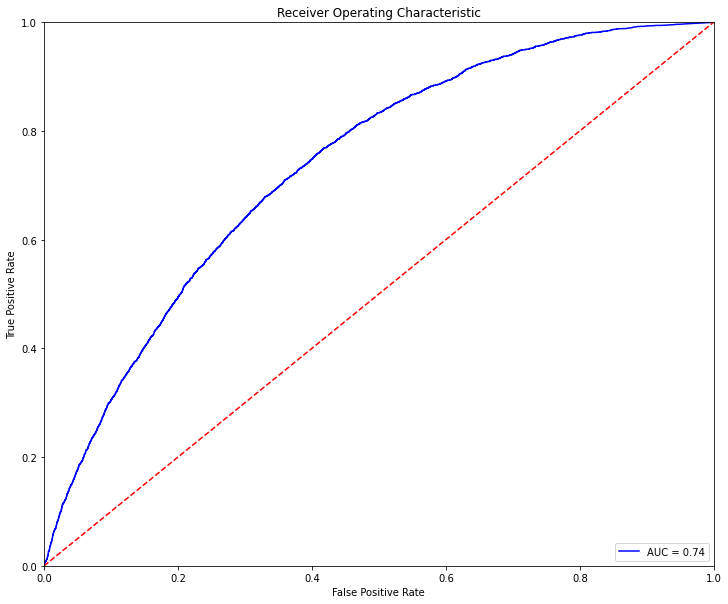

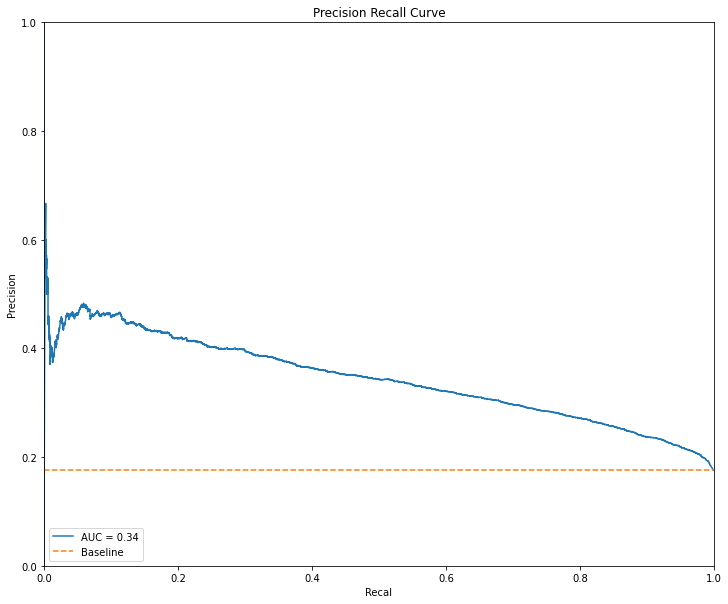

,threshold,tn,fp,fn,tp,f1,accuracy,precision,recall,auc
0,0.0,0,15979,0,3398,0.298397,0.175363,0.175363,1.000000,0.735786
1,0.1,0,15979,0,3398,0.298397,0.175363,0.175363,1.000000,0.735786
2,0.2,0,15979,0,3398,0.298397,0.175363,0.175363,1.000000,0.735786
3,0.3,0,15979,0,3398,0.298397,0.175363,0.175363,1.000000,0.735786
4,0.4,0,15979,0,3398,0.298397,0.175363,0.175363,1.000000,0.735786
5,0.5,0,15979,0,3398,0.298397,0.175363,0.175363,1.000000,0.735786
6,0.6,11766,4213,1392,2006,0.417178,0.710740,0.322560,0.590347,0.735786
7,0.7,15978,1,3397,1,0.000588,0.824637,0.500000,0.000294,0.735786
8,0.8,15979,0,3398,0,0.000000,0.824637,0.000000,0.000000,0.735786
9,0.9,15979,0,3398,0,0.000000,0.824637,0.000000,0.000000,0.735786


In [ ]:
hyperopt_history = model.fit(
    X_undersampled,
    y_undersampled,
    batch_size=2048,
    epochs=100,
    callbacks=[early_stopping],
    validation_data=(val_features, val_labels), 
    class_weight = class_weights)
    # The class weights go here) 
plot_metrics(hyperopt_history)
predictions = model.predict(test_features, batch_size=1024)
eval_train = evaluate_model(actual=test_labels, predicted=predictions, threshold=np.linspace(0,1,11))
display(eval_train)

<div class="images">
<strong> Se desarrolla una metodología de sugerencia de aquitectura combinando todos los factores - dropout, layers, neuronas etc!</strong> <br> 
</div>

In [ ]:
tuner.search_space_summary()

Search space summary
Default search space size: 19
units (Int)
{'default': None, 'conditions': [], 'min_value': 32, 'max_value': 512, 'step': 32, 'sampling': None}
layer_one (Boolean)
{'default': False, 'conditions': []}
layer_two (Boolean)
{'default': False, 'conditions': []}
layer_three (Boolean)
{'default': False, 'conditions': []}
layer_four (Boolean)
{'default': False, 'conditions': []}
layer_five (Boolean)
{'default': False, 'conditions': []}
layer_six (Boolean)
{'default': False, 'conditions': []}
layer_seven (Boolean)
{'default': False, 'conditions': []}
layer_eight (Boolean)
{'default': False, 'conditions': []}
layer_nine (Boolean)
{'default': False, 'conditions': []}
layer_ten (Boolean)
{'default': False, 'conditions': []}
layer_eleven (Boolean)
{'default': False, 'conditions': []}
layer_twelve (Boolean)
{'default': False, 'conditions': []}
layer_thirteen (Boolean)
{'default': False, 'conditions': []}
layer_fourteen (Boolean)
{'default': False, 'conditions': []}
layer_fifteen

Weight for class 0: 0.60
Weight for class 1: 2.93


In [ ]:
from keras.layers import Dense, Dropout, Activation, Flatten, Conv1D, Conv2D, MaxPooling1D, MaxPooling2D, Lambda, MaxPool2D, BatchNormalization
tuner = BayesianOptimization(
    build_model_classic_v1,
    objective=kt.Objective("val_precision", direction="max"),
    max_trials=30,
    seed=1,
    executions_per_trial=3,
    directory='/content/gdrive/My Drive/DeepLearning/Session1/Challenge/',
    project_name='hellomundo',
    overwrite=True)

weight_for_0 = (1 / neg) * (total / 2.0)
weight_for_1 = (1 / pos) * (total / 2.0)

class_weights = {0: weight_for_0, 1: weight_for_1}

print('Weight for class 0: {:.2f}'.format(weight_for_0))
print('Weight for class 1: {:.2f}'.format(weight_for_1))

tuner.search(train_features, train_labels,
             epochs=100,
             batch_size = 2048,
             validation_data=(val_features, val_labels), 
             callbacks=[early_stopping], 
             class_weight = class_weights)

Trial 12 Complete [00h 01m 04s]
val_precision: 0.27638424436251324

Best val_precision So Far: 0.3083563943703969
Total elapsed time: 00h 58m 41s

Search: Running Trial #13

Hyperparameter    |Value             |Best Value So Far 
units             |192               |96                
layer_one         |True              |True              
layer_two         |True              |True              
layer_three       |True              |True              
layer_four        |False             |False             
layer_five        |True              |True              
layer_six         |False             |False             
layer_seven       |True              |True              
layer_eight       |False             |False             
layer_nine        |True              |True              
layer_ten         |False             |False             
layer_eleven      |False             |False             
layer_twelve      |False             |False             
layer_thirteen    |True     

In [ ]:
hps = tuner.oracle.get_best_trials(num_trials=1)[0].hyperparameters
model = build_model_classic_v1(hps)
display(model.summary())
hyperopt_history = model.fit(
    X_undersampled,
    y_undersampled,
    batch_size=2048,
    epochs=100,
    callbacks=[early_stopping],
    validation_data=(val_features, val_labels), 
    class_weight = class_weights)
    # The class weights go here) 
plot_metrics(hyperopt_history)
predictions = model.predict(test_features, batch_size=1024)
eval_train = evaluate_model(actual=test_labels, predicted=predictions, threshold=np.linspace(0,1,11))
display(eval_train)

<div class="images">
<strong> Aplicación de la hiperoptimización bayesiana!</strong> <br> 
</div>

In [ ]:
from keras.layers import Dense, Dropout, Activation, Flatten, Conv1D, Conv2D, MaxPooling1D, MaxPooling2D, Lambda, MaxPool2D, BatchNormalization
tuner = BayesianOptimization(
    build_model_classic_v1,
    objective=kt.Objective("val_precision", direction="max"),
    max_trials=30,
    seed=1,
    alpha = 6,
    executions_per_trial=3,
    directory='/content/gdrive/My Drive/DeepLearning/Session1/Challenge/',
    project_name='hellomundo',
    overwrite=True)

weight_for_0 = (1 / neg) * (total / 2.0)
weight_for_1 = (1 / pos) * (total / 2.0)

class_weights = {0: weight_for_0, 1: weight_for_1}

print('Weight for class 0: {:.2f}'.format(weight_for_0))
print('Weight for class 1: {:.2f}'.format(weight_for_1))

tuner.search(train_features, train_labels,
             epochs=100,
             batch_size = 2048,
             validation_data=(val_features, val_labels), 
             callbacks=[early_stopping], 
             class_weight = class_weights)

In [ ]:
hps = tuner.oracle.get_best_trials(num_trials=1)[0].hyperparameters
model = build_model_classic_v1(hps)
display(model.summary())
hyperopt_history = model.fit(
    X_undersampled,
    y_undersampled,
    batch_size=2048,
    epochs=100,
    callbacks=[early_stopping],
    validation_data=(val_features, val_labels), 
    class_weight = class_weights)
    # The class weights go here) 
plot_metrics(hyperopt_history)
predictions = model.predict(test_features, batch_size=1024)
eval_train = evaluate_model(actual=test_labels, predicted=predictions, threshold=np.linspace(0,1,11))
display(eval_train)

<div class="alert">
<strong> No me dejaba subir mi  <br> 
</div>